<h1 style="text-decoration:underline;text-decoration:bold;text-align:center;"> 
    <b> Experimental Cross-Section Calculations and Fresco DWBA Analysis (Classical)</b> 
</h1>

<h2 style="text-align:center;"> 
    39K(3He,d)40Ca Transfer and 39K(3He,3He)39K Elastic Scattering
</h2>

## This notebook does the following:
#### 1. Imports experimental transfer and ES run data and data from BayeSpec fits
#### 2. Calculates experimental cross-sections given nuclear physics and run inputs
#### 3. Imports DWBA and ES Fresco (theoretical) cross-section calculations
#### 4. Calculates spectroscopic factors by comparing experimental to DWBA cross-sections, normalized by ratio of ES data to global ES Fresco model

***

## Prerequisites:
#### 1.  Run quantities tabulated in a spreadsheet (e.g. scalars, angles, targets, excited states)
#### 2.  Fit parameters tabulated in a spreadsheet for Front Position (P1_G-DEvsE or P1_G-DEvsP1) peaks and Si detector (SiTotE_G-SiDEvsSiE) peaks
#### 3.  Determine all possible lnj combinations for each DWBA transfer state using angular momentum and parity selection rules
#### 4.  Run Fresco for each lnj combination and optimize Fresco radius parameters

***

<h2 style="text-decoration:underline;"> 
    Imported Libraries
</h2>

In [1]:
import numpy as np
import pylab as py
import matplotlib.pyplot as plt
import pandas as pd
import math
from scipy import interpolate
from scipy import optimize as opt
import os
from fnmatch import fnmatch
from tabulate import tabulate # Extended library: pip install tabulate
import re
import decimal
from pdf2image import convert_from_path # convert pdf to png

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Inputs
</h1>

<h2 style="text-decoration:underline;"> 
    Inputs for BayeSpec Data
</h2>

In [2]:
f_transfer_data = '../Data/fitdata_Transfer.xlsx'
#f_transfer_data = '/home/wcfox/engedaq_TUNL/events/2019-08-26_39K-3He-d/fitdata_Transfer.xlsx'
#f_transfer_data = '/home/wcfox/engedaq_TUNL/events/2019-08-26_39K-3He-d/fitdata_Transfer_Before9400Group.xlsx'
#f_transfer_data = './fitdata_Transfer_8851keVContam.xlsx'
f_elastic_data = '../Data/fitdata_ES.xlsx'
#f_elastic_data = '/home/wcfox/engedaq_TUNL/events/2019-08-26_39K-3He-d/fitdata_ES.xlsx'

num_sort_groups = 16 # Number of groups of runs sorted together, i.e. each angle has at least 1 sort group and possibly more than 1 if there were energy shifts between runs
num_sort_groups_ES = 10

<h2 style="text-decoration:underline;"> 
    Inputs for Partial Width Data
</h2>

In [3]:
## Dimensionless single-particle reduced width squared and penetrability (and 2 * penetrability * hbar^2 / M r^2) calculations from Christian Iliadis codes
#f_partial_width = '/home/wcfox/Software/fresco-3.4/3He-Transfer/partial_width_data.xlsx'
#f_partial_width = '/home/wcfox/Software/fresco-3.4/3He-Transfer/partial_width_data_myEnergies_old.xlsx' # Before adding the 3 9400-9450 keV states
f_partial_width = '../Data/partial_width_data_myEnergies.xlsx'
#f_partial_width = '/home/wcfox/Software/fresco-3.4/3He-Transfer/partial_width_data_myEnergies.xlsx'

<h2 style="text-decoration:underline;"> 
    Inputs for Nuclear Physics
</h2>

In [4]:
transfer_reaction = '39K(3He, d)40Ca'
ES_reaction = '39K(3He, 3He)39K'

E_lab = 21 # projectile (beam) lab energy in MeV
u_E_lab = E_lab * 50 / (10**6) # uncertainty in projectile (beam) lab energy in MeV - 50 ppm of beam energy

Si_lab_angle = 45 # Si detector angle [deg]

x_prime = 0.0751 # Thickness per area of target [mg/cm^2]
BCI_scale = 10**(-10) # in Coulombs/pulse - from target current readout module in control room
zp = 2 # Unit charge of projectile
zt = 19 # Unit charge of target (isotope of interest in target molecule)
nu = 1 # Number of atoms of interest in target molecule (stoicheometry) - e.g. K in KI --> 1, Al in Al2O3 --> 2
At_molecule = 166.00277 # Atomic mass of target molecule [g/mole or u] - from www.webqc.org/molecular-weight-of-KI.html
u_At_molecule = 0.00013 # [g/mole or u]

## Atomic masses from 2020 AME Evaluation - Meng Wang et al 2021 Chinese Phys. C 45 030003
Ap_atomic =  3016029.32197 * 10**(-6) # Atomic mass of projectile [g/mole or u]
u_Ap_atomic = 0.00006 * 10**(-6) # Uncertainty of atomic mass of projectile [g/mole or u]
At_atomic =  38963706.487 * 10**(-6) # Atomic mass of isotope of interest in target [g/mole or u]
u_At_atomic = 0.005 * 10**(-6) # Uncertainty of atomic mass of isotope of interest in target [g/mole or u]
Ae_atomic = 2014101.77784 * 10**(-6) # Atomic mass of ejectile [g/mole or u]
u_Ae_atomic = 0.00002 * 10**(-6) # Uncertainty of atomic mass of ejectile [g/mole or u]
Ar_atomic = 39962590.851 * 10**(-6) # Atomic mass of recoil nucleus [g/mole or u]
u_Ar_atomic = 0.022 * 10**(-6) # Uncertainty of atomic mass of recoil nucleus [g/mole or u]
Aproton_atomic = 1007825.03190 * 10**(-6) # Atomic mass of transferred particle (proton here) [g/mole or u]
u_Aproton_atomic = 0.00001 * 10**(-6) # Uncertainty of atomic mass of transferred particle (proton here) [g/mole or u]

## Target contaminant masses for calibration purposes
A_carbon_atomic = 12000000.0 * 10**(-6)
u_A_carbon_atomic = 0.0 * 10**(-6)
A_oxygen_atomic = 15994914.6193 * 10**(-6) # Atomic mass of 16O [g/mole or u]
u_A_oxygen_atomic = 0.0003 * 10**(-6)
A_iodine_atomic = 126904473 * 10**(-6)
u_A_iodine_atomic = 4 * 10**(-6)

A_41K_atomic = 40961825.256 * 10**(-6) # Atomic mass of 41K [g/mole or u]
u_A_41K_atomic = 0.004 * 10**(-6) # Uncertainty of atomic mass of 41K [g/mole or u]

## Electron mass and unified atomic mass unit 'u' conversion to eV from 2020 AME Evaluation - W.J. Huang et al 2021 Chinese Phys. C 45 030002
Aelectron = 548579.909065 * 10**(-9) # [g/mole or u]
u_Aelectron = 0.000016 * 10**(-9) # [g/mole or u]
uam_eV = 931494.10242 * 10**(3) # [1 u = uam_eV eV]
u_uam_eV = 0.00028 * 10**(3)

## Meng Wang et al 2021 Chinese Phys. C 45 030003
# M_N = M_A - (Z * Aelectron) + B_e
def atomic_to_nuclear_mass_conversion(atomic_mass, Z):
    return atomic_mass - (Z * Aelectron) + (((14.4381 * Z**(2.39)) + (1.55468 * 10**(-6) * Z**(5.35))) / uam_eV)

## Nuclear Masses
Ap = atomic_to_nuclear_mass_conversion(Ap_atomic, zp)
At = atomic_to_nuclear_mass_conversion(At_atomic, zt)
Ae = atomic_to_nuclear_mass_conversion(Ae_atomic, zp - 1) # proton transfer - projectile loses proton
Ar = atomic_to_nuclear_mass_conversion(Ar_atomic, zt + 1) # proton transfer - target gains proton
Aproton = atomic_to_nuclear_mass_conversion(Aproton_atomic, 1)

A_carbon = atomic_to_nuclear_mass_conversion(A_carbon_atomic, 6)
A_oxygen = atomic_to_nuclear_mass_conversion(A_oxygen_atomic, 8)
A_iodine = atomic_to_nuclear_mass_conversion(A_iodine_atomic, 53)

A_41K = atomic_to_nuclear_mass_conversion(A_41K_atomic, 19)

## CM Energy (Total initial kinetic energy in the CM system. Projectile kinetic energy plus target kinetic energy in the CM system. Rutherford scattering uses this, not projectile CM kinetic energy)
E_cm = E_lab * At / (At + Ap)

## Q-value of transfer reaction
Q_val = (Ap + At - Ae - Ar) * uam_eV * 10**(-6) # Q-value of reaction in MeV

## Proton separation energy [keV] for 40Ca: Meng Wang et al 2021 Chinese Phys. C 45 030003
Sp = 8328.18
u_Sp = 0.02

## Spectroscopic factor for d+p --> 3He [Brida 2011, referenced in Caleb Marshall's Ph.D thesis]
s_factor_projectile = 1.32
u_s_factor_projectile = 0.01

# Zero-range DWBA fractional uncertainty factor (From Hale 2004 - adding this as a systematic uncertainty)
f_ZR = 0.15

# Optical model fractional C2S uncertainties (From Hale 2004 - adding these as systematic uncertainties)
f_3He = 0.26
f_d = 0.11

# Total systematic uncertainty of C2S [NOT USING THIS ANYMORE. USING A FLAT 30%.]
f_sys_C2S = np.sqrt((f_ZR)**2 + (f_3He)**2 + (f_d)**2) # About 32%

# n and j fractional uncertainty factor (Hale 2004)
f_nj = 0.05

# Bound state potential parameters Gamma_p uncertainty factor (Hale 2004)
f_bound = 0.05

# Total systematic uncertainty of Gamma_p [NOT USING THIS ANYUMORE. USING A FLAT 30%.]
f_sys_Gamma_p = np.sqrt(f_sys_C2S**2 + (f_nj)**2 + (f_bound)**2) # About 33%

# For 2023 39K(3He,d)40Ca PRL, using "traditional" 30% systematic uncertainty for C2S and Gamma_p
#f_sys_C2S = 0.32
#f_sys_Gamma_p = 0.33
f_sys_C2S = 0.30
f_sys_Gamma_p = 0.30

## Partial width calculations
r0 = 1.25 # [fm]
R_ch = r0 * (At**(1/3) + Aproton**(1/3)) # Channel (interaction) radius for 39K + p partial width calculations [fm]
m_reduced = At * Aproton / (At + Aproton) # reduced mass [g/mole or u]
hbar = 6.582119569 * 10**(-16) # Reduced Planck constant [eV * s]
light_speed = 299792458 # Speed of light [m/s]
wigner_limit = 10**(24) * hbar**2 * light_speed**2 / (uam_eV * m_reduced * R_ch**2) # hbar^2 / m R^2 [MeV]

# Round channel radius R_ch to nearest r in terms of Fresco hcm radial step parameter 
# to extract bound-state wavefunction at R_ch
def round_step_size(quantity, step_size):
    mod = quantity % step_size
    round_to_digit = int(math.ceil(-math.log(step_size, 10)))
    format_str = '{:.' + str(round_to_digit) + 'f}'
    if (mod >= step_size/2):
        rounded = quantity - mod + step_size # Round up
    else:
        rounded = quantity - mod # Round down
    return float(format_str.format(rounded))

## Printing basic nuclear physics info
print('Uncertainty in beam lab energy = ' + str(u_E_lab) + ' MeV')
print('Projectile Nuclear Mass = ' + str(Ap) + ' u')
print('Target Nuclear Mass = ' + str(At) + ' u')
print('Ejectile Nuclear Mass = ' + str(Ae) + ' u')
print('Recoil Nucleus Nuclear Mass = ' + str(Ar) + ' u')
print('Q-value of ' + transfer_reaction + ' = ' + '{:.7f}'.format(Q_val) + ' MeV')

print('Proton Nuclear Mass = ' + str(Aproton) + ' u')
print('O16 Nuclear Mass = ' + str(A_oxygen) + ' u')
print('C12 Nuclear Mass = ' + str(A_carbon) + ' u')
print('I127 Nuclear Mass = ' + str(A_iodine) + ' u')
print('41K Nuclear Mass = ' + str(A_41K) + ' u')

print('\nTotal C2S systematic uncertainty = ' + str(f_sys_C2S))
print('\nTotal Gamma_p systematic uncertainty = ' + str(f_sys_Gamma_p))

print('\nBound-State Reaction:')
print('Channel Radius: ' + str(R_ch) + ' fm')
print('Reduced mass: ' + str(m_reduced) + ' u')
print('Wigner Limit: ' + str(wigner_limit) + ' MeV')

Uncertainty in beam lab energy = 0.00105 MeV
Projectile Nuclear Mass = 3.0149322433959993 u
Target Nuclear Mass = 38.953301122441 u
Ejectile Nuclear Mass = 2.013553213430874 u
Recoil Nucleus Nuclear Mass = 39.951639211110404 u
Q-value of 39K(3He, d)40Ca = 2.8326189 MeV
Proton Nuclear Mass = 1.0072764674908736 u
O16 Nuclear Mass = 15.990528212247694 u
C12 Nuclear Mass = 11.996709642876269 u
I127 Nuclear Mass = 126.8756058750795 u
41K Nuclear Mass = 40.95141989144099 u

Total C2S systematic uncertainty = 0.3

Total Gamma_p systematic uncertainty = 0.3

Bound-State Reaction:
Channel Radius: 5.490346223329716 fm
Reduced mass: 0.9818862968989319 u
Wigner Limit: 1.4123169377893687 MeV


<h2 style="text-decoration:underline;"> 
    Kinematics Calculations for Energy Calibration
</h2>

In [5]:
# Do this eventually. Use C.5 of Nuclear Physics of Stars to get ejected particle energy for a given target (or contaminant in the target),
# and convert this to magnetic rigidity from Caleb's Focal Plane Detector Package paper. Brho = sqrt(2mE)/q

<h2 style="text-decoration:underline;"> 
    Inputs for Fresco
</h2>

In [6]:
# Root path containing all fresco files related to this experiment
# e.g. full path to a transfer (fort.202) file would be fresco_root/4491keV/Jpi5-/l3/n1/j7-2/fort.202
# all possible Jpi, l, n, j combinations for each excited state are stored in this kind of file tree
#fresco_root_T = '/home/wcfox/Software/fresco-3.4/3He-Transfer/Input_Global3He/'
fresco_root_T = '../Data/Input_Global3He/'
#fresco_root_ES = '/home/wcfox/Software/fresco-3.4/3He-ES/Input/'
fresco_root_ES = '../Data/Input_ES/'

<h2 style="text-decoration:underline;"> 
    Inputs for Literature Comparison
</h2>

In [7]:
# Root path containing all literature data and fresco files
# e.g. full path to a transfer (fort.202) file would be 'paper'_root/4491keV/l3/n1/j7-2/fort.202
#cage_root_T = '/home/wcfox/Software/fresco-3.4/3He-Transfer/Papers/Cage1971/'
#f_cage_data = 'Cage_3Hed_1971_dataset.csv'

# Extracted data from Vernotte paper
#vernotte_root_ES = '/home/wcfox/Software/fresco-3.4/3He-ES/Papers/Vernotte/'
#f_vernotte_data = 'Vernotte_Data.xls'

<h2 style="text-decoration:underline;"> 
    Plotting Parameters
</h2>

In [8]:
# Plotting Parameters
plt.rcParamsDefault["axes.edgecolor"] = "white"
deg = u'\N{DEGREE SIGN}'
colors = ['k', 'r', 'b', 'g', 'm', 'c', 'y'] + ['darkorange', 'silver', 'springgreen', 'sienna', 'lightcoral', 'deeppink', 'pink', 'navy', 'lightgreen']
for i in range(30):
    colors.append(None)
#shaded_colors = ['silver', 'rosybrown', 'lightblue']

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Importing Data
</h1>

<h2 style="text-decoration:underline;"> 
    Importing BayeSpec Fit Data
</h2>

In [9]:
data_T = pd.read_excel(f_transfer_data, engine = 'openpyxl') # .xlsx files
data_ES = pd.read_excel(f_elastic_data, engine = 'openpyxl') # .xlsx files

<h2 style="text-decoration:underline;"> 
    Importing Proton Partial Width Data
</h2>

In [10]:
data_partial_width = pd.read_excel(f_partial_width, engine = 'openpyxl') # .xlsx files

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Conversion from Lab to Center-of-Mass Coordinates
</h1>

### Energy, Angle, and Cross-Section Conversions:

\begin{equation}
E_{CM} = E_{Lab} \frac{A_{t}}{A_{t} + A_{p}},
\end{equation}

\begin{equation}
\cos{\theta_{Lab}} = \frac{\gamma + \cos{\theta_{CM}}}{\sqrt{1 + \gamma^{2} + 2 \gamma \cos{\theta_{CM}}}},
\end{equation}

\begin{equation}
\gamma = \sqrt{\frac{A_{p} A_{e} E_{lab}}{A_{r} (A_{e} + A_{r}) Q + A_{r} (A_{r} + A_{e} - A_{p}) E_{lab}}}
\end{equation}

\begin{equation}
\frac{d \sigma}{d \Omega}_{CM} = \frac{d \sigma}{d \Omega}_{Lab} \frac{1 + \gamma \cos{\theta_{CM}}}{(1 + \gamma^{2} + 2 \gamma \cos{\theta_{CM}})^{3/2}}
\end{equation}

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Class 1/4: Experimentally Measured Transfer Peaks
</h1>

In [11]:
class Peak_Transfer_Exp:
    
    ### Static lists (common to all Peak_Transfer_Exp objects)
    
    ## Class objects (One for each transfer peak)
    objects = []
    
    ## Transfer quantities for each sort group
    angle_lab = []
    BCI = []
    clock = []
    clocklive = []
    omega = []
    omega_u = []
    eff = []
    target = []
    runs = []
    
    ## Calculated quantities for each sort group
    livetime = []
    # Conversion from Lab to CM coordinates
    g_factor = 0
    Si_g_factor = 0
    angle_cm = []
    Si_angle_lab = Si_lab_angle
    Si_angle_cm = 0
    crosssection_labtocm_factor = []
    Si_crosssection_labtocm_factor = 0
    # Convenient lists
    sort_groups_per_angle = []
    angle_indices = []
    angle_lab_reduced = []
    angle_cm_reduced = []
    target_reduced = []
    # Organization by target
    angle_cm_by_target = []
    Si_crosssection_by_target = []
    Si_crosssection_by_target_u = []
    
    ## Si detector quantities for each sort group
    Si_omega = []
    Si_omega_u = []
    Si_eff = []
    
    ## SiTotE_G-SiDEvsSiE 39K Peak Fits for each sort group
    Si_area = []
    Si_area_u = []
    Si_sig = []
    Si_sig_u = []
    Si_cent = []
    Si_cent_u = []
    # If exponentially-modified Gaussian (EMG) fit was used... (self.cent and self.sig are the centroid and sd of the Gaussian component in this case, respectively)
    Si_lamb = [] # lambda exponential-component rate
    Si_lamb_u = []
    Si_mode = [] # true centroid (at peak height) for EMG fits
    Si_mode_u = []
    
    ## Si detector cross sections for each sort group
    Si_crosssection = [] # CM system in mb/sr
    Si_crosssection_u = []
    
    ## Si detector uncertainty-weighted average cross sections for each angle
    Si_crosssection_wavg = [] # CM system in mb/sr
    Si_crosssection_wavg_u = []
    
    # Average of all state's variations away from their Avg FP-to-Si cross section over all angles
    # Use this in cases where there is only 1 sort group at an angle, including for ES if there is only 1 run per angle
    avg_crosssection_ratio_fraction = 0
    # Average of all state's variations away from their Avg FP-to-Si cross section at the given angle. 
    # The elements repeat for each sort group of a given angle.
    avg_crosssection_ratio_fraction_per_angle = []
    
    def __init__(self, ex_energy, nndc_ex_energy, nndc_ex_energy_u):
        self.__class__.objects.append(self)
        self.ex_energy = ex_energy # in keV (Nominal excitation energy, i.e, what I call it)
        self.nndc_ex_energy = nndc_ex_energy # in MeV
        self.nndc_ex_energy_u = nndc_ex_energy_u # in MeV
        
        ## Fit parameter data. Each element is a different sort group
        self.area = []
        self.area_u = []
        self.sig = []
        self.sig_u = []
        self.cent = []
        self.cent_u = []
        # If exponentially modified Gaussian (EMG) fit was used... (self.cent and self.sig are the centroid and sd of the Gaussian component in this case, respectively)
        self.lamb = [] # lambda exponential-component rate
        self.lamb_u = []
        self.mode = [] # true centroid (at peak height) for EMG fits
        self.mode_u = []
        self.no_fit = [] # could not obtain a fit for this sort group at this state for one reason or another
        self.bad_fit = [] # could obtain a fit, but is not to be fully trusted
        
        self.experiment = [] # Year of experiment to differentiate between more than 1
        self.reaction = [] # Transfer Reaction
        
        ## Centroid scatter
        self.centroid_u_with_scatter = []
        
        # Handling missing or no fits
        self.no_fit_indices = []
        self.fit_indices = []
        self.fit_angle_indices = [] # Indices for the start of each new angle in the list of sort groups when no_fits have been removed
        self.fit_groups_per_angle = [] # number of sort groups that contain fits for each angle
        self.fit_angle_lab = [] # lab angles for each sort group when no_fits have been removed
        self.fit_angle_cm = []
        self.fit_angle_lab_reduced = []
        self.fit_angle_cm_reduced = []
        self.num_fit_groups = 0
        self.fit_Si_crosssection = [] # The Si cross sections where the elements at the same indices as FP no_fits have been removed
        self.fit_Si_crosssection_u = []
        
        self.is_emg = []
        self.is_emg_all = []
        
        # FP detector cross sections for each peak and sort group
        self.crosssection = [] # CM system in mb/sr
        self.crosssection_u = []
        
        # Ratio (for each sort group) to the avg FP-to-Si cross section ratio for each angle
        self.variation_from_crosssection_ratio_avg = []
        # Fraction for fractional uncertainty to use as additional scatter uncertainty | Fraction away from Avg FP-to-Si cross section ratio
        self.crosssection_ratio_fraction = []
        
        # Same as the class member with the same name (except "fit_"), but each no_fit element is removed 
        self.fit_avg_crosssection_ratio_fraction_per_angle = []
        
        # FP detector to Si detector cross section ratio for each peak and sort group
        self.crosssection_ratio = []
        self.crosssection_ratio_u = []
        self.crosssection_ratio_u_with_scatter = []
        
        # FP detector uncertainty-weighted average cross sections for each peak at each angle
        self.crosssection_ratio_wavg = []
        self.crosssection_ratio_wavg_u = []
        
        self.oxidation_fraction = []
        
    def extract_data(self):
        row = 0
        for i in data_T.index:
            #if str(data_T['Ex'][i]) == str(self.ex_energy):
            if str(self.ex_energy) in str(data_T['Ex'][i]):
                row = i
                break
        for i in range(row, row + num_sort_groups):
            self.area.append(data_T['Area'][i])
            self.area_u.append(data_T['Areasd'][i])
            self.sig.append(data_T['Sig'][i])
            self.sig_u.append(data_T['Sigsd'][i])
            self.cent.append(data_T['Cent'][i])
            self.cent_u.append(data_T['Centsd'][i])
            # If exponentially modified Gaussian (EMG) fit was used...
            self.lamb.append(data_T['EMG_Lamb'][i])
            self.lamb_u.append(data_T['EMG_Lambsd'][i])
            self.mode.append(data_T['EMG_Mode'][i])
            self.mode_u.append(data_T['EMG_Modesd'][i])
            
            no_fit = data_T['No_Fit'][i]
            if (no_fit == 'y'):
                self.no_fit.append(True)
            else:
                self.no_fit.append(False)
                
            bad_fit = data_T['Bad_Fit'][i]
            if (bad_fit == 'y'):
                self.bad_fit.append(True)
            else:
                self.bad_fit.append(False)
        
            self.experiment.append(int(data_T['Experiment'][i]))
            self.reaction.append(data_T['Reaction'][i])
        
            if (math.isnan(data_T['EMG_Lamb'][i]) == False):
                self.is_emg_all.append(True)
            else:
                self.is_emg_all.append(False)
        
    def handle_fits(self, cls):
        for i in range(len(self.no_fit)):
            if self.no_fit[i] == True:
                self.no_fit_indices.append(i)
            else:
                self.fit_indices.append(i)
                self.fit_angle_lab.append(cls.angle_lab[i])
                self.fit_angle_cm.append(cls.angle_cm[i])
                self.fit_Si_crosssection.append(cls.Si_crosssection[i])
                self.fit_Si_crosssection_u.append(cls.Si_crosssection_u[i])
                if (math.isnan(self.lamb[i]) == False):
                    self.is_emg.append(True)
                else:
                    self.is_emg.append(False)

        self.fit_angle_lab_reduced = list(dict.fromkeys(self.fit_angle_lab))
        self.fit_angle_cm_reduced = list(dict.fromkeys(self.fit_angle_cm))

        self.num_fit_groups = len(self.fit_angle_lab)
        self.fit_groups_per_angle = list({i:self.fit_angle_lab.count(i) for i in self.fit_angle_lab}.values())

        # Indices for the start of each new angle in the list of sort groups when no_fits have been removed
        self.fit_angle_indices.append(0)
        for i in range(len(self.fit_groups_per_angle)):
            self.fit_angle_indices.append(sum(self.fit_groups_per_angle[0:i+1]))           
            
    def calc_crosssection(self, cls):
        for i in range(num_sort_groups):
            if (self.no_fit[i] == False):
                crosssection_lab = self.area[i] * zp * At_molecule / (cls.eff[i] * cls.livetime[i] * cls.omega[i] * cls.BCI[i] * BCI_scale * nu * x_prime * 3750000000) # mb/sr in lab system
                self.crosssection.append(crosssection_lab * cls.crosssection_labtocm_factor[i])
                self.crosssection_u.append(crosssection_lab * cls.crosssection_labtocm_factor[i] * np.sqrt((self.area_u[i]/self.area[i])**2 + (cls.omega_u[i]/cls.omega[i])**2))  
        
    def calc_crosssection_ratio(self): #, cls):
        for i in range(self.num_fit_groups):
            self.crosssection_ratio.append(self.crosssection[i]/self.fit_Si_crosssection[i])
            
    # Find ratio to the avg FP-to-Si cross section ratio for each angle. Use maximum calculated ratio in cases where there is only 1 sort group per angle.
    def calc_variation_from_crosssection_ratio_avg(self): #, cls):
        for i in range(len(self.fit_groups_per_angle)):
            variation = [k/np.mean(self.crosssection_ratio[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]]) for k in self.crosssection_ratio[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]]]
            for j in variation:
                self.variation_from_crosssection_ratio_avg.append(j)
                self.crosssection_ratio_fraction.append(np.abs(j - 1))
        
        #for i in range(len(cls.sort_groups_per_angle)):
        #    variation = [k/np.mean(self.crosssection_ratio[cls.angle_indices[i]:cls.angle_indices[i+1]]) for k in self.crosssection_ratio[cls.angle_indices[i]:cls.angle_indices[i+1]]]              
        #    for j in variation:
        #        self.variation_from_crosssection_ratio_avg.append(j)
        #        self.crosssection_ratio_fraction.append(np.abs(j - 1))
                
        #self.avg_crosssection_ratio_fraction = np.mean(self.crosssection_ratio_fraction)                    
          
    def calc_fit_avg_crosssection_ratio_fraction(self, cls):
        for i in range(num_sort_groups):
            if (self.no_fit[i] == False):
                self.fit_avg_crosssection_ratio_fraction_per_angle.append(cls.avg_crosssection_ratio_fraction_per_angle[i])
            
    def calc_crosssection_ratio_u(self, cls):
        oxidation_scatter = 0.2
        for i in range(self.num_fit_groups):
            self.crosssection_ratio_u.append(self.crosssection_ratio[i] * np.sqrt((self.crosssection_u[i]/self.crosssection[i])**2 + (self.fit_Si_crosssection_u[i]/self.fit_Si_crosssection[i])**2))
           
            # Add a fractional scatter uncertainty based on the average variation in the cross section at the given angle
            if (self.crosssection_ratio_fraction[i] != 0): # This sort group is not alone at the given angle
                self.crosssection_ratio_u_with_scatter.append(np.sqrt((self.crosssection_ratio_u[i])**2 + (self.fit_avg_crosssection_ratio_fraction_per_angle[i] * self.crosssection_ratio[i])**2))
                # Add an additional fractional uncertainty if the run had an oxidized target
                if self.is_emg[i]:
                    self.crosssection_ratio_u_with_scatter[i] = np.sqrt((self.crosssection_ratio_u[i])**2 + ((self.fit_avg_crosssection_ratio_fraction_per_angle[i]**2 + oxidation_scatter**2) * (self.crosssection_ratio[i])**2))
            else: # This is the only sort group at the given angle
                self.crosssection_ratio_u_with_scatter.append(np.sqrt((self.crosssection_ratio_u[i])**2 + (cls.avg_crosssection_ratio_fraction * self.crosssection_ratio[i])**2))        
                # Add an additional fractional uncertainty if the run had an oxidized target
                if self.is_emg[i]:
                    self.crosssection_ratio_u_with_scatter[i] = np.sqrt((self.crosssection_ratio_u[i])**2 + ((cls.avg_crosssection_ratio_fraction**2 + oxidation_scatter**2) * (self.crosssection_ratio[i])**2))
        #for i in range(num_sort_groups):
        #    self.crosssection_ratio_u.append(self.crosssection_ratio[i] * np.sqrt((self.crosssection_u[i]/self.crosssection[i])**2 + (cls.Si_crosssection_u[i]/cls.Si_crosssection[i])**2))
        #    
        #    if (self.variation_from_crosssection_ratio_avg[i] != 1.0):
        #        self.crosssection_ratio_u_with_scatter.append(np.sqrt((self.crosssection_ratio_u[i])**2 + (self.crosssection_ratio_fraction[i] * self.crosssection_ratio[i])**2))
        #    else:
        #        self.crosssection_ratio_u_with_scatter.append(np.sqrt((self.crosssection_ratio_u[i])**2 + (self.avg_crosssection_ratio_fraction * self.crosssection_ratio[i])**2))
                
    def calc_crosssection_ratio_wavg(self): #, cls):
        
        ### FINAL: USING 1/u^2 as weight (and dealing with no fits)
        crosssection_ratio_over_unc_2 = []
        for i in range(self.num_fit_groups):
            crosssection_ratio_over_unc_2.append(self.crosssection_ratio[i] / (self.crosssection_ratio_u_with_scatter[i])**2)
            
        one_over_unc_2 = []
        for i in range(self.num_fit_groups):
            one_over_unc_2.append(1 / (self.crosssection_ratio_u_with_scatter[i])**2)
            
        for i in range(len(self.fit_groups_per_angle)):
            self.crosssection_ratio_wavg.append(sum(crosssection_ratio_over_unc_2[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]])/sum(one_over_unc_2[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]]))
        
        for i in range(len(self.fit_groups_per_angle)):
            self.crosssection_ratio_wavg_u.append(np.sqrt(1/sum(one_over_unc_2[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]])))
        
        ### DEALING WITH NO FITS, BUT USING u AS WEIGHT, NOT 1/u^2
        #crosssection_ratio_times_unc = []
        #for i in range(self.num_fit_groups):
        #    crosssection_ratio_times_unc.append(self.crosssection_ratio[i] * self.crosssection_ratio_u_with_scatter[i])
        #    
        #for i in range(len(self.fit_groups_per_angle)):
        #    self.crosssection_ratio_wavg.append(sum(crosssection_ratio_times_unc[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]])/sum(self.crosssection_ratio_u_with_scatter[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]]))
        # 
        # crosssection_ratio_u_with_scatter_powerfour = []
        #for i in range(self.num_fit_groups):
        #    crosssection_ratio_u_with_scatter_powerfour.append(self.crosssection_ratio_u_with_scatter[i]**4)
        #    
        #for i in range(len(self.fit_groups_per_angle)):
        #    #if (self.fit_groups_per_angle[i] != 1):
        #    self.crosssection_ratio_wavg_u.append(np.sqrt(sum(crosssection_ratio_u_with_scatter_powerfour[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]])/(sum(self.crosssection_ratio_u_with_scatter[self.fit_angle_indices[i]:self.fit_angle_indices[i+1]]))**2))
        #    #else:
        #    #    self.crosssection_ratio_wavg_u.append(self.crosssection_ratio_u_with_scatter[i:i+1][0])            
        
        ### BEFORE DEALING WITH NO FITS
        #crosssection_ratio_times_unc = []
        #for i in range(num_sort_groups):
        #    crosssection_ratio_times_unc.append(self.crosssection_ratio[i] * self.crosssection_ratio_u_with_scatter[i])
        #
        #for i in range(len(cls.sort_groups_per_angle)):
        #    self.crosssection_ratio_wavg.append(sum(crosssection_ratio_times_unc[cls.angle_indices[i]:cls.angle_indices[i+1]])/sum(self.crosssection_ratio_u_with_scatter[cls.angle_indices[i]:cls.angle_indices[i+1]]))
        #
        #crosssection_ratio_u_with_scatter_powerfour = []
        #for i in range(num_sort_groups):
        #    crosssection_ratio_u_with_scatter_powerfour.append(self.crosssection_ratio_u_with_scatter[i]**4)
        #        
        #for i in range(len(cls.sort_groups_per_angle)):
        #    #if (cls.sort_groups_per_angle[i] != 1):
        #    self.crosssection_ratio_wavg_u.append(np.sqrt(sum(crosssection_ratio_u_with_scatter_powerfour[cls.angle_indices[i]:cls.angle_indices[i+1]])/(sum(self.crosssection_ratio_u_with_scatter[cls.angle_indices[i]:cls.angle_indices[i+1]]))**2))
        #    #else:
        #    #    self.crosssection_ratio_wavg_u.append(self.crosssection_ratio_u_with_scatter[i:i+1][0])
     
    # For the sort groups that have oxidation present (and therefore a modified Gaussian must be used as the fit), the yields are consistently smaller than with no oxidation present.
    # Find the fractional variation between each sort group with oxidation present and a sort group at the same angle with no oxidation present.
    # sort_groups_to_compare is a list of lists, where each nested list is a list of a sort group with oxidation and its comparison sort group with no oxidation at the same angle
    # e.g. [[0, 2], [1, 2], [3, 4]] --> sort groups 0, 1, and 2 are at the same angle - 0 and 1 have oxidation and 2 does not
    # sort groups 3 and 4 are the same angle, 3 has oxidation and 4 does not
    def calc_oxidation_fraction(self, sort_groups_to_compare):
        for i in range(self.num_fit_groups):
            for j in sort_groups_to_compare:
                if i == j[0]:
                    self.oxidation_fraction.append(self.crosssection_ratio[i]/self.crosssection_ratio[j[1]])
        
        #for i in range(num_sort_groups):
        #    for j in sort_groups_to_compare:
        #        if i == j[0]:
        #            self.oxidation_fraction.append(self.crosssection_ratio[i]/self.crosssection_ratio[j[1]])
  
    # Adding a constant scatter uncertainty in quadrature to the channel uncertainty (Want about +- 1 keV, and since 1.66 keV is about 1 channel, u_s = 1 keV * (1 ch / 1.66 keV) ~ 0.60241 ch)
    # If the fit was an EMG, add another smaller constant scatter uncertainty in quadrature (something like 1/2 of the standard scatter)
    def add_centroid_scatter(self):
        E_u = 1 # additional scatter uncertainty in keV
        E_per_ch = 1.66 # energy per channel in keV (roughly)
        u_s = E_u / E_per_ch # additional scatter uncertainty in channels
        
        for i in range(num_sort_groups):
            if (self.is_emg_all[i]): # If the fit was an exponentially-modified gaussian (EMG) and we need to use the mode, not cent. Add another half of the scatter uncertainty in quadrature since these fits are more questionable
                 self.centroid_u_with_scatter.append(np.sqrt((self.mode_u[i])**2 + (u_s)**2 + (u_s/2)**2))
            else: # If the fit was purely gaussian, we need to use cent
                self.centroid_u_with_scatter.append(np.sqrt((self.cent_u[i])**2 + (u_s)**2))
        
        #for i in range(self.num_fit_groups):
        #    if (self.is_emg[i]): # If the fit was an exponentially-modified gaussian (EMG) and we need to use the mode, not cent. Add another half of the scatter uncertainty in quadrature since these fits are more questionable
        #        self.centroid_u_with_scatter.append(np.sqrt((self.mode_u[i])**2 + (u_s)**2 + (u_s/2)**2))
        #    else: # If the fit was purely gaussian, we need to use cent
        #        self.centroid_u_with_scatter.append(np.sqrt((self.cent_u[i])**2 + (u_s)**2))

    @classmethod
    def calc_Si_crosssection(cls):
        for i in range(num_sort_groups):
            Si_crosssection_lab = cls.Si_area[i] * zp * At_molecule / (cls.Si_eff[i] * cls.livetime[i] * cls.Si_omega[i] * cls.BCI[i] * BCI_scale * nu * x_prime * 3750000000) # mb/sr in lab system
            cls.Si_crosssection.append(Si_crosssection_lab * cls.Si_crosssection_labtocm_factor)
            cls.Si_crosssection_u.append(Si_crosssection_lab * cls.Si_crosssection_labtocm_factor * np.sqrt((cls.Si_area_u[i]/cls.Si_area[i])**2 + (cls.Si_omega_u[i]/cls.Si_omega[i])**2))
        
    @classmethod
    def calc_avg_crosssection_ratio_fraction(cls):
        all_fractions = []
        for obj in cls.objects:
            for i in obj.crosssection_ratio_fraction:
                if i != 0:
                    all_fractions.append(i)
        cls.avg_crosssection_ratio_fraction = np.mean(all_fractions)
    
        modified_sort_groups_per_angle = [0]
        for i in cls.sort_groups_per_angle:
            modified_sort_groups_per_angle.append(i)
    
        avg_fractions_per_angle = []
        for i in range(len(cls.sort_groups_per_angle)):
            fractions_per_angle = []
            for obj in cls.objects:
                if (obj.num_fit_groups == num_sort_groups):
                    fractions_per_angle_per_state = obj.crosssection_ratio_fraction[sum(modified_sort_groups_per_angle[0:i+1]):sum(modified_sort_groups_per_angle[0:i+2])]
                    for j in fractions_per_angle_per_state:
                        fractions_per_angle.append(j)
            avg_fractions_per_angle.append(np.mean(fractions_per_angle))
        
        for i in range(len(cls.sort_groups_per_angle)):
            for j in range(cls.sort_groups_per_angle[i]):
                cls.avg_crosssection_ratio_fraction_per_angle.append(avg_fractions_per_angle[i])
        
    # Class method to extract data for each sort group
    @classmethod
    def extract_sortgroup_data(cls):
        for i in range(num_sort_groups):
            cls.angle_lab.append(int(data_T['Angle'][i]))
            cls.BCI.append(int(data_T['BCI'][i]))
            cls.clock.append(int(data_T['Clock'][i]))
            cls.clocklive.append(int(data_T['Clocklive'][i]))
            cls.omega.append(data_T['Transfer_Omega'][i])
            cls.omega_u.append(data_T['Transfer_Omegasd'][i])
            cls.eff.append(data_T['Transfer_Efficiency'][i])
            cls.target.append(data_T['Target'][i])
            cls.runs.append(str(data_T['Runs'][i]))
            
            cls.Si_omega.append(data_T['Si_Omega'][i])
            cls.Si_omega_u.append(data_T['Si_Omegasd'][i])
            cls.Si_eff.append(data_T['Si_Efficiency'][i])
            
            cls.Si_area.append(data_T['Si_Area'][i])
            cls.Si_area_u.append(data_T['Si_Areasd'][i])
            cls.Si_sig.append(data_T['Si_Sig'][i])
            cls.Si_sig_u.append(data_T['Si_Sigsd'][i])
            cls.Si_cent.append(data_T['Si_Cent'][i])
            cls.Si_cent_u.append(data_T['Si_Centsd'][i])

            cls.Si_lamb.append(data_T['Si_EMG_Lamb'][i])
            cls.Si_lamb_u.append(data_T['Si_EMG_Lambsd'][i])
            cls.Si_mode.append(data_T['Si_EMG_Mode'][i])
            cls.Si_mode_u.append(data_T['Si_EMG_Modesd'][i])
            
    @classmethod
    def calc_sortgroup_quantities(cls):
        # livetime
        for i in range(num_sort_groups):
            cls.livetime.append(cls.clocklive[i]/cls.clock[i])
            
        # g-factor for lab to CM conversions
        cls.g_factor = np.sqrt(Ap * Ae * E_lab / ((Ar * Q_val * (Ar + Ae)) + (Ar * E_lab * (Ar + Ae - Ap))))
        cls.Si_g_factor = Ap / At
        
        # CM angle (using positive solution of quadratic Eq. from Nuclear Physics of Stars pg. 585 Eq. C.38)
        for i in cls.angle_lab:
            cls.angle_cm.append(np.arccos((cls.g_factor * (np.cos(i * np.pi / 180)**2 - 1)) + (np.cos(i * np.pi / 180) * np.sqrt(1 + (cls.g_factor**2 * (np.cos(i * np.pi / 180)**2 - 1))))) * 180 / np.pi)

        cls.Si_angle_cm = np.arccos((cls.Si_g_factor * (np.cos(cls.Si_angle_lab * np.pi / 180)**2 - 1)) + (np.cos(cls.Si_angle_lab * np.pi / 180) * np.sqrt(1 + (cls.Si_g_factor**2 * (np.cos(cls.Si_angle_lab * np.pi / 180)**2 - 1))))) * 180 / np.pi  
            
        # Conversion factor for lab cross-section to CM system (Eq. C.43, C.44 pg 586 Nuclear Physics of Stars)
        for i in cls.angle_cm:
            cls.crosssection_labtocm_factor.append((1 + (cls.g_factor * np.cos(i * np.pi / 180))) / (1 + cls.g_factor**2 + (2 * cls.g_factor * np.cos(i * np.pi / 180)))**(3/2))
            
        cls.Si_crosssection_labtocm_factor = (1 + (cls.Si_g_factor * np.cos(cls.Si_angle_cm * np.pi / 180))) / (1 + cls.Si_g_factor**2 + (2 * cls.Si_g_factor * np.cos(cls.Si_angle_cm * np.pi / 180)))**(3/2)
            
        # Number of sort groups per angle
        cls.sort_groups_per_angle = list({i:cls.angle_lab.count(i) for i in cls.angle_lab}.values())
        
        # Indicies for the start of each new angle in the list of sort groups
        cls.angle_indices.append(0)
        for i in range(len(cls.sort_groups_per_angle)):
            cls.angle_indices.append(sum(cls.sort_groups_per_angle[0:i+1]))
        
        # Removing duplicates
        cls.angle_lab_reduced = list(dict.fromkeys(cls.angle_lab))
        cls.angle_cm_reduced = list(dict.fromkeys(cls.angle_cm))
        cls.target_reduced = list(dict.fromkeys(cls.target))

        # Initializing lists for target visualization
        for i in range(len(cls.target_reduced)):
            cls.angle_cm_by_target.append([])
            cls.Si_crosssection_by_target.append([])
            cls.Si_crosssection_by_target_u.append([])
    
    # Organizing Si cross sections by target for visualization of target stabilities
    @classmethod
    def organize_by_target(cls):
        for i in range(len(cls.target)):
            for j in range(len(cls.target_reduced)):
                if cls.target[i] == cls.target_reduced[j]:
                    cls.angle_cm_by_target[j].append(cls.angle_cm[i])
                    cls.Si_crosssection_by_target[j].append(cls.Si_crosssection[i])
                    cls.Si_crosssection_by_target_u[j].append(cls.Si_crosssection_u[i])

    ## Create .dat files with centroid data to use for MCMC energy calibrations
    ## create_cal_files(angle [deg], sort_group [1 to num_sort_groups], calibration_levels [nominal ex_energy value], test_levels [nominal ex_energy value])
    ## e.g. create_cal_files(5, 3, [], [])
    @classmethod
    def create_cal_files(cls, angle, sort_group, cal_levels, test_levels):  
        cal_nndc_energy = []
        cal_nndc_energy_u = []
        cal_centroid = []
        cal_centroid_u = []
        for i in range(len(cal_levels)):
            for obj in cls.objects:
                if obj.ex_energy == cal_levels[i]:
                    cal_nndc_energy.append(obj.nndc_ex_energy)
                    cal_nndc_energy_u.append(obj.nndc_ex_energy_u)
                    if (math.isnan(obj.mode[sort_group - 1])): # If "mode" does not exist, then the fit was purely gaussian and we need to use cent
                        cal_centroid.append(obj.cent[sort_group - 1])
                    else: # If mode does exist, the fit was an exponentially-modified gaussian (EMG) and we need to use the mode, not cent
                        cal_centroid.append(obj.mode[sort_group - 1])
                    cal_centroid_u.append(obj.centroid_u_with_scatter[sort_group - 1])
                    break
             
        test_nndc_energy = []
        test_nndc_energy_u = []
        test_centroid = []
        test_centroid_u = []
        for i in range(len(test_levels)):
            for obj in cls.objects:
                if obj.ex_energy == test_levels[i]:
                    test_nndc_energy.append(obj.nndc_ex_energy)
                    test_nndc_energy_u.append(obj.nndc_ex_energy_u)
                    if (math.isnan(obj.mode[sort_group - 1])): # If "mode" does not exist, then the fit was purely gaussian and we need to use cent
                        test_centroid.append(obj.cent[sort_group - 1])
                    else: # If mode does exist, the fit was an exponentially-modified gaussian (EMG) and we need to use the mode, not cent
                        test_centroid.append(obj.mode[sort_group - 1])
                    test_centroid_u.append(obj.centroid_u_with_scatter[sort_group - 1])
                    break                
        
        #print('Cal:')
        #print(cal_nndc_energy)
        #print(cal_nndc_energy_u)
        #print(cal_centroid)
        #print(cal_centroid_u)
        #print('Test:')
        #print(test_nndc_energy)
        #print(test_nndc_energy_u)
        #print(test_centroid)
        #print(test_centroid_u)
        fcal = open('CalLines-40Ca-' + str(angle) + 'deg_SortGroup' + str(sort_group) + '.dat', 'w')
        ftest = open('TestLines-40Ca-' + str(angle) + 'deg_SortGroup' + str(sort_group) + '.dat', 'w')
        fcal.write('## Ex\tdEx\t\tChn\t\tdChn\n')
        ftest.write('## Ex\tdEx\t\tChn\t\tdChn\n')
        
        for i in range(len(cal_levels)):
            if i != len(cal_levels) - 1:
                fcal.write(str(cal_nndc_energy[i]) + '\t' + str(np.format_float_positional(cal_nndc_energy_u[i], trim = '-')) + '\t' + '{:.2f}'.format(cal_centroid[i]) + '\t' + '{:.7f}'.format(cal_centroid_u[i]) + '\n')
            else:
                fcal.write(str(cal_nndc_energy[i]) + '\t' + str(np.format_float_positional(cal_nndc_energy_u[i], trim = '-')) + '\t' + '{:.2f}'.format(cal_centroid[i]) + '\t' + '{:.7f}'.format(cal_centroid_u[i]))

        for i in range(len(test_levels)):
            if i != len(test_levels) - 1:
                ftest.write(str(test_nndc_energy[i]) + '\t' + str(np.format_float_positional(test_nndc_energy_u[i], trim = '-')) + '\t' + '{:.2f}'.format(test_centroid[i]) + '\t' + '{:.7f}'.format(test_centroid_u[i]) + '\n')
            else:
                ftest.write(str(test_nndc_energy[i]) + '\t' + str(np.format_float_positional(test_nndc_energy_u[i], trim = '-')) + '\t' + '{:.2f}'.format(test_centroid[i]) + '\t' + '{:.7f}'.format(test_centroid_u[i]))
        
        fcal.close()
        ftest.close()
    
    @classmethod
    def extract_data_all(cls):
        for obj in cls.objects:
            obj.extract_data()
            
    @classmethod
    def handle_fits_all(cls):
        for obj in cls.objects:
            obj.handle_fits(cls)
            
    @classmethod
    def calc_crosssection_all(cls):
        for obj in cls.objects:
            obj.calc_crosssection(cls)
            
    @classmethod
    def calc_crosssection_ratio_all(cls):
        for obj in cls.objects:
            obj.calc_crosssection_ratio() #cls)
            
    @classmethod
    def calc_variation_from_crosssection_ratio_avg_all(cls):
        for obj in cls.objects:
            obj.calc_variation_from_crosssection_ratio_avg() #cls)        
            
    @classmethod
    def calc_fit_avg_crosssection_ratio_fraction_all(cls):
        for obj in cls.objects:
            obj.calc_fit_avg_crosssection_ratio_fraction(cls)
            
    @classmethod
    def calc_crosssection_ratio_u_all(cls):
        for obj in cls.objects:
            obj.calc_crosssection_ratio_u(cls)
            
    @classmethod
    def calc_crosssection_ratio_wavg_all(cls):
        for obj in cls.objects:
            obj.calc_crosssection_ratio_wavg() #cls)
            
    @classmethod
    def calc_oxidation_fraction_all(cls, sort_groups_to_compare):
        for obj in cls.objects:
            obj.calc_oxidation_fraction(sort_groups_to_compare)
            
    @classmethod
    def add_centroid_scatter_all(cls):
        for obj in cls.objects:
            obj.add_centroid_scatter()

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Class 2/4: Experimentally Measured Elastic Scattering Peaks
</h1>

In [12]:
class Peak_ES_Exp:
    
    ## Static lists (common to all Peak_ES_Exp objects)
    
    # Class objects (One for each ES peak)
    objects = []
    
    # ES quantities for each sort group
    angle_lab = []
    BCI = []
    clock = []
    clocklive = []
    omega = []
    omega_u = []
    eff = []
    target = []
    runs = []
    experiment = []
    
    # Calculated quantities for each sort group
    livetime = []
    # Conversion from Lab to CM coordinates
    g_factor = 0
    Si_g_factor = 0 # Same as FP detector g_factor since they are both ES: Ap / At
    angle_cm = []
    Si_angle_lab = Si_lab_angle
    Si_angle_cm = 0
    crosssection_labtocm_factor = []
    Si_crosssection_labtocm_factor = 0
    # Convenient lists
    sort_groups_per_angle = []
    angle_indices = []
    angle_lab_reduced = []
    angle_cm_reduced = []
    target_reduced = []
    # Organization by target
    angle_cm_by_target = []
    #Si_crosssection_by_target = [] # Not class members anymore - should be member of each object
    #Si_crosssection_by_target_u = []
    
    # Si detector quantities for each sort group
    Si_omega = []
    Si_omega_u = []
    Si_eff = []
    
    # Rutherford cross section
    ruth_crosssection = []
    ruth_crosssection_u = []
    
    def __init__(self, target_nucleus):
        self.__class__.objects.append(self)
        self.target_nucleus = str(target_nucleus)
        
        ## Fit parameter data. Each element is a different sort group
        self.area = []
        self.area_u = []
        self.sig = []
        self.sig_u = []
        self.cent = []
        self.cent_u = []
        # If exponentially modified Gaussian (EMG) fit was used...
        self.lamb = [] # lambda exponential-component rate
        self.lamb_u = []
        self.mode = [] # true centroid (at peak height) for EMG fits. self.cent is the centroid of the Gaussian component
        self.mode_u = []
        self.right_tail = [] # True if the EMG fit had a right tail rather than the default left tail
        
        # SiTotE_G-SiDEvsSiE Peak Fits for each sort group
        self.Si_area = []
        self.Si_area_u = []
        self.Si_sig = []
        self.Si_sig_u = []
        self.Si_cent = []
        self.Si_cent_u = []
        # If exponentially modified Gaussian (EMG) fit was used...
        self.Si_lamb = [] # lambda exponential-component rate
        self.Si_lamb_u = []
        self.Si_mode = [] # true centroid (at peak height) for EMG fits. self.cent is the centroid of the Gaussian component in this case
        self.Si_mode_u = []
        self.Si_right_tail = [] # True if the EMG fit had a right tail rather than the default left tail

        # Si detector cross sections for each sort group
        self.Si_crosssection = [] # CM system in mb/sr
        self.Si_crosssection_u = []

        # Si detector uncertainty-weighted average cross sections for each angle
        self.Si_crosssection_wavg = [] # CM system in mb/sr
        self.Si_crosssection_wavg_u = []
        
        self.reaction = [] # ES Reaction
        
        # FP detector cross sections for each peak and sort group
        self.crosssection = [] # CM system in mb/sr
        self.crosssection_u = []
        
        # Ratio (for each sort group) to the avg FP-to-Si cross section ratio for each angle
        #self.variation_from_crosssection_ratio_avg = []
        # Fraction for fractional uncertainty to use as additional scatter uncertainty | Fraction away from Avg FP-to-Si cross section ratio
        #self.crosssection_ratio_fraction = []
        # Avg fraction to assume when there is only 1 sort group at an angle
        #self.avg_crosssection_ratio_fraction = 0
        
        # FP detector to Si detector cross section ratio for each peak and sort group
        self.crosssection_ratio = []
        self.crosssection_ratio_u = []
        self.crosssection_ratio_u_with_scatter = []
        
        # FP detector uncertainty-weighted average cross sections for each peak at each angle
        self.crosssection_ratio_wavg = []
        self.crosssection_ratio_wavg_u = []
        
        self.oxidation_fraction = []
        
    def extract_data(self):
        row = 0
        for i in data_ES.index:
            if self.target_nucleus in str(data_ES['Reaction'][i]):
                row = i
                break
        for i in range(row, row + num_sort_groups_ES):
            self.area.append(data_ES['Area'][i])
            self.area_u.append(data_ES['Areasd'][i])
            self.sig.append(data_ES['Sig'][i])
            self.sig_u.append(data_ES['Sigsd'][i])
            self.cent.append(data_ES['Cent'][i])
            self.cent_u.append(data_ES['Centsd'][i])
            # If exponentially modified Gaussian (EMG) fit was used...
            self.lamb.append(data_ES['EMG_Lamb'][i])
            self.lamb_u.append(data_ES['EMG_Lambsd'][i])
            self.mode.append(data_ES['EMG_Mode'][i])
            self.mode_u.append(data_ES['EMG_Modesd'][i])
            self.right_tail.append(data_ES['Right_Tail'][i])
            
            self.reaction.append(data_ES['Reaction'][i])
            
            self.Si_area.append(data_ES['Si_Area'][i])
            self.Si_area_u.append(data_ES['Si_Areasd'][i])
            self.Si_sig.append(data_ES['Si_Sig'][i])
            self.Si_sig_u.append(data_ES['Si_Sigsd'][i])
            self.Si_cent.append(data_ES['Si_Cent'][i])
            self.Si_cent_u.append(data_ES['Si_Centsd'][i])

            self.Si_lamb.append(data_ES['Si_EMG_Lamb'][i])
            self.Si_lamb_u.append(data_ES['Si_EMG_Lambsd'][i])
            self.Si_mode.append(data_ES['Si_EMG_Mode'][i])
            self.Si_mode_u.append(data_ES['Si_EMG_Modesd'][i])
            self.Si_right_tail.append(data_ES['Si_Right_Tail'][i])
            
    def calc_crosssection(self, cls):    
        for i in range(num_sort_groups_ES):
            crosssection_lab = self.area[i] * zp * At_molecule / (cls.eff[i] * cls.livetime[i] * cls.omega[i] * cls.BCI[i] * BCI_scale * nu * x_prime * 3750000000) # mb/sr in lab system
            self.crosssection.append(crosssection_lab * cls.crosssection_labtocm_factor[i])
            self.crosssection_u.append(crosssection_lab * cls.crosssection_labtocm_factor[i] * np.sqrt((self.area_u[i]/self.area[i])**2 + (cls.omega_u[i]/cls.omega[i])**2))
            
    def calc_Si_crosssection(self, cls):
        for i in range(num_sort_groups_ES):
            Si_crosssection_lab = self.Si_area[i] * zp * At_molecule / (cls.Si_eff[i] * cls.livetime[i] * cls.Si_omega[i] * cls.BCI[i] * BCI_scale * nu * x_prime * 3750000000) # mb/sr in lab system
            self.Si_crosssection.append(Si_crosssection_lab * cls.Si_crosssection_labtocm_factor)
            self.Si_crosssection_u.append(Si_crosssection_lab * cls.Si_crosssection_labtocm_factor * np.sqrt((self.Si_area_u[i]/self.Si_area[i])**2 + (cls.Si_omega_u[i]/cls.Si_omega[i])**2))
            
    def calc_crosssection_ratio(self, cls):
        for i in range(num_sort_groups_ES):
            self.crosssection_ratio.append(self.crosssection[i]/(self.Si_crosssection[i] * cls.ruth_crosssection[i]))
            
    def calc_crosssection_ratio_u(self, cls, avg_crosssection_ratio_fraction):
        for i in range(num_sort_groups_ES):
            self.crosssection_ratio_u.append(self.crosssection_ratio[i] * np.sqrt((self.crosssection_u[i]/self.crosssection[i])**2 + (self.Si_crosssection_u[i]/self.Si_crosssection[i])**2 + (cls.ruth_crosssection_u[i]/cls.ruth_crosssection[i])**2))     
            self.crosssection_ratio_u_with_scatter.append(np.sqrt((self.crosssection_ratio_u[i])**2 + (avg_crosssection_ratio_fraction * self.crosssection_ratio[i])**2))
            
    def calc_crosssection_ratio_wavg(self, cls):
        
        ### FINAL: USING 1/u^2 as weight (and dealing with no fits)
        crosssection_ratio_over_unc_2 = []
        for i in range(num_sort_groups_ES):
            crosssection_ratio_over_unc_2.append(self.crosssection_ratio[i] / (self.crosssection_ratio_u_with_scatter[i])**2)
            
        one_over_unc_2 = []
        for i in range(num_sort_groups_ES):
            one_over_unc_2.append(1 / (self.crosssection_ratio_u_with_scatter[i])**2)
            
        for i in range(len(cls.sort_groups_per_angle)):
            self.crosssection_ratio_wavg.append(sum(crosssection_ratio_over_unc_2[cls.angle_indices[i]:cls.angle_indices[i+1]])/sum(one_over_unc_2[cls.angle_indices[i]:cls.angle_indices[i+1]]))
        
        for i in range(len(cls.sort_groups_per_angle)):
            self.crosssection_ratio_wavg_u.append(np.sqrt(1/sum(one_over_unc_2[cls.angle_indices[i]:cls.angle_indices[i+1]])))
        
        ### USING u as weight
        #crosssection_ratio_times_unc = []
        #for i in range(num_sort_groups_ES):
        #    crosssection_ratio_times_unc.append(self.crosssection_ratio[i] * self.crosssection_ratio_u_with_scatter[i])
        #
        #for i in range(len(cls.sort_groups_per_angle)):
        #    self.crosssection_ratio_wavg.append(sum(crosssection_ratio_times_unc[cls.angle_indices[i]:cls.angle_indices[i+1]])/sum(self.crosssection_ratio_u_with_scatter[cls.angle_indices[i]:cls.angle_indices[i+1]]))
        #
        #crosssection_ratio_u_powerfour = []
        #for i in range(num_sort_groups_ES):
        #    crosssection_ratio_u_powerfour.append(self.crosssection_ratio_u_with_scatter[i]**4)
        #        
        #for i in range(len(cls.sort_groups_per_angle)):
        #    self.crosssection_ratio_wavg_u.append(np.sqrt(sum(crosssection_ratio_u_powerfour[cls.angle_indices[i]:cls.angle_indices[i+1]])/(sum(self.crosssection_ratio_u_with_scatter[cls.angle_indices[i]:cls.angle_indices[i+1]]))**2))

    # Calculate theoretical Rutherford differential cross sections at each angle
    @classmethod
    def calc_rutherford_crosssection(cls):
        for i in range(num_sort_groups_ES):
            cls.ruth_crosssection.append(1.296 * (zp * zt / E_cm)**2 / (np.sin(cls.angle_cm[i] * np.pi / (2 * 180)))**4) # in mb/sr
            cls.ruth_crosssection_u.append(u_E_lab * 2 * 1.296 * (zp * zt)**2 * At / ((E_cm**3) * (Ap + At) * (np.sin(cls.angle_cm[i] * np.pi / (2 * 180)))**4)) # in mb/sr             
            
    # Class method to extract data for each sort group
    @classmethod
    def extract_sortgroup_data(cls):
        for i in range(num_sort_groups_ES):
            cls.angle_lab.append(int(data_ES['Angle'][i]))
            cls.BCI.append(int(data_ES['BCI'][i]))
            cls.clock.append(int(data_ES['Clock'][i]))
            cls.clocklive.append(int(data_ES['Clocklive'][i]))
            cls.omega.append(data_ES['FP_Omega'][i])
            cls.omega_u.append(data_ES['FP_Omegasd'][i])
            cls.eff.append(data_ES['FP_Efficiency'][i])
            cls.target.append(data_ES['Target'][i])
            cls.runs.append(str(data_ES['Runs'][i]))
            cls.experiment.append(str(data_ES['Experiment'][i]))
            
            cls.Si_omega.append(data_ES['Si_Omega'][i])
            cls.Si_omega_u.append(data_ES['Si_Omegasd'][i])
            cls.Si_eff.append(data_ES['Si_Efficiency'][i])
            
    @classmethod
    def calc_sortgroup_quantities(cls):
        # livetime
        for i in range(num_sort_groups_ES):
            cls.livetime.append(cls.clocklive[i]/cls.clock[i])
            
        # g-factor for lab to CM conversions
        cls.g_factor = Ap / At # Elastic Scattering
        cls.Si_g_factor = Ap / At # Also Elastic Scattering
        
        # CM angle (using positive solution of quadratic Eq. from Nuclear Physics of Stars pg. 585 Eq. C.38)
        for i in cls.angle_lab:
            cls.angle_cm.append(np.arccos((cls.g_factor * (np.cos(i * np.pi / 180)**2 - 1)) + (np.cos(i * np.pi / 180) * np.sqrt(1 + (cls.g_factor**2 * (np.cos(i * np.pi / 180)**2 - 1))))) * 180 / np.pi)

        cls.Si_angle_cm = np.arccos((cls.Si_g_factor * (np.cos(cls.Si_angle_lab * np.pi / 180)**2 - 1)) + (np.cos(cls.Si_angle_lab * np.pi / 180) * np.sqrt(1 + (cls.Si_g_factor**2 * (np.cos(cls.Si_angle_lab * np.pi / 180)**2 - 1))))) * 180 / np.pi
            
        # Conversion factor for lab cross-section to CM system (Eq. C.43, C.44 pg 586 Nuclear Physics of Stars)
        for i in cls.angle_cm:
            cls.crosssection_labtocm_factor.append((1 + (cls.g_factor * np.cos(i * np.pi / 180))) / (1 + cls.g_factor**2 + (2 * cls.g_factor * np.cos(i * np.pi / 180)))**(3/2))
            
        cls.Si_crosssection_labtocm_factor = (1 + (cls.Si_g_factor * np.cos(cls.Si_angle_cm * np.pi / 180))) / (1 + cls.Si_g_factor**2 + (2 * cls.Si_g_factor * np.cos(cls.Si_angle_cm * np.pi / 180)))**(3/2)
            
        # Number of sort groups per angle
        cls.sort_groups_per_angle = list({i:cls.angle_lab.count(i) for i in cls.angle_lab}.values())
        
        # Indicies for the start of each new angle in the list of sort groups
        cls.angle_indices.append(0)
        for i in range(len(cls.sort_groups_per_angle)):
            cls.angle_indices.append(sum(cls.sort_groups_per_angle[0:i+1]))
        
        # Removing duplicates
        cls.angle_lab_reduced = list(dict.fromkeys(cls.angle_lab))
        cls.angle_cm_reduced = list(dict.fromkeys(cls.angle_cm))
        cls.target_reduced = list(dict.fromkeys(cls.target))

        # Initializing lists for target visualization
        for i in range(len(cls.target_reduced)):
            cls.angle_cm_by_target.append([])
            #cls.Si_crosssection_by_target.append([]) # Not class members anymore - should be member of each object
            #cls.Si_crosssection_by_target_u.append([])
            
    # Organizing Si cross sections by target for visualization of target stabilities
    @classmethod
    def organize_by_target(cls):
        for i in range(len(cls.target)):
            for j in range(len(cls.target_reduced)):
                if cls.target[i] == cls.target_reduced[j]:
                    cls.angle_cm_by_target[j].append(cls.angle_cm[i])
                    #cls.Si_crosssection_by_target[j].append(cls.Si_crosssection[i]) # Not class members anymore - should be member of each object
                    #cls.Si_crosssection_by_target_u[j].append(cls.Si_crosssection_u[i])
    
    @classmethod
    def extract_data_all(cls):
        for obj in cls.objects:
            obj.extract_data()
            
    @classmethod
    def calc_crosssection_all(cls):
        for obj in cls.objects:
            obj.calc_crosssection(cls)
            
    @classmethod
    def calc_Si_crosssection_all(cls):
        for obj in cls.objects:
            obj.calc_Si_crosssection(cls)
            
    @classmethod
    def calc_crosssection_ratio_all(cls):
        for obj in cls.objects:
            obj.calc_crosssection_ratio(cls)        
            
    @classmethod
    def calc_crosssection_ratio_u_all(cls, avg_crosssection_ratio_fraction):
        for obj in cls.objects:
            obj.calc_crosssection_ratio_u(cls, avg_crosssection_ratio_fraction)
            
    @classmethod
    def calc_crosssection_ratio_wavg_all(cls):
        for obj in cls.objects:
            obj.calc_crosssection_ratio_wavg(cls)

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Class 3/4: Fresco Transfer DWBA Methods
</h1>

In [13]:
class fresco:
    
    objects = []
        
    ## Dimensionless single-particle reduced widths (squared) for different angular momenta (and nodes) 
    ## as a function of Ecm from Christian Iliadis' code based on his 1997 paper (but with traditional parameters)
    ## l=0 --> 2s, l=1 --> 2p, l=2 --> 1d, l=3 --> 1f
    Ecm = [] # Note these should be the same for theta_sp2's and pen's (and gamma's)
    theta_sp2_l0 = []
    theta_sp2_l1 = []
    theta_sp2_l2 = []
    theta_sp2_l3 = []
    
    ## Penetrability for different angular momenta (and nodes) as a function of Ecm from Christian Iliadis' code
    pen_l0 = []
    pen_l1 = []
    pen_l2 = []
    pen_l3 = []
    
    ## Gamma (2 * penetrability * hbar^2 / M r^2), where Proton Partial Width = Gamma * theta_sp^2 * C2S
    gamma_l0 = []
    gamma_l1 = []
    gamma_l2 = []
    gamma_l3 = []
    
    # Proton partial width = Gamma * theta_sp2 * C2S_t
    proton_partial_width = []
    u_stat_proton_partial_width = []
    u_sys_proton_partial_width = []
    u_tot_proton_partial_width = []
        
    def __init__(self, ex_energy, root):
        self.__class__.objects.append(self)
        
        self.ex_energy = ex_energy # In keV
        self.root = root + str(ex_energy) + 'keV/'
        
        self.fort202_file_pathnames = [] # fresco transfer cross-section files
        self.fort58_file_pathnames = [] # fresco bound-state wavefunction files
        self.fort3_file_pathnames = [] # fresco input file values
        
        self.Jpi_vals = []
        self.l_vals = []
        self.n_vals = []
        self.j_vals = []
        
        self.Jpi_l_n_j_vals = []
        
        self.Jpi_no_duplicates = []
        self.Jpi_indices = []
        
        self.theta = [] # Transfer angles (CM)
        self.sigma = [] # Tranfer cross-sections
        
        self.titles = [] # Fresco transfer input file titles
        
        self.wf_px = [] # Projectile bound-state wavefuction x-values
        self.wf_py = [] # Projectile bound-state wavefuction y-values
        self.wf_tx = [] # Target bound-state wavefuction x-values
        self.wf_ty = [] # Target bound-state wavefuction y-values
        
        self.hcm_vals = [] # Radial step in fresco calculation
        self.rmatch_vals = [] # Max step in fresco calculation
        self.jtmax_vals = [] # Max jt in fresco calculation
        
        self.wf_R_ch = [] # bound-state wavefunction at the channel radius from fort.58
        self.dimensionless_sp_reduced_width_squared = [] # square of the dimensionless single-particle reduced width
        
        self.sigma_cubic_interpolated = [] # fresco cross-sections interpolated (cubicly) to match exp theta values
        
        self.s_factor_cubic_interpolation = [] # s-factors calculated by cubic interpolation. (Includes s_factor_projectile)
        self.u_s_factor_cubic_interpolation = [] # s-factor uncertainties calculated by cubic interpolation
        
        self.s_factor_cubic_interpolation_subset = [] # s-factors calculated by cubic interpolation where only the points up to the first minimum are used in the normalization.
        self.u_s_factor_cubic_interpolation_subset = []
        
        self.s_factor_cubic_scaled_exp_cross = [] # exp cross-sections scaled by s-factors (calculated by cubic interpolation)
        self.u_s_factor_cubic_scaled_exp_cross = [] # uncertainty in exp cross-sections scaled by s-factors (calculated by cubic interpolation)
        
        self.s_factor_cubic_scaled_dwba_cross = [] # dwba cross-sections scaled by s-factors (calculated by cubic interpolation)
        self.u_s_factor_cubic_scaled_dwba_cross = [] # uncertainty in dwba cross-sections scaled by s-factors (calculated by cubic interpolation)
        
        self.s_factor_cubic_scaled_dwba_cross_subset = [] # dwba cross-sections scaled by s-factors (calculated by cubic interpolation and using only the points up to the first minimum in the normalization)
        self.u_s_factor_cubic_scaled_dwba_cross_subset = []
        
        self.total_dwba_scale_factor = [] # This is total (cubic-) interpolated scaled factor between dwba and exp cross sections (i.e. "s-factor" (without normalization) * s_factor_projectile))
        self.u_total_dwba_scale_factor = []
        
        self.C2S = [] # Total spectroscopic factor (target + projectile) scaled by ES_norm_factor, used by pfunk | C2S = C2St * C2Sp = total_dwba_scale_factor / ES_norm_factor
        self.C2S_u = []
        
        self.C2St = [] # Target spectroscopic factor scaled by ES_norm_factor and projectile spec factor | C2St = total_dwba_scale_factor / (ES_norm_factor * C2Sp)
        self.C2St_u = []
        
        self.u_frac_C2St = [] # C2St_u / C2St
        
        self.C2S_l1 = 0 # Angular momentum mixing
        self.C2S_l2 = 0
        self.C2St_l1 = 0
        self.C2St_l2 = 0
        
        self.uC2St_l1 = 0
        self.uC2St_l2 = 0
        
        self.chi2_no_min = [] # Chi squared of the (1/N) sum(exp/DWBA) scaling method (without doing chi2 minimization)
        self.chi2_min = [] # Minimized chi squared starting with (1/N) sum(exp/DWBA) as an initial guess for the scale
        self.reduced_chi2_no_min = []
        self.reduced_chi2_min = []
                    
    def extract_fort202(self):
        for path, subdirs, files in os.walk(self.root):
            for name in files:
                if fnmatch(name, '*fort.202'):
                    self.fort202_file_pathnames.append(os.path.join(path, name))
     
        # Sort the file_pathnames by ascending Jpi values, then ascending l values, then ascending n values, then ascending j values
        # sorted() uses ASCII order, so e.g. j11-2 is before j9-2, but Jpi, l and n order is ascending properly (+ before - for Jpi values). 
        self.fort202_file_pathnames = sorted(self.fort202_file_pathnames)

        # Filter out the l(number)/n(number)/j(number(s))-2 segments of the file_pathnames
        j_indices = []
        j_val_lengths = []
        for path in self.fort202_file_pathnames:
            match = re.search(r'l\d/n\d/j\d\d-2', path) # segment of path with l(number)/n(number)/j(two numbers)-2 --> e.g. 'l5/n1/j11-2'
            if (match == None):
                match = re.search(r'l\d/n\d/j\d-2', path) # segment of path with l(number)/n(number)/j(number)-2 --> e.g. 'l5/n1/j9-2'
            j_index = match.start() + 6 # index of the j in l(number)/n(number)/j(number(s))-2
            j_indices.append(j_index)
            j_val_lengths.append(len(match.group()) - 9) # 1 if j has single digit, and 2 if j has double digit e.g. 11 in 11-2 or 9 in 9-2

        # Use natural sorting for the j values (e.g. j9-2 before j11-2) - naive way:
        for p1 in range(len(self.fort202_file_pathnames)):
            for p2 in range(p1+1, len(self.fort202_file_pathnames)):
                # if the l(number)/n(number)/j part is the same between pairs, naturally sort the j values
                if (self.fort202_file_pathnames[p1][:j_indices[p1]+1] == self.fort202_file_pathnames[p2][:j_indices[p2]+1]):
                    len_j1 = j_val_lengths[p1]
                    len_j2 = j_val_lengths[p2]
                    # Put the pair of j values in a list as integers e.g. [11, 9] for 'j11-2' and 'j9-2'
                    j_val_pair = [int(self.fort202_file_pathnames[p1][j_indices[p1]+1:j_indices[p1]+1+len_j1]), int(self.fort202_file_pathnames[p2][j_indices[p2]+1:j_indices[p2]+1+len_j2])]
                    # Only change the order of the file_pathname list if the first j value in the pair is greater than the second (sorted() already sorted them correctly if not)
                    if j_val_pair[0] > j_val_pair[1]:
                        larger_j_path = self.fort202_file_pathnames[p1]
                        smaller_j_path = self.fort202_file_pathnames[p2]
                        self.fort202_file_pathnames[p1] = smaller_j_path
                        self.fort202_file_pathnames[p2] = larger_j_path
        
        # Extract Fresco data now that we're using natural sorting
        for path in self.fort202_file_pathnames:
            f_Transfer = open(path, 'r')
            lines = f_Transfer.read().splitlines()
            theta = []
            sigma = []
            for line in lines:
                if not (line[0] == '#' or line[0] == '@' or line == ' END'):
                    x_vals = line[:14]
                    y_vals = line[14:24]
                    x_no_space = float(x_vals.strip())
                    y_no_space = float(y_vals.strip())
                    theta.append(x_no_space)
                    sigma.append(y_no_space)
            title = lines[1][9:].strip()
            title = title.replace("\"", "")
            f_Transfer.close()
            self.theta.append(theta)
            self.sigma.append(sigma)
            self.titles.append(title)
            
    def extract_fort58(self):
        for path, subdirs, files in os.walk(self.root):
            for name in files:
                if fnmatch(name, '*fort.58'):
                    self.fort58_file_pathnames.append(os.path.join(path, name))

        # Sort the file_pathnames by ascending Jpi values, then ascending l values, then ascending n values, then ascending j values
        # sorted() uses ASCII order, so e.g. j11-2 is before j9-2, but Jpi, l and n order is ascending properly (+ before - for Jpi values). 
        self.fort58_file_pathnames = sorted(self.fort58_file_pathnames)

        # Filter out the l(number)/n(number)/j(number(s))-2 segments of the file_pathnames
        j_indices = []
        j_val_lengths = []
        for path in self.fort58_file_pathnames:
            match = re.search(r'l\d/n\d/j\d\d-2', path) # segment of path with l(number)/n(number)/j(two numbers)-2 --> e.g. 'l5/n1/j11-2'
            if (match == None):
                match = re.search(r'l\d/n\d/j\d-2', path) # segment of path with l(number)/n(number)/j(number)-2 --> e.g. 'l5/n1/j9-2'
            j_index = match.start() + 6 # index of the j in l(number)/n(number)/j(number(s))-2
            j_indices.append(j_index)
            j_val_lengths.append(len(match.group()) - 9) # 1 if j has single digit, and 2 if j has double digit e.g. 11 in 11-2 or 9 in 9-2

        # Use natural sorting for the j values (e.g. j9-2 before j11-2) - naive way:
        for p1 in range(len(self.fort58_file_pathnames)):
            for p2 in range(p1+1, len(self.fort58_file_pathnames)):
                # if the l(number)/n(number)/j part is the same between pairs, naturally sort the j values
                if (self.fort58_file_pathnames[p1][:j_indices[p1]+1] == self.fort58_file_pathnames[p2][:j_indices[p2]+1]):
                    len_j1 = j_val_lengths[p1]
                    len_j2 = j_val_lengths[p2]
                    # Put the pair of j values in a list as integers e.g. [11, 9] for 'j11-2' and 'j9-2'
                    j_val_pair = [int(self.fort58_file_pathnames[p1][j_indices[p1]+1:j_indices[p1]+1+len_j1]), int(self.fort58_file_pathnames[p2][j_indices[p2]+1:j_indices[p2]+1+len_j2])]
                    # Only change the order of the file_pathname list if the first j value in the pair is greater than the second (sorted() already sorted them correctly if not)
                    if j_val_pair[0] > j_val_pair[1]:
                        larger_j_path = self.fort58_file_pathnames[p1]
                        smaller_j_path = self.fort58_file_pathnames[p2]
                        self.fort58_file_pathnames[p1] = smaller_j_path
                        self.fort58_file_pathnames[p2] = larger_j_path
        
        # Extract Fresco data now that we're using natural sorting
        for path in self.fort58_file_pathnames:
            f_WF = open(path, 'r')
            lines = f_WF.read().splitlines()
            px = []
            py = []
            tx = []
            ty = []
            count = 0
            for line in lines:
                if line[0] == '#':
                    count+=1
                if not (line[0] == '#' or line == ' &'):
                    x_vals = line[:17]
                    y_vals = line[17:]
                    x_no_space = float(x_vals.strip())
                    y_no_space = float(y_vals.strip())
                    if count == 1:
                        px.append(x_no_space)
                        py.append(y_no_space)
                    elif count == 2:
                        tx.append(x_no_space)
                        ty.append(y_no_space)
            f_WF.close()
            self.wf_px.append(px)
            self.wf_py.append(py)
            self.wf_tx.append(tx)
            self.wf_ty.append(ty)

    def extract_fort3(self):
        for path, subdirs, files in os.walk(self.root):
            for name in files:
                if fnmatch(name, '*fort.3'):
                    self.fort3_file_pathnames.append(os.path.join(path, name))

        # Sort the file_pathnames by ascending Jpi values, then ascending l values, then ascending n values, then ascending j values
        # sorted() uses ASCII order, so e.g. j11-2 is before j9-2, but Jpi, l and n order is ascending properly (+ before - for Jpi values). 
        self.fort3_file_pathnames = sorted(self.fort3_file_pathnames)

        # Filter out the l(number)/n(number)/j(number(s))-2 segments of the file_pathnames
        j_indices = []
        j_val_lengths = []
        for path in self.fort3_file_pathnames:
            match = re.search(r'l\d/n\d/j\d\d-2', path) # segment of path with l(number)/n(number)/j(two numbers)-2 --> e.g. 'l5/n1/j11-2'
            if (match == None):
                match = re.search(r'l\d/n\d/j\d-2', path) # segment of path with l(number)/n(number)/j(number)-2 --> e.g. 'l5/n1/j9-2'
            j_index = match.start() + 6 # index of the j in l(number)/n(number)/j(number(s))-2
            j_indices.append(j_index)
            j_val_lengths.append(len(match.group()) - 9) # 1 if j has single digit, and 2 if j has double digit e.g. 11 in 11-2 or 9 in 9-2

        # Use natural sorting for the j values (e.g. j9-2 before j11-2) - naive way:
        for p1 in range(len(self.fort3_file_pathnames)):
            for p2 in range(p1+1, len(self.fort3_file_pathnames)):
                # if the l(number)/n(number)/j part is the same between pairs, naturally sort the j values
                if (self.fort3_file_pathnames[p1][:j_indices[p1]+1] == self.fort3_file_pathnames[p2][:j_indices[p2]+1]):
                    len_j1 = j_val_lengths[p1]
                    len_j2 = j_val_lengths[p2]
                    # Put the pair of j values in a list as integers e.g. [11, 9] for 'j11-2' and 'j9-2'
                    j_val_pair = [int(self.fort3_file_pathnames[p1][j_indices[p1]+1:j_indices[p1]+1+len_j1]), int(self.fort3_file_pathnames[p2][j_indices[p2]+1:j_indices[p2]+1+len_j2])]
                    # Only change the order of the file_pathname list if the first j value in the pair is greater than the second (sorted() already sorted them correctly if not)
                    if j_val_pair[0] > j_val_pair[1]:
                        larger_j_path = self.fort3_file_pathnames[p1]
                        smaller_j_path = self.fort3_file_pathnames[p2]
                        self.fort3_file_pathnames[p1] = smaller_j_path
                        self.fort3_file_pathnames[p2] = larger_j_path        
       
        for path in self.fort3_file_pathnames:
            f_input = open(path, 'r')
            lines = f_input.read().splitlines()
            for line in lines:
                if line[1:4] == 'HCM':
                    self.hcm_vals.append(float(line[5:].replace(',', '').strip()))
                elif line[1:7] == 'RMATCH':
                    self.rmatch_vals.append(float(line[8:].replace(',', '').strip()))
                elif line[1:6] == 'JTMAX':
                    self.jtmax_vals.append(float(line[7:].replace(',', '').strip()))
                    
            f_input.close()
    
    ## Dimensionless single-particle reduced width (squared) = (R/2) * |u(R)|**2, 
    ## where R is R_ch (channel radius) and u is the bound-state wavefunction
    def calc_dimensionless_singleparticle_reduced_width_squared(self):
        for i in range(len(self.fort58_file_pathnames)):
            # Round channel radius to nearest r in terms of Fresco hcm step size
            R_ch_step = round_step_size(R_ch, self.hcm_vals[i])
            # fort.58 does not have r precisely in steps of hcm. They are slightly off,
            # but the r we want will defintely be within (e.g.) hcm / 10 of R_ch_step
            for j in range(len(self.wf_tx[i])):
                if (self.wf_tx[i][j] > R_ch_step - (self.hcm_vals[i]/10)) and (self.wf_tx[i][j] < R_ch_step + (self.hcm_vals[i]/10)):
                    self.wf_R_ch.append(self.wf_ty[i][j])
                    break
            self.dimensionless_sp_reduced_width_squared.append((R_ch/2) * (np.abs(self.wf_R_ch[i]))**2)
            
    ## Interpolating the Fresco cross section values for a given n,l,j combination to match the theta_cm values of the exp points.
    ## i.e the fresco cross section values used to calculate the spectroscopic factor will always be located between two discrete fresco values,
    ## since each is only calculated in integer steps.
    ## Cubic interpolation, where each pair of fresco points defines a polynomial that has its 1st and 2nd derivatives at each point 
    ## equal to that of neighboring polynomials. Much better approximation than linear interpolation.
    def calc_s_factor_cubic_interpolation(self, exp_sigma, u_exp_sigma, exp_theta, fresco_theta, fresco_sigma):

        tck = interpolate.splrep(fresco_theta, fresco_sigma)
        sigma_interpolated = interpolate.splev(exp_theta, tck)
        self.sigma_cubic_interpolated.append(sigma_interpolated)
        
        ratios = []
        for i in range(len(exp_theta)):
            ratios.append(exp_sigma[i] / sigma_interpolated[i])

        s_factor = ((1/len(exp_theta)) * sum(ratios)) / s_factor_projectile 

        ##################################################
        ## Update: Calculate reduced chi squared of this 1/N sum(ratios) function, then do chi squared minimization and print new reduced chi squared.
        C2S_guess = s_factor * s_factor_projectile
        def calc_chi2(params):
            C2S_guess = params[0]
            chi2 = 0
            for i in range(len(exp_sigma)):
                chi2 = chi2 + ((exp_sigma[i] - (C2S_guess * sigma_interpolated[i])) / u_exp_sigma[i])**2
            return chi2
        
        chi2_before_min = calc_chi2([C2S_guess])
        reduced_chi2_before_min = chi2_before_min / (len(exp_sigma) - 1)
        self.chi2_no_min.append(chi2_before_min)
        self.reduced_chi2_no_min.append(reduced_chi2_before_min)
        print(str(self.ex_energy) + ' keV, reduced chi2 before min: ' + str(reduced_chi2_before_min))
        opt_result = opt.minimize(calc_chi2, [C2S_guess], method='Nelder-Mead', tol=1e-6)
        C2S_min = opt_result.x[0]
        
        chi2_after_min = 0
        for i in range(len(exp_sigma)):
            chi2_after_min = chi2_after_min + ((exp_sigma[i] - (C2S_min * sigma_interpolated[i])) / u_exp_sigma[i])**2
        reduced_chi2_after_min = chi2_after_min / (len(exp_sigma) - 1)
        self.chi2_min.append(chi2_after_min)
        self.reduced_chi2_min.append(reduced_chi2_after_min)
        print(str(self.ex_energy) + ' keV, reduced chi2 after min: ' + str(reduced_chi2_after_min))
        
        ## Uncomment to use the minimized C2S instead. This has more weight on lower uncertainty values, which may or may not be a good thing if the uncertainties are questionable. 
        ## Usually changes final C2S values by ~5%, but in some cases <1% and others <10%. In one case, 0.004 --> 0.005, i.e. 25%, but this could be a result of rounding.
        #s_factor = C2S_min / s_factor_projectile
        ##################################################
        
        # Uncertainties
        ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared = []
        for i in range(len(exp_theta)):
            ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared.append((u_exp_sigma[i] ** 2) / (sigma_interpolated[i] ** 2))
         
        # No ZR DWBA uncertainty correction
        u_s_factor = (1/s_factor_projectile) * np.sqrt(((1/len(exp_theta))**2 * sum(ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared)) + ((s_factor ** 2) * (u_s_factor_projectile ** 2)))
        # ZR DWBA uncertainty correction
        #u_s_factor = np.sqrt((s_factor * u_s_factor_projectile / s_factor_projectile)**2 + (f_ZR * s_factor)**2 + ((1 / (s_factor_projectile * len(exp_theta)))**2 * sum(ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared)))
        
        return s_factor, u_s_factor;

    ## Calculate the spectroscopic factor using only a subset of points to normalize to. It is generally better practice to calculate spectroscopic factors using only the points closest to 0 degrees up to
    ## the first minimum. This is because DWBA starts to become an invalid approximation at higher angles. Specify the indices of the points (points_list) to normalize to. e.g. the first 5 points: points_list = [0,1,2,3,4]
    def calc_s_factor_cubic_interpolation_subset(self, exp_sigma, u_exp_sigma, exp_theta, fresco_theta, fresco_sigma, points_list):

        tck = interpolate.splrep(fresco_theta, fresco_sigma)
        sigma_interpolated = interpolate.splev(exp_theta, tck)
        #self.sigma_cubic_interpolated.append(sigma_interpolated)

        ratios_subset = []
        for i in points_list:
            ratios_subset.append(exp_sigma[i] / sigma_interpolated[i])
            
        s_factor = ((1/len(points_list)) * sum(ratios_subset)) / s_factor_projectile 

        # Uncertainties
        ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared_subset = []
        for i in range(len(points_list)):
            ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared_subset.append((u_exp_sigma[i] ** 2) / (sigma_interpolated[i] ** 2))

        u_s_factor = (1/s_factor_projectile) * np.sqrt(((1/len(points_list))**2 * sum(ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared_subset)) + ((s_factor ** 2) * (u_s_factor_projectile ** 2)))

        return s_factor, u_s_factor;
    
    # Scale experimental cross-section by s-factors: target (found by cubic interpolation) and projectile - to match the fresco DWBA line
    def calc_s_factor_cubic_scaled_exp_cross(self, exp_sigma, u_exp_sigma, exp_theta):
        for i in range(len(self.theta)):
            scaled_exp_cross = []
            u_scaled_exp_cross = []
            for j in range(len(exp_theta)):
                scaled_exp_cross.append(exp_sigma[j] / (self.s_factor_cubic_interpolation[i] * s_factor_projectile))
                u_scaled_exp_cross.append((1/s_factor_projectile) * (1/self.s_factor_cubic_interpolation[i]) * np.sqrt((u_exp_sigma[j]) ** 2 + ((exp_sigma[j] / self.s_factor_cubic_interpolation[i]) * self.u_s_factor_cubic_interpolation[i]) ** 2 + ((exp_sigma[j] / s_factor_projectile) * u_s_factor_projectile) ** 2))
            self.s_factor_cubic_scaled_exp_cross.append(scaled_exp_cross)
            self.u_s_factor_cubic_scaled_exp_cross.append(u_scaled_exp_cross)
        
    # Scale DWBA cross-setion by s-factors: target (found by cubic interpolation) and projectile - to match the exp cross-section      
    def calc_s_factor_cubic_scaled_dwba_cross(self):
        for i in range(len(self.theta)):
            scaled_dwba_cross = []
            u_scaled_dwba_cross = []
            for j in range(len(self.theta[i])):
                scaled_dwba_cross.append(self.sigma[i][j] * self.s_factor_cubic_interpolation[i] * s_factor_projectile)
                u_scaled_dwba_cross.append(self.sigma[i][j] * np.sqrt((s_factor_projectile * self.u_s_factor_cubic_interpolation[i]) ** 2 + (self.s_factor_cubic_interpolation[i] * u_s_factor_projectile) **2))
            self.s_factor_cubic_scaled_dwba_cross.append(scaled_dwba_cross)
            self.u_s_factor_cubic_scaled_dwba_cross.append(u_scaled_dwba_cross)
            
    # Scale DWBA cross-setion by s-factors: target (found by cubic interpolation) and projectile - to match the exp cross-section      
    def calc_s_factor_subset_cubic_scaled_dwba_cross(self):
        for i in range(len(self.theta)):
            scaled_dwba_cross = []
            u_scaled_dwba_cross = []
            for j in range(len(self.theta[i])):
                scaled_dwba_cross.append(self.sigma[i][j] * self.s_factor_cubic_interpolation_subset[i] * s_factor_projectile)
                u_scaled_dwba_cross.append(self.sigma[i][j] * np.sqrt((s_factor_projectile * self.u_s_factor_cubic_interpolation_subset[i]) ** 2 + (self.s_factor_cubic_interpolation_subset[i] * u_s_factor_projectile) **2))
            self.s_factor_cubic_scaled_dwba_cross_subset.append(scaled_dwba_cross)
            self.u_s_factor_cubic_scaled_dwba_cross_subset.append(u_scaled_dwba_cross)
       
    ##chi2 minimization to find angular momentum mixing factor alpha and C2S:
    ##chi2 = sum(((exp_sigma - fresco_sigma_scaled_two_angularmomenta) / exp_sigma_u)**2)
    ##fresco_sigma_scaled_two_angularmomenta = C2S * ((alpha * fresco_sigma_l1) + ((1 - alpha) * fresco_sigma_l2))
    ##index_l1 and index_l2 are the indices of the nlj models for a given state
    ##init = [C2S_guess, alpha_guess] ~ [0.5, 0.5]
    #def calc_alpha_two_angularmomenta(self, init, exp_sigma, u_exp_sigma, index_l1, index_l2):
    #    C2S = init[0]
    #    alpha = init[1]
    #    def calc_chi2(params):
    #        C2S = params[0]
    #        alpha = params[1]
    #        chi2 = 0
    #        for i in range(len(exp_sigma)):
    #            chi2 = chi2 + ((exp_sigma[i] - (C2S * ((alpha * self.sigma_cubic_interpolated[index_l1][i]) + ((1 - alpha) * self.sigma_cubic_interpolated[index_l2][i])))) / u_exp_sigma[i])**2
    #        return chi2
    #    #opt_result = opt.minimize(calc_chi2, [C2S, alpha], method='Nelder-Mead', bounds = ((0, None), (0, 1)), tol=1e-6)
    #    opt_result = opt.minimize(calc_chi2, [C2S, alpha], method='BFGS', options={'gtol': 1e-6, 'disp': True})
    #    return opt_result
    
    def calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False):
        C2S = init_guess[0]
        alpha = init_guess[1]
        def calc_chi2(params):
            C2S = params[0]
            alpha = params[1]
            chi2 = 0
            for i in range(len(exp_obj.crosssection_ratio_wavg)):
                chi2 = chi2 + ((exp_obj.crosssection_ratio_wavg[i] - (C2S * ((alpha * self.sigma_cubic_interpolated[l1_index][i]) + ((1 - alpha) * self.sigma_cubic_interpolated[l2_index][i])))) / exp_obj.crosssection_ratio_wavg_u[i])**2
            return chi2
        #opt_res = opt.minimize(calc_chi2, [C2S, alpha], method='Nelder-Mead', bounds = ((0, None), (0, 1)), tol=1e-6)
        opt_res = opt.minimize(calc_chi2, [C2S, alpha], method='BFGS', options={'gtol': 1e-6, 'disp': True})        
        
        C2S = opt_res.x[0]
        alpha = opt_res.x[1]
        hess_inv = opt_res.hess_inv
        fresco_scaled_two_l = []
        for i in range(len(self.theta[l1_index])):
            fresco_scaled_two_l.append(C2S * ((alpha * self.sigma[l1_index][i]) + ((1 - alpha) * self.sigma[l2_index][i])))

        C2S_l1_noround = alpha * C2S / K39_fresco_ES.norm
        C2S_l2_noround = (1 - alpha) * C2S / K39_fresco_ES.norm
        C2St_l1_noround = alpha * C2S / (K39_fresco_ES.norm * s_factor_projectile)
        C2St_l2_noround = (1 - alpha) * C2S / (K39_fresco_ES.norm * s_factor_projectile)
        C2S_l1 = '{:.3f}'.format(C2S_l1_noround)
        C2S_l2 = '{:.3f}'.format(C2S_l2_noround)
        C2St_l1 = '{:.3f}'.format(C2St_l1_noround)
        C2St_l2 = '{:.3f}'.format(C2St_l2_noround)

        ## Estimating C2S uncertainty. Assuming uncertainty propagates from the (1/N) sum(exp/(a l1) + (1-a) l2) approximation with added ZR DWBA fractional uncertainty   
        ## f_ZR defined as 0.15 - Zero-range DWBA fractional uncertainty factor
        #C2St_terms = [] # expanding out the terms of (1/(N_ES C2S_p N)) exp_i / ((a l1_i) + (1-a) l2_i)
        #for i in range(len(exp_obj.crosssection_ratio_wavg)):
        #    C2St_terms.append((1/(K39_fresco_ES.norm * s_factor_projectile * len(exp_obj.crosssection_ratio_wavg))) * exp_obj.crosssection_ratio_wavg[i] / ((alpha * fresco_obj.sigma_cubic_interpolated[l1_index][i]) + ((1 - alpha) * fresco_obj.sigma_cubic_interpolated[l2_index][i])))
        #C2St_approx = sum(C2St_terms)
        ##C2St_approx = C2S / (K39_fresco_ES.norm * s_factor_projectile)
        #sqr_C2Sti_uexpi_overexpi = [] # terms of expi sum in uC2St
        ##sqr_C2Sti2_ul1i_overexpi = [] # terms of l1i sum in uC2St
        ##sqr_C2Sti2_ul2i_overexpi = [] # terms of l2i sum in uC2St
        #for i in range(len(exp_obj.crosssection_ratio_wavg)):
        #    sqr_C2Sti_uexpi_overexpi.append(C2St_terms[i]**2 * exp_obj.crosssection_ratio_wavg_u[i]**2 / exp_obj.crosssection_ratio_wavg[i]**2)
        #    #sqr_C2Sti2_ul1i_overexpi.append(C2St_terms[i]**4 * f_ZR**2 * fresco_obj.sigma_cubic_interpolated[l1_index][i]**2 / exp_obj.crosssection_ratio_wavg[i]**2)
        #    #sqr_C2Sti2_ul2i_overexpi.append(C2St_terms[i]**4 * f_ZR**2 * fresco_obj.sigma_cubic_interpolated[l2_index][i]**2 / exp_obj.crosssection_ratio_wavg[i]**2)
        ##uC2St = np.sqrt((C2St_approx * K39_fresco_ES.norm_u / K39_fresco_ES.norm)**2 + (C2St_approx * u_s_factor_projectile / s_factor_projectile)**2 + sum(sqr_C2Sti_uexpi_overexpi) + ((alpha * K39_fresco_ES.norm * s_factor_projectile * len(exp_obj.crosssection_ratio_wavg))**2 * sum(sqr_C2Sti2_ul1i_overexpi)) + (((1-alpha) * K39_fresco_ES.norm * s_factor_projectile * len(exp_obj.crosssection_ratio_wavg))**2 * sum(sqr_C2Sti2_ul2i_overexpi)))
        #uC2St = np.sqrt((C2St_approx * K39_fresco_ES.norm_u / K39_fresco_ES.norm)**2 + (C2St_approx * u_s_factor_projectile / s_factor_projectile)**2 + sum(sqr_C2Sti_uexpi_overexpi))
        #uC2St_l1 = alpha * uC2St
        #uC2St_l2 = (1 - alpha) * uC2St
        #ufrac_l1 = uC2St_l1 / C2St_l1_noround
        #ufrac_l2 = uC2St_l2 / C2St_l2_noround

        # C2St_l1 and C2St_l2 uncertainties ignoring extra alpha partial derivative term
        uC2St_l1_noround = C2St_l1_noround * np.sqrt((K39_fresco_ES.norm_u / K39_fresco_ES.norm)**2 + (u_s_factor_projectile / s_factor_projectile)**2 + (hess_inv[0][0] / (C2S)**2) + (hess_inv[1][1] / (alpha)**2) + (2 * hess_inv[1][0] / (alpha * C2S)))
        uC2St_l2_noround = C2St_l2_noround * np.sqrt((K39_fresco_ES.norm_u / K39_fresco_ES.norm)**2 + (u_s_factor_projectile / s_factor_projectile)**2 + (hess_inv[0][0] / (C2S)**2) + (hess_inv[1][1] / (1 - alpha)**2) - (2 * hess_inv[1][0] / ((1 - alpha) * C2S)))
        
        ## C2St_l1 and C2St_l2 uncertainties including extra alpha partial derivative term
        #sigma_l1 = self.sigma_cubic_interpolated[l1_index]
        #sigma_l2 = self.sigma_cubic_interpolated[l2_index]
        #ratio_inv_l1 = []
        #ratio_inv_l2 = []
        #for i in range(len(exp_obj.fit_angle_cm_reduced)):
        #    ratio_inv_l1.append(sigma_l1[i] / exp_obj.crosssection_ratio_wavg[i])
        #    ratio_inv_l2.append(sigma_l2[i] / exp_obj.crosssection_ratio_wavg[i])
        #C2S_inv_l1 = (1/len(exp_obj.fit_angle_cm_reduced)) * sum(ratio_inv_l1)         
        #C2S_inv_l2 = (1/len(exp_obj.fit_angle_cm_reduced)) * sum(ratio_inv_l2)
        #uC2St_l1_noround_new = C2St_l1_noround * np.sqrt((K39_fresco_ES.norm_u / K39_fresco_ES.norm)**2 + (u_s_factor_projectile / s_factor_projectile)**2 + (hess_inv[0][0] / (C2S)**2) + (hess_inv[1][1] * (C2S * C2S_inv_l2 / alpha)**2) + (2 * hess_inv[1][0] * C2S_inv_l2 / alpha))
        #uC2St_l2_noround_new = C2St_l2_noround * np.sqrt((K39_fresco_ES.norm_u / K39_fresco_ES.norm)**2 + (u_s_factor_projectile / s_factor_projectile)**2 + (hess_inv[0][0] / (C2S)**2) + (hess_inv[1][1] * (C2S * C2S_inv_l1 / alpha)**2) - (2 * hess_inv[1][0] * C2S_inv_l1 / alpha))
        
        # Book-keeping
        uC2St_l1 = '{:.4f}'.format(uC2St_l1_noround)
        uC2St_l2 = '{:.4f}'.format(uC2St_l2_noround)
        ufrac_l1 = uC2St_l1_noround / C2St_l1_noround
        ufrac_l2 = uC2St_l2_noround / C2St_l2_noround
        
        if (updateResult):
            self.C2S_l1 = C2S_l1
            self.C2S_l2 = C2S_l2
            self.C2St_l1 = C2St_l1
            self.C2St_l2 = C2St_l2

            self.uC2St_l1 = uC2St_l1
            self.uC2St_l2 = uC2St_l2
        
        print('C2S (without ES norm and C2St*C2Sp), Alpha parameters: ' + str(C2S) + ', ' + str(alpha))
        print('C2St = ' + str(C2S / (K39_fresco_ES.norm * s_factor_projectile)))
        
        # l1
        print('\nC2St (l=' + str(l1) + ') = ' + str(C2St_l1))
        print('uC2St (l=' + str(l1) + ') = ' + str(uC2St_l1))
        print('ufrac (l=' + str(l1) + ') = ' + str(ufrac_l1))
        ## Debugging new ufrac
        #print('NEW ufrac (l=' + str(l1) + ') = ' + str(uC2St_l1_noround_new / C2St_l1_noround))
        #print('ufrac_NES (l=' + str(l1) + ') = ' + str(K39_fresco_ES.norm_u / K39_fresco_ES.norm))
        #print('ufrac_C2Sp (l=' + str(l1) + ') = ' + str(u_s_factor_projectile / s_factor_projectile))
        #print('ufrac_C2S (l=' + str(l1) + ') = ' + str(np.sqrt(hess_inv[0][0]) / C2S))
        #print('ufrac_alpha_term (l=' + str(l1) + ') = ' + str(np.sqrt(hess_inv[1][1]) * C2S * C2S_inv_l2 / alpha))
        #print('ufrac_cov_term (l=' + str(l1) + ') = ' + str(np.sqrt(2 * np.abs(hess_inv[1][0]) * C2S_inv_l2 / alpha)))
        
        # l2
        print('\nC2St (l=' + str(l2) + ') = ' + str(C2St_l2))
        print('uC2St (l=' + str(l2) + ') = ' + str(uC2St_l2))
        print('ufrac (l=' + str(l2) + ') = ' + str(ufrac_l2))
        ## Debugging new ufrac
        #print('NEW ufrac (l=' + str(l2) + ') = ' + str(uC2St_l2_noround_new / C2St_l2_noround))
        #print('ufrac_NES (l=' + str(l2) + ') = ' + str(K39_fresco_ES.norm_u / K39_fresco_ES.norm))
        #print('ufrac_C2Sp (l=' + str(l2) + ') = ' + str(u_s_factor_projectile / s_factor_projectile))
        #print('ufrac_C2S (l=' + str(l2) + ') = ' + str(np.sqrt(hess_inv[0][0]) / C2S))
        #print('ufrac_alpha_term (l=' + str(l2) + ') = ' + str(np.sqrt(hess_inv[1][1]) * C2S * C2S_inv_l1 / alpha))
        #print('ufrac_cov_term (l=' + str(l2) + ') = ' + str(np.sqrt(2 * np.abs(hess_inv[1][0]) * C2S_inv_l1 / alpha)))
        
        chi2 = 0
        for i in range(len(exp_obj.crosssection_ratio_wavg)):
            chi2 = chi2 + ((exp_obj.crosssection_ratio_wavg[i] - (C2S * ((alpha * self.sigma_cubic_interpolated[l1_index][i]) + ((1 - alpha) * self.sigma_cubic_interpolated[l2_index][i])))) / exp_obj.crosssection_ratio_wavg_u[i])**2
        num_measurements = len(exp_obj.crosssection_ratio_wavg)
        print('\nReduced Chi2 = ' + '{:.3f}'.format(chi2/(num_measurements - 2))) # Degrees of freedom is USUALLY num_measurements - num_parameters, but only if the parameters are linearly independent

        print('\nHessian Inverse:')
        print(hess_inv)

        fresco_l1 = []
        for i in range(len(self.sigma[l1_index])):
            fresco_l1.append(self.sigma[l1_index][i] * float(C2S_l1_noround) * K39_fresco_ES.norm)
        fresco_l2 = []
        for i in range(len(self.sigma[l2_index])):
            fresco_l2.append(self.sigma[l2_index][i] * float(C2S_l2_noround) * K39_fresco_ES.norm)

        if (showplot):
            ax = py.subplot(111)
            plt.errorbar(exp_obj.fit_angle_cm_reduced, exp_obj.crosssection_ratio_wavg, yerr=exp_obj.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
            plt.plot(self.theta[l1_index], fresco_scaled_two_l, c = 'r', label = 'Fresco DWBA l = ' + str(l1) + '+' + str(l2))
            #plt.plot(self.theta[l1_index], self.s_factor_cubic_scaled_dwba_cross[l1_index], c = 'b', label = 'Fresco DWBA l = ' + str(l1))
            #plt.plot(self.theta[l2_index], self.s_factor_cubic_scaled_dwba_cross[l2_index], c = 'g', label = 'Fresco DWBA l = ' + str(l2))
            plt.plot(self.theta[l1_index], fresco_l1, c = 'b', label = 'Fresco DWBA l = ' + str(l1))
            plt.plot(self.theta[l2_index], fresco_l2, c = 'g', label = 'Fresco DWBA l = ' + str(l2))
            plt.legend(loc="upper right")
            ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
            ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
            ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
            ax.semilogy()
            plt.grid(True, which = 'both')
            plt.show() 

            # Zoomed in
            if (plotZoom):
                fig = plt.figure(tight_layout=True, facecolor=(1, 1, 1))
                ax = py.subplot(111)
                plt.errorbar(exp_obj.fit_angle_cm_reduced, exp_obj.crosssection_ratio_wavg, yerr=exp_obj.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
                plt.plot(self.theta[l1_index], fresco_scaled_two_l, c = 'r', label = r'Fresco DWBA  $\ell$ = ' + str(l1) + '+' + str(l2))
                #plt.plot(self.theta[l1_index], self.s_factor_cubic_scaled_dwba_cross[l1_index], c = 'b', label = 'Fresco DWBA l = ' + str(l1))
                #plt.plot(self.theta[l2_index], self.s_factor_cubic_scaled_dwba_cross[l2_index], c = 'g', label = 'Fresco DWBA l = ' + str(l2))
                plt.plot(self.theta[l1_index], fresco_l1, c = 'b', label = r'Fresco DWBA  $\ell$ = ' + str(l1))
                plt.plot(self.theta[l2_index], fresco_l2, c = 'g', label = r'Fresco DWBA  $\ell$ = ' + str(l2))            
                plt.legend(loc="upper right", fontsize=10)
                plt.xlim(0, 25)
                plt.ylim(plotymin, plotymax)
                ax.text(0.05, 0.05, str(self.ex_energy) + ' keV', transform=ax.transAxes, fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=1))
                ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
                ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
                #ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
                ax.semilogy()
                plt.grid(True, which = 'both')
                if (saveFig):
                    plt.savefig('mixed-l-' + str(self.ex_energy) + 'keV.pdf')
                    plt.close()
                else:
                    plt.show()
    
        if (returnResult):
            return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
    
    def find_lnj_vals(self):
        for path in self.fort202_file_pathnames: # Assuming Jpi-values are only in the single digits, but j-values can be either single or double digits
            match1 = re.search(r'Jpi\d\-/l\d/n\d/j\d-2', path) # segment of path with Jpi(number)-/l(number)/n(number)/j(number)-2        --> e.g. 'Jpi3-/l5/n1/j9-2'
            match2 = re.search(r'Jpi\d\+/l\d/n\d/j\d-2', path) # segment of path with Jpi(number)+/l(number)/n(number)/j(number)-2        --> e.g. 'Jpi2+/l2/n1/j3-2'
            match3 = re.search(r'Jpi\d\-/l\d/n\d/j\d\d-2', path) # segment of path with Jpi(number)-/l(number)/n(number)/j(two numbers)-2 --> e.g. 'Jpi3-/l5/n1/j11-2'
            match4 = re.search(r'Jpi\d\+/l\d/n\d/j\d\d-2', path) # segment of path with Jpi(number)+/l(number)/n(number)/j(two numbers)-2 --> e.g. 'Jpi4+/l6/n1/j11-2'
            
            if ((match2 == None) and (match3 == None) and (match4 == None)):
                match = match1
                single = True
            elif ((match1 == None) and (match3 == None) and (match4 == None)):
                match = match2
                single = True
            elif ((match1 == None) and (match2 == None) and (match4 == None)):
                match = match3
                single = False
            elif ((match1 == None) and (match2 == None) and (match3 == None)):
                match = match4
                single = False

            lnj_str = match.group()
            self.Jpi_vals.append(lnj_str[3:5])
            self.l_vals.append(lnj_str[7])
            self.n_vals.append(lnj_str[10])
            if (single):
                self.j_vals.append(lnj_str[13] + str('/2'))
                self.Jpi_l_n_j_vals.append([lnj_str[3:5], lnj_str[7], lnj_str[10], lnj_str[13] + str('/2')])
            else:
                self.j_vals.append(lnj_str[13:15] + str('/2'))
                self.Jpi_l_n_j_vals.append([lnj_str[3:5], lnj_str[7], lnj_str[10], lnj_str[13:15] + str('/2')])
            
        # Obtain a list of unique Jpi values (self.Jpi_no_duplicates) and the indices (self.Jpi_indices) of their 1st occurrence in the duplicated list (self.Jpi_vals)
        [self.Jpi_no_duplicates.append(x) for x in self.Jpi_vals if x not in self.Jpi_no_duplicates]
        for i in self.Jpi_no_duplicates:
            self.Jpi_indices.append(self.Jpi_vals.index(i))
        self.Jpi_indices.append(len(self.Jpi_vals))
    
    # No plot scaling - Plotting each DWBA model separately
    def plot_transfer_dwba_exp(self):
        for exp_obj in Peak_Transfer_Exp.objects:
            if exp_obj.ex_energy == self.ex_energy:
                print('\nNo Spectroscopic Factor Scaling:\n')
                for i in range(len(self.fort202_file_pathnames)):
                    ax = py.subplot(111)
                    plt.errorbar(exp_obj.fit_angle_cm_reduced, exp_obj.crosssection_ratio_wavg, yerr=exp_obj.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp [Arb.]')
                    plt.plot(self.theta[i], self.sigma[i], c = 'r', 
                             label = 'Fresco DWBA, l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
                    plt.legend(loc="upper right")
                    ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
                    ax.set_ylabel(r'$d \sigma / d \Omega \, \, [mb/sr]$', size = 15) 
                    ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV, J' + r'$^{\pi} = $' + self.Jpi_vals[i], size = 20)
                    ax.semilogy()
                    plt.grid(True, which = 'both')
                    plt.show()

    # No plot scaling - For each Jpi value, plot all nlj combinations on the same plot
    def plot_transfer_dwba_exp_mult(self):
        for exp_obj in Peak_Transfer_Exp.objects:
            if exp_obj.ex_energy == self.ex_energy:
                print('\nNo Spectroscopic Factor Scaling:\n')
                for i in range(len(self.Jpi_no_duplicates)):
                    ax = py.subplot(111)
                    plt.errorbar(exp_obj.fit_angle_cm_reduced, exp_obj.crosssection_ratio_wavg, yerr=exp_obj.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp [Arb.]')
                    k = 1
                    for j in range(self.Jpi_indices[i], self.Jpi_indices[i+1]):
                        plt.plot(self.theta[j], self.sigma[j], c = colors[k], 
                                 label = 'l=' + self.l_vals[j] + ', n=' + self.n_vals[j] + ', j=' + self.j_vals[j])
                        k += 1
                    plt.legend(loc="upper right")
                    ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
                    ax.set_ylabel(r'$d \sigma / d \Omega \, \, [mb/sr]$', size = 15) 
                    ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV, J' + r'$^{\pi} = $' + self.Jpi_no_duplicates[i], size = 20)
                    ax.semilogy()
                    plt.grid(True, which = 'both')
                    plt.show()
                    
    ## Scale Exp to DWBA cross-sections - Must plot each DWBA model separately (This is not as useful as scaling DWBA to Exp)
    #def plot_transfer_dwba_expScaled(self):
    #    print('\nScaling Exp Cross-Section to DWBA Model by S-Factor:\n')
    #    for i in range(len(self.fort202_file_pathnames)):
    #        ax = py.subplot(111)
    #        plt.errorbar(Peak_Transfer_Exp.angle_cm_reduced, self.s_factor_cubic_scaled_exp_cross[i], yerr=self.u_s_factor_cubic_scaled_exp_cross[i], c = 'k', ls = '', marker = 'o', 
    #                     label = 'Exp (S-factor scaled)')
    #        plt.plot(self.theta[i], self.sigma[i], c = 'r', 
    #                 label = 'Fresco DWBA, l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
    #        plt.legend(loc="upper right")
    #        ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
    #        ax.set_ylabel(r'$d \sigma / d \Omega \, [mb/sr]$', size = 15) 
    #        ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
    #        ax.semilogy()
    #        plt.grid(True, which = 'both')
    #        plt.show()
    
    # Scale DWBA models to Exp cross-section - Plotting each DWBA model separately
    def plot_transfer_dwbaScaled_exp(self):
        for exp_obj in Peak_Transfer_Exp.objects:
            if exp_obj.ex_energy == self.ex_energy:
                print('\nScaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:\n')
                for i in range(len(self.fort202_file_pathnames)):
                    ax = py.subplot(111)
                    plt.errorbar(exp_obj.fit_angle_cm_reduced, exp_obj.crosssection_ratio_wavg, yerr=exp_obj.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
                    plt.plot(self.theta[i], self.s_factor_cubic_scaled_dwba_cross[i], #yerr=self.u_s_factor_cubic_scaled_dwba_cross[i],
                             c = 'r', label = 'Fresco DWBA, l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
                    plt.legend(loc="upper right")
                    ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
                    ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15) 
                    ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV, J' + r'$^{\pi} = $' + self.Jpi_vals[i], size = 20)
                    ax.semilogy()
                    plt.grid(True, which = 'both')
                    plt.show()
                    print('Total scale factor: C2S_t * C2S_p = ' + str(self.s_factor_cubic_interpolation[i] * s_factor_projectile) + '\n')
    
    # Scale DWBA models to Exp cross-section - For each Jpi value, plot all nlj combinations on the same plot
    def plot_transfer_dwbaScaled_exp_mult(self):
        for exp_obj in Peak_Transfer_Exp.objects:
            if exp_obj.ex_energy == self.ex_energy:
                print('\nScaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:\n')
                for i in range(len(self.Jpi_no_duplicates)):
                    ax = py.subplot(111)
                    plt.errorbar(exp_obj.fit_angle_cm_reduced, exp_obj.crosssection_ratio_wavg, yerr=exp_obj.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
                    k = 1
                    for j in range(self.Jpi_indices[i], self.Jpi_indices[i+1]):
                        plt.plot(self.theta[j], self.s_factor_cubic_scaled_dwba_cross[j], #yerr=self.u_s_factor_cubic_scaled_dwba_cross[j],
                                 c = colors[k], label = 'l=' + self.l_vals[j] + ', n=' + self.n_vals[j] + ', j=' + self.j_vals[j])
                        k += 1
                    plt.legend(loc="upper right")
                    ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
                    ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15) 
                    ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV, J' + r'$^{\pi} = $' + self.Jpi_no_duplicates[i], size = 20)
                    ax.semilogy()
                    plt.grid(True, which = 'both')
                    plt.show()
    
    # saveFig = 'all' or True ===> Save All
    # saveFig = False         ===> Don't Save Any, Show All
    # saveFig = <ex_energy>   ===> Save the <ex_energy> keV state
    def plot_transfer_dwba_exp_mult_paper(self, fig_w, fig_h, xmax, saveFig):
        for exp_obj in Peak_Transfer_Exp.objects:
            if exp_obj.ex_energy == self.ex_energy:
                print('\nNo Spectroscopic Factor Scaling:\n')
                for i in range(len(self.Jpi_no_duplicates)):
                    plt.rcParams["figure.figsize"] = (fig_w, fig_h)
                    ax = py.subplot(111)
                    plt.errorbar(exp_obj.fit_angle_cm_reduced, exp_obj.crosssection_ratio_wavg, yerr=exp_obj.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp [Arb.]')
                    k = 1
                    for j in range(self.Jpi_indices[i], self.Jpi_indices[i+1]):
                        plt.plot(self.theta[j], self.sigma[j], c = colors[k], 
                                 label = 'l=' + self.l_vals[j] + ', n=' + self.n_vals[j] + ', j=' + self.j_vals[j])
                        k += 1
                    plt.legend(loc="upper right",fontsize=16,ncol=1)
                    ax.set_xlabel(r'$\theta_{c.m.} \, [$' + 'deg' + ']', size = 20)
                    ax.set_ylabel(r'$d \sigma / d \Omega \, \, [mb/sr]$', size = 20) 
                    plt.xticks(fontsize=16)
                    plt.yticks(fontsize=16)
                    ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV, J' + r'$^{\pi} = $' + self.Jpi_no_duplicates[i], size = 20)
                    plt.xlim(0,xmax)
                    ax.semilogy()
                    plt.grid(True, which = 'both')
                
                    if (saveFig == 'all' or saveFig == True):
                        plt.savefig(str(self.ex_energy) + 'keV_NoNorm.pdf',dpi=600,bbox_inches='tight')
                        plt.close()
                        images = convert_from_path(str(self.ex_energy) + 'keV_NoNorm.pdf', 600)
                        for image in images:
                            image.save(str(self.ex_energy) + 'keV_NoNorm.png')
                    elif (saveFig == False):
                        plt.show()
                    else:
                        if (saveFig == self.ex_energy):
                            plt.savefig(str(self.ex_energy) + 'keV_NoNorm.pdf',dpi=600,bbox_inches='tight')
                            plt.close()
                            images = convert_from_path(str(self.ex_energy) + 'keV_NoNorm.pdf', 600)
                            for image in images:
                                image.save(str(self.ex_energy) + 'keV_NoNorm.png')
                        else:
                            plt.show()
                        
                    plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]
                    
    # saveFig = 'all' or True ===> Save All
    # saveFig = False         ===> Don't Save Any, Show All
    # saveFig = <ex_energy>   ===> Save the <ex_energy> keV state
    def plot_transfer_dwbaScaled_exp_mult_paper(self, fig_w, fig_h, xmax, ymin, saveFig):
        for exp_obj in Peak_Transfer_Exp.objects:
            if exp_obj.ex_energy == self.ex_energy:
                print('\nScaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:\n')
                for i in range(len(self.Jpi_no_duplicates)):
                    plt.rcParams["figure.figsize"] = (fig_w, fig_h)
                    ax = py.subplot(111)
                    plt.errorbar(exp_obj.fit_angle_cm_reduced, exp_obj.crosssection_ratio_wavg, yerr=exp_obj.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
                    k = 1
                    for j in range(self.Jpi_indices[i], self.Jpi_indices[i+1]):
                        plt.plot(self.theta[j], self.s_factor_cubic_scaled_dwba_cross[j], #yerr=self.u_s_factor_cubic_scaled_dwba_cross[j],
                                 c = colors[k], label = 'l=' + self.l_vals[j] + ', n=' + self.n_vals[j] + ', j=' + self.j_vals[j])
                        k += 1
                    plt.legend(loc="upper right", fontsize=16, ncol=1)
                    ax.set_xlabel(r'$\theta_{c.m.} \, [$' + 'deg' + ']', size = 20)
                    ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 20)
                    plt.xticks(fontsize=16)
                    plt.yticks(fontsize=16)
                    ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV, J' + r'$^{\pi} = $' + self.Jpi_no_duplicates[i], size = 20)
                    plt.xlim(0,xmax)
                    plt.ylim(ymin,None) # Keep default ymax
                    ax.semilogy()
                    plt.grid(True, which = 'both')

                    if (saveFig == 'all' or saveFig == True):
                        plt.savefig(str(self.ex_energy) + 'keV_Norm.pdf',dpi=600,bbox_inches='tight')
                        plt.close()
                        images = convert_from_path(str(self.ex_energy) + 'keV_Norm.pdf', 600)
                        for image in images:
                            image.save(str(self.ex_energy) + 'keV_Norm.png')
                    elif (saveFig == False):
                        plt.show()
                    else:
                        if (saveFig == self.ex_energy):
                            plt.savefig(str(self.ex_energy) + 'keV_Norm.pdf',dpi=600,bbox_inches='tight')
                            plt.close()
                            images = convert_from_path(str(self.ex_energy) + 'keV_Norm.pdf', 600)
                            for image in images:
                                image.save(str(self.ex_energy) + 'keV_Norm.png')
                        else:
                            plt.show()
                        
                    plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]
                    
    def plot_boundstate_wfs_projectile(self):
        for i in range(len(self.fort58_file_pathnames)):
            ax = py.subplot(111)
            plt.plot(self.wf_px[i], self.wf_py[i], c = 'k', label = 'l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
            plt.legend(loc="upper right")
            #ax.set_xlabel(r'$$', size = 15)
            #ax.set_ylabel(r'$$', size = 15)
            ax.set_title('Projectile Wavefunction, ' + transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
            #ax.semilogy()
            plt.grid(True, which = 'both')
            plt.show()
    
    def plot_boundstate_wfs_target(self):
        for i in range(len(self.fort58_file_pathnames)):
            ax = py.subplot(111)
            plt.plot(self.wf_tx[i], self.wf_ty[i], c = 'k', label = 'l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
            plt.legend(loc="upper right")
            #ax.set_xlabel(r'$$', size = 15)
            #ax.set_ylabel(r'$$', size = 15)
            ax.set_title('Target Wavefunction, ' + transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
            #ax.semilogy()
            plt.grid(True, which = 'both')
            plt.show()
            
    # Plot all wfs of a given l on a single plot, and plot each of these for every l
    def plot_boundstate_wfs_projectile_same_l(self):
        l_no_duplicates = []
        [l_no_duplicates.append(l) for l in self.l_vals if l not in l_no_duplicates]
        first_l_indices = [] # indices of the 1st occurence of a new l in self.l_vals, including the stopping index
        [first_l_indices.append(self.l_vals.index(l)) for l in l_no_duplicates]
        first_l_indices.append(len(self.l_vals))
        
        for i in range(len(l_no_duplicates)):
            if (len(self.l_vals[first_l_indices[i]:first_l_indices[i+1]]) > 1): # prevents plotting if there's only 1 lnj combination, since its redundant
                ax = py.subplot(111)
                k=1
                for j in range(first_l_indices[i], first_l_indices[i+1]):
                    plt.plot(self.wf_px[j], self.wf_py[j], c = colors[k], label = 'l=' + self.l_vals[j] + ', n=' + self.n_vals[j] + ', j=' + self.j_vals[j])
                    k+=1
                plt.legend(loc="upper right")
                #ax.set_xlabel(r'$$', size = 15)
                #ax.set_ylabel(r'$$', size = 15)
                ax.set_title('Projectile Wavefunctions, ' + transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
                #ax.semilogy()
                plt.grid(True, which = 'both')
                plt.show()
    
    # Plot all wfs of a given l on a single plot, and plot each of these for every l
    def plot_boundstate_wfs_target_same_l(self):
        l_no_duplicates = []
        [l_no_duplicates.append(l) for l in self.l_vals if l not in l_no_duplicates]
        first_l_indices = [] # indices of the 1st occurence of a new l in self.l_vals, including the stopping index
        [first_l_indices.append(self.l_vals.index(l)) for l in l_no_duplicates]
        first_l_indices.append(len(self.l_vals))
        
        for i in range(len(l_no_duplicates)):
            if (len(self.l_vals[first_l_indices[i]:first_l_indices[i+1]]) > 1): # prevents plotting if there's only 1 lnj combination, since its redundant
                ax = py.subplot(111)
                k=1
                for j in range(first_l_indices[i], first_l_indices[i+1]):
                    plt.plot(self.wf_tx[j], self.wf_ty[j], c = colors[k], label = 'l=' + self.l_vals[j] + ', n=' + self.n_vals[j] + ', j=' + self.j_vals[j])
                    k+=1
                plt.legend(loc="upper right")
                #ax.set_xlabel(r'$$', size = 15)
                #ax.set_ylabel(r'$$', size = 15)
                ax.set_title('Target Wavefunctions, ' + transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
                #ax.semilogy()
                plt.grid(True, which = 'both')
                plt.show()
    
    def plot_boundstate_wfs_projectile_all_comb(self):
        ax = py.subplot(111)
        for i in range(len(self.fort58_file_pathnames)):
            plt.plot(self.wf_px[i], self.wf_py[i], c = colors[i], label = 'l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
        plt.legend(loc="upper right")
        #ax.set_xlabel(r'$$', size = 15)
        #ax.set_ylabel(r'$$', size = 15)
        ax.set_title('Projectile Wavefunctions, ' + transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
        #ax.semilogy()
        plt.grid(True, which = 'both')
        plt.show()
        
    def plot_boundstate_wfs_target_all_comb(self):
        ax = py.subplot(111)
        for i in range(len(self.fort58_file_pathnames)):
            plt.plot(self.wf_tx[i], self.wf_ty[i], c = colors[i], label = 'l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
        plt.legend(loc="upper right")
        #ax.set_xlabel(r'$$', size = 15)
        #ax.set_ylabel(r'$$', size = 15)
        ax.set_title('Target Wavefunctions, ' + transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
        #ax.semilogy()
        plt.grid(True, which = 'both')
        plt.show()
    
    # No plot scaling - All on the same plot
    def plot_literature_transfer_dwba_exp_mult(self, exp_sigma, u_exp_sigma, exp_theta):
        print('\nNo Spectroscopic Factor Scaling:\n')
        ax = py.subplot(111)
        plt.errorbar(exp_theta, exp_sigma, yerr=u_exp_sigma, c = 'k', ls = '', marker = 'o', label = 'Exp')
        for i in range(len(self.fort202_file_pathnames)):
            plt.plot(self.theta[i], self.sigma[i], c = colors[i+1], 
                     label = 'Fresco DWBA, l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
        plt.legend(loc="best")
        ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
        ax.set_ylabel(r'$d \sigma / d \Omega \, \, [mb/sr]$', size = 15) 
        ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
        ax.semilogy()
        plt.grid(True, which = 'both')
        plt.show()
            
    # Scale DWBA models to Exp cross-section - All on the same plot
    def plot_literature_transfer_dwbaScaled_exp_mult(self, exp_sigma, u_exp_sigma, exp_theta, s_factor_scaled_dwba_cross):
        print('\nScaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:\n')
        ax = py.subplot(111)
        plt.errorbar(exp_theta, exp_sigma, yerr=u_exp_sigma, c = 'k', ls = '', marker = 'o', label = 'Exp')
        for i in range(len(self.fort202_file_pathnames)):
            plt.plot(self.theta[i], s_factor_scaled_dwba_cross[i], #yerr=fresco_obj.u_s_factor_cubic_scaled_dwba_cross[i],
                     c = colors[i+1], label = 'Fresco DWBA, l=' + self.l_vals[i] + ', n=' + self.n_vals[i] + ', j=' + self.j_vals[i])
        plt.legend(loc="upper right")
        ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
        ax.set_ylabel(r'$d \sigma / d \Omega \, \, [mb/sr]$', size = 15) 
        ax.set_title(transfer_reaction + ' ' + str(self.ex_energy) + ' keV', size = 20)
        ax.semilogy()
        plt.grid(True, which = 'both')
        plt.show()

    ## Proton partial width = (2 * penetrability * hbar^2 / (M r^2)) * theta_sp^2 * C2S_t,
    ## or = gamma * theta_sp^2 * C2S_t, where gamma = 2 * penetrability * hbar^2 / M r^2
    @classmethod
    def calc_proton_partial_width(cls, theta_sp2_method, nlj_index, start_index):
        theta_sp2 = []
        gamma = []
        C2S = []
        uC2S = []
        #k = start_index
        # Extract theta_sp2
        if theta_sp2_method == 'Iliadis1997':
            k=start_index
            n=0
            for obj in cls.objects:
                if obj.ex_energy > Sp:
                    if nlj_index[k] == None:
                        theta_sp2.append(None)
                    elif ('+' in nlj_index[k]): # mixed angular momentum state
                        index_plus = nlj_index[k].index('+')
                        index_1 = int(nlj_index[k][0:index_plus])
                        index_2 = int(nlj_index[k][index_plus+1:])
                        l_val_1 = obj.l_vals[index_1]
                        l_val_2 = obj.l_vals[index_2]

                        if (l_val_1=='0'):
                            theta_sp2_1 = cls.theta_sp2_l0[n]
                        elif (l_val_1=='1'):
                            theta_sp2_1 = cls.theta_sp2_l1[n]
                        elif (l_val_1=='2'):
                            theta_sp2_1 = cls.theta_sp2_l2[n]
                        elif (l_val_1=='3'):
                            theta_sp2_1 = cls.theta_sp2_l3[n]

                        if (l_val_2=='0'):
                            theta_sp2_2 = cls.theta_sp2_l0[n]
                        elif (l_val_2=='1'):
                            theta_sp2_2 = cls.theta_sp2_l1[n]
                        elif (l_val_2=='2'):
                            theta_sp2_2 = cls.theta_sp2_l2[n]
                        elif (l_val_2=='3'):
                            theta_sp2_2 = cls.theta_sp2_l3[n]
                        
                        theta_sp2.append([theta_sp2_1, theta_sp2_2])
                    else:
                        index = int(nlj_index[k])
                        l_val = obj.l_vals[index]
                        if (l_val=='0'):
                            theta_sp2.append(cls.theta_sp2_l0[n])
                        elif (l_val=='1'):
                            theta_sp2.append(cls.theta_sp2_l1[n])
                        elif (l_val=='2'):
                            theta_sp2.append(cls.theta_sp2_l2[n])
                        elif (l_val=='3'):
                            theta_sp2.append(cls.theta_sp2_l3[n])
                        else:
                            print('Error: l_vals in Fresco do not match with theta_sp2 lists')
                    k+=1
                    n+=1
        elif theta_sp2_method == 'Fresco_Bound_State_Wavefunction':
        ## Still need penetrabilities calculated from Iliadis' code, but theta_sp^2 now extracted from Fresco
            k=start_index
            for obj in cls.objects:
                if obj.ex_energy > Sp:
                    if nlj_index[k] == None:
                        theta_sp2.append(None)
                    elif ('+' in nlj_index[k]): # mixed angular momentum state
                        index_plus = nlj_index[k].index('+')
                        index_1 = int(nlj_index[k][0:index_plus])
                        index_2 = int(nlj_index[k][index_plus+1:])
                        theta_sp2.append([obj.dimensionless_sp_reduced_width_squared[index_1], obj.dimensionless_sp_reduced_width_squared[index_2]])
                    else:
                        index = int(nlj_index[k])
                        theta_sp2.append(obj.dimensionless_sp_reduced_width_squared[index])
                    k+=1
        else:
            print('Error: Must select a proper method for calculating dimensionless single-particle reduced widths.')
        
        # Extract gamma from Penetrability.R code
        k=start_index
        n=0
        for obj in cls.objects:
            if obj.ex_energy > Sp:
                if nlj_index[k] == None:
                    gamma.append(None)
                elif ('+' in nlj_index[k]): # mixed angular momentum state
                    index_plus = nlj_index[k].index('+')
                    index_1 = int(nlj_index[k][0:index_plus])
                    index_2 = int(nlj_index[k][index_plus+1:])
                    l_val_1 = obj.l_vals[index_1]
                    l_val_2 = obj.l_vals[index_2]

                    if (l_val_1=='0'):
                        gamma_1 = cls.gamma_l0[n]
                    elif (l_val_1=='1'):
                        gamma_1 = cls.gamma_l1[n]
                    elif (l_val_1=='2'):
                        gamma_1 = cls.gamma_l2[n]
                    elif (l_val_1=='3'):
                        gamma_1 = cls.gamma_l3[n]

                    if (l_val_2=='0'):
                        gamma_2 = cls.gamma_l0[n]
                    elif (l_val_2=='1'):
                        gamma_2 = cls.gamma_l1[n]
                    elif (l_val_2=='2'):
                        gamma_2 = cls.gamma_l2[n]
                    elif (l_val_2=='3'):
                        gamma_2 = cls.gamma_l3[n]

                    gamma.append([gamma_1, gamma_2])
                else:
                    index = int(nlj_index[k])
                    l_val = obj.l_vals[index]
                    if (l_val=='0'):
                        gamma.append(cls.gamma_l0[n])
                    elif (l_val=='1'):
                        gamma.append(cls.gamma_l1[n])
                    elif (l_val=='2'):
                        gamma.append(cls.gamma_l2[n])
                    elif (l_val=='3'):
                        gamma.append(cls.gamma_l3[n])
                    else:
                        print('Error: l_vals in Fresco do not match with gamma lists')                
                k+=1
                n+=1
        ## Extract C2S_t and uC2S_t from Fresco DWBA models
        k=start_index
        for obj in fresco.objects:
            if obj.ex_energy > Sp:
                if nlj_index[k] == None:
                    C2S.append(None)
                    uC2S.append(None)
                elif '+' in nlj_index[k]:
                    C2S.append([float(obj.C2St_l1), float(obj.C2St_l2)])
                    uC2S.append([float(obj.uC2St_l1), float(obj.uC2St_l2)])
                else:
                    C2S.append(obj.C2St[int(nlj_index[k])])
                    uC2S.append(obj.C2St_u[int(nlj_index[k])])
                k+=1

        ## Calculate proton partial width and its stat, sys, and tot uncertainty
        k=start_index
        n=0
        for obj in fresco.objects:
            if obj.ex_energy > Sp:
                if nlj_index[k] == None:
                    cls.proton_partial_width.append(None)
                    cls.u_stat_proton_partial_width.append(None)
                    cls.u_sys_proton_partial_width.append(None)
                    cls.u_tot_proton_partial_width.append(None)
                elif '+' in nlj_index[k]:
                    cls.proton_partial_width.append([theta_sp2[n][0] * gamma[n][0] * C2S[n][0], theta_sp2[n][1] * gamma[n][1] * C2S[n][1]])
                    cls.u_stat_proton_partial_width.append([theta_sp2[n][0] * gamma[n][0] * uC2S[n][0], theta_sp2[n][1] * gamma[n][1] * uC2S[n][1]])
                    cls.u_sys_proton_partial_width.append([theta_sp2[n][0] * gamma[n][0] * C2S[n][0] * f_sys_Gamma_p, theta_sp2[n][1] * gamma[n][1] * C2S[n][1] * f_sys_Gamma_p])                       
                    cls.u_tot_proton_partial_width.append([theta_sp2[n][0] * gamma[n][0] * C2S[n][0] * np.sqrt((uC2S[n][0] / C2S[n][0])**2 + (f_sys_Gamma_p)**2), theta_sp2[n][1] * gamma[n][1] * C2S[n][1] * np.sqrt((uC2S[n][1] / C2S[n][1])**2 + (f_sys_Gamma_p)**2)])
                else:
                    cls.proton_partial_width.append(theta_sp2[n] * gamma[n] * C2S[n])
                    cls.u_stat_proton_partial_width.append(theta_sp2[n] * gamma[n] * uC2S[n])
                    cls.u_sys_proton_partial_width.append(theta_sp2[n] * gamma[n] * C2S[n] * f_sys_Gamma_p)
                    cls.u_tot_proton_partial_width.append(theta_sp2[n] * gamma[n] * C2S[n] * np.sqrt((uC2S[n] / C2S[n])**2 + (f_sys_Gamma_p)**2))                        
                k+=1
                n+=1
        
        print('theta_sp2:')
        print(theta_sp2)
        print('gamma:')
        print(gamma)
        print('C2S_t:')
        print(C2S)
        print('Proton partial width, G_p:')
        print(cls.proton_partial_width)
        print('u_stat(G_p):')
        print(cls.u_stat_proton_partial_width)
        print('u_sys(G_p):')
        print(cls.u_sys_proton_partial_width)
        print('u_tot(G_p):')
        print(cls.u_tot_proton_partial_width)
        
        
    ## Extract the dimensionless single-particle reduced width (squared) theta_sp^2
    ## from the code based on Christian Iliadis' 1997 paper, but with typical parameters:
    ## channel radius parameter a0 = 1.25 fm, where channel radius ac = a0 (At^1/3 + Ap^1/3),
    ## and optical-model potential parameters r0=1.25 fm, a=0.65 fm, rc=1.25 fm,
    ## where the potential is a real Woods-Saxon potential plus a Coulomb potential: V_WS = -V0 / (1 + exp((r - r0 *At^1/3) / a)), Coulomb radius Rc = rc * At^1/3
    ## Also extract penetrability and (2 * penetrability * hbar^2 / M r^2) from Christian Iliadis' Penetrability.R code
    @classmethod
    def extract_theta_sp2_and_pen_Iliadis(cls):
        for i in data_partial_width.index:
            cls.Ecm.append(data_partial_width['E_CM_keV'][i])
            cls.theta_sp2_l0.append(data_partial_width['theta_sp2_l0'][i])
            cls.theta_sp2_l1.append(data_partial_width['theta_sp2_l1'][i])
            cls.theta_sp2_l2.append(data_partial_width['theta_sp2_l2'][i])
            cls.theta_sp2_l3.append(data_partial_width['theta_sp2_l3'][i])
            
            cls.pen_l0.append(data_partial_width['pen_l0'][i])
            cls.pen_l1.append(data_partial_width['pen_l1'][i])
            cls.pen_l2.append(data_partial_width['pen_l2'][i])
            cls.pen_l3.append(data_partial_width['pen_l3'][i])
            
            cls.gamma_l0.append(data_partial_width['gamma_l0'][i])
            cls.gamma_l1.append(data_partial_width['gamma_l1'][i])
            cls.gamma_l2.append(data_partial_width['gamma_l2'][i])
            cls.gamma_l3.append(data_partial_width['gamma_l3'][i])
        
    @classmethod
    def extract_fort202_all(cls):
        for obj in cls.objects:
            obj.extract_fort202()
            
    @classmethod
    def extract_fort58_all(cls):
        for obj in cls.objects:
            obj.extract_fort58()
            
    @classmethod
    def extract_fort3_all(cls):
        for obj in cls.objects:
            obj.extract_fort3()
            
    @classmethod
    def calc_dimensionless_singleparticle_reduced_width_squared_all(cls):
        for obj in cls.objects:
            obj.calc_dimensionless_singleparticle_reduced_width_squared()

    @classmethod
    def calc_s_factor_cubic_interpolation_all(cls, ES_norm_factor, u_ES_norm_factor):
        for obj_fresco in cls.objects:
            for obj_exp in Peak_Transfer_Exp.objects:
                if obj_exp.ex_energy == obj_fresco.ex_energy:
                    for i in range(len(obj_fresco.theta)):
                        s_factor, u_s_factor = obj_fresco.calc_s_factor_cubic_interpolation(obj_exp.crosssection_ratio_wavg, obj_exp.crosssection_ratio_wavg_u, obj_exp.fit_angle_cm_reduced, obj_fresco.theta[i], obj_fresco.sigma[i])
                        obj_fresco.s_factor_cubic_interpolation.append(s_factor)
                        obj_fresco.u_s_factor_cubic_interpolation.append(u_s_factor)
                        
                        obj_fresco.total_dwba_scale_factor.append(s_factor * s_factor_projectile)
                        obj_fresco.u_total_dwba_scale_factor.append(np.sqrt((s_factor_projectile * u_s_factor)**2 + (s_factor * u_s_factor_projectile)**2))
                        
                        C2S = s_factor * s_factor_projectile / ES_norm_factor
                        C2S_u = C2S * np.sqrt((u_s_factor / s_factor)**2 + (u_s_factor_projectile / s_factor_projectile)**2 + (u_ES_norm_factor / ES_norm_factor)**2)
                        obj_fresco.C2S.append(float("{:.3f}".format(C2S)))
                        obj_fresco.C2S_u.append(float("{:.4f}".format(C2S_u)))
                        
                        C2St = s_factor / ES_norm_factor
                        C2St_u = C2St * np.sqrt((u_s_factor / s_factor)**2 + (u_ES_norm_factor / ES_norm_factor)**2)
                        obj_fresco.C2St.append(float("{:.3f}".format(C2St)))
                        obj_fresco.C2St_u.append(float("{:.4f}".format(C2St_u)))
                        
                        u_frac = C2St_u / C2St
                        obj_fresco.u_frac_C2St.append(float("{:.3f}".format(u_frac)))
                    
    @classmethod
    def calc_s_factor_cubic_scaled_exp_cross_all(cls):
        for obj_fresco in cls.objects:
            for obj_exp in Peak_Transfer_Exp.objects:
                if obj_exp.ex_energy == obj_fresco.ex_energy:
                    obj_fresco.calc_s_factor_cubic_scaled_exp_cross(obj_exp.crosssection_ratio_wavg, obj_exp.crosssection_ratio_wavg_u, obj_exp.fit_angle_cm_reduced)
        
    @classmethod
    def calc_s_factor_cubic_scaled_dwba_cross_all(cls):
        for obj_fresco in cls.objects:
            for obj_exp in Peak_Transfer_Exp.objects:
                if obj_exp.ex_energy == obj_fresco.ex_energy:
                    obj_fresco.calc_s_factor_cubic_scaled_dwba_cross()
    
    @classmethod
    def find_lnj_vals_all(cls):
        for obj_fresco in cls.objects:
            obj_fresco.find_lnj_vals()
        
    @classmethod
    def print_s_factor_tables(cls):
        print('\n\nSpectroscopic Factors with Elastic Scattering Normalization:\n')
        for obj_fresco in cls.objects:
            #s_factor_cubic_interpolation_with_u = []
            #for i in range(len(obj_fresco.s_factor_cubic_interpolation)):
                #s_factor_with_u = '{:.7f}'.format(obj_fresco.s_factor_cubic_interpolation[i]) + ' ' + u'\u00B1' + ' ' + '{:.7f}'.format(obj_fresco.u_s_factor_cubic_interpolation[i])
                #s_factor_cubic_interpolation_with_u.append(s_factor_with_u)
            
            C2S_with_u = [] # Includes projectile C2S and ES Norm
            for i in range(len(obj_fresco.C2S)):
                C2S_with_u.append(str(obj_fresco.C2S[i]) + ' ' + u'\u00B1' + ' ' + str(obj_fresco.C2S_u[i]))
                
            C2St_with_u = [] # Includes ES_Norm
            for i in range(len(obj_fresco.C2St)):
                C2St_with_u.append(str(obj_fresco.C2St[i]) + ' ' + u'\u00B1' + ' ' + str(obj_fresco.C2St_u[i]))
                
            # Column names: l, n, j, s-factor_cubic +- uncertainty
            #table_dict = {'l':obj_fresco.l_vals, 'n':obj_fresco.n_vals, 'j':obj_fresco.j_vals, 'C^{2}*S':s_factor_cubic_interpolation_with_u}
            #table_dict = {'Jpi':obj_fresco.Jpi_vals, 'l':obj_fresco.l_vals, 'n':obj_fresco.n_vals, 'j':obj_fresco.j_vals, 'C2S':obj_fresco.C2S_param}
            table_dict = {'Jpi':obj_fresco.Jpi_vals, 'l':obj_fresco.l_vals, 'n':obj_fresco.n_vals, 'j':obj_fresco.j_vals, 'C2S_t C2S_p (pfunk)':C2S_with_u, 'C2S_t':C2St_with_u, 'u(C2S_t) frac':obj_fresco.u_frac_C2St, 'Reduced_Chi2':obj_fresco.reduced_chi2_no_min}
            # Use tabulate method of tabulate library to print a table
            print(" ")
            print(str(obj_fresco.ex_energy) + ' keV')
            print(tabulate(table_dict, headers='keys', tablefmt='fancy_grid'))
            
    @classmethod
    def plot_transfer_dwba_exp_all(cls):
        for obj_fresco in cls.objects:
            obj_fresco.plot_transfer_dwba_exp()
            
    @classmethod
    def plot_transfer_dwba_exp_mult_all(cls):
        for obj_fresco in cls.objects:
            obj_fresco.plot_transfer_dwba_exp_mult()
            
    @classmethod
    def plot_transfer_dwbaScaled_exp_mult_all(cls):
        for obj_fresco in cls.objects:
            obj_fresco.plot_transfer_dwbaScaled_exp_mult()
            
    @classmethod
    def plot_transfer_dwba_exp_mult_paper_all(cls, fig_w, fig_h, xmax=None, saveFig=False):
        for obj_fresco in cls.objects:
            obj_fresco.plot_transfer_dwba_exp_mult_paper(fig_w, fig_h, xmax, saveFig)
            
    @classmethod
    def plot_transfer_dwbaScaled_exp_mult_paper_all(cls, fig_w, fig_h, xmax=None, ymin=None, saveFig=False):
        for obj_fresco in cls.objects:
            obj_fresco.plot_transfer_dwbaScaled_exp_mult_paper(fig_w, fig_h, xmax, ymin, saveFig)

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Class 4/4: Fresco Elastic Scattering Methods
</h1>

In [14]:
class fresco_ES:
    
    objects = []
    
    def __init__(self, root):
        self.__class__.objects.append(self)
        
        self.root = root
        
        self.theta = [] # ES angles (CM)
        self.sigma = [] # ES cross-sections (Rutherford Ratio)
        
        self.sigma_cubic_interpolated = []
        self.sigma_cubic_interpolated_subset = []
        
        self.sigma_normalized = []
        self.sigma_normalized_subset = []
        
        self.norm = []
        self.norm_u = []
        self.norm_subset = []
        self.norm_subset_u = []
        
        # The norm parameter that pfunk uses (log-base-10 of raw normalization) - Use this as the prior mean
        self.norm_param = []
        self.norm_param_subset = []
        
    def extract_fort201(self):
        path = self.root + 'fort.201'
        f_ES = open(path, 'r')
        lines = f_ES.read().splitlines()
        for line in lines:
            if not (line[0] == '#' or line[0] == '@' or line == ' END'):
                x_vals = line[:14]
                y_vals = line[14:24]
                x_no_space = float(x_vals.strip())
                y_no_space = float(y_vals.strip())
                self.theta.append(x_no_space)
                self.sigma.append(y_no_space)
        f_ES.close()
            
    ## Interpolating the Fresco ES cross section values to match the theta_cm values of the exp points.
    ## i.e the fresco cross section values used to calculate the ES normalization will always be located between two discrete fresco values,
    ## since each is only calculated in integer steps.
    
    ## Cubic interpolation, where each pair of fresco points defines a polynomial that has its 1st and 2nd derivatives at each point 
    ## equal to that of neighboring polynomials. Much better approximation than linear interpolation.
    def calc_normalization_cubic_interpolation(self, exp_sigma, u_exp_sigma, exp_theta):

        tck = interpolate.splrep(self.theta, self.sigma)
        sigma_interpolated = interpolate.splev(exp_theta, tck)
        self.sigma_cubic_interpolated.append(sigma_interpolated)
        
        ratios = []
        for i in range(len(exp_theta)):
            ratios.append(exp_sigma[i] / sigma_interpolated[i])

        self.norm = (1/len(exp_theta)) * sum(ratios)

        # Uncertainties
        ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared = []
        for i in range(len(exp_theta)):
            ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared.append((u_exp_sigma[i] ** 2) / (sigma_interpolated[i] ** 2))

        self.norm_u = np.sqrt((1/len(exp_theta))**2 * sum(ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared))
        
        for i in self.sigma:
            self.sigma_normalized.append(self.norm * i)
            
        self.norm_param = float("{:.3f}".format(np.log10(self.norm)))

    ## Calculate the ES normalization using only a subset of points to normalize to. It is generally better practice to normalize using only the points closest to 0 degrees up to
    ## the first minimum. Specify the indices of the points (points_list) to normalize to. e.g. the first 5 points: points_list = [0,1,2,3,4]
    def calc_normalization_cubic_interpolation_subset(self, exp_sigma, u_exp_sigma, exp_theta, points_list):

        tck = interpolate.splrep(self.theta, self.sigma)
        sigma_interpolated = interpolate.splev(exp_theta, tck)
        self.sigma_cubic_interpolated_subset.append(sigma_interpolated)

        ratios_subset = []
        for i in points_list:
            ratios_subset.append(exp_sigma[i] / sigma_interpolated[i])
            
        self.norm_subset = (1/len(points_list)) * sum(ratios_subset)

        # Uncertainties
        ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared_subset = []
        for i in range(len(points_list)):
            ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared_subset.append((u_exp_sigma[i] ** 2) / (sigma_interpolated[i] ** 2))

        self.norm_subset_u = np.sqrt((1/len(points_list))**2 * sum(ratios_u_exp_sigma_squared_to_fresco_sigma_interpolated_squared_subset))
    
        for i in self.sigma:
            self.sigma_normalized_subset.append(self.norm_subset * i)
            
        self.norm_param_subset = float("{:.3f}".format(np.log10(self.norm_subset)))

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Analysis
</h1>

<h2 style="text-decoration:underline;"> 
    Transfer Analysis
</h2>

In [15]:
# Extract data shared by all transfer peaks and calculate some initial quantities, e.g. extract BCI, Clock, Si spectrum data, and calculate livetime, Lab-to-CM conversions etc.
Peak_Transfer_Exp.extract_sortgroup_data()
Peak_Transfer_Exp.calc_sortgroup_quantities()
Peak_Transfer_Exp.calc_Si_crosssection()
Peak_Transfer_Exp.organize_by_target()

# Instantiate transfer peak objects. Args: (Nominal Ex_Energy [keV], NNDC Ex_Energy [MeV], NNDC Ex_Energy Uncertainty [MeV])
Ca40_4491keV = Peak_Transfer_Exp(4491, 4.49143, 0.00004)
Ca40_5614keV = Peak_Transfer_Exp(5614, 5.61352, 0.00003)
Ca40_5903keV = Peak_Transfer_Exp(5903, 5.90263, 0.00007)
Ca40_6025keV = Peak_Transfer_Exp(6025, 6.02547, 0.00005)
Ca40_6285keV = Peak_Transfer_Exp(6285, 6.28515, 0.00004)
Ca40_6582keV = Peak_Transfer_Exp(6582, 6.58247, 0.00010) ### NEW
Ca40_6750keV = Peak_Transfer_Exp(6750, 6.75041, 0.00007) ### NEW
#Ca40_6931keV = Peak_Transfer_Exp(6931, 6.93129, 0.00006) # Alternative to 6950 keV
Ca40_6950keV = Peak_Transfer_Exp(6950, 6.95048, 0.00007) ### NEW # Use this, not 6931 keV
Ca40_7113keV = Peak_Transfer_Exp(7113, 7.1131, 0.0010) # Use this, not 7114 keV
#Ca40_7114keV = Peak_Transfer_Exp(7114, 7.11373, 0.00005) # Alternative to 7113 keV
Ca40_7532keV = Peak_Transfer_Exp(7532, 7.53226, 0.00006)
Ca40_7623keV = Peak_Transfer_Exp(7623, 7.62311, 0.00008) ### BRAND NEW!!
Ca40_7658keV = Peak_Transfer_Exp(7658, 7.65823, 0.00005)
Ca40_7694keV = Peak_Transfer_Exp(7694, 7.69408, 0.00004)
Ca40_7973keV = Peak_Transfer_Exp(7973, 7.9725, 0.001) ### NEW
#Ca40_8019keV = Peak_Transfer_Exp(8019, 8.0188, 0.00010) ### BRAND NEW!! (More iffy than 7623)
Ca40_8113keV = Peak_Transfer_Exp(8113, 8.1132, 0.0005) ### NEW
Ca40_8188keV = Peak_Transfer_Exp(8188, 8.1875, 0.0008) ### NEW
Ca40_8271keV = Peak_Transfer_Exp(8271, 8.271, 0.001)
Ca40_8359keV = Peak_Transfer_Exp(8359, 8.3589, 0.0006)
###Ca40_8425keV = Peak_Transfer_Exp(8425, 8.42481, 0.00011) ### NEW
Ca40_8425keV = Peak_Transfer_Exp(8425, 8.42435, 0.00031) ### NEW (Gribble et al. 2022's energy)
Ca40_8484keV = Peak_Transfer_Exp(8484, 8.48402, 0.00013)
Ca40_8551keV = Peak_Transfer_Exp(8551, 8.5511, 0.0007)
Ca40_8665keV = Peak_Transfer_Exp(8665, 8.6653, 0.0008)
###Ca40_8748keV = Peak_Transfer_Exp(8748, 8.74822, 0.00009) ### NEW
Ca40_8748keV = Peak_Transfer_Exp(8748, 8.74859, 0.00019) ### NEW (Gribble et al. 2022's energy)
Ca40_8764keV = Peak_Transfer_Exp(8764, 8.76418, 0.00006) ### NEW
Ca40_8851keV = Peak_Transfer_Exp(8851, 8.8506, 0.0009) ### NEW
Ca40_8935keV = Peak_Transfer_Exp(8935, 8.93481, 0.00007) ### NEW # Use this, not 8938 keV
#Ca40_8938keV = Peak_Transfer_Exp(8938, 8.9384, 0.0009) # Alternative to 8935 keV
Ca40_8995keV = Peak_Transfer_Exp(8995, 8.99450, 0.00011) ### NEW
Ca40_9092keV = Peak_Transfer_Exp(9092, 9.09170, 0.00006) ### NEW
Ca40_9136keV = Peak_Transfer_Exp(9136, 9.13566, 0.00005) ### NEW
#Ca40_9226keV = Peak_Transfer_Exp(9226, 9.22669, 0.00005) # Alternative to 9227 keV
Ca40_9227keV = Peak_Transfer_Exp(9227, 9.22743, 0.00007) ### NEW # Use this, not 9227 keV
Ca40_9405keV = Peak_Transfer_Exp(9405, 9.40485, 0.00019) # BRAND BRAND NEW!! (Multiplet) Could also be 9406 keV
Ca40_9419keV = Peak_Transfer_Exp(9419, 9.4188, 0.0002) # BRAND BRAND NEW!! (Multiplet) Could also be 9412 keV, but probably not 
Ca40_9432keV = Peak_Transfer_Exp(9432, 9.43246, 0.00018) # BRAND BRAND NEW!! (Multiplet) Could also be 9429 keV
Ca40_9454keV = Peak_Transfer_Exp(9454, 9.45395, 0.00005) ### NEW
Ca40_9538keV = Peak_Transfer_Exp(9538, 9.5378, 0.0005) ### NEW
Ca40_9603keV = Peak_Transfer_Exp(9603, 9.6030, 0.0004) ### NEW # Use this, not 9605 keV
#Ca40_9605keV = Peak_Transfer_Exp(9605, 9.6046, 0.0004) # Alternative to 9603 keV
#Ca40_9662keV = Peak_Transfer_Exp(9662, 9.6622, 0.0002) # Alternative to 9669 keV
Ca40_9669keV = Peak_Transfer_Exp(9669, 9.66871, 0.00008) ### NEW # Use this, not 9662 keV

# Extract transfer data and calculate cross sections, cross section ratios, and their uncertainties
Peak_Transfer_Exp.extract_data_all()
Peak_Transfer_Exp.handle_fits_all()
Peak_Transfer_Exp.calc_crosssection_all()
Peak_Transfer_Exp.calc_crosssection_ratio_all()
Peak_Transfer_Exp.calc_variation_from_crosssection_ratio_avg_all()
Peak_Transfer_Exp.calc_avg_crosssection_ratio_fraction()
Peak_Transfer_Exp.calc_fit_avg_crosssection_ratio_fraction_all()
Peak_Transfer_Exp.calc_crosssection_ratio_u_all()
Peak_Transfer_Exp.calc_crosssection_ratio_wavg_all()
Peak_Transfer_Exp.add_centroid_scatter_all()

# Calculate the fraction of cross section ratios between sort groups that have oxidation present and a sort group that does not have oxidation at the same angle
Ca40_4491keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_5614keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_6025keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_6285keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_7113keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
#Ca40_7114keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_7532keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_7658keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_7694keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_8271keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_8359keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_8551keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_8665keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
Ca40_8935keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])
#Ca40_8938keV.calc_oxidation_fraction([[0, 2], [1, 2], [3, 4]])

In [16]:
print(Ca40_4491keV.crosssection_ratio)
print(Ca40_4491keV.crosssection_ratio_u)
print(Ca40_4491keV.crosssection_ratio_u_with_scatter)
print(Ca40_4491keV.crosssection_ratio_wavg)
print(Ca40_4491keV.crosssection_ratio_wavg_u)
print(Ca40_4491keV.variation_from_crosssection_ratio_avg)
print(Ca40_4491keV.avg_crosssection_ratio_fraction)

print('\n')
for i in Peak_Transfer_Exp.objects:
    if (len(i.oxidation_fraction) > 0):
        print(str(i.ex_energy) + ' keV: ' + str(i.oxidation_fraction))

[0.02616814821295622, 0.03266482953735607, 0.03568328888661991, 0.0238526510067003, 0.029753085746154834, 0.036608638051446395, 0.03346248628970507, 0.04335415452831145, 0.04717131386234084, 0.039416714222112736, 0.04473446223265267, 0.043531104574111454, 0.04244818533662381, 0.047702985349924114, 0.04769557870690319, 0.04644100321422329]
[0.001464450393140889, 0.0017914212659124755, 0.0015071788693382028, 0.0010496299479470029, 0.0012346829651764875, 0.0020572960479450456, 0.0017398872329812338, 0.0020011894407002255, 0.0020406511886064665, 0.0021426054388728535, 0.003216893494282589, 0.0020142077407466793, 0.0017959552423943083, 0.001980129155033595, 0.0019787866073921584, 0.0023600594622422365]
[0.00632029449718179, 0.007881012715208618, 0.004650763191606658, 0.005616311957595713, 0.003671389923519733, 0.0035121442363317207, 0.0031300238071074577, 0.003920275215105433, 0.00550967589488697, 0.0031709499709290426, 0.004169697179233449, 0.003274363046600924, 0.0030923162481051513, 0.00

<h2 style="text-decoration:underline;"> 
    Elastic Scattering Analysis
</h2>

In [17]:
# Extract data shared by all ES peaks and calculate some initial quantities, e.g. extract BCI, Clock, Si spectrum data, and calculate livetime, Lab-to-CM conversion etc.
Peak_ES_Exp.extract_sortgroup_data()
Peak_ES_Exp.calc_sortgroup_quantities()
Peak_ES_Exp.calc_rutherford_crosssection()
Peak_ES_Exp.organize_by_target()

# Instantiate ES peak objects
I127_ES = Peak_ES_Exp('127I')
K39_ES = Peak_ES_Exp('39K')
O16_ES = Peak_ES_Exp('16O')
C12_ES = Peak_ES_Exp('12C')

# Extract ES data and calculate cross sections, cross section ratios, and their uncertainties
Peak_ES_Exp.extract_data_all()
Peak_ES_Exp.calc_crosssection_all()
Peak_ES_Exp.calc_Si_crosssection_all()
Peak_ES_Exp.calc_crosssection_ratio_all()
Peak_ES_Exp.calc_crosssection_ratio_u_all(Peak_Transfer_Exp.avg_crosssection_ratio_fraction) # This is the reason transfer analysis needs to come first
Peak_ES_Exp.calc_crosssection_ratio_wavg_all()

print(Peak_ES_Exp.Si_angle_cm)

48.13731384838989


<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Si Transfer Cross Section Variations for each Target
</h1>

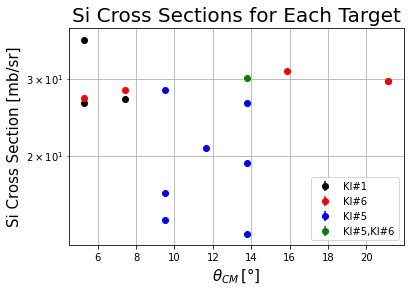

In [18]:
ax = py.subplot(111)
for i in range(len(Peak_Transfer_Exp.target_reduced)):
    plt.errorbar(Peak_Transfer_Exp.angle_cm_by_target[i], Peak_Transfer_Exp.Si_crosssection_by_target[i], yerr = Peak_Transfer_Exp.Si_crosssection_by_target_u[i], c = colors[i], ls = '', marker = 'o', label = Peak_Transfer_Exp.target_reduced[i])
plt.legend(loc="lower right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel('Si Cross Section [mb/sr]', size = 15)
ax.set_title('Si Cross Sections for Each Target', size = 20)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    FP-to-Si Transfer Cross Section Variations from Average for each Angle
</h1>

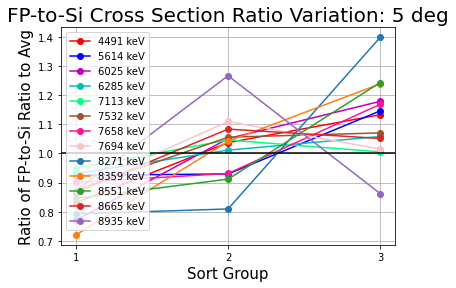

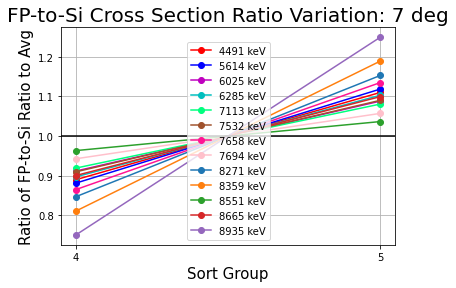

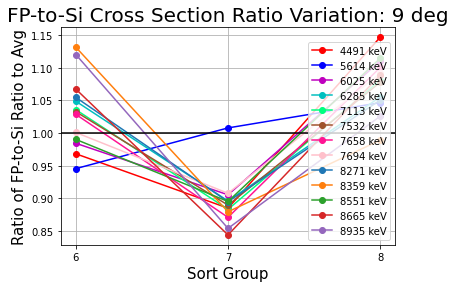

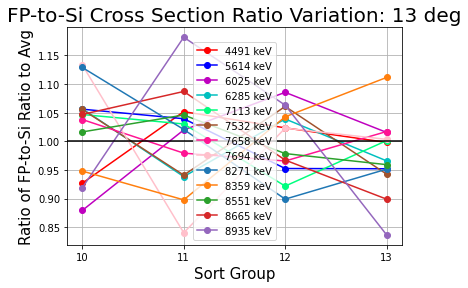

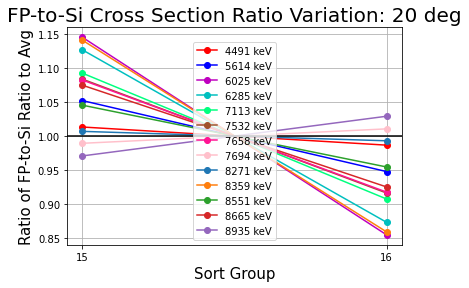

In [19]:
for i in range(len(Peak_Transfer_Exp.sort_groups_per_angle)):
    if (Peak_Transfer_Exp.sort_groups_per_angle[i] != 1):
        ax = py.subplot(111)
        for j in range(len(Peak_Transfer_Exp.objects)):
            if (True not in Peak_Transfer_Exp.objects[j].no_fit):
                if (Peak_Transfer_Exp.objects[j].fit_groups_per_angle[i] != 1):
                    plt.plot([int(k) for k in range(Peak_Transfer_Exp.objects[j].fit_angle_indices[i] + 1, Peak_Transfer_Exp.objects[j].fit_angle_indices[i+1] + 1)], Peak_Transfer_Exp.objects[j].variation_from_crosssection_ratio_avg[Peak_Transfer_Exp.objects[j].fit_angle_indices[i]:Peak_Transfer_Exp.objects[j].fit_angle_indices[i+1]], c = colors[j+1], ls = '-', marker = 'o', label = str(Peak_Transfer_Exp.objects[j].ex_energy) + ' keV')
        plt.axhline(y = 1, c = 'k', ls = '-')
        plt.legend(loc="best")
        ax.set_xlabel('Sort Group', size = 15)
        ax.set_ylabel('Ratio of FP-to-Si Ratio to Avg', size = 15)
        ax.set_title('FP-to-Si Cross Section Ratio Variation: ' + str(Peak_Transfer_Exp.angle_lab_reduced[i]) + ' deg', size = 20)
        ax.set_xticks(np.arange(Peak_Transfer_Exp.angle_indices[i] + 1, Peak_Transfer_Exp.angle_indices[i+1] + 1))
        #ax.semilogy()
        plt.grid(True, which = 'both')
        plt.show()

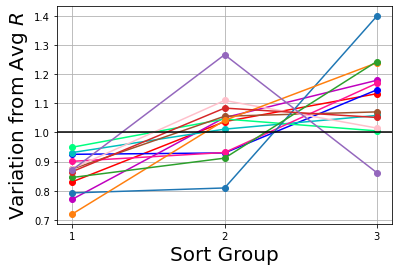

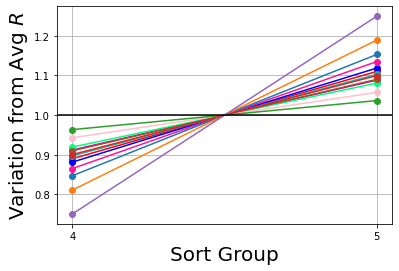

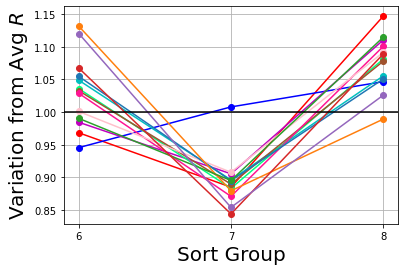

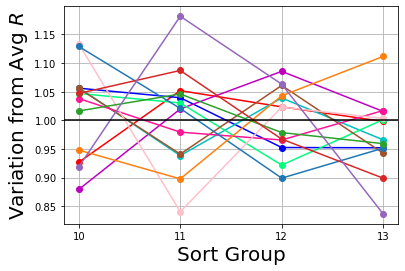

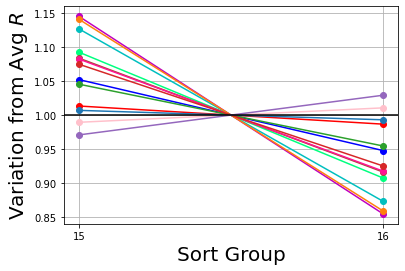

In [20]:
for i in range(len(Peak_Transfer_Exp.sort_groups_per_angle)):
    if (Peak_Transfer_Exp.sort_groups_per_angle[i] != 1):
        ax = py.subplot(111)
        for j in range(len(Peak_Transfer_Exp.objects)):
            if (True not in Peak_Transfer_Exp.objects[j].no_fit):
                if (Peak_Transfer_Exp.objects[j].fit_groups_per_angle[i] != 1):
                    plt.plot([int(k) for k in range(Peak_Transfer_Exp.objects[j].fit_angle_indices[i] + 1, Peak_Transfer_Exp.objects[j].fit_angle_indices[i+1] + 1)], Peak_Transfer_Exp.objects[j].variation_from_crosssection_ratio_avg[Peak_Transfer_Exp.objects[j].fit_angle_indices[i]:Peak_Transfer_Exp.objects[j].fit_angle_indices[i+1]], c = colors[j+1], ls = '-', marker = 'o', label = str(Peak_Transfer_Exp.objects[j].ex_energy) + ' keV')
        plt.axhline(y = 1, c = 'k', ls = '-')
        #plt.legend(loc="best")
        ax.set_xlabel('Sort Group', size = 20)
        ax.set_ylabel('Variation from Avg $R$', size = 20)
        #ax.set_title('FP-to-Si Cross Section Ratio Variation: ' + str(Peak_Transfer_Exp.angle_lab_reduced[i]) + ' deg', size = 20)
        ax.set_xticks(np.arange(Peak_Transfer_Exp.angle_indices[i] + 1, Peak_Transfer_Exp.angle_indices[i+1] + 1))
        #ax.semilogy()
        plt.grid(True, which = 'both')
        #plt.savefig('variation_' + str(Peak_Transfer_Exp.angle_lab_reduced[i]) + 'deg' + '.pdf',dpi=600,bbox_inches='tight')
        #plt.close()
        #images = convert_from_path('variation_' + str(Peak_Transfer_Exp.angle_lab_reduced[i]) + 'deg' + '.pdf', 600)
        #for image in images:
        #    image.save('variation_' + str(Peak_Transfer_Exp.angle_lab_reduced[i]) + 'deg' + '.png')
        plt.show()

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    FP-to-Si Transfer Cross Section Ratios
</h1>

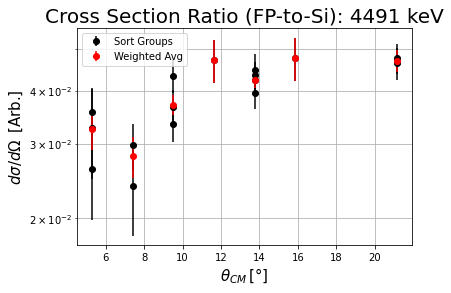

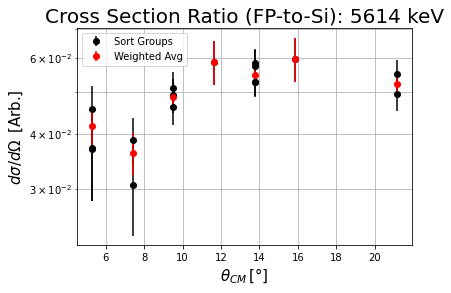

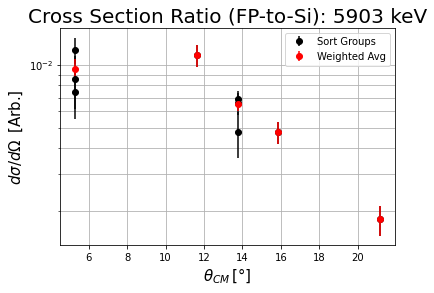

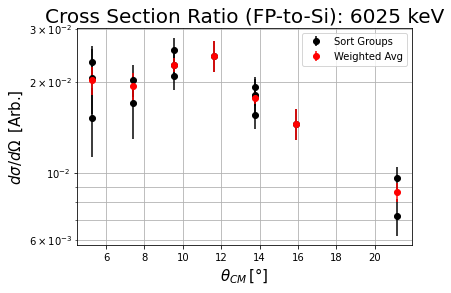

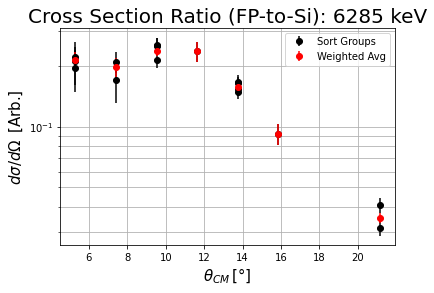

...

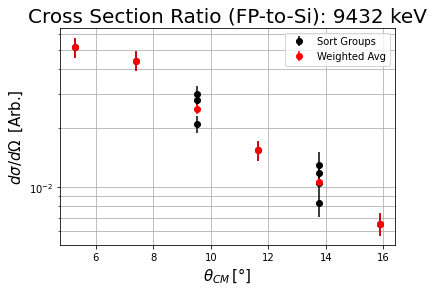

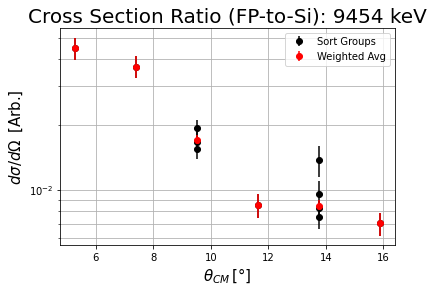

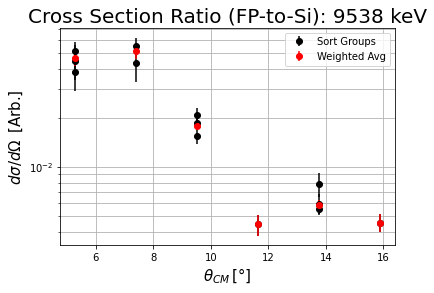

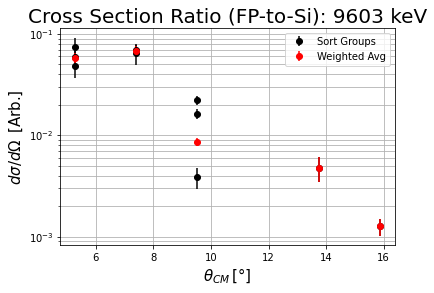

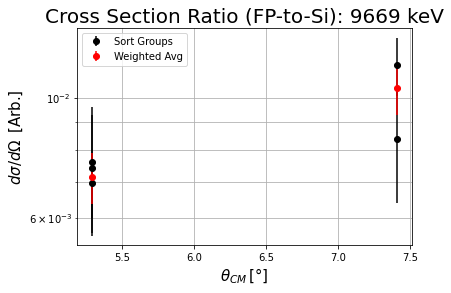

In [21]:
for i in range(len(Peak_Transfer_Exp.objects)):
    ax = py.subplot(111)
    plt.errorbar(Peak_Transfer_Exp.objects[i].fit_angle_cm, Peak_Transfer_Exp.objects[i].crosssection_ratio, yerr = Peak_Transfer_Exp.objects[i].crosssection_ratio_u_with_scatter, c = 'k', ls = '', marker = 'o', label = 'Sort Groups')
    plt.errorbar(Peak_Transfer_Exp.objects[i].fit_angle_cm_reduced, Peak_Transfer_Exp.objects[i].crosssection_ratio_wavg, yerr = Peak_Transfer_Exp.objects[i].crosssection_ratio_wavg_u, c = 'r', ls = '', marker = 'o', label = 'Weighted Avg')
    plt.legend(loc="best")
    ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
    ax.set_ylabel(r'$d \sigma / d \Omega \,$' + ' [Arb.]', size = 15) 
    ax.set_title('Cross Section Ratio (FP-to-Si): ' + str(Peak_Transfer_Exp.objects[i].ex_energy) + ' keV', size = 20)
    ax.semilogy()
    plt.grid(True, which = 'both')
    plt.show()

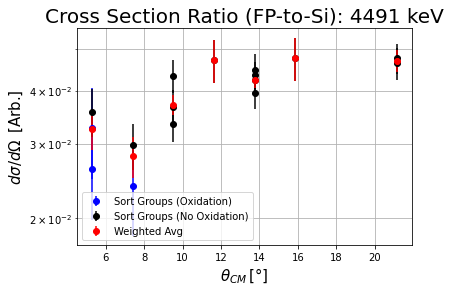

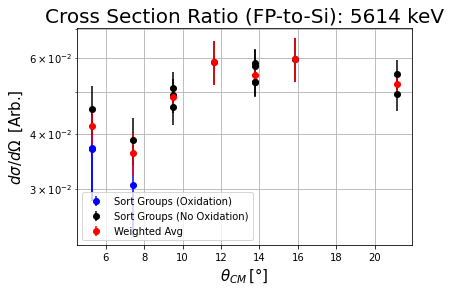

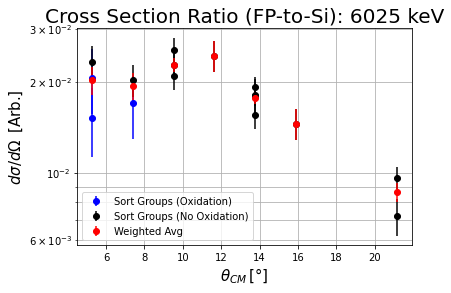

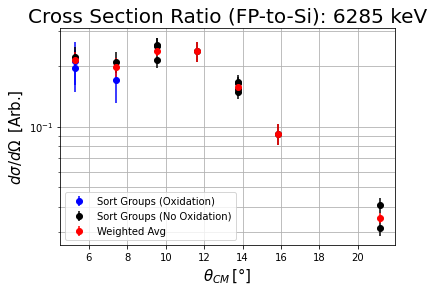

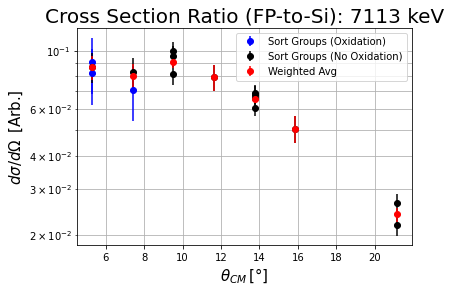

...

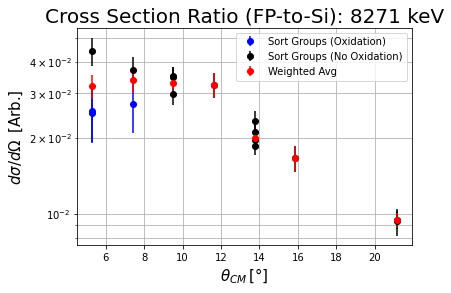

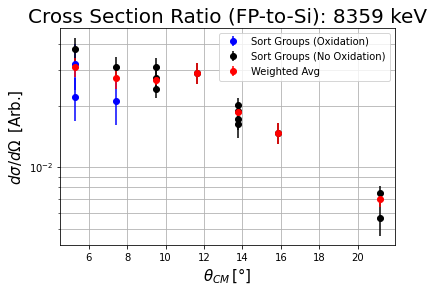

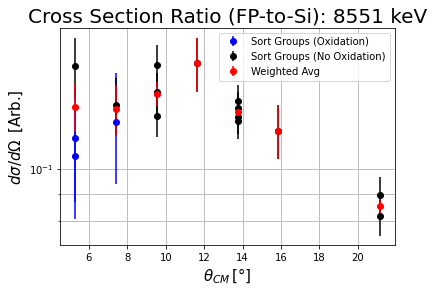

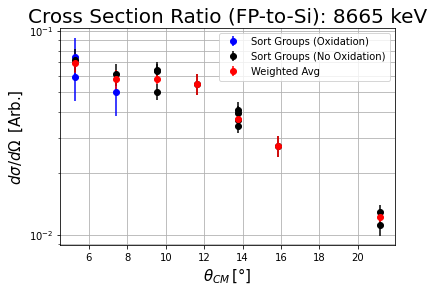

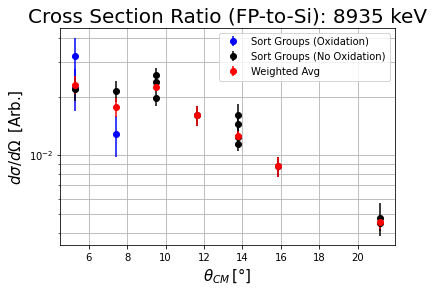

In [22]:
for i in range(len(Peak_Transfer_Exp.objects)):
    if (True not in Peak_Transfer_Exp.objects[i].no_fit):
        angle_cm_oxidation = []
        ratio_oxidation = []
        ratio_oxidation_u = []

        angle_cm_no_oxidation = []
        ratio_no_oxidation = []
        ratio_no_oxidation_u = []

        for j in range(num_sort_groups):
            if ((j == 0) | (j == 1) | (j == 3)):
                angle_cm_oxidation.append(Peak_Transfer_Exp.angle_cm[j])
                ratio_oxidation.append(Peak_Transfer_Exp.objects[i].crosssection_ratio[j])
                ratio_oxidation_u.append(Peak_Transfer_Exp.objects[i].crosssection_ratio_u_with_scatter[j])
            else:
                angle_cm_no_oxidation.append(Peak_Transfer_Exp.angle_cm[j])
                ratio_no_oxidation.append(Peak_Transfer_Exp.objects[i].crosssection_ratio[j])
                ratio_no_oxidation_u.append(Peak_Transfer_Exp.objects[i].crosssection_ratio_u_with_scatter[j])           

        ax = py.subplot(111)
        plt.errorbar(angle_cm_oxidation, ratio_oxidation, yerr = ratio_oxidation_u, c = 'b', ls = '', marker = 'o', label = 'Sort Groups (Oxidation)')
        plt.errorbar(angle_cm_no_oxidation, ratio_no_oxidation, yerr = ratio_no_oxidation_u, c = 'k', ls = '', marker = 'o', label = 'Sort Groups (No Oxidation)')
        plt.errorbar(Peak_Transfer_Exp.angle_cm_reduced, Peak_Transfer_Exp.objects[i].crosssection_ratio_wavg, yerr = Peak_Transfer_Exp.objects[i].crosssection_ratio_wavg_u, c = 'r', ls = '', marker = 'o', label = 'Weighted Avg')
        plt.legend(loc="best")
        ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
        ax.set_ylabel(r'$d \sigma / d \Omega \,$' + ' [Arb.]', size = 15) 
        ax.set_title('Cross Section Ratio (FP-to-Si): ' + str(Peak_Transfer_Exp.objects[i].ex_energy) + ' keV', size = 20)
        ax.semilogy()
        plt.grid(True, which = 'both')
        plt.show()

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Fresco DWBA Analysis
</h1>

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Extract Data from Fresco Output Files
</h2>

In [23]:
# Instantiate transfer fresco classes
# Arguments: fresco(ex_energy [keV], root pathname for fresco files)
Ca40_4491_fresco = fresco(4491, fresco_root_T)
Ca40_5614_fresco = fresco(5614, fresco_root_T)
Ca40_5903_fresco = fresco(5903, fresco_root_T)
Ca40_6025_fresco = fresco(6025, fresco_root_T)
Ca40_6285_fresco = fresco(6285, fresco_root_T)
Ca40_6582_fresco = fresco(6582, fresco_root_T) ### NEW
Ca40_6750_fresco = fresco(6750, fresco_root_T) ### NEW
#Ca40_6931_fresco = fresco(6931, fresco_root_T) # Alternative to 6950 keV
Ca40_6950_fresco = fresco(6950, fresco_root_T) ### NEW # Use this, not 6931 keV
Ca40_7113_fresco = fresco(7113, fresco_root_T) # Use this, not 7114 keV
#Ca40_7114_fresco = fresco(7114, fresco_root_T) # Alternative to 7113 keV
Ca40_7532_fresco = fresco(7532, fresco_root_T)
Ca40_7623_fresco = fresco(7623, fresco_root_T) ### BRAND NEW
Ca40_7658_fresco = fresco(7658, fresco_root_T)
Ca40_7694_fresco = fresco(7694, fresco_root_T)
Ca40_7973_fresco = fresco(7973, fresco_root_T) ### NEW
#Ca40_8019_fresco = fresco(8019, fresco_root_T) ### BRAND NEW (more iffy than 7623)
Ca40_8113_fresco = fresco(8113, fresco_root_T) ### NEW
Ca40_8188_fresco = fresco(8188, fresco_root_T) ### NEW
Ca40_8271_fresco = fresco(8271, fresco_root_T)
Ca40_8359_fresco = fresco(8359, fresco_root_T)
Ca40_8425_fresco = fresco(8425, fresco_root_T) ### NEW
Ca40_8484_fresco = fresco(8484, fresco_root_T)
Ca40_8551_fresco = fresco(8551, fresco_root_T)
Ca40_8665_fresco = fresco(8665, fresco_root_T)
Ca40_8748_fresco = fresco(8748, fresco_root_T) ### NEW
Ca40_8764_fresco = fresco(8764, fresco_root_T) ### NEW
Ca40_8851_fresco = fresco(8851, fresco_root_T) ### NEW
Ca40_8935_fresco = fresco(8935, fresco_root_T) ### NEW # Use this, not 8938 keV
#Ca40_8938_fresco = fresco(8938, fresco_root_T) # Alternative to 8935 keV
Ca40_8995_fresco = fresco(8995, fresco_root_T) ### NEW
Ca40_9092_fresco = fresco(9092, fresco_root_T) ### NEW
Ca40_9136_fresco = fresco(9136, fresco_root_T) ### NEW
#Ca40_9226_fresco = fresco(9226, fresco_root_T) # Alternative to 9227 keV
Ca40_9227_fresco = fresco(9227, fresco_root_T) ### NEW # Use this, not 9226 keV
Ca40_9405_fresco = fresco(9405, fresco_root_T) ### BRAND BRAND NEW (Multiplet) Could also be 9406 keV
Ca40_9419_fresco = fresco(9419, fresco_root_T) ### BRAND BRAND NEW (Multiplet) Could also be 9412 keV but probably not
Ca40_9432_fresco = fresco(9432, fresco_root_T) ### BRAND BRAND NEW (Multiplet) Could also be 9429 keV
Ca40_9454_fresco = fresco(9454, fresco_root_T) ### NEW
Ca40_9538_fresco = fresco(9538, fresco_root_T) ### NEW
Ca40_9603_fresco = fresco(9603, fresco_root_T) ### NEW # Use this, not 9605 keV
#Ca40_9605_fresco = fresco(9605, fresco_root_T) # Alternative to 9603 keV
#Ca40_9662_fresco = fresco(9662, fresco_root_T) # Alternative to 9669 keV
Ca40_9669_fresco = fresco(9669, fresco_root_T) ### NEW # Use this, not 9662 keV

# Instantiate ES fresco classes
#I127_fresco_ES = fresco_ES(fresco_root_ES)
K39_fresco_ES = fresco_ES(fresco_root_ES)
#O16_fresco_ES = fresco_ES(fresco_root_ES)
#C12_fresco_ES = fresco_ES(fresco_root_ES)

K39_fresco_ES.extract_fort201() # Elastic Scattering reaction
fresco.extract_fort202_all() # Transfer reaction cross-sections
fresco.extract_fort58_all() # Bound-state wavefunctions
fresco.extract_fort3_all() # Parameters from input file

fresco.calc_dimensionless_singleparticle_reduced_width_squared_all()

# Get lnj values for all excited states:
fresco.find_lnj_vals_all()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Find Experimental Elastic Scattering Normalization to Liang et al. 2009 Global-3He Model
</h2>

<h3 style="text-decoration:bold;"> 
    Correcting ES cross-sections for 41K(3He,3He)41K since target is natural KI
</h3>

In [24]:
# Technically the target is natural KI, so the K should have only 93.26% 39K and the rest 41K. 
# Both 39K and 41 FP peaks are being fit as one peak for angles less than 40 deg (except 20 deg), but Si detectors (all at 45 deg) treat all as one peak.

# As a first approximation, to correct, the cross sections of 40 deg and greater (and 20 deg) need to be corrected by Si peak correction (since the FP-to-Si ratio cancels out when correcting both)
# i.e. divide 40 deg and greater (and 20 deg) by 0.9326 or multiply by 1.07227

# As a better approximation, take into account BOTH the relative FRESCO ES cross sections for 39K and 41K for each angle AND the 93.26% isotopic abundance
# Correct the Area_FP for each angle fitted as a single peak with Area_FP_corrected = Area_FP * 0.9326 * cross_Fresco_39K(theta_cm) / cross_Fresco_41K(theta_cm)
# Correct the Area_Si for all FP angles (since the Si peaks, all at theta_cm = 48deg, were all fitted as one peak) with Area_Si_corrected = Area_Si * 0.9326 * cross_Fresco_39K(48deg) / cross_Fresco_41K(48deg)

cross_fresco_39K = [0.8173, 0.5030, 0.3999, 0.3620, 0.2103, 0.1646, 0.1803, 0.1379, 0.06058, 0.05090]
cross_fresco_41K = [0.8099, 0.4842, 0.3943, 0.3521, 0.2231, 0.1700, 0.1770, 0.1190, 0.05369, 0.05785]
cross_fresco_39K_41K_ratio = []
for i in range(len(cross_fresco_39K)):
    cross_fresco_39K_41K_ratio.append(cross_fresco_39K[i] / cross_fresco_41K[i])
cross_fresco_39K_41K_ratio_Si = cross_fresco_39K[6] / cross_fresco_41K[6] # all at theta_lab = 45 deg, theta_cm = 48 deg

FP_correction_indices = [0, 2, 3, 4] # theta_lab = 15, 25, 30, and 35
Si_correction_indices = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9] # theta_lab = 15, 20, 25, 30, 35, 40, 45, 50, 55, 59 (all angles)

N_FP_K41_correction = []
for i in range(len(cross_fresco_39K)):
    if (i in FP_correction_indices):
        N_FP_K41_correction.append(0.9326 * cross_fresco_39K_41K_ratio[i])
    else:
        N_FP_K41_correction.append(1)
    
N_Si_K41_correction = []
for i in range(len(cross_fresco_39K)):
    if (i in Si_correction_indices):
        N_Si_K41_correction.append(0.9326 * cross_fresco_39K_41K_ratio_Si) # Should be all
    else:
        N_Si_K41_correction.append(1) # Should be none

K41_corrected_cross = []
u_K41_corrected_cross = []
for i in range(len(K39_ES.crosssection_ratio_wavg)):
    K41_corrected_cross.append(K39_ES.crosssection_ratio_wavg[i] * N_FP_K41_correction[i] / N_Si_K41_correction[i])
    u_K41_corrected_cross.append(K39_ES.crosssection_ratio_wavg_u[i] * N_FP_K41_correction[i] / N_Si_K41_correction[i])
        
#K41_corrected_cross = []
#u_K41_corrected_cross = []
#for i in range(len(K39_ES.crosssection_ratio_wavg)):
#    if ((i >= 5) or (i==1)):
#        K41_corrected_cross.append(K39_ES.crosssection_ratio_wavg[i] * 1.07227)
#        u_K41_corrected_cross.append(K39_ES.crosssection_ratio_wavg_u[i] * 1.07227)
#    else:
#        K41_corrected_cross.append(K39_ES.crosssection_ratio_wavg[i])
#        u_K41_corrected_cross.append(K39_ES.crosssection_ratio_wavg_u[i])

In [25]:
## Normalize using all ES points
# Arguments: exp_sigma, u_exp_sigma, exp_theta, fresco_theta, fresco_sigma
#K39_fresco_ES.calc_normalization_cubic_interpolation(K39_ES.crosssection_ratio_wavg, K39_ES.crosssection_ratio_wavg_u, Peak_ES_Exp.angle_cm_reduced)
K39_fresco_ES.calc_normalization_cubic_interpolation(K41_corrected_cross, u_K41_corrected_cross, Peak_ES_Exp.angle_cm_reduced)

## Normalize using only points up to the first minimum
# Arguments: exp_sigma, u_exp_sigma, exp_theta, fresco_theta, fresco_sigma, points_list
#K39_fresco_ES.calc_normalization_cubic_interpolation_subset(K39_ES.crosssection_ratio_wavg, K39_ES.crosssection_ratio_wavg_u, Peak_ES_Exp.angle_cm_reduced, [0,1,2,3,4,5])

print('\nRaw ES Normalization: \n')
print(K39_fresco_ES.norm)
print('\nRaw ES Normalization Uncertainty: \n')
print(K39_fresco_ES.norm_u)
#print(K39_fresco_ES.norm_subset)

print('\npfunk ES Normalization Parameter: \n')
print(K39_fresco_ES.norm_param)
#print(K39_fresco_ES.norm_param_subset)


Raw ES Normalization: 

0.0276733767367236

Raw ES Normalization Uncertainty: 

0.0011166701555971748

pfunk ES Normalization Parameter: 

-1.558



No Normalization (No 41K Correction):



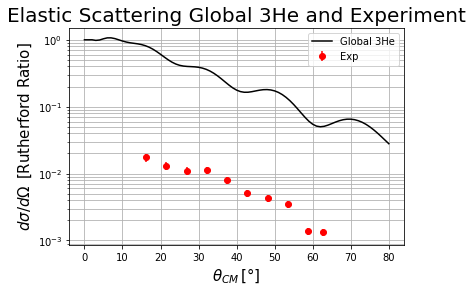

In [26]:
print('\nNo Normalization (No 41K Correction):\n')
ax = py.subplot(111)
plt.errorbar(Peak_ES_Exp.angle_cm_reduced, K39_ES.crosssection_ratio_wavg, yerr = K39_ES.crosssection_ratio_wavg_u, c = 'r', ls = '', marker = 'o', label = 'Exp')
plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma, c = 'k', ls = '-', label = 'Global 3He')
plt.legend(loc="best")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \,$' + ' [Rutherford Ratio]', size = 15) 
ax.set_title('Elastic Scattering Global 3He and Experiment', size = 20)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()


No Normalization (With 41K Correction):



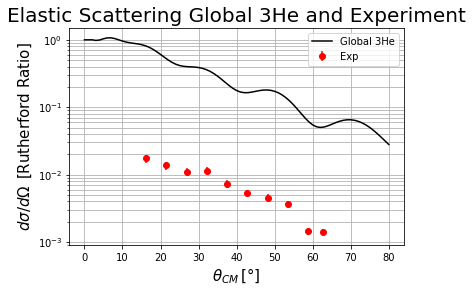

In [27]:
print('\nNo Normalization (With 41K Correction):\n')
ax = py.subplot(111)
plt.errorbar(Peak_ES_Exp.angle_cm_reduced, K41_corrected_cross, yerr = u_K41_corrected_cross, c = 'r', ls = '', marker = 'o', label = 'Exp')
plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma, c = 'k', ls = '-', label = 'Global 3He')
plt.legend(loc="best")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \,$' + ' [Rutherford Ratio]', size = 15) 
ax.set_title('Elastic Scattering Global 3He and Experiment', size = 20)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()


Elastic Scattering with Normalization (Not Correcting data for 41K, but technically normalized with 41K correction):



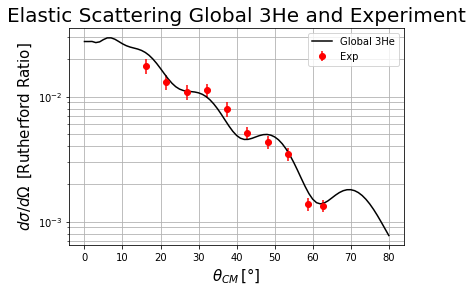

In [28]:
print('\nElastic Scattering with Normalization (Not Correcting data for 41K, but technically normalized with 41K correction):\n')
ax = py.subplot(111)
plt.errorbar(Peak_ES_Exp.angle_cm_reduced, K39_ES.crosssection_ratio_wavg, yerr = K39_ES.crosssection_ratio_wavg_u, c = 'r', ls = '', marker = 'o', label = 'Exp')
plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma_normalized, c = 'k', ls = '-', label = 'Global 3He')
#plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma_normalized_subset, c = 'k', ls = '-', label = 'Global 3He')
plt.legend(loc="best")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \,$' + ' [Rutherford Ratio]', size = 15) 
ax.set_title('Elastic Scattering Global 3He and Experiment', size = 20)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()


Elastic Scattering with Normalization (With 41K Correction):



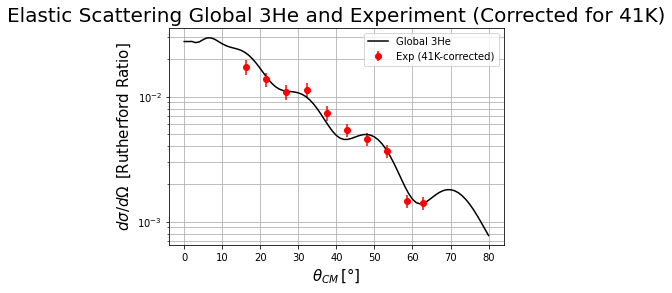

In [29]:
print('\nElastic Scattering with Normalization (With 41K Correction):\n')
ax = py.subplot(111)
plt.errorbar(Peak_ES_Exp.angle_cm_reduced, K41_corrected_cross, yerr = u_K41_corrected_cross, c = 'r', ls = '', marker = 'o', label = 'Exp (41K-corrected)')
plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma_normalized, c = 'k', ls = '-', label = 'Global 3He')
#plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma_normalized_subset, c = 'k', ls = '-', label = 'Global 3He')
plt.legend(loc="best")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \,$' + ' [Rutherford Ratio]', size = 15) 
ax.set_title('Elastic Scattering Global 3He and Experiment (Corrected for 41K)', size = 20)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

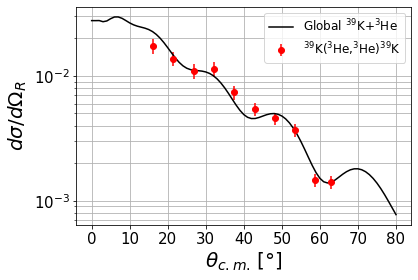

In [30]:
ax = py.subplot(111)
plt.errorbar(Peak_ES_Exp.angle_cm_reduced, K41_corrected_cross, yerr = u_K41_corrected_cross, c = 'r', ls = '', marker = 'o', label = r'$^{39}$K' + r'$(^{3}$He,' + r'$^{3}$He)' + r'$^{39}$K')
plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma_normalized, c = 'k', ls = '-', label = 'Global ' + r'$^{39}$K+' + '$^{3}$' + 'He')
#plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma_normalized_subset, c = 'k', ls = '-', label = 'Global 3He')
plt.legend(loc="best",fontsize="12")
ax.set_xlabel(r'$\theta_{c.m.} \, [$' + deg + ']', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega_{R}$', size = 20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
#ax.set_title('Elastic Scattering Global 3He and Experiment (Corrected for 41K)', size = 20)
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('41K_Corrected_Cross.pdf',dpi=600,bbox_inches='tight')
#plt.close()
#images = convert_from_path('41K_Corrected_Cross.pdf', 600)
#for image in images:
#    image.save('41K_Corrected_Cross.png')
plt.show()

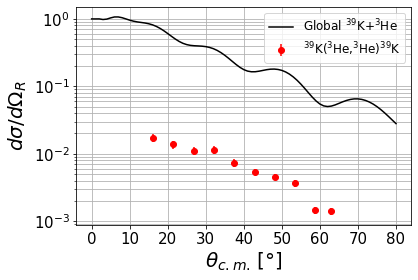

In [31]:
ax = py.subplot(111)
plt.errorbar(Peak_ES_Exp.angle_cm_reduced, K41_corrected_cross, yerr = u_K41_corrected_cross, c = 'r', ls = '', marker = 'o', label = r'$^{39}$K' + r'$(^{3}$He,' + r'$^{3}$He)' + r'$^{39}$K')
plt.plot(K39_fresco_ES.theta, K39_fresco_ES.sigma, c = 'k', ls = '-', label = 'Global ' + r'$^{39}$K+' + '$^{3}$' + 'He')
plt.legend(loc="best",fontsize="12")
ax.set_xlabel(r'$\theta_{c.m.} \, [$' + deg + ']', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega_{R}$', size = 20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('41K_Corrected_Cross_NoNorm.pdf',dpi=600,bbox_inches='tight')
#plt.close()
#images = convert_from_path('41K_Corrected_Cross_NoNorm.pdf', 600)
#for image in images:
#    image.save('41K_Corrected_Cross_NoNorm.png')
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Calculate Spectroscopic Factors Using Linear and Cubic Interpolation
</h2>

### DWBA Spectroscopic Factor:

\begin{equation}
\frac{d\sigma}{d\Omega}_{exp} = {C^{2}S}_{{}^{3}\!{He}} \, {C^{2}S}_{{}^{40}Ca} \frac{d\sigma}{d\Omega}_{DWBA},
\end{equation}

\begin{equation}
C^{2}S_{{}^{40}Ca} = \frac{1}{C^{2}S_{{}^{3}\!{He}}} \frac{1}{N} \sum_{i=1}^{N} \frac{d \sigma / d \Omega_{exp_{i}}}{d \sigma / d \Omega_{DWBA_{i}}}
\end{equation}

\begin{equation}
{C^{2}S}_{{}^{3}\!{He}} = 1.32 \pm 0.01
\end{equation}

\begin{equation}
C^{2}S_{{}^{40}Ca} \, ' = \frac{C^{2}S_{{}^{40}Ca}}{ES_{Norm}}
\end{equation}

\begin{equation}
ES_{Norm} = \frac{1}{N} \sum_{i=1}^{N} \frac{d \sigma / d \Omega_{ES_{exp_{i}}}}{d \sigma \ d \Omega_{ES_{Global_{i}}}}
\end{equation}

We must use interpolation to find the value of $d \sigma / d \Omega_{DWBA_{i}}$ at $\theta_{exp_{i}}$.

In [32]:
fresco.calc_s_factor_cubic_interpolation_all(K39_fresco_ES.norm, K39_fresco_ES.norm_u)
#fresco.calc_s_factor_cubic_interpolation_all(K39_fresco_ES.norm_subset, K39_fresco_ES.norm_subset_u)

# Print s-factor tables for each excited state
fresco.print_s_factor_tables()

<ipython-input-13-f0af11ace728>:311: RuntimeWarning: divide by zero encountered in double_scalars
  ratios.append(exp_sigma[i] / sigma_interpolated[i])
<ipython-input-13-f0af11ace728>:322: RuntimeWarning: invalid value encountered in double_scalars
  chi2 = chi2 + ((exp_sigma[i] - (C2S_guess * sigma_interpolated[i])) / u_exp_sigma[i])**2
/usr/local/lib/python3.8/dist-packages/scipy-1.6.2-py3.8-linux-x86_64.egg/scipy/optimize/optimize.py:733: RuntimeWarning: invalid value encountered in subtract
  if (np.max(np.ravel(np.abs(sim[1:] - sim[0]))) <= xatol and
/usr/local/lib/python3.8/dist-packages/scipy-1.6.2-py3.8-linux-x86_64.egg/scipy/optimize/optimize.py:738: RuntimeWarning: invalid value encountered in subtract
  xr = (1 + rho) * xbar - rho * sim[-1]
/usr/local/lib/python3.8/dist-packages/scipy-1.6.2-py3.8-linux-x86_64.egg/scipy/optimize/optimize.py:780: RuntimeWarning: invalid value encountered in subtract
  sim[j] = sim[0] + sigma * (sim[j] - sim[0])
<ipython-input-13-f0af11ace728>:

4491 keV, reduced chi2 before min: nan
4491 keV, reduced chi2 after min: nan
4491 keV, reduced chi2 before min: 8.806356282568666
4491 keV, reduced chi2 after min: 6.591811135151024
4491 keV, reduced chi2 before min: nan
4491 keV, reduced chi2 after min: nan
4491 keV, reduced chi2 before min: 6.1812572296523784
4491 keV, reduced chi2 after min: 4.304671438919628
4491 keV, reduced chi2 before min: 11.91844545785319
4491 keV, reduced chi2 after min: 11.215790243223703
4491 keV, reduced chi2 before min: 38.36819771682928
4491 keV, reduced chi2 after min: 25.608529990977814
4491 keV, reduced chi2 before min: 6.861083249745391
4491 keV, reduced chi2 after min: 6.719718978872486
4491 keV, reduced chi2 before min: nan
4491 keV, reduced chi2 after min: nan
5614 keV, reduced chi2 before min: 8.64670638694457
5614 keV, reduced chi2 after min: 6.624557614464293
5614 keV, reduced chi2 before min: 4.751853072716092
5614 keV, reduced chi2 after min: 4.2619774036515725
5614 keV, reduced chi2 before m

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Scale Experimental and DWBA Cross-Sections by S-factor
</h2>

In [33]:
fresco.calc_s_factor_cubic_scaled_exp_cross_all()
fresco.calc_s_factor_cubic_scaled_dwba_cross_all()

<ipython-input-13-f0af11ace728>:388: RuntimeWarning: invalid value encountered in double_scalars
  u_scaled_exp_cross.append((1/s_factor_projectile) * (1/self.s_factor_cubic_interpolation[i]) * np.sqrt((u_exp_sigma[j]) ** 2 + ((exp_sigma[j] / self.s_factor_cubic_interpolation[i]) * self.u_s_factor_cubic_interpolation[i]) ** 2 + ((exp_sigma[j] / s_factor_projectile) * u_s_factor_projectile) ** 2))
<ipython-input-13-f0af11ace728>:398: RuntimeWarning: invalid value encountered in double_scalars
  scaled_dwba_cross.append(self.sigma[i][j] * self.s_factor_cubic_interpolation[i] * s_factor_projectile)
<ipython-input-13-f0af11ace728>:399: RuntimeWarning: invalid value encountered in double_scalars
  u_scaled_dwba_cross.append(self.sigma[i][j] * np.sqrt((s_factor_projectile * self.u_s_factor_cubic_interpolation[i]) ** 2 + (self.s_factor_cubic_interpolation[i] * u_s_factor_projectile) **2))


<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Plot Transfer DWBA Models (No Scaling)
</h2>


No Spectroscopic Factor Scaling:



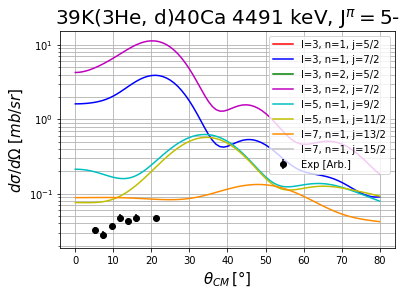


No Spectroscopic Factor Scaling:



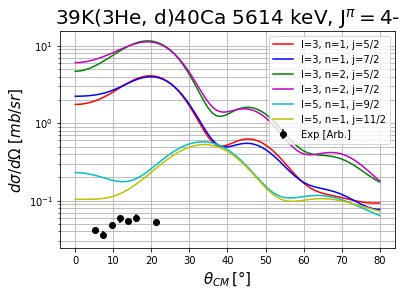


No Spectroscopic Factor Scaling:



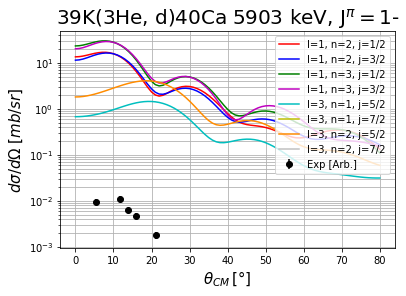


No Spectroscopic Factor Scaling:



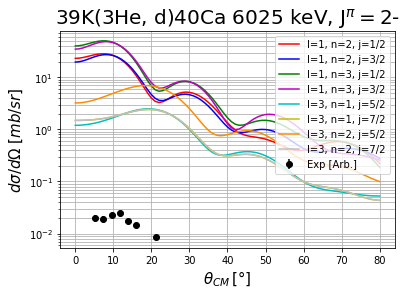


No Spectroscopic Factor Scaling:



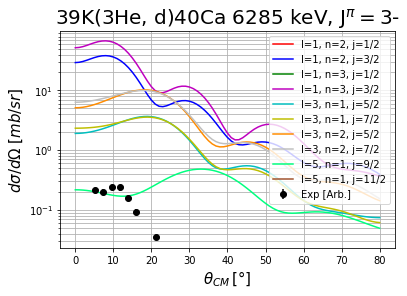


No Spectroscopic Factor Scaling:



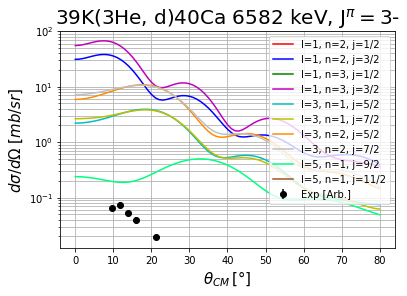


No Spectroscopic Factor Scaling:



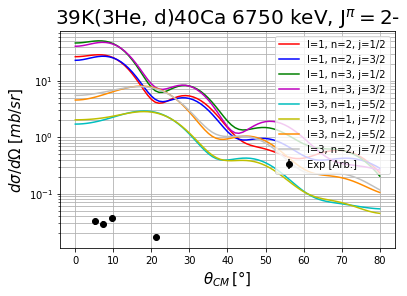


No Spectroscopic Factor Scaling:



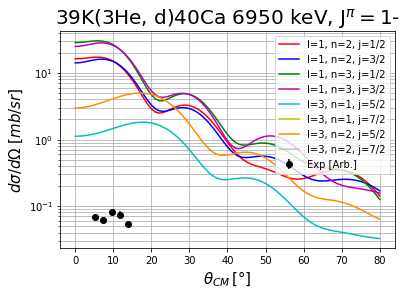


No Spectroscopic Factor Scaling:



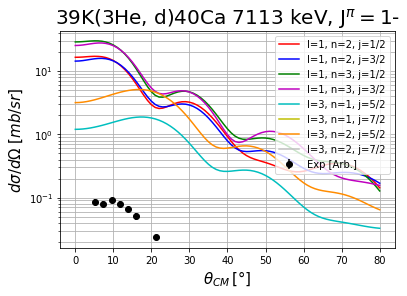


No Spectroscopic Factor Scaling:



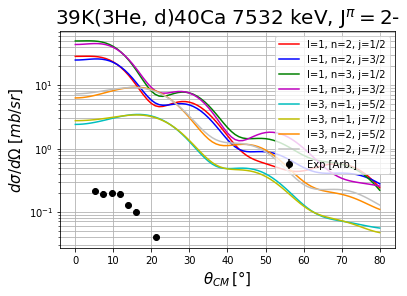


No Spectroscopic Factor Scaling:



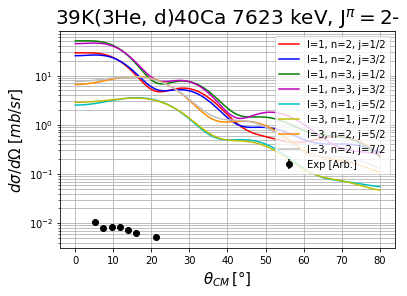

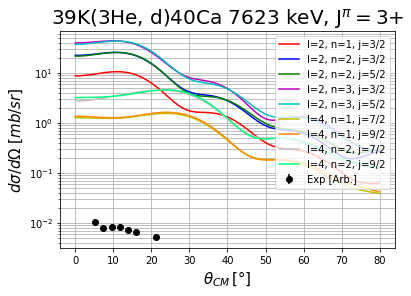

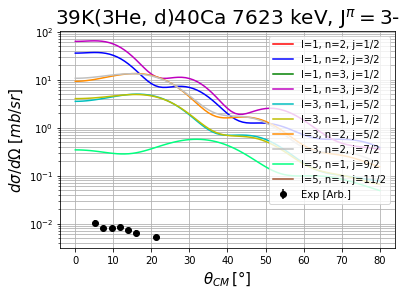

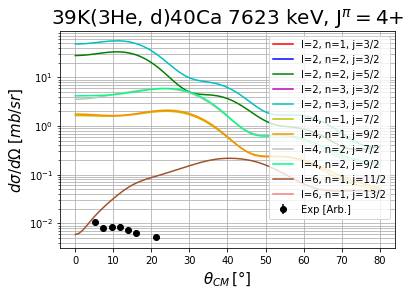


No Spectroscopic Factor Scaling:



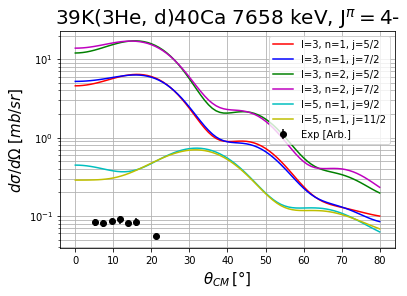


No Spectroscopic Factor Scaling:



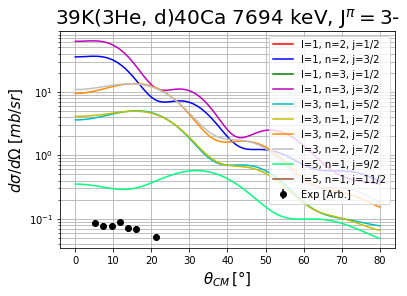


No Spectroscopic Factor Scaling:



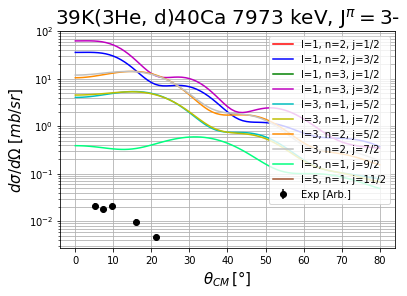


No Spectroscopic Factor Scaling:



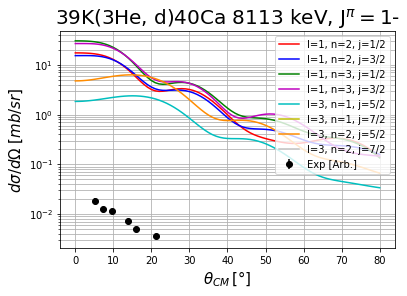


No Spectroscopic Factor Scaling:



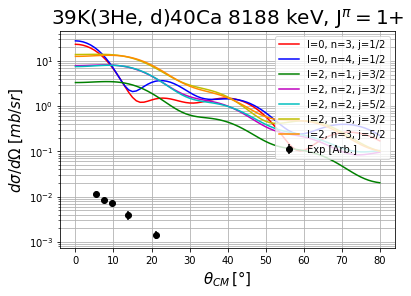

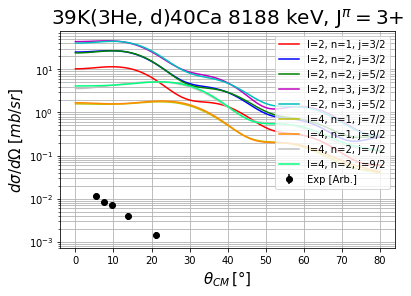

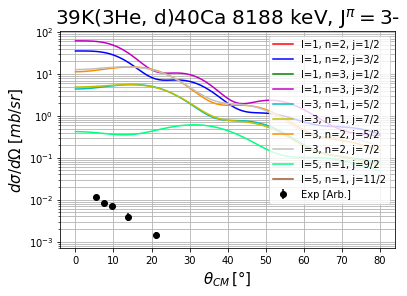

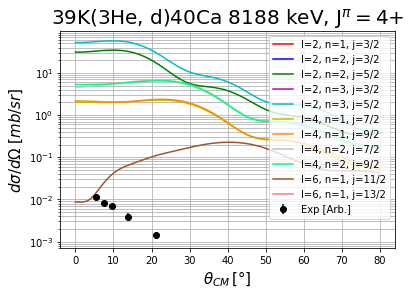

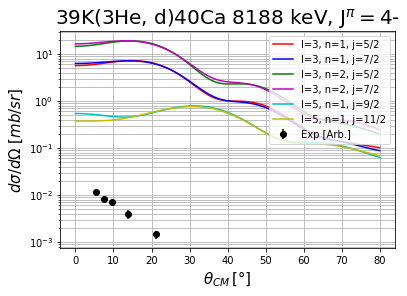

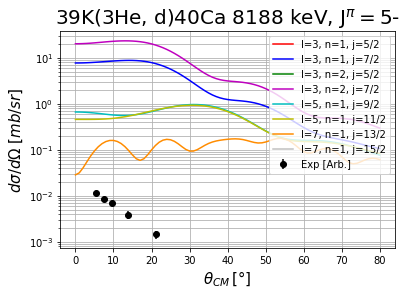


No Spectroscopic Factor Scaling:



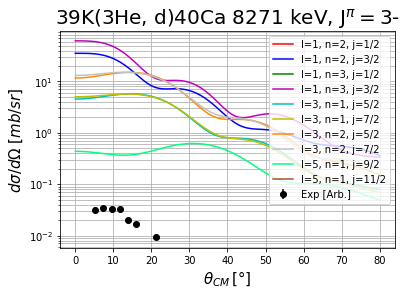


No Spectroscopic Factor Scaling:



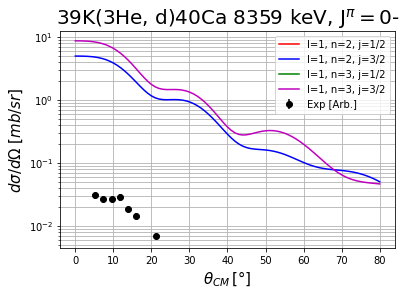

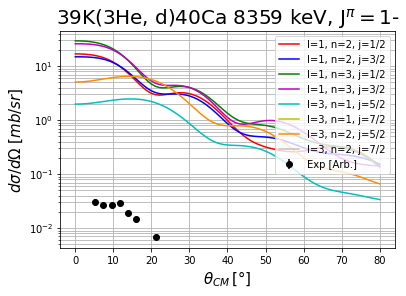

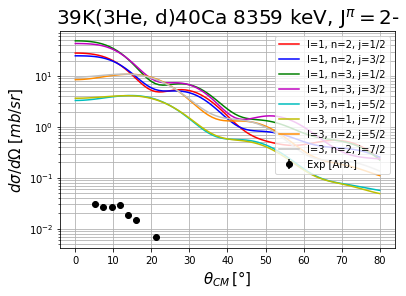


No Spectroscopic Factor Scaling:



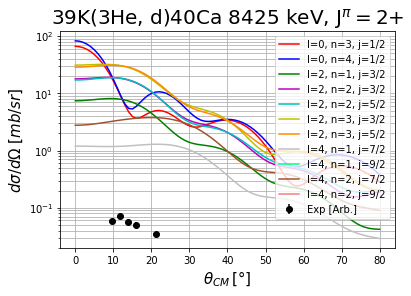

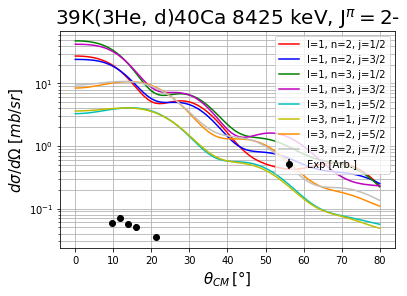


No Spectroscopic Factor Scaling:



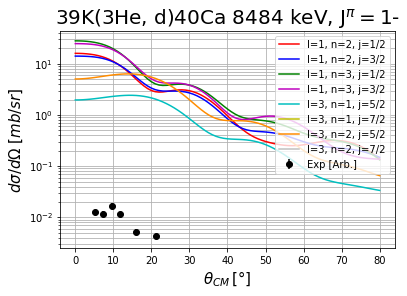

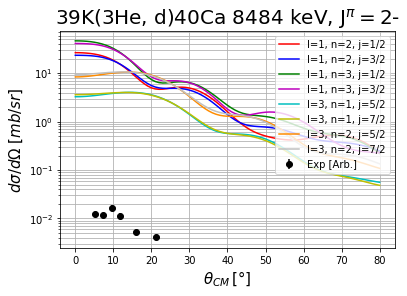

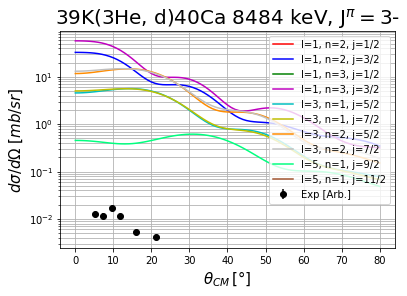

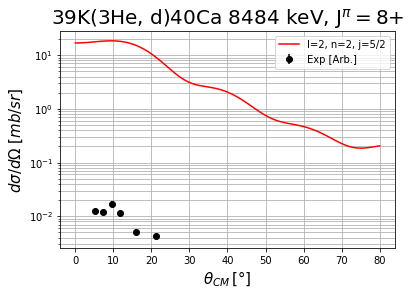


No Spectroscopic Factor Scaling:



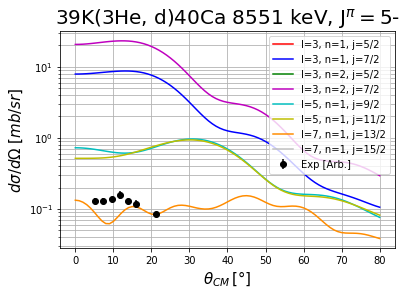


No Spectroscopic Factor Scaling:



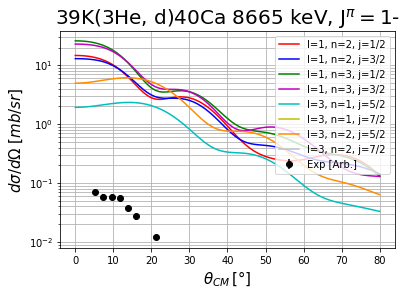


No Spectroscopic Factor Scaling:



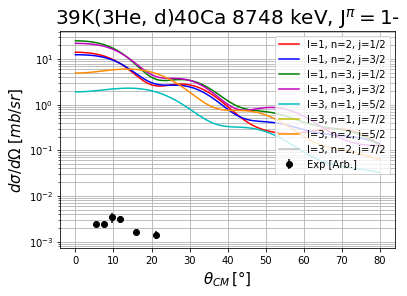

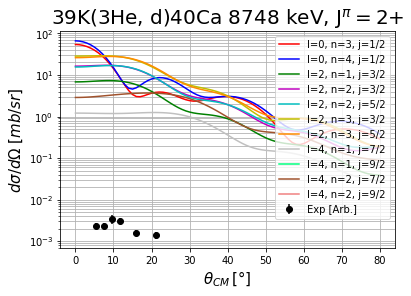

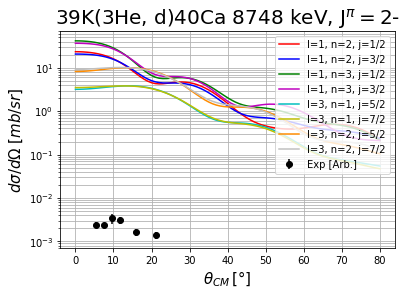


No Spectroscopic Factor Scaling:



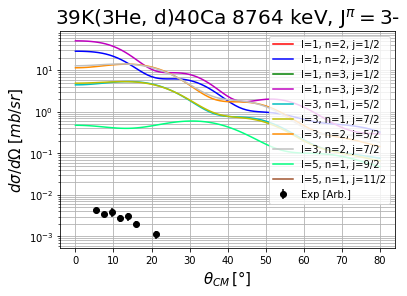


No Spectroscopic Factor Scaling:



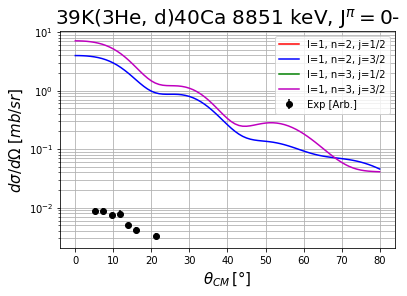

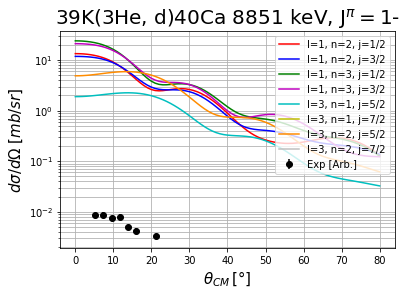

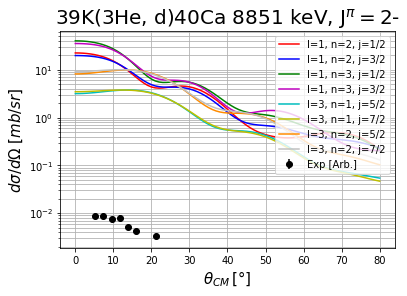

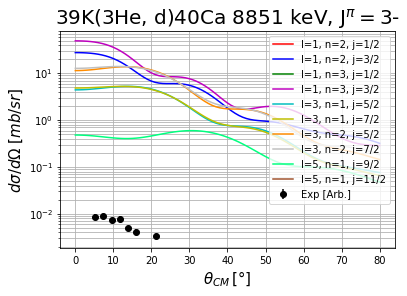

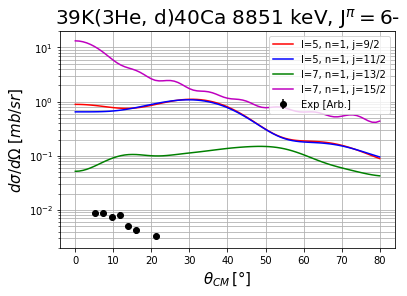

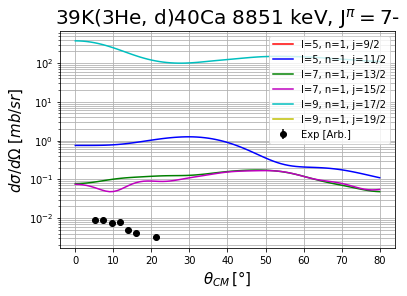

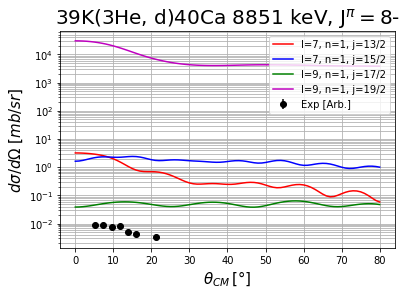


No Spectroscopic Factor Scaling:



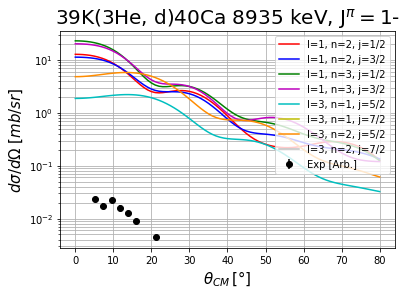

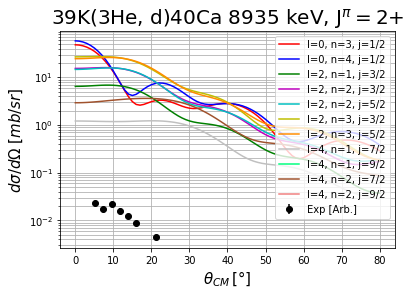


No Spectroscopic Factor Scaling:



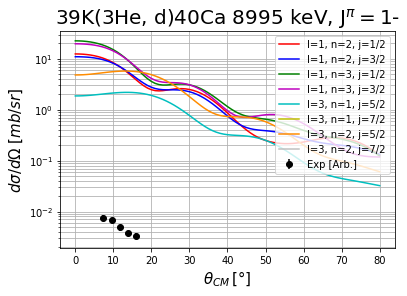

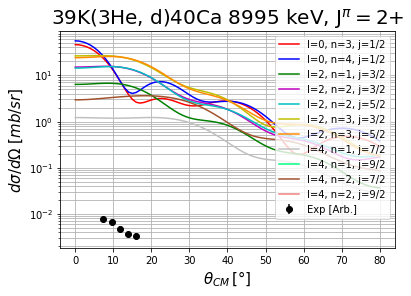


No Spectroscopic Factor Scaling:



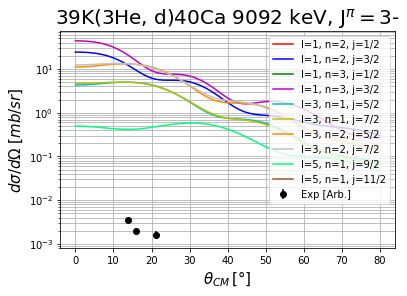


No Spectroscopic Factor Scaling:



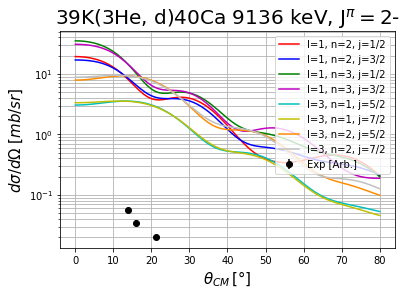

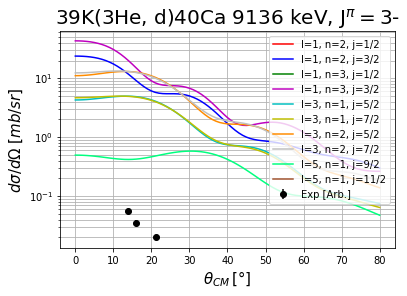


No Spectroscopic Factor Scaling:



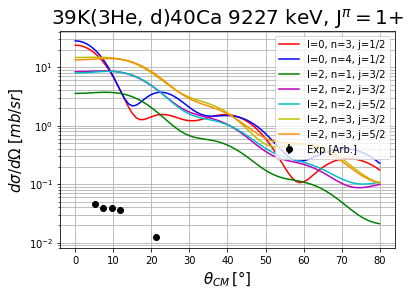

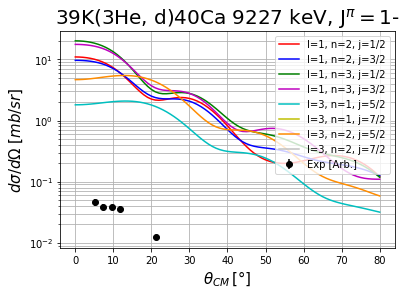

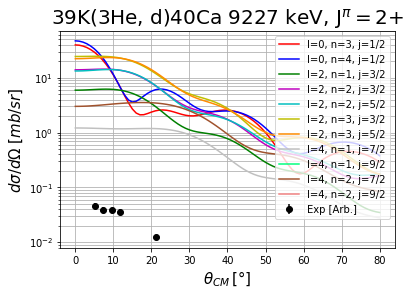


No Spectroscopic Factor Scaling:



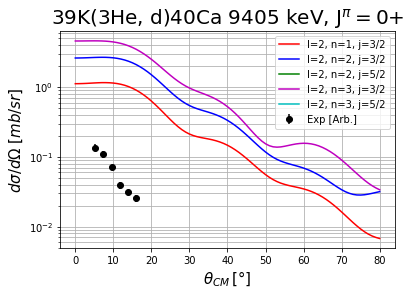

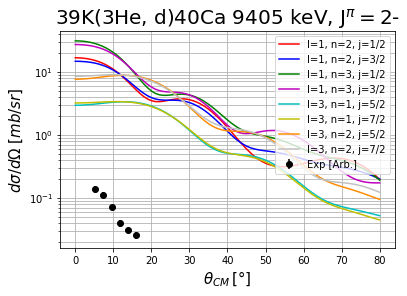


No Spectroscopic Factor Scaling:



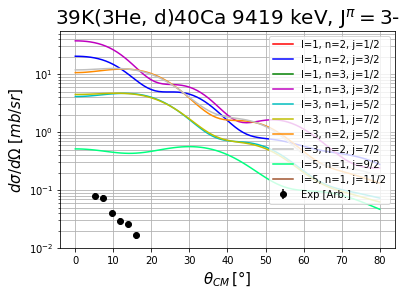


No Spectroscopic Factor Scaling:



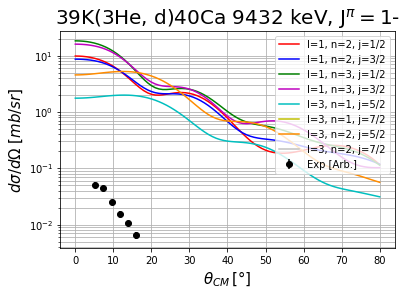

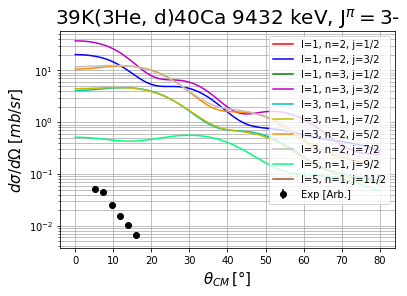

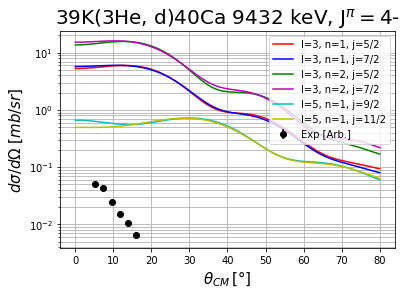


No Spectroscopic Factor Scaling:



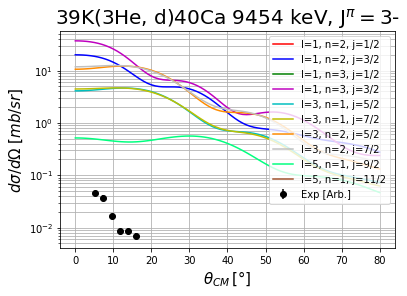


No Spectroscopic Factor Scaling:



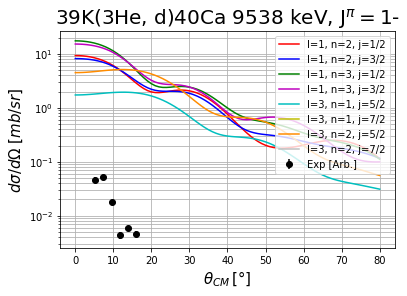


No Spectroscopic Factor Scaling:



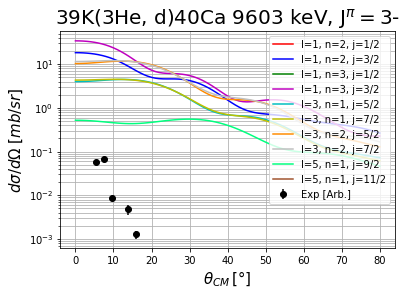


No Spectroscopic Factor Scaling:



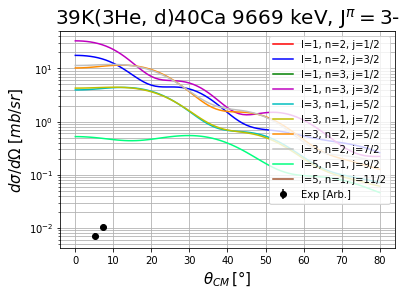

In [34]:
fresco.plot_transfer_dwba_exp_mult_all()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Plot Transfer DWBA Models Scaled to Exp
</h2>


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



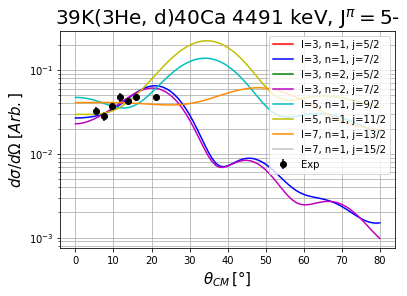


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



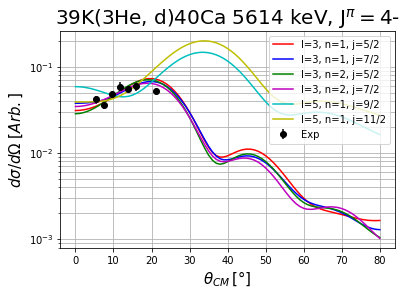


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



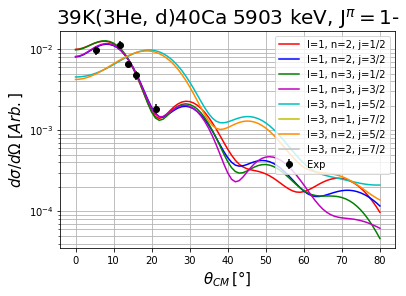


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



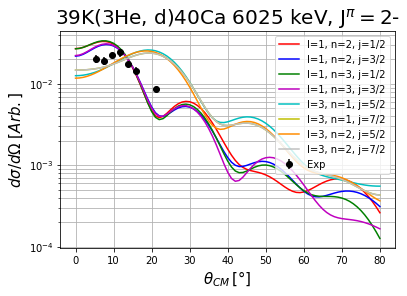


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



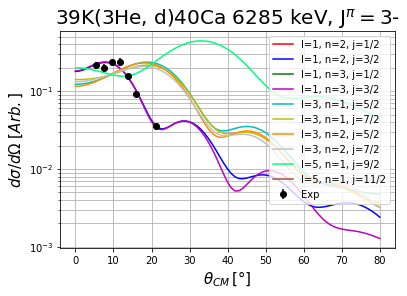


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



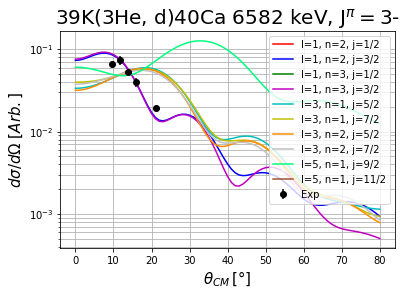


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



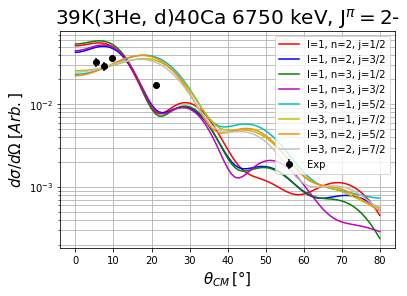


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



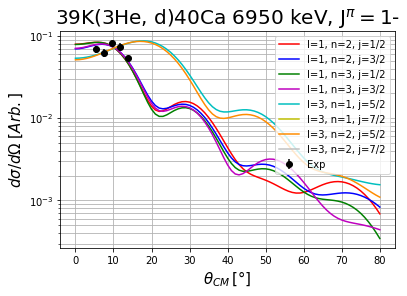


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



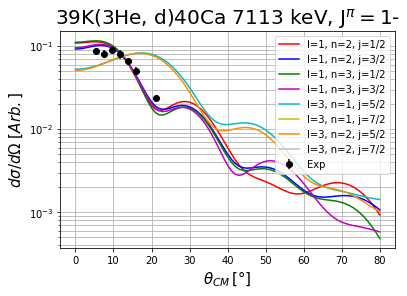


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



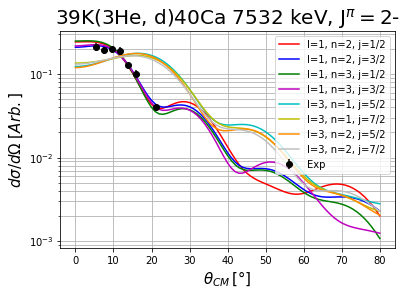


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



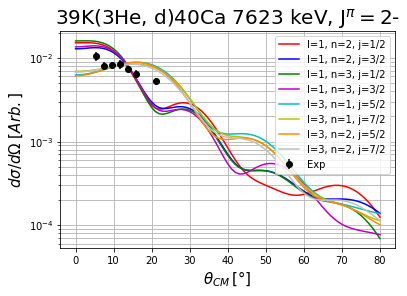

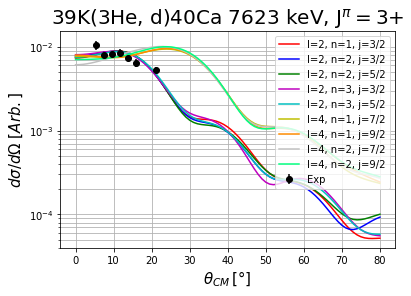

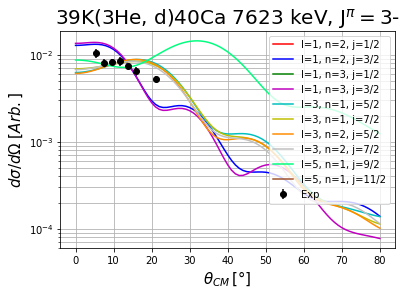

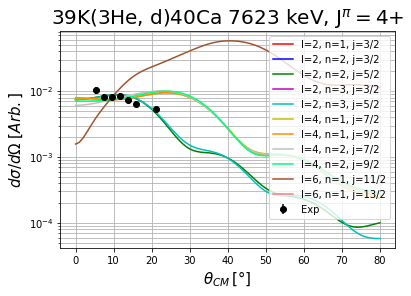


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



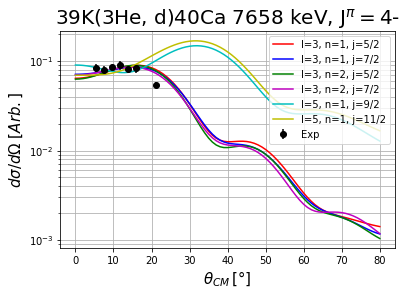


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



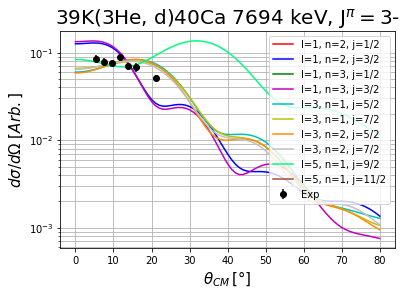


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



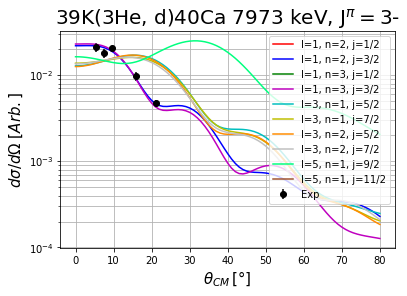


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



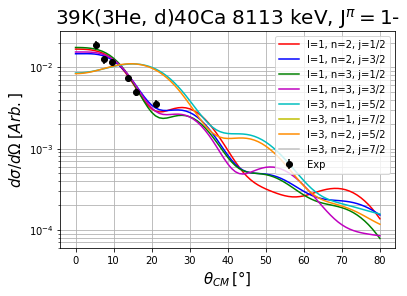


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



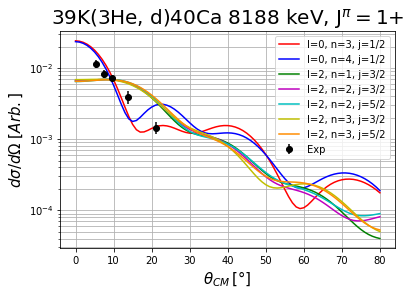

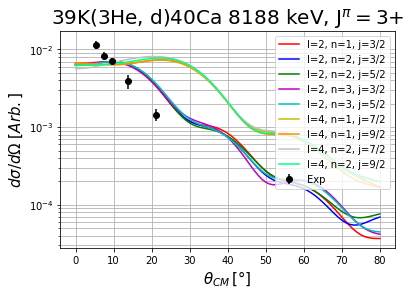

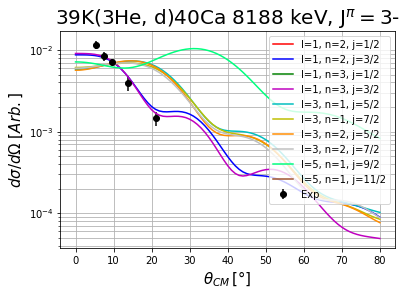

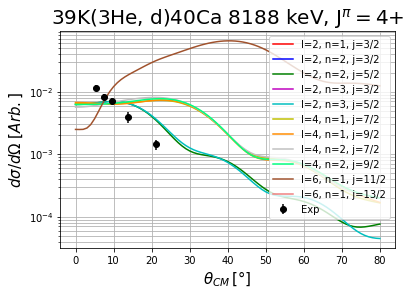

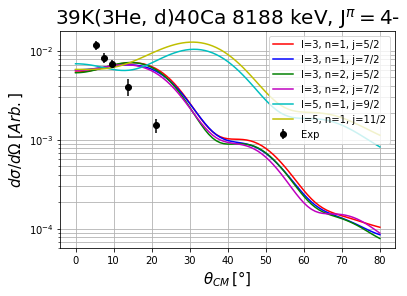

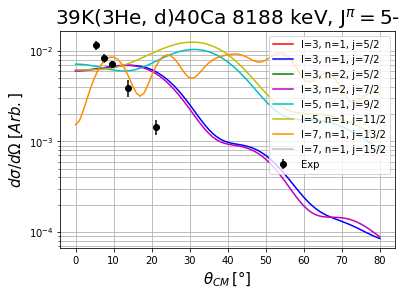


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



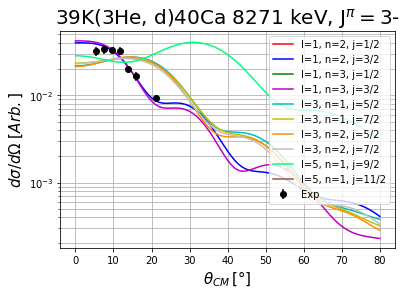


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



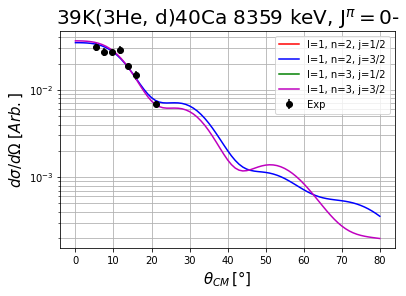

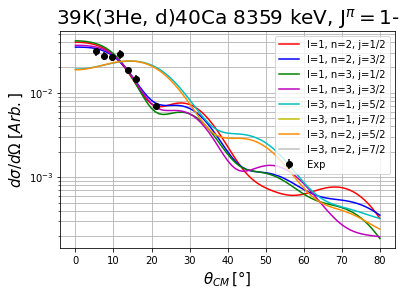

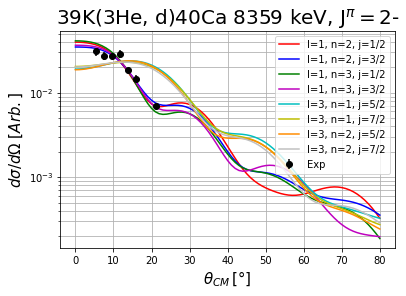


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



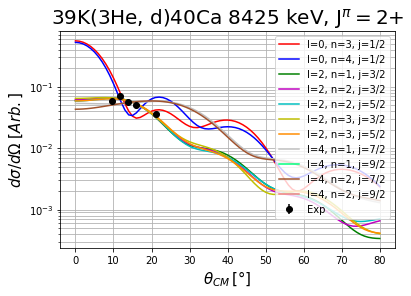

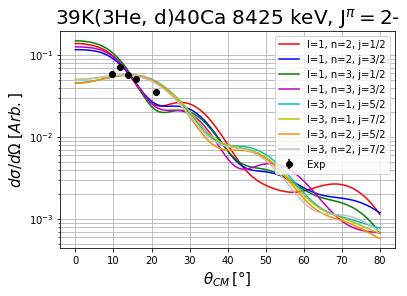


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



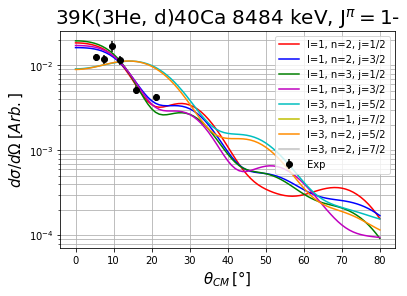

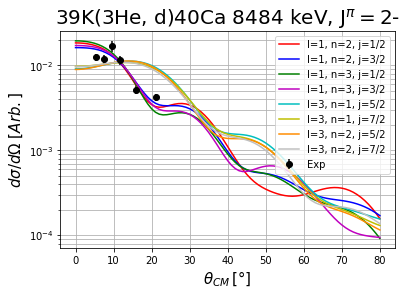

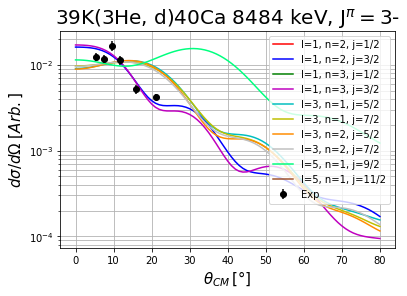

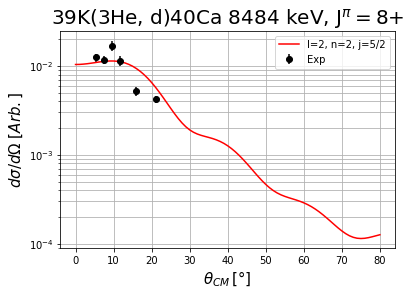


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



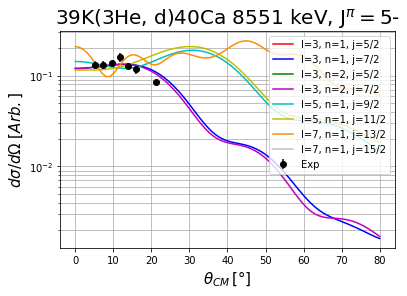


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



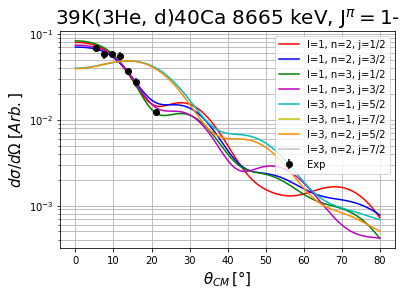


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



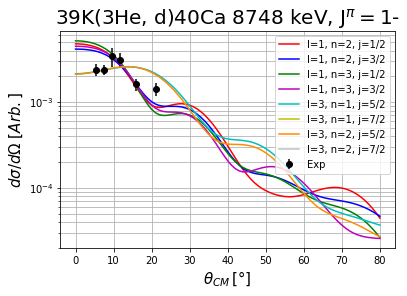

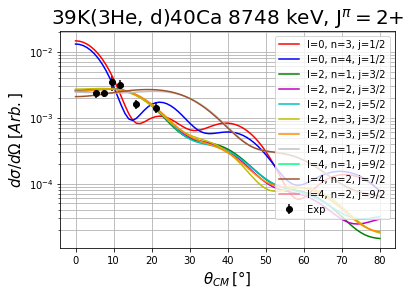

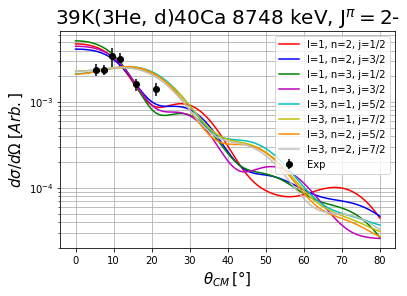


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



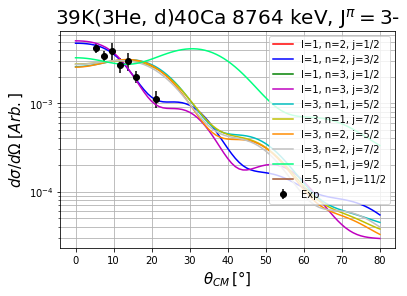


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



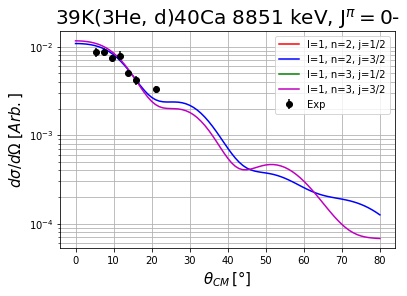

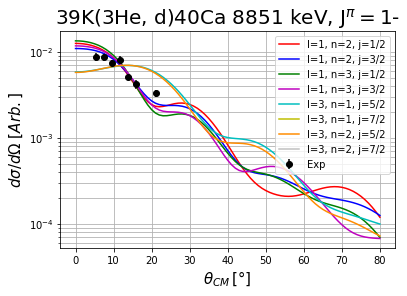

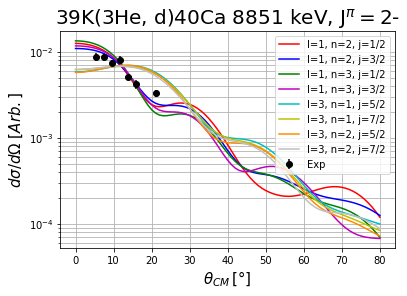

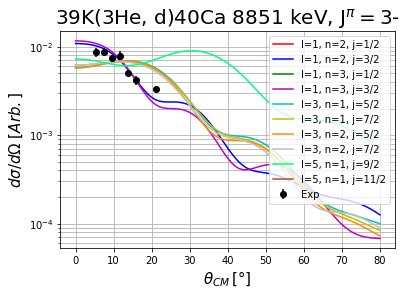

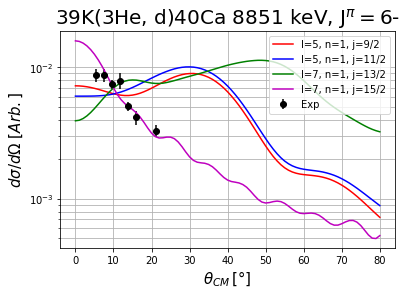

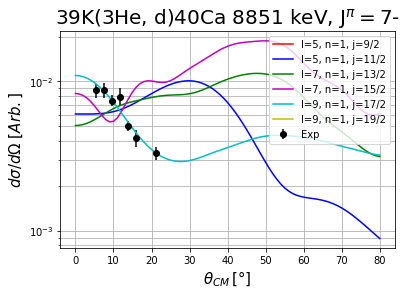

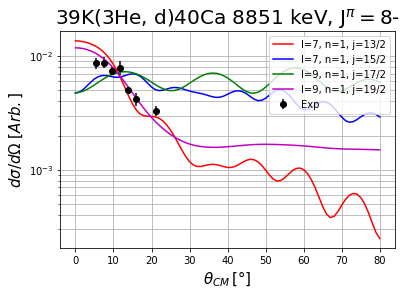


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



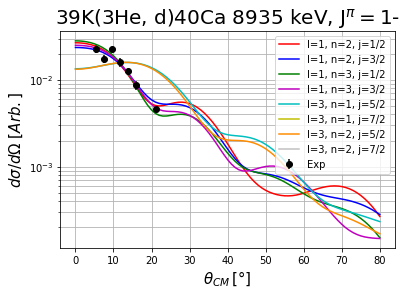

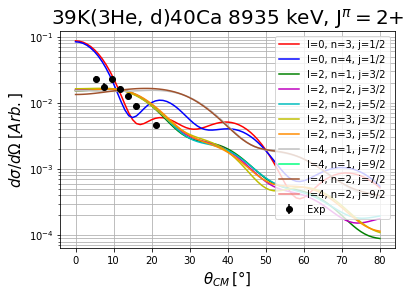


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



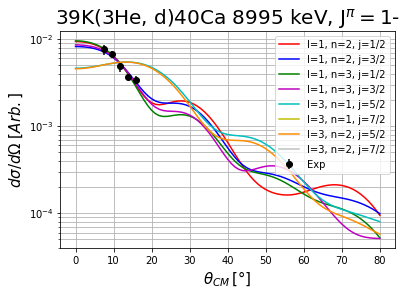

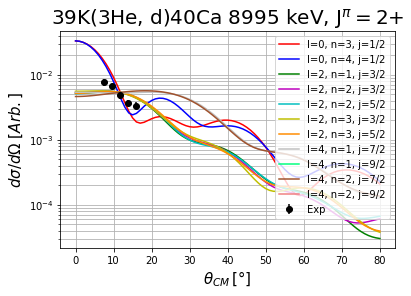


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



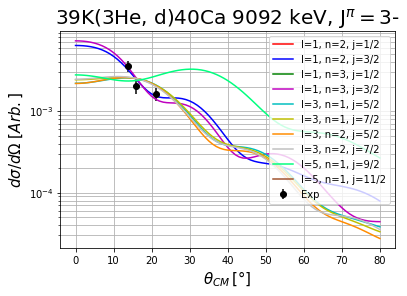


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



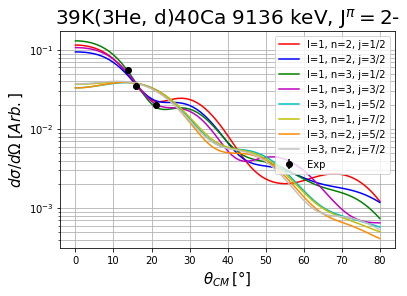

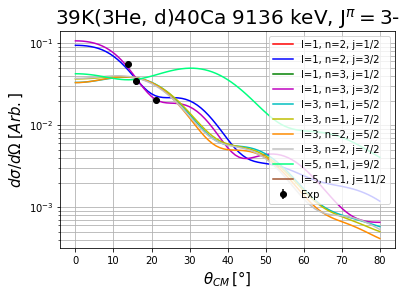


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



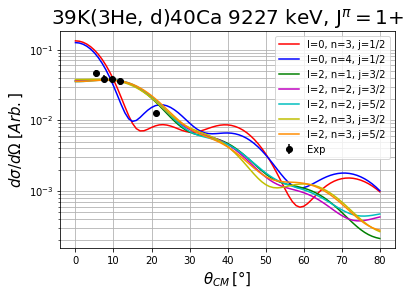

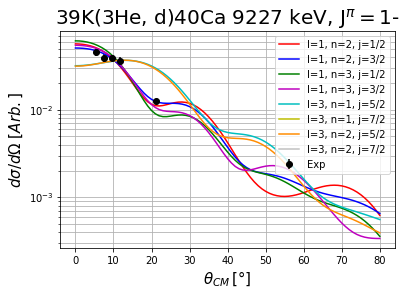

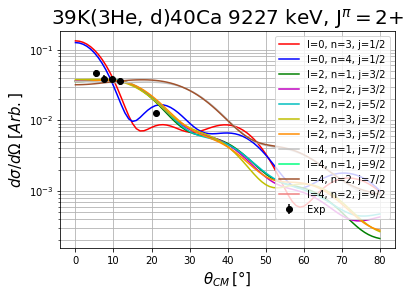


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



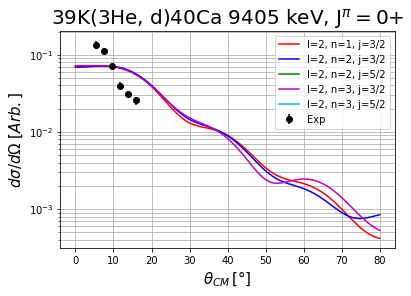

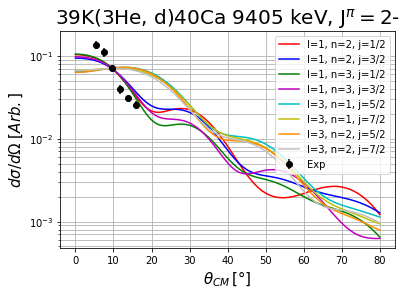


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



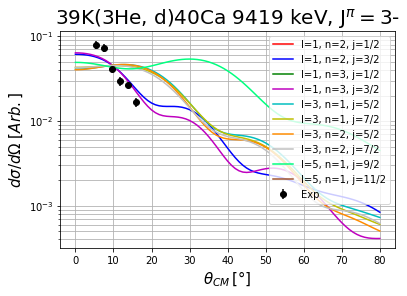


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



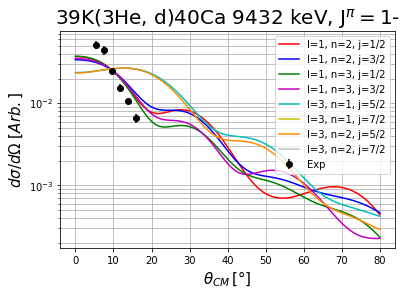

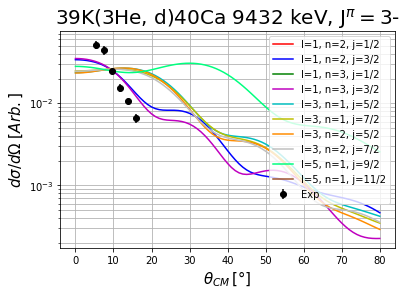

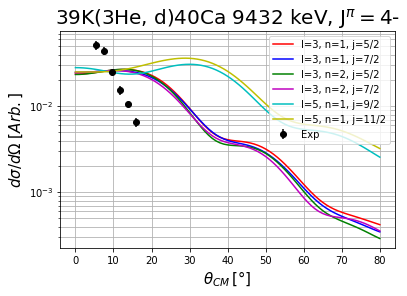


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



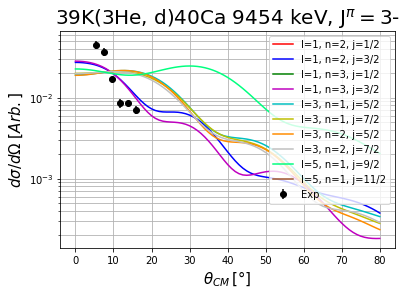


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



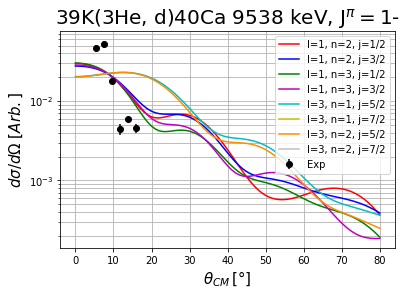


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



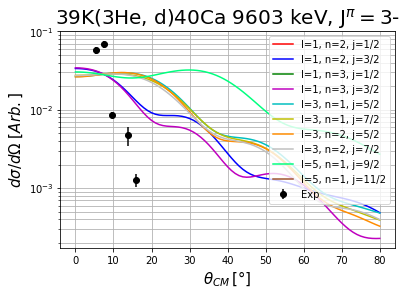


Scaling DWBA Models to Exp Cross-Section by Spectroscopic Factor:



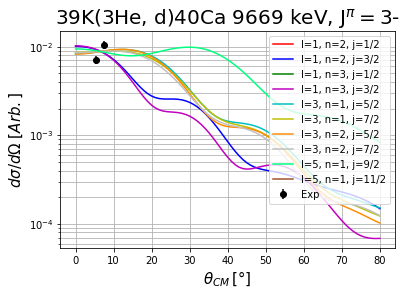

In [35]:
fresco.plot_transfer_dwbaScaled_exp_mult_all()

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Printing Cross Sections, C2S Parameters, CM Angles, ES Norm Parameter
</h1>

In [36]:
print('\nElastic Scattering:' + '\n\n')
print('CM Angles: ' + str(Peak_ES_Exp.angle_cm_reduced) + '\n')
print('Sigmas: ' + str(K39_ES.crosssection_ratio_wavg) + '\n')
print('Sigma Uncertainties: ' + str(K39_ES.crosssection_ratio_wavg_u) + '\n')
print('Norm Parameter: ' + str(K39_fresco_ES.norm_param) + '\n\n') # log10(ES_norm_factor)

print('\nTransfer:' + '\n\n')
print('CM Angles: ' + str(Peak_Transfer_Exp.angle_cm_reduced) + '\n\n')
for i in range(len(Peak_Transfer_Exp.objects)):
    print(str(Peak_Transfer_Exp.objects[i].ex_energy) + ' keV Sigmas: ' + str(Peak_Transfer_Exp.objects[i].crosssection_ratio_wavg) + '\n')
    print(str(Peak_Transfer_Exp.objects[i].ex_energy) + ' keV Sigma Uncertainties: ' + str(Peak_Transfer_Exp.objects[i].crosssection_ratio_wavg_u) + '\n')
    print(str(Peak_Transfer_Exp.objects[i].ex_energy) + ' keV C2S Parameter: ' + str(fresco.objects[i].C2S) + '\n') # C2St * C2Sp | ES_Norm taken into account
    print(str(Peak_Transfer_Exp.objects[i].ex_energy) + ' keV Jpi,l,n,j Values: ' + str(fresco.objects[i].Jpi_l_n_j_vals) + '\n\n')


Elastic Scattering:


CM Angles: [16.14783959536818, 21.516904854271722, 26.87448364691729, 32.21786132194121, 37.54442690185168, 42.851692789994416, 48.13731384838989, 53.39910569255153, 58.635062034887106, 62.80400098131934]

Sigmas: [0.01751816791772812, 0.013075728237005693, 0.010982742077481315, 0.011232311033701406, 0.007964211169759339, 0.00511237563848101, 0.004326839667244197, 0.003479101965331266, 0.001388754425583652, 0.0013441619981633473]

Sigma Uncertainties: [0.0023679048216059323, 0.00176820880242605, 0.0014841248144562486, 0.0015180033911444762, 0.0010764225376608347, 0.0005933346894246596, 0.0005024367060279225, 0.00040402675280600144, 0.00016289404409046635, 0.000157414500381566]

Norm Parameter: -1.558



Transfer:


CM Angles: [5.291442931238069, 7.407524551570462, 9.523111322305553, 11.638062860817262, 13.75223953549487, 15.865502631282327, 21.143763345398078]


4491 keV Sigmas: [0.0324006128096135, 0.02798656137340347, 0.0370831748500094, 0.04717131386234083, 0.

In [37]:
## Create .dat files for experimental cross-section data to use with pfunk
#for obj in Peak_Transfer_Exp.objects:
#    f_output = open('39K-3He-d_' + str(obj.ex_energy) + 'keV.dat', 'w')
#    f_output.write('theta\tsigma\terry\n')
#    for i in range(len(obj.fit_angle_cm_reduced)):
#        f_output.write('{:.3f}'.format(obj.fit_angle_cm_reduced[i]) + '\t')
#        f_output.write('{:.5f}'.format(obj.crosssection_ratio_wavg[i]) + '\t')
#        if (i != len(obj.fit_angle_cm_reduced) - 1):
#            f_output.write('{:.5f}'.format(obj.crosssection_ratio_wavg_u[i]) + '\n')
#        else:
#            f_output.write('{:.5f}'.format(obj.crosssection_ratio_wavg_u[i]))
#    f_output.close()

In [38]:
## Create a .dat file with C2S values
#f_output = open('C2S.dat', 'w')
#for obj in fresco.objects:
#    for i in obj.C2S:
#        f_output.write(str(i) + '\n')
#f_output.close()

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Energy Calibrations
</h1>

In [39]:
## Create .dat files with centroid data to use for MCMC energy calibrations (centroid scatter added to uncertainty, i.e. these are the correct centroid uncertainties - not the ones directly from the fit)
## Peak_Transfer_Exp.create_cal_files(angle [deg], sort_group [0 - num_sort_groups], calibration_levels [nominal ex_energy value], test_levels [nominal ex_energy value])

## 5 deg, Sort Group 1 (Runs 9, 10) - OXIDIZED
#Peak_Transfer_Exp.create_cal_files(5, 1, [4491,5614,7113,7532,7658,7694,9538], [5903,6025,6285,6931,8271,8359,8484,8551,8665,8851,8935,9227,9603,9669])
## 5 deg, Sort Group 2 (Run 11) - OXIDIZED
#Peak_Transfer_Exp.create_cal_files(5, 2, [4491,5614,6025,6750,7113,7532,7658,7694,9538], [5903,6285,6931,8271,8359,8484,8551,8665,8851,8935,9227,9603,9669])
## 5 deg, Sort Group 3 (Runs 83, 84, 85, 86, 87) - Testing close-lying states
#Peak_Transfer_Exp.create_cal_files(5, 3, [4491,5614,6025,6750,7532,8359,8551,8665,8851,9454,9538], [5903,6285,6931,6950,7113,7114,7658,7694,7973,8113,8188,8271,8484,8748,8764,8935,8938,9226,9227,9603,9605,9662,9669])
## 7 deg, Sort Group 4 (Runs 15, 16, 17, 18, 19, 20) - OXIDIZED
#Peak_Transfer_Exp.create_cal_files(7, 4, [4491,5614,6025,7113,7532,7658,7694,9538], [6285,6931,8113,8188,8271,8359,8484,8551,8665,8935,9603,9669])

##### DNP 2022 Calibration Points - [4491,5614,6025,7532,7658.7694,9454] #####
## 5 deg, Sort Group 3 (Runs 83, 84, 85, 86, 87)
#Peak_Transfer_Exp.create_cal_files(5, 3, [4491,5614,6025,7532,7658,7694,9454], [5903,6285,6750,6950,7113,7623,7973,8019,8113,8188,8271,8359,8484,8551,8665,8748,8764,8851,8935,9227,9538,9603,9669])

## 7 deg, Sort Group 5 (Runs 72, 75, 76, 77, 78)
#Peak_Transfer_Exp.create_cal_files(7, 5, [4491,5614,6025,7532,7658,7694,9454], [6285,6750,6950,7113,7623,7973,8019,8113,8188,8271,8359,8484,8551,8665,8748,8764,8851,8935,8995,9227,9538,9603,9669])

## 9 deg, Sort Group 6 (Run 23)
#Peak_Transfer_Exp.create_cal_files(9, 6, [4491,5614,6025,7532,7658,7694,9454], [6285,6582,6750,6950,7113,7623,7973,8019,8113,8188,8271,8359,8425,8484,8551,8665,8851,8935,8995,9227,9538,9603])

## 9 deg, Sort Group 7 (Runs 24, 25)
#Peak_Transfer_Exp.create_cal_files(9, 7, [4491,5614,6025,7532,7658,7694,9454], [6285,6582,6750,6950,7113,7623,7973,8019,8113,8188,8271,8359,8425,8551,8665,8851,8935,8995,9227,9538,9603])

## 9 deg, Sort Group 8 (Runs 26, 27)
#Peak_Transfer_Exp.create_cal_files(9, 8, [4491,5614,6025,7532,7658,7694,9454], [6285,6582,6750,6950,7113,7623,7973,8113,8188,8271,8359,8425,8551,8665,8748,8764,8851,8935,8995,9227,9538,9603])

## 11 deg Sort Group 9 (Runs 31, 32, 33)
#Peak_Transfer_Exp.create_cal_files(11, 9, [4491,5614,6025,7532,7658,7694,9454], [5903,6285,6582,6950,7113,7623,8271,8359,8425,8484,8551,8665,8748,8764,8851,8935,8995,9227,9538])

## 13 deg Sort Group 10 (Runs 39, 40, 41)
#Peak_Transfer_Exp.create_cal_files(13, 10, [4491,5614,6025,7532,7658,7694,9454], [5903,6285,6582,6950,7113,7623,8113,8188,8271,8359,8425,8551,8665,8764,8851,8935,9136,9538,9603])

## 13 deg Sort Group 11 (Run 42)
#Peak_Transfer_Exp.create_cal_files(13, 11, [4491,5614,6025,7532,7658,7694,9454], [6285,6582,6950,7113,7623,8271,8359,8425,8551,8665,8935])

## 13 deg Sort Group 12 (Runs 43, 44)
#Peak_Transfer_Exp.create_cal_files(13, 12, [4491,5614,6025,7532,7658,7694,9454], [5903,6285,6582,6950,7113,7623,8113,8188,8271,8359,8425,8551,8665,8764,8851,8935,8995,9136,9538])

## 13 deg Sort Group 13 (Runs 45, 47)
#Peak_Transfer_Exp.create_cal_files(13, 13, [4491,5614,6025,7532,7658,7694,9454], [5903,6285,6582,6950,7113,7623,8113,8271,8359,8425,8551,8665,8851,8935,8995,9092,9136,9538])

## 15 deg Sort Group 14 (Runs 55, 56, 57, 58, 59)
#Peak_Transfer_Exp.create_cal_files(15, 14, [4491,5614,6025,7532,7658,7694,9454], [5903,6285,6582,7113,7623,7973,8113,8271,8359,8425,8484,8551,8665,8748,8764,8851,8935,8995,9092,9136,9538,9603])

## 20 deg Sort Group 15 (Runs 60, 61, 64)
#Peak_Transfer_Exp.create_cal_files(20, 15, [4491,5614,6025,7532,7658,7694,9454], [5903,6285,6582,6750,7113,7623,7973,8113,8188,8271,8359,8425,8484,8551,8665,8748,8764,8851,8935,9092,9136,9227])

## 20 deg Sort Group 16 (Runs 65, 66)
#Peak_Transfer_Exp.create_cal_files(20, 16, [4491,5614,6025,7532,7658,7694,9454], [6285,6582,6750,7113,7623,7973,8113,8271,8359,8425,8484,8551,8665,8851,8935,9136,9227])

##### Gribble 8425 and 8748 Calibration Points (and removing 7658 and 7694 keV) #####
## 5 deg, Sort Group 3 (Runs 83, 84, 85, 86, 87)
#Peak_Transfer_Exp.create_cal_files(5, 3, [4491,5614,6025,7532,8748,9454], [5903,6285,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8484,8551,8665,8764,8851,8935,9227,9538,9603,9669])

## 7 deg, Sort Group 5 (Runs 72, 75, 76, 77, 78)
#Peak_Transfer_Exp.create_cal_files(7, 5, [4491,5614,6025,7532,8748,9454], [6285,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8484,8551,8665,8764,8851,8935,8995,9227,9538,9603,9669])

## 9 deg, Sort Group 6 (Run 23)
#Peak_Transfer_Exp.create_cal_files(9, 6, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8484,8551,8665,8851,8935,8995,9227,9538,9603])

## 9 deg, Sort Group 7 (Runs 24, 25)
#Peak_Transfer_Exp.create_cal_files(9, 7, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8851,8935,8995,9227,9538,9603])

## 9 deg, Sort Group 8 (Runs 26, 27)
#Peak_Transfer_Exp.create_cal_files(9, 8, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8748,8764,8851,8935,8995,9227,9538,9603])

## 11 deg Sort Group 9 (Runs 31, 32, 33)
#Peak_Transfer_Exp.create_cal_files(11, 9, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8271,8359,8484,8551,8665,8748,8764,8851,8935,8995,9227,9538])

## 13 deg Sort Group 10 (Runs 39, 40, 41)
#Peak_Transfer_Exp.create_cal_files(13, 10, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8188,8271,8359,8551,8665,8764,8851,8935,9136,9538,9603])

## 13 deg Sort Group 11 (Run 42)
#Peak_Transfer_Exp.create_cal_files(13, 11, [4491,5614,6025,7532,8425,9454], [6285,6582,6950,7113,7623,7658,7694,8271,8359,8551,8665,8935])

## 13 deg Sort Group 12 (Runs 43, 44)
#Peak_Transfer_Exp.create_cal_files(13, 12, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8188,8271,8359,8551,8665,8764,8851,8935,8995,9136,9538])

## 13 deg Sort Group 13 (Runs 45, 47)
#Peak_Transfer_Exp.create_cal_files(13, 13, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8271,8359,8551,8665,8851,8935,8995,9092,9136,9538])

## 15 deg Sort Group 14 (Runs 55, 56, 57, 58, 59)
#Peak_Transfer_Exp.create_cal_files(15, 14, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,7113,7623,7658,7694,7973,8113,8271,8359,8484,8551,8665,8748,8764,8851,8935,8995,9092,9136,9538,9603])

## 20 deg Sort Group 15 (Runs 60, 61, 64)
#Peak_Transfer_Exp.create_cal_files(20, 15, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6750,7113,7623,7658,7694,7973,8113,8188,8271,8359,8484,8551,8665,8748,8764,8851,8935,9092,9136,9227])

## 20 deg Sort Group 16 (Runs 65, 66)
#Peak_Transfer_Exp.create_cal_files(20, 16, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,7113,7623,7658,7694,7973,8113,8271,8359,8484,8551,8665,8851,8935,9136,9227])

##### Gribble 8425 Calibration Point and 8484 (and removing 7658 and 7694 keV) #####
## 5 deg, Sort Group 3 (Runs 83, 84, 85, 86, 87)
#Peak_Transfer_Exp.create_cal_files(5, 3, [4491,5614,6025,7532,8484,9454], [5903,6285,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8748,8764,8851,8935,9227,9538,9603,9669])

## 7 deg, Sort Group 5 (Runs 72, 75, 76, 77, 78)
#Peak_Transfer_Exp.create_cal_files(7, 5, [4491,5614,6025,7532,8484,9454], [6285,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8748,8764,8851,8935,8995,9227,9538,9603,9669])

## 9 deg, Sort Group 6 (Run 23)
#Peak_Transfer_Exp.create_cal_files(9, 6, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8484,8551,8665,8851,8935,8995,9227,9538,9603])

## 9 deg, Sort Group 7 (Runs 24, 25)
#Peak_Transfer_Exp.create_cal_files(9, 7, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8851,8935,8995,9227,9538,9603])

## 9 deg, Sort Group 8 (Runs 26, 27)
#Peak_Transfer_Exp.create_cal_files(9, 8, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8748,8764,8851,8935,8995,9227,9538,9603])

## 11 deg Sort Group 9 (Runs 31, 32, 33)
#Peak_Transfer_Exp.create_cal_files(11, 9, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8271,8359,8484,8551,8665,8748,8764,8851,8935,8995,9227,9538])

## 13 deg Sort Group 10 (Runs 39, 40, 41)
#Peak_Transfer_Exp.create_cal_files(13, 10, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8188,8271,8359,8551,8665,8764,8851,8935,9136,9538,9603])

## 13 deg Sort Group 11 (Run 42)
#Peak_Transfer_Exp.create_cal_files(13, 11, [4491,5614,6025,7532,8425,9454], [6285,6582,6950,7113,7623,7658,7694,8271,8359,8551,8665,8935])

## 13 deg Sort Group 12 (Runs 43, 44)
#Peak_Transfer_Exp.create_cal_files(13, 12, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8188,8271,8359,8551,8665,8764,8851,8935,8995,9136,9538])

## 13 deg Sort Group 13 (Runs 45, 47)
#Peak_Transfer_Exp.create_cal_files(13, 13, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8271,8359,8551,8665,8851,8935,8995,9092,9136,9538])

## 15 deg Sort Group 14 (Runs 55, 56, 57, 58, 59)
#Peak_Transfer_Exp.create_cal_files(15, 14, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,7113,7623,7658,7694,7973,8113,8271,8359,8484,8551,8665,8748,8764,8851,8935,8995,9092,9136,9538,9603])

## 20 deg Sort Group 15 (Runs 60, 61, 64)
#Peak_Transfer_Exp.create_cal_files(20, 15, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6750,7113,7623,7658,7694,7973,8113,8188,8271,8359,8484,8551,8665,8748,8764,8851,8935,9092,9136,9227])

## 20 deg Sort Group 16 (Runs 65, 66)
#Peak_Transfer_Exp.create_cal_files(20, 16, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,7113,7623,7658,7694,7973,8113,8271,8359,8484,8551,8665,8851,8935,9136,9227])

##### Gribble 8425 Calibration Point and 8484 as a substitute at 5 and 7 deg. 9136 as a substitute for 9454 at 20 deg. #####
## 5 deg, Sort Group 3 (Runs 83, 84, 85, 86, 87)
#Peak_Transfer_Exp.create_cal_files(5, 3, [4491,5614,6025,7532,8484,9454], [5903,6285,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8748,8764,8851,8935,9227,9405,9419,9432,9538,9603,9669])

## 7 deg, Sort Group 5 (Runs 72, 75, 76, 77, 78)
#Peak_Transfer_Exp.create_cal_files(7, 5, [4491,5614,6025,7532,8484,9454], [6285,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8748,8764,8851,8935,8995,9227,9405,9419,9432,9538,9603,9669])

## 9 deg, Sort Group 6 (Run 23)
#Peak_Transfer_Exp.create_cal_files(9, 6, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8484,8551,8665,8851,8935,8995,9227,9405,9419,9432,9538,9603])

## 9 deg, Sort Group 7 (Runs 24, 25)
#Peak_Transfer_Exp.create_cal_files(9, 7, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8851,8935,8995,9227,9405,9419,9432,9538,9603])

## 9 deg, Sort Group 8 (Runs 26, 27)
#Peak_Transfer_Exp.create_cal_files(9, 8, [4491,5614,6025,7532,8425,9454], [6285,6582,6750,6950,7113,7623,7658,7694,7973,8113,8188,8271,8359,8551,8665,8748,8764,8851,8935,8995,9227,9405,9419,9432,9538,9603])

## 11 deg Sort Group 9 (Runs 31, 32, 33)
#Peak_Transfer_Exp.create_cal_files(11, 9, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8271,8359,8484,8551,8665,8748,8764,8851,8935,8995,9227,9405,9419,9432,9538])

## 13 deg Sort Group 10 (Runs 39, 40, 41)
#Peak_Transfer_Exp.create_cal_files(13, 10, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8188,8271,8359,8551,8665,8764,8851,8935,9136,9405,9419,9432,9538,9603])

## 13 deg Sort Group 11 (Run 42)
#Peak_Transfer_Exp.create_cal_files(13, 11, [4491,5614,6025,7532,8425,9454], [6285,6582,6950,7113,7623,7658,7694,8271,8359,8551,8665,8935,9405,9419,9432,])

## 13 deg Sort Group 12 (Runs 43, 44)
#Peak_Transfer_Exp.create_cal_files(13, 12, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8188,8271,8359,8551,8665,8764,8851,8935,8995,9136,9405,9419,9432,9538])

## 13 deg Sort Group 13 (Runs 45, 47)
#Peak_Transfer_Exp.create_cal_files(13, 13, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,6950,7113,7623,7658,7694,8113,8271,8359,8551,8665,8851,8935,8995,9092,9136,9405,9419,9432,9538])

## 15 deg Sort Group 14 (Runs 55, 56, 57, 58, 59)
#Peak_Transfer_Exp.create_cal_files(15, 14, [4491,5614,6025,7532,8425,9454], [5903,6285,6582,7113,7623,7658,7694,7973,8113,8271,8359,8484,8551,8665,8748,8764,8851,8935,8995,9092,9136,9405,9419,9432,9538,9603])

## 20 deg Sort Group 15 (Runs 60, 61, 64)
#Peak_Transfer_Exp.create_cal_files(20, 15, [4491,5614,6025,7532,8425,9136], [5903,6285,6582,6750,7113,7623,7658,7694,7973,8113,8188,8271,8359,8484,8551,8665,8748,8764,8851,8935,9092,9227])

## 20 deg Sort Group 16 (Runs 65, 66)
#Peak_Transfer_Exp.create_cal_files(20, 16, [4491,5614,6025,7532,8425,9136], [6285,6582,6750,7113,7623,7658,7694,7973,8113,8271,8359,8484,8551,8665,8851,8935,9227])

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Angular Momentum Mixing $\chi^{2}$-Minimization
</h1>

In [40]:
# # C2S and alpha parameter naive guesses. Nelder-Mead algorithm can handle these, but BFGS cannot.
# gC2S = 0.5
# galpha = 0.5

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    6025 keV
</h2>

         Current function value: 4.231580
         Iterations: 5
         Function evaluations: 141
         Gradient evaluations: 43
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.003286365301796145, 0.2039299696891103
C2St = 0.08996627722250505

C2St (l=1) = 0.018
uC2St (l=1) = 0.0011
ufrac (l=1) = 0.05893101773507274

C2St (l=3) = 0.072
uC2St (l=3) = 0.0064
ufrac (l=3) = 0.08947490948187607

Reduced Chi2 = 0.846

Hessian Inverse:
[[ 3.51856271e-08 -3.28929266e-06]
 [-3.28929266e-06  3.47062152e-04]]


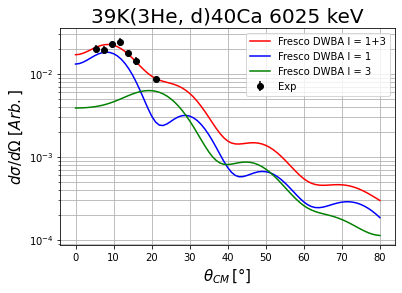

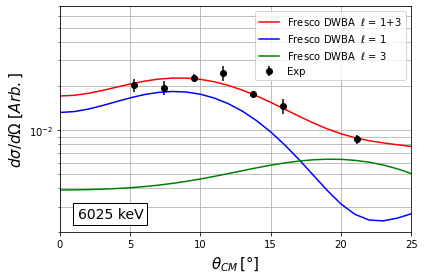

In [41]:
Ca40_6025_fresco.calc_C2S_alpha_two_l(Ca40_6025keV, 1, 5, 1, 3, [0.003, 0.2], showplot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=7*10**(-2))#, saveFig=True)
#Ca40_6025_fresco.C2S_l1, Ca40_6025_fresco.C2S_l2, Ca40_6025_fresco.C2St_l1, Ca40_6025_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_6025keV, Ca40_6025_fresco, 1, 5, 1, 3, [0.003, 0.2], plot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=7*10**(-2))#, saveFig=True)
#Ca40_6025_fresco.C2S_l1, Ca40_6025_fresco.C2S_l2, Ca40_6025_fresco.C2St_l1, Ca40_6025_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_6025keV, Ca40_6025_fresco, 1, 5, 1, 3, [gC2S, galpha], plot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=7*10**(-2))#, saveFig=True)

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    6582 keV
</h2>

         Current function value: 5.471363
         Iterations: 4
         Function evaluations: 150
         Gradient evaluations: 46
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.004262948567437466, 0.40634617918887594
C2St = 0.11670084649255157

C2St (l=1) = 0.047
uC2St (l=1) = 0.0026
ufrac (l=1) = 0.05475435175725004

C2St (l=3) = 0.069
uC2St (l=3) = 0.0087
ufrac (l=3) = 0.12598590314876068

Reduced Chi2 = 1.824

Hessian Inverse:
[[ 6.56272781e-08 -8.75323055e-06]
 [-8.75323055e-06  1.28913167e-03]]


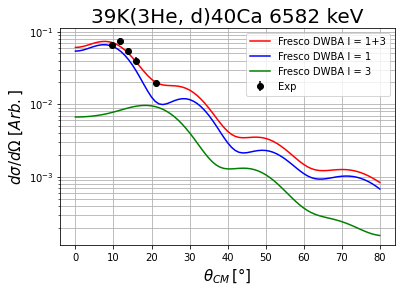

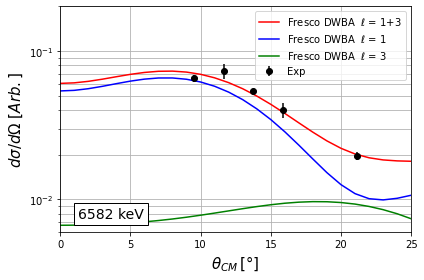

In [42]:
Ca40_6582_fresco.calc_C2S_alpha_two_l(Ca40_6582keV, 1, 5, 1, 3, [0.004, 0.4], showplot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=2*10**(-1))
#Ca40_6582_fresco.C2S_l1, Ca40_6582_fresco.C2S_l2, Ca40_6582_fresco.C2St_l1, Ca40_6582_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_6582keV, Ca40_6582_fresco, 1, 5, 1, 3, [0.004, 0.4], plot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=2*10**(-1))
#Ca40_6582_fresco.C2S_l1, Ca40_6582_fresco.C2S_l2, Ca40_6582_fresco.C2St_l1, Ca40_6582_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_6582keV, Ca40_6582_fresco, 1, 5, 1, 3, [gC2S, galpha], plot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=2*10**(-1))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    6750 keV
</h2>

         Current function value: 4.341270
         Iterations: 3
         Function evaluations: 164
         Gradient evaluations: 51
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.005797786088111247, 0.1517886053616177
C2St = 0.1587179703348009

C2St (l=1) = 0.024
uC2St (l=1) = 0.0019
ufrac (l=1) = 0.07703283684230745

C2St (l=3) = 0.135
uC2St (l=3) = 0.0113
ufrac (l=3) = 0.08421064172402476

Reduced Chi2 = 2.171

Hessian Inverse:
[[ 1.04713043e-07 -4.70177504e-06]
 [-4.70177504e-06  2.72299340e-04]]


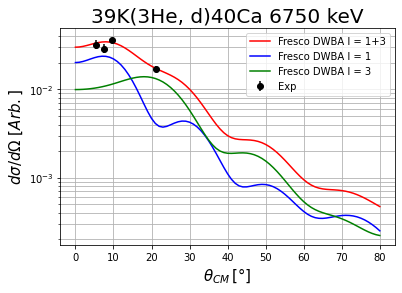

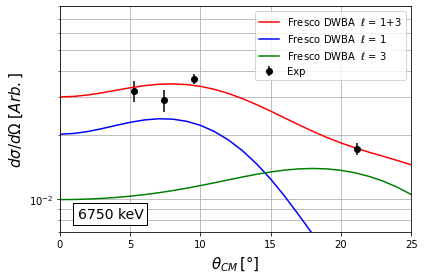

In [43]:
Ca40_6750_fresco.calc_C2S_alpha_two_l(Ca40_6750keV, 1, 5, 1, 3, [0.006, 0.15], showplot=True, plotZoom=True, plotymin=7*10**(-3), plotymax=8*10**(-2))
#Ca40_6750_fresco.C2S_l1, Ca40_6750_fresco.C2S_l2, Ca40_6750_fresco.C2St_l1, Ca40_6750_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_6750keV, Ca40_6750_fresco, 1, 5, 1, 3, [0.006, 0.15], plot=True, plotZoom=True, plotymin=7*10**(-3), plotymax=8*10**(-2))
#Ca40_6750_fresco.C2S_l1, Ca40_6750_fresco.C2S_l2, Ca40_6750_fresco.C2St_l1, Ca40_6750_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_6750keV, Ca40_6750_fresco, 1, 5, 1, 3, [gC2S, galpha], plot=True, plotZoom=True, plotymin=7*10**(-3), plotymax=8*10**(-2))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    7113 keV
</h2>

Optimization terminated successfully.
         Current function value: 4.667864
         Iterations: 7
         Function evaluations: 33
         Gradient evaluations: 11
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.010300176982585042, 0.531005115486444
C2St = 0.28197369822205887

C2St (l=1) = 0.150
uC2St (l=1) = 0.0080
ufrac (l=1) = 0.05354035695441166

C2St (l=3) = 0.132
uC2St (l=3) = 0.0228
ufrac (l=3) = 0.17217900796521274

Reduced Chi2 = 0.934

Hessian Inverse:
[[ 4.41724900e-07 -3.12876605e-05]
 [-3.12876605e-05  2.38494550e-03]]


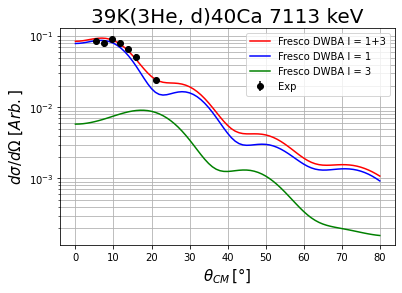

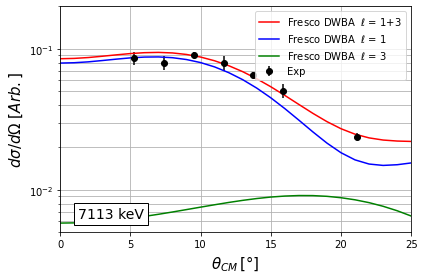

In [44]:
Ca40_7113_fresco.calc_C2S_alpha_two_l(Ca40_7113keV, 1, 4, 1, 3, [0.01, 0.53], showplot=True, plotZoom=True, plotymin=5*10**(-3), plotymax=2*10**(-1))
#Ca40_7113_fresco.C2S_l1, Ca40_7113_fresco.C2S_l2, Ca40_7113_fresco.C2St_l1, Ca40_7113_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_7113keV, Ca40_7113_fresco, 1, 4, 1, 3, [0.01, 0.53], plot=True, plotZoom=True, plotymin=5*10**(-3), plotymax=2*10**(-1))
#Ca40_7113_fresco.C2S_l1, Ca40_7113_fresco.C2S_l2, Ca40_7113_fresco.C2St_l1, Ca40_7113_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_7113keV, Ca40_7113_fresco, 1, 4, 1, 3, [gC2S, galpha], plot=True, plotZoom=True, plotymin=5*10**(-3), plotymax=2*10**(-1))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    7623 keV (1+3)
</h2>

         Current function value: 3.025597
         Iterations: 4
         Function evaluations: 129
         Gradient evaluations: 39
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0015401543610342198, 0.11272690232268696
C2St = 0.04216267562663362

C2St (l=1) = 0.005
uC2St (l=1) = 0.0007
ufrac (l=1) = 0.1398084187152834

C2St (l=3) = 0.037
uC2St (l=3) = 0.0034
ufrac (l=3) = 0.09030265815376513

Reduced Chi2 = 0.605

Hessian Inverse:
[[ 8.07410289e-09 -1.71673293e-06]
 [-1.71673293e-06  4.35011292e-04]]


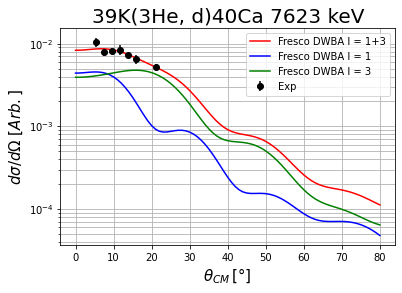

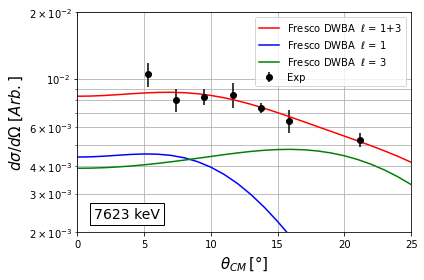

In [45]:
# if returnResult = true, the method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
Ca40_7623_1plus3_data = Ca40_7623_fresco.calc_C2S_alpha_two_l(Ca40_7623keV, 1, 5, 1, 3, [0.0015, 0.11], showplot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=2*10**(-2), returnResult=True)
#Ca40_7623_fresco.C2S_l1, Ca40_7623_fresco.C2S_l2, Ca40_7623_fresco.C2St_l1, Ca40_7623_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_7623keV, Ca40_7623_fresco, 1, 5, 1, 3, [0.0015, 0.11], plot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=2*10**(-2))
#Ca40_7623_fresco.C2S_l1, Ca40_7623_fresco.C2S_l2, Ca40_7623_fresco.C2St_l1, Ca40_7623_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_7623keV, Ca40_7623_fresco, 1, 5, 1, 3, [gC2S, galpha], plot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=2*10**(-2))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    7623 keV (2+4)
</h2>

         Current function value: 8.454070
         Iterations: 6
         Function evaluations: 90
         Gradient evaluations: 26
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0014434075216000829, 0.17127772767064522
C2St = 0.039514171222033295

C2St (l=2) = 0.007
uC2St (l=2) = 0.0007
ufrac (l=2) = 0.09979381190147152

C2St (l=4) = 0.033
uC2St (l=4) = 0.0095
ufrac (l=4) = 0.29044011022273447

Reduced Chi2 = 1.691

Hessian Inverse:
[[ 1.04212282e-07 -1.70669530e-05]
 [-1.70669530e-05  2.82572097e-03]]


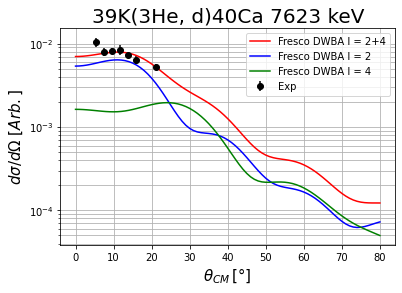

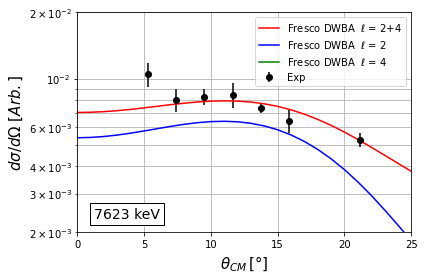

In [46]:
# if returnResult = true, the method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
Ca40_7623_2plus4_data = Ca40_7623_fresco.calc_C2S_alpha_two_l(Ca40_7623keV, 10, 14, 2, 4, [0.0014, 0.17], showplot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=2*10**(-2), updateResult=False, returnResult=True)
#Ca40_7623_fresco_C2S_l1, Ca40_7623_fresco_C2S_l2, Ca40_7623_fresco_C2St_l1, Ca40_7623_fresco_C2St_l2 = calc_C2S_alpha_two_l(Ca40_7623keV, Ca40_7623_fresco, 10, 14, 2, 4, [0.0014, 0.17], plot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=2*10**(-2))
#Ca40_7623_fresco_C2S_l1, Ca40_7623_fresco_C2S_l2, Ca40_7623_fresco_C2St_l1, Ca40_7623_fresco_C2St_l2 = calc_C2S_alpha_two_l(Ca40_7623keV, Ca40_7623_fresco, 10, 14, 2, 4, [gC2S, galpha], plot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=2*10**(-2))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    7623 keV Options
</h2>

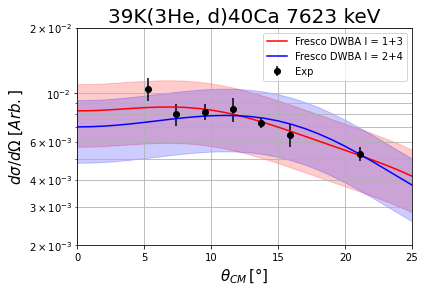

In [47]:
# Comparing l=1+3 and l=2+4 with systematic uncertainty included

# if returnResult = true, the calc_C2S_alpha_two_l() method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
#C2S_7623_1plus3 = Ca40_7623_1plus3_data[0]
#alpha_7623_1plus3 = Ca40_7623_1plus3_data[1]
frescoSigmaScaled_7623_1plus3 = Ca40_7623_1plus3_data[2]
#C2S_7623_2plus4 = Ca40_7623_2plus4_data[0]
#alpha_7623_2plus4 = Ca40_7623_2plus4_data[1]
frescoSigmaScaled_7623_2plus4 = Ca40_7623_2plus4_data[2]

frescoSigmaScaled_7623_1plus3_upper = []
frescoSigmaScaled_7623_1plus3_lower = []
for i in frescoSigmaScaled_7623_1plus3:
    frescoSigmaScaled_7623_1plus3_upper.append(i + (i * 0.32))
    frescoSigmaScaled_7623_1plus3_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_7623_2plus4_upper = []
frescoSigmaScaled_7623_2plus4_lower = []
for i in frescoSigmaScaled_7623_2plus4:
    frescoSigmaScaled_7623_2plus4_upper.append(i + (i * 0.32))
    frescoSigmaScaled_7623_2plus4_lower.append(i - (i * 0.32))
    
ax = py.subplot(111)
plt.errorbar(Ca40_7623keV.fit_angle_cm_reduced, Ca40_7623keV.crosssection_ratio_wavg, yerr=Ca40_7623keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_7623_fresco.theta[1], frescoSigmaScaled_7623_1plus3, c = 'r', label = 'Fresco DWBA l = ' + str(1) + '+' + str(3))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_7623_1plus3_lower, frescoSigmaScaled_7623_1plus3_upper, color = 'r', alpha=0.2)
plt.plot(Ca40_7623_fresco.theta[10], frescoSigmaScaled_7623_2plus4, c = 'b', label = 'Fresco DWBA l = ' + str(2) + '+' + str(4))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_7623_2plus4_lower, frescoSigmaScaled_7623_2plus4_upper, color = 'b', alpha=0.2)
#plt.plot(Ca40_7623_fresco.theta[10], Ca40_7623_fresco.s_factor_cubic_scaled_dwba_cross[10], c = 'g', label = 'Fresco DWBA l = ' + str(2))
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_7623_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,25)
plt.ylim(2*10**-3, 2*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    7658 keV (3+5?)
</h2>

         Current function value: 32.606365
         Iterations: 239
         Function evaluations: 1046
         Gradient evaluations: 345
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 9.1356882323907e-05, 148.0499644040662
C2St = 0.002500951004090847

C2St (l=3) = 0.370
uC2St (l=3) = 0.0182
ufrac (l=3) = 0.04915328820964038

C2St (l=5) = -0.368
uC2St (l=5) = -0.0176
ufrac (l=5) = 0.04793637091305976

Reduced Chi2 = 6.521

Hessian Inverse:
[[ 3.39944859e-09 -5.36388291e-03]
 [-5.36388291e-03  8.47331338e+03]]


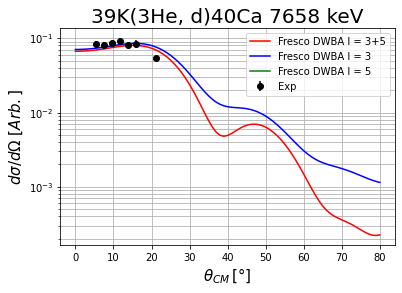

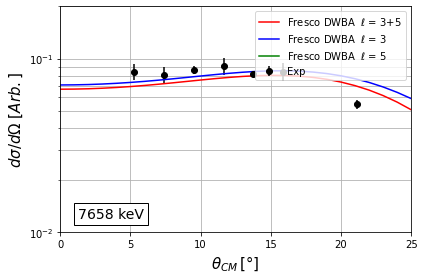

In [48]:
Ca40_7658_fresco.calc_C2S_alpha_two_l(Ca40_7658keV, 1, 5, 3, 5, [0.0009, 1], showplot=True, plotZoom=True, plotymin=1*10**(-2), plotymax=2*10**(-1), updateResult=False)
#Ca40_7658_fresco_C2S_l1, Ca40_7658_fresco_C2S_l2, Ca40_7658_fresco_C2St_l1, Ca40_7658_fresco_C2St_l2 = calc_C2S_alpha_two_l(Ca40_7658keV, Ca40_7658_fresco, 1, 5, 3, 5, [0.0009, 1], plot=True, plotZoom=True, plotymin=1*10**(-2), plotymax=2*10**(-1))
#Ca40_7658_fresco_C2S_l1, Ca40_7658_fresco_C2S_l2, Ca40_7658_fresco_C2St_l1, Ca40_7658_fresco_C2St_l2 = calc_C2S_alpha_two_l(Ca40_7658keV, Ca40_7658_fresco, 1, 5, 3, 5, [gC2S, galpha], plot=True, plotZoom=True, plotymin=1*10**(-2), plotymax=2*10**(-1))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    7694 keV
</h2>

         Current function value: 2.693112
         Iterations: 6
         Function evaluations: 118
         Gradient evaluations: 36
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.011171523922280319, 0.08732330082379264
C2St = 0.3058273581577824

C2St (l=1) = 0.027
uC2St (l=1) = 0.0035
ufrac (l=1) = 0.13255451908446406

C2St (l=3) = 0.279
uC2St (l=3) = 0.0199
ufrac (l=3) = 0.0711674260302448

Reduced Chi2 = 0.539

Hessian Inverse:
[[ 2.34546592e-07 -6.38178927e-06]
 [-6.38178927e-06  2.06566288e-04]]


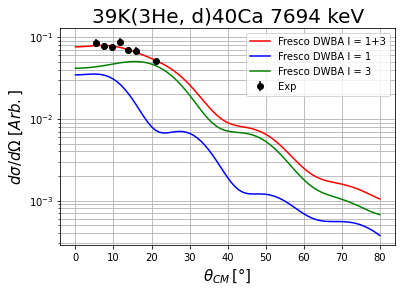

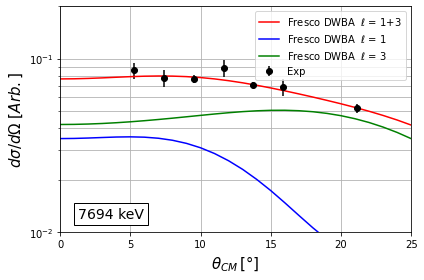

In [49]:
Ca40_7694_fresco.calc_C2S_alpha_two_l(Ca40_7694keV, 1, 5, 1, 3, [0.01, 0.09], showplot=True, plotZoom=True, plotymin=1*10**(-2), plotymax=2*10**(-1))
#Ca40_7694_fresco.C2S_l1, Ca40_7694_fresco.C2S_l2, Ca40_7694_fresco.C2St_l1, Ca40_7694_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_7694keV, Ca40_7694_fresco, 1, 5, 1, 3, [0.01, 0.09], plot=True, plotZoom=True, plotymin=1*10**(-2), plotymax=2*10**(-1))
#Ca40_7694_fresco.C2S_l1, Ca40_7694_fresco.C2S_l2, Ca40_7694_fresco.C2St_l1, Ca40_7694_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_7694keV, Ca40_7694_fresco, 1, 5, 1, 3, [gC2S, galpha], plot=True, plotZoom=True, plotymin=1*10**(-2), plotymax=2*10**(-1))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8188 keV
</h2>

         Current function value: 5.153313
         Iterations: 3
         Function evaluations: 108
         Gradient evaluations: 32
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0008263109874058247, 0.7325769833756006
C2St = 0.022620772962860858

C2St (l=0) = 0.017
uC2St (l=0) = 0.0017
ufrac (l=0) = 0.10172775930999359

C2St (l=2) = 0.006
uC2St (l=2) = 0.0014
ufrac (l=2) = 0.2338692364912964

Reduced Chi2 = 1.718

Hessian Inverse:
[[1.10362681e-09 4.39157362e-08]
 [4.39157362e-08 3.70378586e-03]]


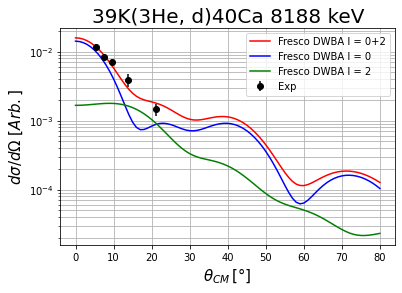

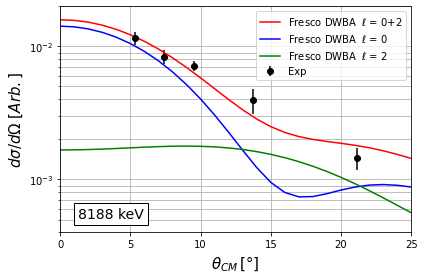

In [50]:
Ca40_8188_0plus2_data = Ca40_8188_fresco.calc_C2S_alpha_two_l(Ca40_8188keV, 0, 4, 0, 2, [0.001, 0.73], showplot=True, plotZoom=True, plotymin=4*10**(-4), plotymax=2*10**(-2), returnResult = True)#, saveFig=True)

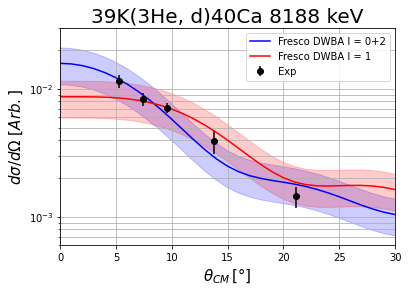

In [51]:
# Comparing l=1 and l=0+2 with systematic uncertainty included

# if returnResult = true, the calc_C2S_alpha_two_l() method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
frescoSigmaScaled_8188_0plus2 = Ca40_8188_0plus2_data[2]
    
frescoSigmaScaled_8188_0plus2_upper = []
frescoSigmaScaled_8188_0plus2_lower = []
for i in frescoSigmaScaled_8188_0plus2:
    frescoSigmaScaled_8188_0plus2_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8188_0plus2_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_8188_1_upper = []
frescoSigmaScaled_8188_1_lower = []
for i in Ca40_8188_fresco.s_factor_cubic_scaled_dwba_cross[17]:
    frescoSigmaScaled_8188_1_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8188_1_lower.append(i - (i * 0.32))
    
ax = py.subplot(111)
plt.errorbar(Ca40_8188keV.fit_angle_cm_reduced, Ca40_8188keV.crosssection_ratio_wavg, yerr=Ca40_8188keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')

plt.plot(Ca40_8188_fresco.theta[0], frescoSigmaScaled_8188_0plus2, c = 'b', label = 'Fresco DWBA l = ' + str(0) + '+' + str(2))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8188_0plus2_lower, frescoSigmaScaled_8188_0plus2_upper, color = 'b', alpha=0.2)

plt.plot(Ca40_8188_fresco.theta[17], Ca40_8188_fresco.s_factor_cubic_scaled_dwba_cross[17], c = 'r', label = 'Fresco DWBA l = ' + str(1))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8188_1_lower, frescoSigmaScaled_8188_1_upper, color = 'r', alpha=0.2)

plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_8188_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,30)
#plt.xlim(0,60)
plt.ylim(6*10**-4, 3*10**-2)
#plt.ylim(1*10**-3, 1*10**-1)
#plt.ylim(5*10**-3, 3*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8425 keV
</h2>

         Current function value: 6.150109
         Iterations: 5
         Function evaluations: 155
         Gradient evaluations: 48
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.010333191191458264, 0.131932462554638
C2St = 0.28287748255368705

C2St (l=1) = 0.037
uC2St (l=1) = 0.0059
ufrac (l=1) = 0.15719893602994636

C2St (l=3) = 0.246
uC2St (l=3) = 0.0209
ufrac (l=3) = 0.08502964009693484

Reduced Chi2 = 2.050

Hessian Inverse:
[[ 2.31342210e-07 -1.12744992e-05]
 [-1.12744992e-05  6.50980920e-04]]


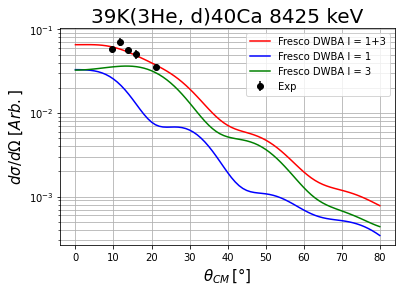

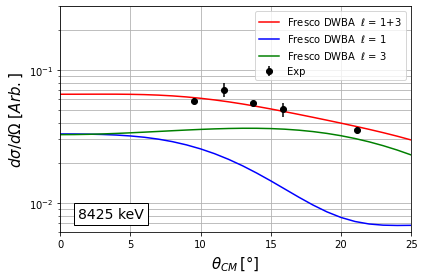

In [52]:
Ca40_8425_1plus3_data = Ca40_8425_fresco.calc_C2S_alpha_two_l(Ca40_8425keV, 12, 16, 1, 3, [0.01, 0.13], showplot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=3*10**(-1), returnResult = True)#, saveFig=True)
#Ca40_8425_fresco.calc_C2S_alpha_two_l(Ca40_8425keV, 1, 5, 1, 3, [0.01, 0.13], showplot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=3*10**(-1))#, saveFig=True)
#Ca40_8425_fresco.C2S_l1, Ca40_8425_fresco.C2S_l2, Ca40_8425_fresco.C2St_l1, Ca40_8425_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_8425keV, Ca40_8425_fresco, 1, 5, 1, 3, [0.01, 0.13], plot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=3*10**(-1))#, saveFig=True)
#Ca40_8425_fresco.C2S_l1, Ca40_8425_fresco.C2S_l2, Ca40_8425_fresco.C2St_l1, Ca40_8425_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_8425keV, Ca40_8425_fresco, 1, 5, 1, 3, [gC2S, galpha], plot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=3*10**(-1))#, saveFig=True)

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8425 keV (0+2) - Test
</h2>

         Current function value: 7.754627
         Iterations: 4
         Function evaluations: 81
         Gradient evaluations: 23
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.00332168181968639, 0.03683344799152544
C2St = 0.09093308868357751

C2St (l=0) = 0.003
uC2St (l=0) = 0.0044
ufrac (l=0) = 1.306504263186735

C2St (l=2) = 0.088
uC2St (l=2) = 0.0049
ufrac (l=2) = 0.0560373094820132

Reduced Chi2 = 2.585

Hessian Inverse:
[[6.51477673e-09 2.50978112e-06]
 [2.50978112e-06 2.25707970e-03]]


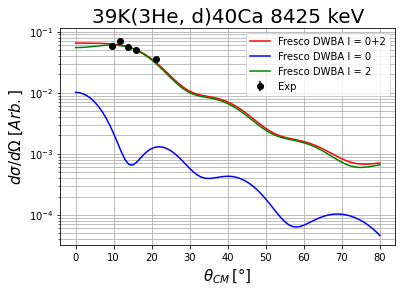

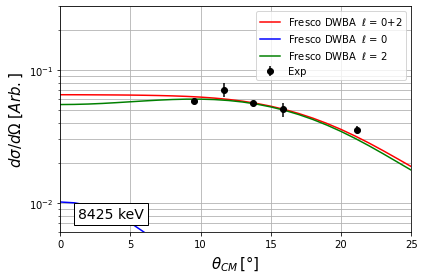

In [53]:
Ca40_8425_0plus2_data = Ca40_8425_fresco.calc_C2S_alpha_two_l(Ca40_8425keV, 1, 4, 0, 2, [0.003, 0.04], showplot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=3*10**(-1), updateResult=False, returnResult = True)#, saveFig=True)

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8425 keV (Options)
</h2>

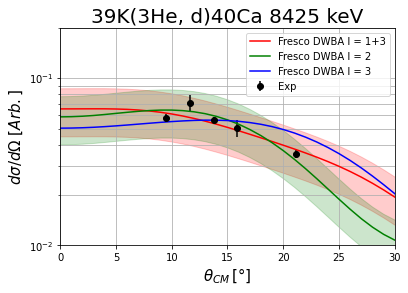

In [54]:
# Comparing l=1+3 and l=0+2 with systematic uncertainty included

# if returnResult = true, the calc_C2S_alpha_two_l() method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
#C2S_8425_1plus3 = Ca40_425_1plus3_data[0]
#alpha_8425_1plus3 = Ca40_8425_1plus3_data[1]
frescoSigmaScaled_8425_1plus3 = Ca40_8425_1plus3_data[2]
#C2S_8425_0plus2 = Ca40_8425_0plus2_data[0]
#alpha_8425_0plus2 = Ca40_8425_0plus2_data[1]
frescoSigmaScaled_8425_0plus2 = Ca40_8425_0plus2_data[2]

frescoSigmaScaled_8425_1plus3_upper = []
frescoSigmaScaled_8425_1plus3_lower = []
for i in frescoSigmaScaled_8425_1plus3:
    frescoSigmaScaled_8425_1plus3_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8425_1plus3_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_8425_0plus2_upper = []
frescoSigmaScaled_8425_0plus2_lower = []
for i in frescoSigmaScaled_8425_0plus2:
    frescoSigmaScaled_8425_0plus2_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8425_0plus2_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_8425_2_upper = []
frescoSigmaScaled_8425_2_lower = []
for i in Ca40_8425_fresco.s_factor_cubic_scaled_dwba_cross[4]:
    frescoSigmaScaled_8425_2_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8425_2_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_8425_3_upper = []
frescoSigmaScaled_8425_3_lower = []
for i in Ca40_8425_fresco.s_factor_cubic_scaled_dwba_cross[16]:
    frescoSigmaScaled_8425_3_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8425_3_lower.append(i - (i * 0.32))
    
ax = py.subplot(111)
plt.errorbar(Ca40_8425keV.fit_angle_cm_reduced, Ca40_8425keV.crosssection_ratio_wavg, yerr=Ca40_8425keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')

plt.plot(Ca40_8425_fresco.theta[0], frescoSigmaScaled_8425_1plus3, c = 'r', label = 'Fresco DWBA l = ' + str(1) + '+' + str(3))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8425_1plus3_lower, frescoSigmaScaled_8425_1plus3_upper, color = 'r', alpha=0.2)
#plt.plot(Ca40_8425_fresco.theta[1], frescoSigmaScaled_8425_0plus2, c = 'b', label = 'Fresco DWBA l = ' + str(0) + '+' + str(2))
#ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8425_0plus2_lower, frescoSigmaScaled_8425_0plus2_upper, color = 'b', alpha=0.2)

plt.plot(Ca40_8425_fresco.theta[4], Ca40_8425_fresco.s_factor_cubic_scaled_dwba_cross[4], c = 'g', label = 'Fresco DWBA l = ' + str(2))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8425_2_lower, frescoSigmaScaled_8425_2_upper, color = 'g', alpha=0.2)

plt.plot(Ca40_8425_fresco.theta[16], Ca40_8425_fresco.s_factor_cubic_scaled_dwba_cross[16], c = 'b', label = 'Fresco DWBA l = ' + str(3))
#ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8425_3_lower, frescoSigmaScaled_8425_3_upper, color = 'b', alpha=0.2)

plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_8425_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,30)
#plt.xlim(0,60)
plt.ylim(1*10**-2, 2*10**-1)
#plt.ylim(1*10**-3, 1*10**-1)
#plt.ylim(5*10**-3, 3*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

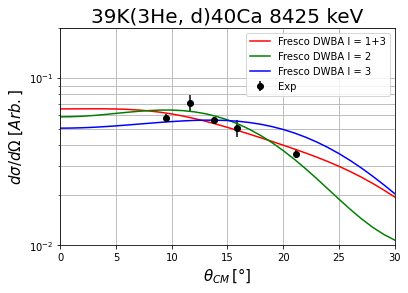

In [55]:
# Comparing l=1+3 and l=2 without uncertainty band

frescoSigmaScaled_8425_1plus3 = Ca40_8425_1plus3_data[2]
frescoSigmaScaled_8425_0plus2 = Ca40_8425_0plus2_data[2]
    
ax = py.subplot(111)
plt.errorbar(Ca40_8425keV.fit_angle_cm_reduced, Ca40_8425keV.crosssection_ratio_wavg, yerr=Ca40_8425keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')

plt.plot(Ca40_8425_fresco.theta[0], frescoSigmaScaled_8425_1plus3, c = 'r', label = 'Fresco DWBA l = ' + str(1) + '+' + str(3))
plt.plot(Ca40_8425_fresco.theta[4], Ca40_8425_fresco.s_factor_cubic_scaled_dwba_cross[4], c = 'g', label = 'Fresco DWBA l = ' + str(2))
plt.plot(Ca40_8425_fresco.theta[16], Ca40_8425_fresco.s_factor_cubic_scaled_dwba_cross[16], c = 'b', label = 'Fresco DWBA l = ' + str(3))

plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_8425_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,30)
#plt.xlim(0,60)
plt.ylim(1*10**-2, 2*10**-1)
#plt.ylim(1*10**-3, 1*10**-1)
#plt.ylim(5*10**-3, 3*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8484 keV Tests (l=1,2,3)
</h2>

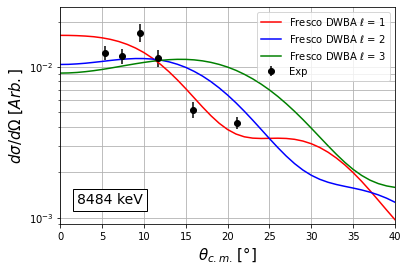

In [56]:
ax = py.subplot(111)
plt.errorbar(Ca40_8484keV.fit_angle_cm_reduced, Ca40_8484keV.crosssection_ratio_wavg, yerr=Ca40_8484keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_8484_fresco.theta[1], Ca40_8484_fresco.s_factor_cubic_scaled_dwba_cross[1], c = 'r', label = 'Fresco DWBA ' + r'$\ell$' + ' = ' + str(1))
plt.plot(Ca40_8484_fresco.theta[26], Ca40_8484_fresco.s_factor_cubic_scaled_dwba_cross[26], c = 'b', label = 'Fresco DWBA ' + r'$\ell$' + ' = ' + str(2))
plt.plot(Ca40_8484_fresco.theta[4], Ca40_8484_fresco.s_factor_cubic_scaled_dwba_cross[4], c = 'g', label = 'Fresco DWBA ' + r'$\ell$' + ' = ' + str(3))
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{c.m.} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
#ax.set_title(transfer_reaction + ' ' + str(Ca40_8484_fresco.ex_energy) + ' keV', size = 20)
#plt.xlim(0,30)
plt.xlim(0,40)
plt.ylim(9*10**-4, 2.5*10**-2)
#plt.ylim(1*10**-3, 1*10**-1)
#plt.ylim(5*10**-3, 3*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
ax.text(0.05, 0.08, '8484 keV', transform=ax.transAxes, fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=1))
#plt.savefig('8484keV.pdf',dpi=600,bbox_inches='tight')
#plt.close()
plt.show()

In [57]:
#print(Ca40_8484_fresco.s_factor_cubic_scaled_dwba_cross[5])

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8748 keV (1+3)
</h2>

         Current function value: 5.108077
         Iterations: 6
         Function evaluations: 120
         Gradient evaluations: 36
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0004051580618887136, 0.1697617768954991
C2St = 0.011091451852565206

C2St (l=1) = 0.002
uC2St (l=1) = 0.0005
ufrac (l=1) = 0.2689881863828086

C2St (l=3) = 0.009
uC2St (l=3) = 0.0018
ufrac (l=3) = 0.19955151247721056

Reduced Chi2 = 1.277

Hessian Inverse:
[[ 2.48608072e-09 -2.88612843e-06]
 [-2.88612843e-06  4.01873561e-03]]


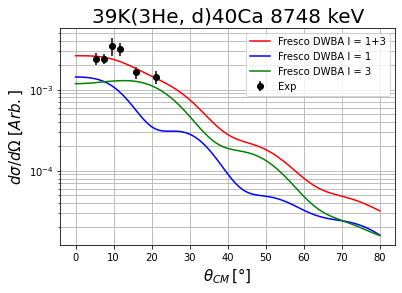

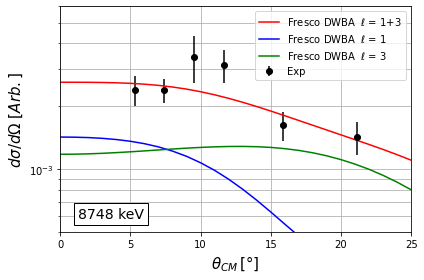

In [58]:
# if returnResult = true, the method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
Ca40_8748_1plus3_data = Ca40_8748_fresco.calc_C2S_alpha_two_l(Ca40_8748keV, 20, 24, 1, 3, [0.0007, 0.15], showplot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3), returnResult=True)
#Ca40_8748_1plus3_data = Ca40_8748_fresco.calc_C2S_alpha_two_l(Ca40_8748keV, 0, 4, 1, 3, [0.0007, 0.15], showplot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3), returnResult=True)
#Ca40_8748_fresco.C2S_l1, Ca40_8748_fresco.C2S_l2, Ca40_8748_fresco.C2St_l1, Ca40_8748_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_8748keV, Ca40_8748_fresco, 0, 4, 1, 3, [0.0007, 0.15], plot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3))
#Ca40_8748_fresco.C2S_l1, Ca40_8748_fresco.C2S_l2, Ca40_8748_fresco.C2St_l1, Ca40_8748_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_8748keV, Ca40_8748_fresco, 0, 4, 1, 3, [gC2S, galpha], plot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8748 keV (0+2)
</h2>

         Current function value: 5.838258
         Iterations: 2
         Function evaluations: 135
         Gradient evaluations: 41
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.00014501661565078337, 0.033593628981868184
C2St = 0.003969919302147357

C2St (l=0) = 0.000
uC2St (l=0) = 0.0002
ufrac (l=0) = 1.84876595872211

C2St (l=2) = 0.004
uC2St (l=2) = 0.0004
ufrac (l=2) = 0.09547824425901198

Reduced Chi2 = 1.460

Hessian Inverse:
[[ 5.24714142e-11 -5.48733468e-08]
 [-5.48733468e-08  3.87795446e-03]]


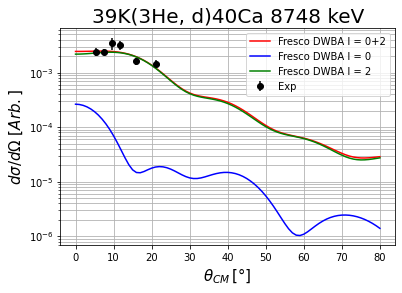

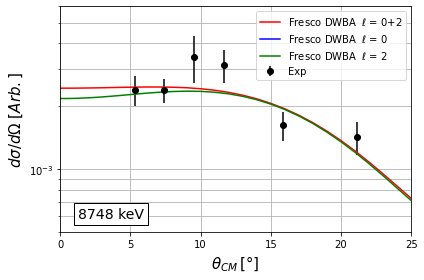

In [59]:
# if returnResult = true, the method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
Ca40_8748_0plus2_data = Ca40_8748_fresco.calc_C2S_alpha_two_l(Ca40_8748keV, 8, 12, 0, 2, [0.00014, 0.03], showplot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3), updateResult=False, returnResult=True)
#Ca40_8748_0plus2_data = Ca40_8748_fresco.calc_C2S_alpha_two_l(Ca40_8748keV, 8, 12, 0, 2, [0.00014, 0.03], showplot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3), updateResult=False, returnResult=True)
#Ca40_8748_fresco_C2S_l1, Ca40_8748_fresco_C2S_l2, Ca40_8748_fresco_C2St_l1, Ca40_8748_fresco_C2St_l2 = calc_C2S_alpha_two_l(Ca40_8748keV, Ca40_8748_fresco, 8, 12, 0, 2, [0.00014, 0.03], plot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3))
#Ca40_8748_fresco_C2S_l1, Ca40_8748_fresco_C2S_l2, Ca40_8748_fresco_C2St_l1, Ca40_8748_fresco_C2St_l2 = calc_C2S_alpha_two_l(Ca40_8748keV, Ca40_8748_fresco, 8, 12, 0, 2, [gC2S, galpha], plot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8748 keV (2+4)
</h2>

         Current function value: 5.918154
         Iterations: 21
         Function evaluations: 264
         Gradient evaluations: 84
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0002483913863988219, 0.5468751415812004
C2St = 0.006799867414686138

C2St (l=2) = 0.004
uC2St (l=2) = 0.0006
ufrac (l=2) = 0.16633252140905455

C2St (l=4) = 0.003
uC2St (l=4) = 0.0074
ufrac (l=4) = 2.4084578287418976

Reduced Chi2 = 1.480

Hessian Inverse:
[[ 6.28284726e-08 -1.58766449e-04]
 [-1.58766449e-04  4.02321048e-01]]


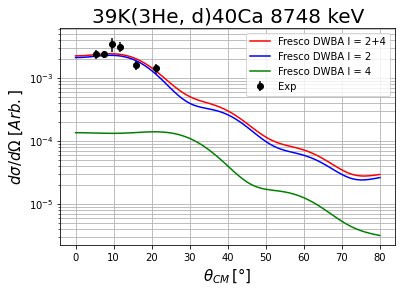

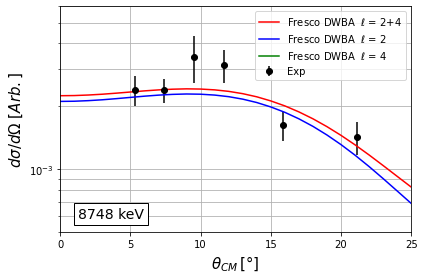

In [60]:
# if returnResult = true, the method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
Ca40_8748_2plus4_data = Ca40_8748_fresco.calc_C2S_alpha_two_l(Ca40_8748keV, 12, 15, 2, 4, [0.2, 0.6], showplot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3), updateResult=False, returnResult=True)

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8748 keV Options
</h2>

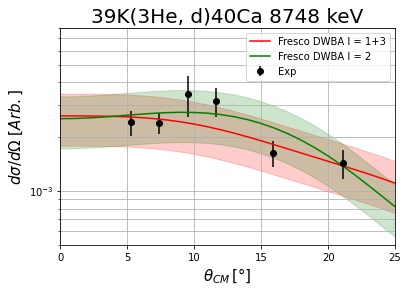

In [61]:
# Comparing l=1+3 and l=0+2 with systematic uncertainty included

# if returnResult = true, the calc_C2S_alpha_two_l() method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
#C2S_8748_1plus3 = Ca40_8748_1plus3_data[0]
#alpha_8748_1plus3 = Ca40_8748_1plus3_data[1]
frescoSigmaScaled_8748_1plus3 = Ca40_8748_1plus3_data[2]
#C2S_8748_0plus2 = Ca40_8748_0plus2_data[0]
#alpha_8748_0plus2 = Ca40_8748_0plus2_data[1]
frescoSigmaScaled_8748_0plus2 = Ca40_8748_0plus2_data[2]

frescoSigmaScaled_8748_1plus3_upper = []
frescoSigmaScaled_8748_1plus3_lower = []
for i in frescoSigmaScaled_8748_1plus3:
    frescoSigmaScaled_8748_1plus3_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8748_1plus3_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_8748_0plus2_upper = []
frescoSigmaScaled_8748_0plus2_lower = []
for i in frescoSigmaScaled_8748_0plus2:
    frescoSigmaScaled_8748_0plus2_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8748_0plus2_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_8748_2_upper = []
frescoSigmaScaled_8748_2_lower = []
for i in Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[12]:
    frescoSigmaScaled_8748_2_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8748_2_lower.append(i - (i * 0.32))
    
ax = py.subplot(111)
plt.errorbar(Ca40_8748keV.fit_angle_cm_reduced, Ca40_8748keV.crosssection_ratio_wavg, yerr=Ca40_8748keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
#plt.plot(Ca40_8748_fresco.theta[0], frescoSigmaScaled_8748_1plus3, c = 'r', label = 'Fresco DWBA l = ' + str(1) + '+' + str(3))
plt.plot(Ca40_8748_fresco.theta[20], frescoSigmaScaled_8748_1plus3, c = 'r', label = 'Fresco DWBA l = ' + str(1) + '+' + str(3))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8748_1plus3_lower, frescoSigmaScaled_8748_1plus3_upper, color = 'r', alpha=0.2)
#plt.plot(Ca40_8748_fresco.theta[8], frescoSigmaScaled_8748_0plus2, c = 'b', label = 'Fresco DWBA l = ' + str(0) + '+' + str(2))
#ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8748_0plus2_lower, frescoSigmaScaled_8748_0plus2_upper, color = 'b', alpha=0.2)
plt.plot(Ca40_8748_fresco.theta[12], Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[12], c = 'g', label = 'Fresco DWBA l = ' + str(2))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8748_2_lower, frescoSigmaScaled_8748_2_upper, color = 'g', alpha=0.2)
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_8748_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,25)
plt.ylim(5*10**-4, 8*10**-3)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

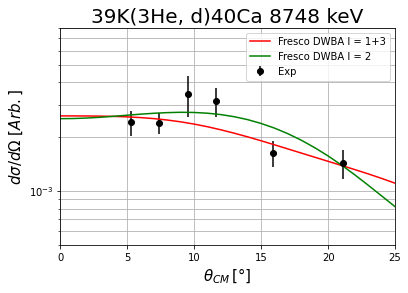

In [62]:
# Comparing l=1+3 and l=2 without uncertainty bands

frescoSigmaScaled_8748_1plus3 = Ca40_8748_1plus3_data[2]
frescoSigmaScaled_8748_0plus2 = Ca40_8748_0plus2_data[2]
    
ax = py.subplot(111)
plt.errorbar(Ca40_8748keV.fit_angle_cm_reduced, Ca40_8748keV.crosssection_ratio_wavg, yerr=Ca40_8748keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_8748_fresco.theta[20], frescoSigmaScaled_8748_1plus3, c = 'r', label = 'Fresco DWBA l = ' + str(1) + '+' + str(3))
plt.plot(Ca40_8748_fresco.theta[12], Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[12], c = 'g', label = 'Fresco DWBA l = ' + str(2))
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_8748_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,25)
plt.ylim(5*10**-4, 8*10**-3)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8851 keV (1+3)
</h2>

         Current function value: 4.348342
         Iterations: 6
         Function evaluations: 180
         Gradient evaluations: 56
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0013032616714404592, 0.5107778521958589
C2St = 0.03567759212957717

C2St (l=1) = 0.018
uC2St (l=1) = 0.0018
ufrac (l=1) = 0.09657948475476931

C2St (l=3) = 0.017
uC2St (l=3) = 0.0046
ufrac (l=3) = 0.2654330373374126

Reduced Chi2 = 0.870

Hessian Inverse:
[[ 1.34429859e-08 -9.53722702e-06]
 [-9.53722702e-06  7.40455920e-03]]
         Current function value: 4.273329
         Iterations: 8
         Function evaluations: 57
         Gradient evaluations: 19
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0007966080978247084, 0.4909502091923835
C2St = 0.02180763803933192

C2St (l=1) = 0.011
uC2St (l=1) = 0.0006
ufrac (l=1) = 0.05288397055771219

C2St (l=3) = 0.011
uC2St (l=3) = 0.0006
ufrac (l=3) = 0.05294012006273645

Reduced Chi2 = 0.855

Hessian Inverse:
[[ 7.06864358e-10 -5.92776327e-10]


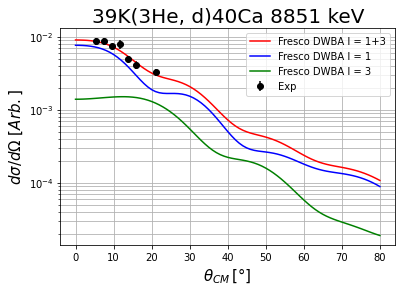

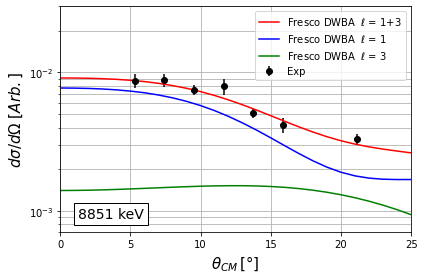

         Current function value: 4.264240
         Iterations: 8
         Function evaluations: 99
         Gradient evaluations: 29
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0005690645965729748, 0.49088449484746743
C2St = 0.015578494339876342

C2St (l=1) = 0.008
uC2St (l=1) = 0.0008
ufrac (l=1) = 0.10263309924073875

C2St (l=3) = 0.008
uC2St (l=3) = 0.0021
ufrac (l=3) = 0.264134664183135

Reduced Chi2 = 0.853

Hessian Inverse:
[[ 2.72999415e-09 -4.37066434e-06]
 [-4.37066434e-06  7.64106163e-03]]


In [63]:
# Using 2- first so I can have 2p3/2 and 1f7/2 (index 13 and 17). 1- can't have 1f7/2, only 1f5/2
Ca40_8851_1plus3_data1 = Ca40_8851_fresco.calc_C2S_alpha_two_l(Ca40_8851keV, 5, 8, 1, 3, [0.001, 0.5], showplot=False, updateResult = False, returnResult = True)
Ca40_8851_1plus3_data2 = Ca40_8851_fresco.calc_C2S_alpha_two_l(Ca40_8851keV, 13, 17, 1, 3, [0.001, 0.5], showplot=True, plotZoom=True, plotymin=7*10**(-4), plotymax=3*10**(-2), returnResult=True)
Ca40_8851_1plus3_data3 = Ca40_8851_fresco.calc_C2S_alpha_two_l(Ca40_8851keV, 21, 25, 1, 3, [0.001, 0.5], showplot=False, updateResult = False, returnResult = True)

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8935 keV (0+2)
</h2>

Optimization terminated successfully.
         Current function value: 59.589522
         Iterations: 9
         Function evaluations: 93
         Gradient evaluations: 31
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0010922245073723908, 0.43123862520007405
C2St = 0.02990031959191305

C2St (l=0) = 0.013
uC2St (l=0) = 0.0009
ufrac (l=0) = 0.06768535949608276

C2St (l=2) = 0.017
uC2St (l=2) = 0.0009
ufrac (l=2) = 0.05215926388726496

Reduced Chi2 = 11.918

Hessian Inverse:
[[4.68861361e-10 1.40763371e-07]
 [1.40763371e-07 3.54250748e-04]]


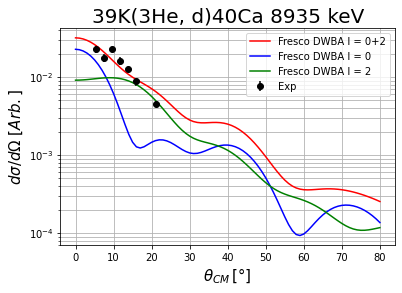

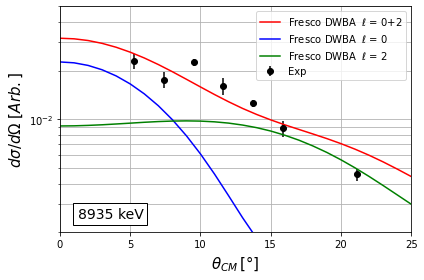

In [64]:
# if returnResult = true, the method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
Ca40_8935_0plus2_data = Ca40_8935_fresco.calc_C2S_alpha_two_l(Ca40_8935keV, 8, 12, 0, 2, [0.001, 0.4], showplot=True, plotZoom=True, plotymin=2*10**(-3), plotymax=5*10**(-2), updateResult=False, returnResult=True)
#Ca40_8935_fresco_C2S_l1, Ca40_8935_fresco_C2S_l2, Ca40_8935_fresco_C2St_l1, Ca40_8935_fresco_C2St_l2 = calc_C2S_alpha_two_l(Ca40_8935keV, Ca40_8935_fresco, 8, 12, 0, 2, [0.001, 0.4], plot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3))
#Ca40_8935_fresco_C2S_l1, Ca40_8935_fresco_C2S_l2, Ca40_8935_fresco_C2St_l1, Ca40_8935_fresco_C2St_l2 = calc_C2S_alpha_two_l(Ca40_8935keV, Ca40_8935_fresco, 8, 12, 0, 2, [gC2S, galpha], plot=True, plotZoom=True, plotymin=5*10**(-4), plotymax=6*10**(-3))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8935 keV Options
</h2>

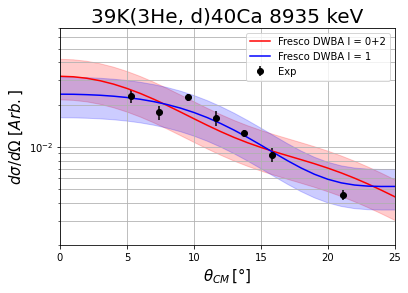

In [65]:
# Comparing l=1 and l=0+2 with systematic uncertainty included

# if returnResult = true, the calc_C2S_alpha_two_l() method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
#C2S_8935_0plus2 = Ca40_8935_0plus2_data[0]
#alpha_8935_0plus2 = Ca40_8935_0plus2_data[1]
frescoSigmaScaled_8935_0plus2 = Ca40_8935_0plus2_data[2]
    
frescoSigmaScaled_8935_0plus2_upper = []
frescoSigmaScaled_8935_0plus2_lower = []
for i in frescoSigmaScaled_8935_0plus2:
    frescoSigmaScaled_8935_0plus2_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8935_0plus2_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_8935_1_upper = []
frescoSigmaScaled_8935_1_lower = []
for i in Ca40_8935_fresco.s_factor_cubic_scaled_dwba_cross[1]:
    frescoSigmaScaled_8935_1_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8935_1_lower.append(i - (i * 0.32))
    
ax = py.subplot(111)
plt.errorbar(Ca40_8935keV.fit_angle_cm_reduced, Ca40_8935keV.crosssection_ratio_wavg, yerr=Ca40_8935keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_8935_fresco.theta[8], frescoSigmaScaled_8935_0plus2, c = 'r', label = 'Fresco DWBA l = ' + str(0) + '+' + str(2))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8935_0plus2_lower, frescoSigmaScaled_8935_0plus2_upper, color = 'r', alpha=0.2)
plt.plot(Ca40_8935_fresco.theta[1], Ca40_8935_fresco.s_factor_cubic_scaled_dwba_cross[1], c = 'b', label = 'Fresco DWBA l = ' + str(1))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8935_1_lower, frescoSigmaScaled_8935_1_upper, color = 'b', alpha=0.2)
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_8935_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,25)
plt.ylim(2*10**-3, 7*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8995 keV (if Jpi = 2+ | Jpi = 1-, i.e. l=1, works very well)
</h2>

Optimization terminated successfully.
         Current function value: 1.272166
         Iterations: 6
         Function evaluations: 57
         Gradient evaluations: 19
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.00042932374936190744, 0.5104092789505285
C2St = 0.01175300245294963

C2St (l=0) = 0.006
uC2St (l=0) = 0.0003
ufrac (l=0) = 0.05246811330952

C2St (l=2) = 0.006
uC2St (l=2) = 0.0003
ufrac (l=2) = 0.05250236690471625

Reduced Chi2 = 0.424

Hessian Inverse:
[[ 1.97021107e-10 -1.92473634e-10]
 [-1.92473634e-10  2.25442154e-08]]


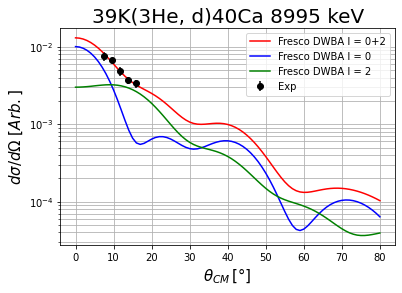

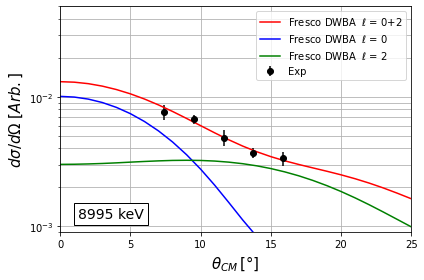

In [66]:
# if returnResult = true, the method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
Ca40_8995_0plus2_data = Ca40_8995_fresco.calc_C2S_alpha_two_l(Ca40_8995keV, 8, 12, 0, 2, [0.0004, 0.51], showplot=True, plotZoom=True, plotymin=9*10**(-4), plotymax=5*10**(-2), updateResult=False, returnResult=True)
#Ca40_8995_fresco.C2S_l1, Ca40_8995_fresco.C2S_l2, Ca40_8995_fresco.C2St_l1, Ca40_8995_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_8995keV, Ca40_8995_fresco, 8, 12, 0, 2, [0.0004, 0.51], plot=True, plotZoom=True, plotymin=9*10**(-4), plotymax=5*10**(-2))
#Ca40_8995_fresco.C2S_l1, Ca40_8995_fresco.C2S_l2, Ca40_8995_fresco.C2St_l1, Ca40_8995_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_8995keV, Ca40_8995_fresco, 8, 12, 0, 2, [gC2S, galpha], plot=True, plotZoom=True, plotymin=9*10**(-4), plotymax=5*10**(-2))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    8995 keV Options
</h2>

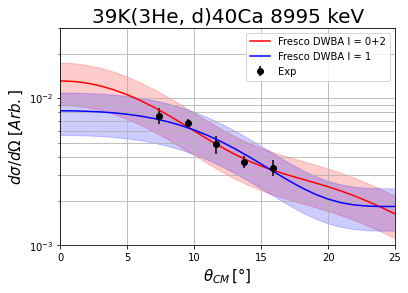

In [67]:
# Comparing l=1 and l=0+2 with systematic uncertainty included

# if returnResult = true, the calc_C2S_alpha_two_l() method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
#C2S_8995_0plus2 = Ca40_8995_0plus2_data[0]
#alpha_8995_0plus2 = Ca40_8995_0plus2_data[1]
frescoSigmaScaled_8995_0plus2 = Ca40_8995_0plus2_data[2]
    
frescoSigmaScaled_8995_0plus2_upper = []
frescoSigmaScaled_8995_0plus2_lower = []
for i in frescoSigmaScaled_8995_0plus2:
    frescoSigmaScaled_8995_0plus2_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8995_0plus2_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_8995_1_upper = []
frescoSigmaScaled_8995_1_lower = []
for i in Ca40_8995_fresco.s_factor_cubic_scaled_dwba_cross[1]:
    frescoSigmaScaled_8995_1_upper.append(i + (i * 0.32))
    frescoSigmaScaled_8995_1_lower.append(i - (i * 0.32))
    
ax = py.subplot(111)
plt.errorbar(Ca40_8995keV.fit_angle_cm_reduced, Ca40_8995keV.crosssection_ratio_wavg, yerr=Ca40_8995keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_8995_fresco.theta[8], frescoSigmaScaled_8995_0plus2, c = 'r', label = 'Fresco DWBA l = ' + str(0) + '+' + str(2))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8995_0plus2_lower, frescoSigmaScaled_8995_0plus2_upper, color = 'r', alpha=0.2)
plt.plot(Ca40_8995_fresco.theta[1], Ca40_8995_fresco.s_factor_cubic_scaled_dwba_cross[1], c = 'b', label = 'Fresco DWBA l = ' + str(1))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_8995_1_lower, frescoSigmaScaled_8995_1_upper, color = 'b', alpha=0.2)
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_8995_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,25)
plt.ylim(1*10**-3, 3*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    9227 keV (if Jpi = 1+ | Jpi = 1-, i.e. l=1, works very well)
</h2>

         Current function value: 9.851091
         Iterations: 3
         Function evaluations: 111
         Gradient evaluations: 33
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.004350427002129712, 0.4020535756326948
C2St = 0.11909562260043344

C2St (l=0) = 0.048
uC2St (l=0) = 0.0064
ufrac (l=0) = 0.133087803272418

C2St (l=2) = 0.071
uC2St (l=2) = 0.0058
ufrac (l=2) = 0.08101779611887178

Reduced Chi2 = 3.284

Hessian Inverse:
[[1.42096796e-08 2.16125949e-06]
 [2.16125949e-06 2.06983200e-03]]


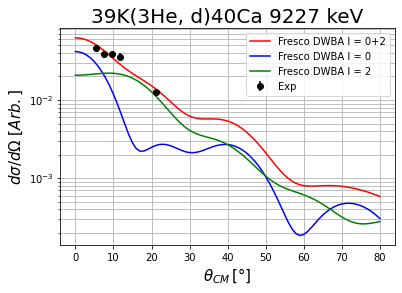

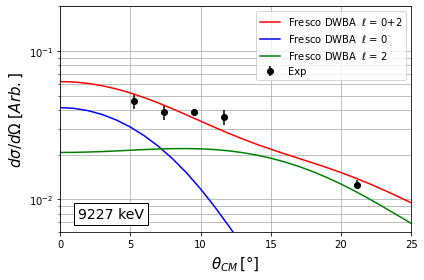

In [68]:
# if returnResult = true, the method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
Ca40_9227_0plus2_data = Ca40_9227_fresco.calc_C2S_alpha_two_l(Ca40_9227keV, 0, 4, 0, 2, [0.004, 0.4], showplot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=2*10**(-1), updateResult=False, returnResult=True)
#Ca40_9227_fresco.C2S_l1, Ca40_9227_fresco.C2S_l2, Ca40_9227_fresco.C2St_l1, Ca40_9227_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_9227keV, Ca40_9227_fresco, 0, 4, 0, 2, [0.004, 0.4], plot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=2*10**(-1))
#Ca40_9227_fresco.C2S_l1, Ca40_9227_fresco.C2S_l2, Ca40_9227_fresco.C2St_l1, Ca40_9227_fresco.C2St_l2 = calc_C2S_alpha_two_l(Ca40_9227keV, Ca40_9227_fresco, 0, 4, 0, 2, [gC2S, galpha], plot=True, plotZoom=True, plotymin=6*10**(-3), plotymax=2*10**(-1))

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    9227 keV Options
</h2>

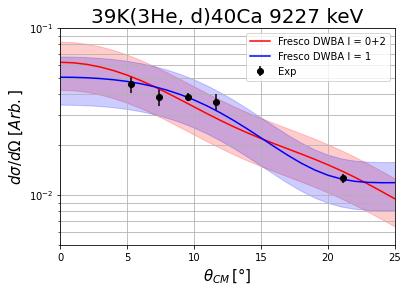

In [69]:
# Comparing l=1 and l=0+2 with systematic uncertainty included

# if returnResult = true, the calc_C2S_alpha_two_l() method returns: [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2]
#C2S_9227_0plus2 = Ca40_9227_0plus2_data[0]
#alpha_9227_0plus2 = Ca40_9227_0plus2_data[1]
frescoSigmaScaled_9227_0plus2 = Ca40_9227_0plus2_data[2]
    
frescoSigmaScaled_9227_0plus2_upper = []
frescoSigmaScaled_9227_0plus2_lower = []
for i in frescoSigmaScaled_9227_0plus2:
    frescoSigmaScaled_9227_0plus2_upper.append(i + (i * 0.32))
    frescoSigmaScaled_9227_0plus2_lower.append(i - (i * 0.32))
    
frescoSigmaScaled_9227_1_upper = []
frescoSigmaScaled_9227_1_lower = []
for i in Ca40_9227_fresco.s_factor_cubic_scaled_dwba_cross[8]:
    frescoSigmaScaled_9227_1_upper.append(i + (i * 0.32))
    frescoSigmaScaled_9227_1_lower.append(i - (i * 0.32))
    
ax = py.subplot(111)
plt.errorbar(Ca40_9227keV.fit_angle_cm_reduced, Ca40_9227keV.crosssection_ratio_wavg, yerr=Ca40_9227keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_9227_fresco.theta[0], frescoSigmaScaled_9227_0plus2, c = 'r', label = 'Fresco DWBA l = ' + str(0) + '+' + str(2))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_9227_0plus2_lower, frescoSigmaScaled_9227_0plus2_upper, color = 'r', alpha=0.2)
plt.plot(Ca40_9227_fresco.theta[8], Ca40_9227_fresco.s_factor_cubic_scaled_dwba_cross[8], c = 'b', label = 'Fresco DWBA l = ' + str(1))
ax.fill_between(np.arange(0, 81, 1), frescoSigmaScaled_9227_1_lower, frescoSigmaScaled_9227_1_upper, color = 'b', alpha=0.2)
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15)
ax.set_title(transfer_reaction + ' ' + str(Ca40_9227_fresco.ex_energy) + ' keV', size = 20)
plt.xlim(0,25)
plt.ylim(5*10**-3, 1*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Ambiguous Cases in One Plot for Paper
</h2>

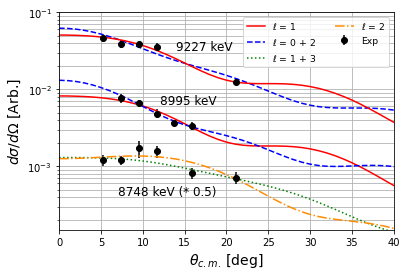

In [70]:
ax = py.subplot(111)

plt.errorbar(Ca40_8995keV.fit_angle_cm_reduced, Ca40_8995keV.crosssection_ratio_wavg, yerr=Ca40_8995keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8995_fresco.theta[1], Ca40_8995_fresco.s_factor_cubic_scaled_dwba_cross[1], c = 'r', label = r'$\ell$ = ' + str(1), ls = 'solid')
plt.plot(Ca40_8995_fresco.theta[8], frescoSigmaScaled_8995_0plus2, c = 'b', label = r'$\ell$ = ' + str(0) + ' + ' + str(2), ls = 'dashed')

plt.errorbar(Ca40_9227keV.fit_angle_cm_reduced, Ca40_9227keV.crosssection_ratio_wavg, yerr=Ca40_9227keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_9227_fresco.theta[0], frescoSigmaScaled_9227_0plus2, c = 'b', ls = 'dashed')#, label = 'Fresco DWBA l = ' + str(0) + '+' + str(2))
plt.plot(Ca40_9227_fresco.theta[8], Ca40_9227_fresco.s_factor_cubic_scaled_dwba_cross[8], c = 'r', ls = 'solid')#, label = 'Fresco DWBA l = ' + str(1))
    
#plt.errorbar(Ca40_8748keV.fit_angle_cm_reduced, Ca40_8748keV.crosssection_ratio_wavg, yerr=Ca40_8748keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
#plt.plot(Ca40_8748_fresco.theta[0], frescoSigmaScaled_8748_1plus3, c = 'g', label = r'$\ell$ = ' + str(1) + ' + ' + str(3))
#plt.plot(Ca40_8748_fresco.theta[12], Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[12], c = 'darkorange', label = r'$\ell$ = ' + str(2))

scaleFactor = 0.5
plt.errorbar(Ca40_8748keV.fit_angle_cm_reduced, [scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg], yerr=[scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg_u], c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_8748_fresco.theta[20], [scaleFactor*x for x in frescoSigmaScaled_8748_1plus3], c = 'g', label = r'$\ell$ = ' + str(1) + ' + ' + str(3), ls = 'dotted')
plt.plot(Ca40_8748_fresco.theta[12], [scaleFactor*x for x in Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[12]], c = 'darkorange', label = r'$\ell$ = ' + str(2), ls = 'dashdot')

plt.legend(loc="upper right",fontsize=9.25,ncol=2)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 14)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [Arb.]', size = 14)
#ax.set_title(transfer_reaction, size = 20)
ax.text(14, 0.032, '9227 keV', fontsize=12)
ax.text(12, 0.0065, '8995 keV', fontsize=12)
#ax.text(8, 0.0013, '8748 keV', fontsize=12)
ax.text(7, 0.00042, '8748 keV (* 0.5)', fontsize=12)
plt.xlim(0,40)
#plt.ylim(4*10**-4, 1*10**-1)
plt.ylim(1.5*10**-4, 1*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('ambiguity.pdf')
#plt.close()
plt.show()

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;">
    Choosing Fresco DWBA Models
</h1>

In [71]:
energies = [4491, 5614, 5903, 6025, 6285, 6582, 6750, 6950, 7113, 7532, 7623, 7658, 7694, 7973, 8113, 8188, 8271, 
            8359, 8425, 8484, 8551, 8665, 8748, 8764, 8851, 8935, 8995, 9092, 9136, 9227, 9405, 9419, 9432, 9454, 9538, 9603, 9669]

Jpis = ['5-', '4-', '1-', '2-', '3-', '3-', '2-', '1-', '1-', '2-', '2-', '4-', '3-', '3-', '1-', '3-', '3-',
        '0-', '2-', '1-', '5-', '1-', '2+', '3-', '2-', '1-', '1-', '3-', '2-', '1-', '2-', '3-', '1-', '3-', '1-', '3-', '3-']

Js = []
for i in Jpis:
    Js.append(int(i[0]))

## Angular momenta of DWBA models that match experimental transfer data. Greater C2S first in mixed-l cases.
ls = ['3', '3', '1', '3+1', '1', '3+1', '3+1', '1', '1+3', '1', '3+1', '3', '3+1', '1', '1', '1', '1',
      '1', '3+1', '1', '3', '1', '2', '1', '3+1', '1', '1', '1', '1', '1', None, None, None, None, None, None, None]

# Angular momenta where low l is first
ls_lowfirst = ['3', '3', '1', '1+3', '1', '1+3', '1+3', '1', '1+3', '1', '1+3', '3', '1+3', '1', '1', '1', '1',
      '1', '1+3', '1', '3', '1', '2', '1', '1+3', '1', '1', '1', '1', '1', None, None, None, None, None, None, None]

## Indices of Fresco DWBA models that match experimental transfer data
nlj_index = ['1', '1', '1', '1+5', '1', '1+5', '1+5', '1', '1+4', '1', '1+5', '1', '1+5', '1', '1', '17', '1',
             '1', '12+16', '1', '1', '1', '12', '1', '13+17', '1', '1', '1', '1', '8', None, None, None, None, None, None, None]

## Get C2S values, where in mixed-l cases: [C2S_lg, C2S_ls], where C2S_lg > C2S_ls
k=0
C2S_me = []
C2S_me_target = []
uC2S_me_target = []
C2S_me_target_2Jplus1 = []
uC2S_me_target_2Jplus1 = []
for obj in fresco.objects:
    if (nlj_index[k] == None):
        C2S_me.append(None)
        C2S_me_target.append(None)
        uC2S_me_target.append(None)
        C2S_me_target_2Jplus1.append(None)
        uC2S_me_target_2Jplus1.append(None)
    elif ('+' in nlj_index[k]):
        if (obj.C2S_l1 > obj.C2S_l2):
            C2S_me.append([obj.C2S_l1 + ' (l=' + ls[k][0] + ')', obj.C2S_l2 + ' (l=' + ls[k][2] + ')'])
            C2S_me_target.append([obj.C2St_l1 + ' (l=' + ls[k][0] + ')', obj.C2St_l2 + ' (l=' + ls[k][2] + ')'])
            uC2S_me_target.append([obj.uC2St_l1 + ' (l=' + ls[k][0] + ')', obj.uC2St_l2 + ' (l=' + ls[k][2] + ')'])
            C2S_me_target_2Jplus1.append(['{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St_l1)) + ' (l=' + ls[k][0] + ')', '{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St_l2)) + ' (l=' + ls[k][2] + ')'])
            uC2S_me_target_2Jplus1.append(['{:.3f}'.format(((2 * Js[k])+1) * float(obj.uC2St_l1)) + ' (l=' + ls[k][0] + ')', '{:.3f}'.format(((2 * Js[k])+1) * float(obj.uC2St_l2)) + ' (l=' + ls[k][2] + ')'])
        else:
            C2S_me.append([obj.C2S_l2 + ' (l=' + ls[k][0] + ')', obj.C2S_l1 + ' (l=' + ls[k][2] + ')'])
            C2S_me_target.append([obj.C2St_l2 + ' (l=' + ls[k][0] + ')', obj.C2St_l1 + ' (l=' + ls[k][2] + ')'])
            uC2S_me_target.append([obj.uC2St_l2 + ' (l=' + ls[k][0] + ')', obj.uC2St_l1 + ' (l=' + ls[k][2] + ')'])
            C2S_me_target_2Jplus1.append(['{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St_l2)) + ' (l=' + ls[k][0] + ')', '{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St_l1)) + ' (l=' + ls[k][2] + ')'])
            uC2S_me_target_2Jplus1.append(['{:.3f}'.format(((2 * Js[k])+1) * float(obj.uC2St_l2)) + ' (l=' + ls[k][0] + ')', '{:.3f}'.format(((2 * Js[k])+1) * float(obj.uC2St_l1)) + ' (l=' + ls[k][2] + ')'])
    else:
        C2S_me.append(obj.C2S[int(nlj_index[k])])
        C2S_me_target.append(obj.C2St[int(nlj_index[k])])
        uC2S_me_target.append(obj.C2St_u[int(nlj_index[k])])
        C2S_me_target_2Jplus1.append('{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St[int(nlj_index[k])])))
        uC2S_me_target_2Jplus1.append('{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St_u[int(nlj_index[k])])))
    k+=1
    
## Get C2S values, where in mixed-l cases: [C2S_l1, C2S_l2], where l1 < l2    
k=0
C2S_me_lowfirst = []
C2S_me_target_lowfirst = []
uC2S_me_target_lowfirst = []
C2S_me_target_lowfirst_2Jplus1 = []
uC2S_me_target_lowfirst_2Jplus1 = []
for obj in fresco.objects:
    if (nlj_index[k] == None):
        C2S_me_lowfirst.append(None)
        C2S_me_target_lowfirst.append(None)
        uC2S_me_target_lowfirst.append(None)
        C2S_me_target_lowfirst_2Jplus1.append(None)
        uC2S_me_target_lowfirst_2Jplus1.append(None)
    elif ('+' in nlj_index[k]):
            C2S_me_lowfirst.append([obj.C2S_l1 + ' (l=' + ls_lowfirst[k][0] + ')', obj.C2S_l2 + ' (l=' + ls_lowfirst[k][2] + ')'])
            C2S_me_target_lowfirst.append([obj.C2St_l1 + ' (l=' + ls_lowfirst[k][0] + ')', obj.C2St_l2 + ' (l=' + ls_lowfirst[k][2] + ')'])
            uC2S_me_target_lowfirst.append([obj.uC2St_l1 + ' (l=' + ls_lowfirst[k][0] + ')', obj.uC2St_l2 + ' (l=' + ls_lowfirst[k][2] + ')'])
            C2S_me_target_lowfirst_2Jplus1.append(['{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St_l1)) + ' (l=' + ls_lowfirst[k][0] + ')', '{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St_l2)) + ' (l=' + ls_lowfirst[k][2] + ')'])
            uC2S_me_target_lowfirst_2Jplus1.append(['{:.3f}'.format(((2 * Js[k])+1) * float(obj.uC2St_l1)) + ' (l=' + ls_lowfirst[k][0] + ')', '{:.3f}'.format(((2 * Js[k])+1) * float(obj.uC2St_l2)) + ' (l=' + ls_lowfirst[k][2] + ')'])
    else:
        C2S_me_lowfirst.append(obj.C2S[int(nlj_index[k])])
        C2S_me_target_lowfirst.append(obj.C2St[int(nlj_index[k])])
        uC2S_me_target_lowfirst.append(obj.C2St_u[int(nlj_index[k])])
        C2S_me_target_lowfirst_2Jplus1.append('{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St[int(nlj_index[k])])))
        uC2S_me_target_lowfirst_2Jplus1.append('{:.3f}'.format(((2 * Js[k])+1) * float(obj.C2St_u[int(nlj_index[k])])))
    k+=1

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Energies from Calibration
</h1>

In [72]:
# Excitation Energies [keV]
# These result from my calibration, but 8425 and 9454 are from Gribble et al. and NNDC, respectively because they were calibration points, not test points 
# (8484 was also a calibration point, but only when 8425 was not available, so it was still used as a test point)
Ex_raw = [8357.344153846154, None, 8482.329, 8549.451538461539, 8662.850846153846, 8743.644000000002, 8767.291125, 8849.4325, 8936.222769230768, 8992.182999999999, 9092.147333333334, 9137.18775, 9227.767375000001, 9403.710000000003, 9416.737272727272, 9431.66127272727, None, 9538.356500000002, 9604.794285714288, 9673.4065]
uEx_raw = [2.5128816153846154, None, 2.9170008000000003, 2.505958230769231, 2.5645850769230774, 2.847279, 2.7230873750000004, 2.824305166666667, 2.8497241538461533, 2.54763, 3.9613220000000005, 2.7323617500000004, 3.6513226249999997, 3.1135286363636365, 3.155230636363636, 3.2144325454545455, None, 3.439714, 4.038504571428571, 3.0612925]

# My excitation energies [keV]
Ex = []
uEx = []
for i in range(len(Ex_raw)):
    if Ex_raw[i] == None:
        Ex.append(None)
        uEx.append(None)
    else:
        Ex.append('{:.1f}'.format(Ex_raw[i])) # Energies known from my calibration up to 0.1 keV, i.e. need 8357.4376... +- 2.4986... --> 8357.4 +- 2.5 or 8357.4(25)
        uEx.append('{:.1f}'.format(uEx_raw[i]))

# Resonance Energies [keV]
Res = []
uRes = []
for i in range(len(Ex)):
    if Ex[i] == None:
        Res.append(None)
        uRes.append(None)
    else:
        Res.append('{:.1f}'.format(float(Ex[i]) - Sp))
        uRes.append('{:.1f}'.format(np.sqrt((float(uEx[i]))**2 + (u_Sp)**2)))
    
# NNDC excitation energies [keV] (or Gribble for 8425 keV). Doublets have both energies in brackets. Eventually turning these all into strings
Ex_NNDC = [8358.9, 8424.35, 8484.02, 8551.1, 8665.3, 8748.59, 8764.18, 8850.6, [8934.81, 8938.4], 8994.5, 9091.7, 9135.66, [9226.69, 9227.43], [9404.85, 9406.3], 9418.8, [9429.11, 9432.46], 9453.95, 9537.8, [9603.0, 9604.6], [9662.2, 9668.71]]
uEx_NNDC = [0.6, 0.31, 0.13, 0.7, 0.8, 0.19, 0.06, 0.9, [0.07, 0.9], 0.11, 0.06, 0.05, [0.05, 0.07], [0.19, 0.6], 0.2, [0.05, 0.18], 0.05, 0.5, [0.4, 0.4], [0.2, 0.08]]
    
# NNDC resonance energies [keV] (or Gribble for 8425 keV).
Res_NNDC = []
uRes_NNDC = []
for i in range(len(Ex_NNDC)):
    if type(Ex_NNDC[i]) == list:
        # Find the number of decimal places in Ex_NNDC[i] and uEx_NNDC[i]
        dec0 = abs(decimal.Decimal(str(Ex_NNDC[i][0])).as_tuple().exponent)
        dec0_u = abs(decimal.Decimal(str(uEx_NNDC[i][0])).as_tuple().exponent)
        dec1 = abs(decimal.Decimal(str(Ex_NNDC[i][1])).as_tuple().exponent)
        dec1_u = abs(decimal.Decimal(str(uEx_NNDC[i][1])).as_tuple().exponent)
        format_str0 = '{:.' + str(dec0) + 'f}'
        format_str0_u = '{:.' + str(dec0_u) + 'f}'
        format_str1 = '{:.' + str(dec1) + 'f}'
        format_str1_u = '{:.' + str(dec1_u) + 'f}'
        Res_NNDC.append([format_str0.format(Ex_NNDC[i][0] - Sp), format_str1.format(Ex_NNDC[i][1] - Sp)])
        uRes_NNDC.append([format_str0_u.format(np.sqrt((uEx_NNDC[i][0])**2 + (u_Sp)**2)), format_str1_u.format(np.sqrt((uEx_NNDC[i][1])**2 + (u_Sp)**2))])
    else:
        # Find the number of decimal places in Ex_NNDC[i] and uEx_NNDC[i]
        dec = abs(decimal.Decimal(str(Ex_NNDC[i])).as_tuple().exponent)
        dec_u = abs(decimal.Decimal(str(uEx_NNDC[i])).as_tuple().exponent)
        # Calculate Res_NNDC and uRes_NNDC and format them to the same number of decimal places as Ex_NNDC and uEx_NNDC, respectively, since Sp is known to more decimals than Ex_NNDC
        format_str = '{:.' + str(dec) + 'f}'
        format_str_u = '{:.' + str(dec_u) + 'f}'
        Res_NNDC.append(format_str.format(Ex_NNDC[i] - Sp)) # NNDC energies known to decimals already given. Make Res_NNDC and uRes_NNDC have the same number of digits
        uRes_NNDC.append(format_str_u.format(np.sqrt((uEx_NNDC[i])**2 + (u_Sp)**2)))

# Make Ex_NNDC and uEx_NNDC strings
for i in range(len(Ex_NNDC)):
    if type(Ex_NNDC[i]) == list:
        Ex_NNDC[i] = [str(Ex_NNDC[i][0]), str(Ex_NNDC[i][1])]
        uEx_NNDC[i] = [str(uEx_NNDC[i][0]), str(uEx_NNDC[i][1])]
    else:
        Ex_NNDC[i] = str(Ex_NNDC[i])
        uEx_NNDC[i] = str(uEx_NNDC[i])
    
print('My Ex Energies and Resonance Energies [keV]:')
print(Ex)
print(uEx)
print(Res)
print(uRes)

print('\nNNDC Ex Energies and Resonance Energies [keV]:')
print(Ex_NNDC)
print(uEx_NNDC)
print(Res_NNDC)
print(uRes_NNDC)

My Ex Energies and Resonance Energies [keV]:
['8357.3', None, '8482.3', '8549.5', '8662.9', '8743.6', '8767.3', '8849.4', '8936.2', '8992.2', '9092.1', '9137.2', '9227.8', '9403.7', '9416.7', '9431.7', None, '9538.4', '9604.8', '9673.4']
['2.5', None, '2.9', '2.5', '2.6', '2.8', '2.7', '2.8', '2.8', '2.5', '4.0', '2.7', '3.7', '3.1', '3.2', '3.2', None, '3.4', '4.0', '3.1']
['29.1', None, '154.1', '221.3', '334.7', '415.4', '439.1', '521.2', '608.0', '664.0', '763.9', '809.0', '899.6', '1075.5', '1088.5', '1103.5', None, '1210.2', '1276.6', '1345.2']
['2.5', None, '2.9', '2.5', '2.6', '2.8', '2.7', '2.8', '2.8', '2.5', '4.0', '2.7', '3.7', '3.1', '3.2', '3.2', None, '3.4', '4.0', '3.1']

NNDC Ex Energies and Resonance Energies [keV]:
['8358.9', '8424.35', '8484.02', '8551.1', '8665.3', '8748.59', '8764.18', '8850.6', ['8934.81', '8938.4'], '8994.5', '9091.7', '9135.66', ['9226.69', '9227.43'], ['9404.85', '9406.3'], '9418.8', ['9429.11', '9432.46'], '9453.95', '9537.8', ['9603.0', '960

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Proton Partial Widths
</h1>

### Proton partial width $\Gamma_{c}$ for channel c, dimensionless single-particle reduced width $\theta_{pc}$, spectroscopic factor $C^{2}S$, penetration factor $P_{c}$, nuclear boundary $R$, bound-state radial wavefunction $u_{pc}$:

\begin{equation}
\Gamma_{c} = 2 \frac{\hbar^{2}}{m R^{2}} P_{c} \, C^{2}S \, \theta^{2}_{pc}
\end{equation}

\begin{equation}
\theta^{2}_{pc} = \frac{R}{2} |u_{pc}(R)|^{2}
\end{equation}

\begin{equation}
R = 1.25 \, (A^{1/3}_{t} + A^{1/3}_{p}) \, [fm]
\end{equation}

In [73]:
fresco.extract_theta_sp2_and_pen_Iliadis()
# theta_sp2_method = 'Iliadis1997' or 'Fresco_Bound_State_Wavefunction'
# start_index is the index of the first Fresco DWBA object with Ex > Sp
k=0
for en in energies:
    if en >= Sp:
        break
    k+=1
start_index = k
fresco.calc_proton_partial_width(theta_sp2_method='Fresco_Bound_State_Wavefunction', nlj_index=nlj_index, start_index=start_index)
#fresco.calc_proton_partial_width(theta_sp2_method='Iliadis1997', nlj_index=nlj_index, start_index=start_index)

theta_sp2:
[0.5331103960209496, [0.5331103960209496, 0.2727658759751928], 0.5331103960209496, 0.2727658759751928, 0.5331103960209496, 0.5723355342349699, 0.5331103960209496, [0.5331103960209496, 0.2727658759751928], 0.5331103960209496, 0.5331103845550822, 0.5331103845550822, 0.5331103791268748, 0.5331103791268748, None, None, None, None, None, None, None]
gamma:
[2.576222e-37, [5.528388e-16, 1.175315e-18], 1.641676e-10, 1.062269e-09, 0.0006605504, 0.001585963, 0.03825678, [0.3763781, 0.001417219], 2.487327, 6.854109, 31.28278, 56.39648, 160.1225, None, None, None, None, None, None, None]
C2S_t:
[0.191, [0.037, 0.246], 0.031, 0.416, 0.148, 0.004, 0.005, [0.011, 0.011], 0.057, 0.02, 0.007, 0.152, 0.143, None, None, None, None, None, None, None]
Proton partial width, G_p:
[2.623214495556556e-38, [1.0904792129338622e-17, 7.88641130783588e-20], 2.7131030817440738e-12, 1.205363054714175e-10, 5.211765022969791e-05, 3.630811923527582e-06, 0.00010197543568143171, [0.0022071618573907383, 4.25225

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Proton Partial Widths for All Options
</h2>

In [74]:
#'''
energies_all = [8359, 8359, 8359, # Jpi = 0-, 1-, 2-
                8425, # l = 1+3
                8484, 8484, 8484, # Jpi = 1-, 2-, 3-
                8551, 
                8665, 8665, 8665, 8665, # 2p1/2, 2p3/2, 3p1/2, 3p3/2 (Testing n and j variations)
                8748, 8748, # l = 1+3 or l = 2, Jpi = 2-, 2+
                8764, 
                8851, 8851, 8851, 8851, # l = 1 and Jpi = 0- or l = 1+3 and Jpi = 1-, 2-, 3-
                8935, 8935, # l = 1 or l = 0+2, Jpi = 1-, 2+
                8995, 8995, # l = 1 or l = 0+2, Jpi = 1-, 2+
                9092, 
                9136, 9136, # Jpi = 2-, 3-
                9227, 9227, # l = 1 or l = 0+2, Jpi = 1-, 1+
                9405, 9419, 9432, 9454, 9538, 9603, 9669]

fresco_objs = [Ca40_8359_fresco, Ca40_8359_fresco, Ca40_8359_fresco,
               Ca40_8425_fresco,
               Ca40_8484_fresco, Ca40_8484_fresco, Ca40_8484_fresco,
               Ca40_8551_fresco,
               Ca40_8665_fresco, Ca40_8665_fresco, Ca40_8665_fresco, Ca40_8665_fresco,
               Ca40_8748_fresco, Ca40_8748_fresco,
               Ca40_8764_fresco,
               Ca40_8851_fresco, Ca40_8851_fresco, Ca40_8851_fresco, Ca40_8851_fresco,
               Ca40_8935_fresco, Ca40_8935_fresco,
               Ca40_8995_fresco, Ca40_8995_fresco,
               Ca40_9092_fresco,
               Ca40_9136_fresco, Ca40_9136_fresco,
               Ca40_9227_fresco, Ca40_9227_fresco,
               Ca40_9405_fresco, Ca40_9419_fresco, Ca40_9432_fresco, Ca40_9454_fresco, Ca40_9538_fresco, Ca40_9603_fresco, Ca40_9669_fresco]

Jpis_all = ['0-', '1-', '2-', 
            '2-', 
            '1-', '2-', '3-', 
            '5-', 
            '1-', '1-', '1-', '1-',
            '2-', '2+',
            '3-', 
            '0-', '1-', '2-', '3-',
            '1-', '2+',
            '1-', '2+',
            '3-', 
            '2-', '3-',
            '1-', '1+',
            '2-', '3-', '1-', '3-', '1-', '3-', '3-']

Js_all = []
for i in Jpis_all:
    Js_all.append(int(i[0]))

## Angular momenta of DWBA models that match experimental transfer data
ls_all = ['1', '1', '1',
          '3+1', 
          '1', '1', '1',
          '3', 
          '1', '1', '1', '1',
          '3+1', '2', # Negligible component of l=0, which makes this unlikely to be 2+
          '1', 
          '1', '3+1', '3+1', '3+1',
          '1', '2+0',
          '1', '0+2',
          '1', 
          '1', '1',
          '1', '2+0',
          None, None, None, None, None, None, None]

ls_lowfirst_all = ['1', '1', '1',
          '1+3', 
          '1', '1', '1',
          '3', 
          '1', '1', '1', '1',
          '1+3', '2', # Negligible component of l=0, which makes this unlikely to be 2+
          '1', 
          '1', '1+3', '1+3', '1+3',
          '1', '0+2',
          '1', '0+2',
          '1', 
          '1', '1',
          '1', '0+2',
          None, None, None, None, None, None, None]

## Indices of Fresco DWBA models that match experimental transfer data
nlj_index_all = ['1', '5', '13',
                 '12+16',#'1+5', # Jpi=2- (l=1+3) option moved indices due to addition of 2+ option, but not considering 2+ option from evidence in literature.
                 '1', '9', '17',
                 '1', 
                 '0', '1', '2', '3', # 2p1/2, 2p3/2, 3p1/2, 3p3/2
                 '20+24', '12', # 2p3/2 + 1f7/2, 2d5/2
                 '1', 
                 '1', '5+8', '13+17', '21+25', # 5+8 can only have 2p3/2 + 1f5/2, since 1f7/2 is forbidden
                 '1', '8+12', # Probably l=1, not l=0+2, but including this anyway
                 '1', '8+12',
                 '1', 
                 '1', '9',
                 '8', '0+4',
                 None, None, None, None, None, None, None]

Ca40_8425_C2S_mixed_l = [float(Ca40_8425_fresco.C2St_l1), float(Ca40_8425_fresco.C2St_l2)]
Ca40_8425_uC2S_mixed_l = [float(Ca40_8425_fresco.uC2St_l1), float(Ca40_8425_fresco.uC2St_l2)]
    
Ca40_8748_C2S_mixed_l = [float(Ca40_8748_fresco.C2St_l1), float(Ca40_8748_fresco.C2St_l2)]
Ca40_8748_uC2S_mixed_l = [float(Ca40_8748_fresco.uC2St_l1), float(Ca40_8748_fresco.uC2St_l2)]
    
Ca40_8851_C2S_mixed_l_1 = [float(Ca40_8851_1plus3_data1[3]), float(Ca40_8851_1plus3_data1[4])] # Jpi = 1-, 2p3/2 + 1f5/2
Ca40_8851_uC2S_mixed_l_1 = [float(Ca40_8851_1plus3_data1[5]), float(Ca40_8851_1plus3_data1[6])]
Ca40_8851_C2S_mixed_l_2 = [float(Ca40_8851_1plus3_data2[3]), float(Ca40_8851_1plus3_data2[4])] # Jpi = 2-, 2p3/2 + 1f7/2
Ca40_8851_uC2S_mixed_l_2 = [float(Ca40_8851_1plus3_data2[5]), float(Ca40_8851_1plus3_data2[6])]
Ca40_8851_C2S_mixed_l_3 = [float(Ca40_8851_1plus3_data3[3]), float(Ca40_8851_1plus3_data3[4])] # Jpi = 3-, 2p3/2 + 1f7/2
Ca40_8851_uC2S_mixed_l_3 = [float(Ca40_8851_1plus3_data3[5]), float(Ca40_8851_1plus3_data3[6])]
    
Ca40_8935_C2S_mixed_l = [float(Ca40_8935_0plus2_data[3]), float(Ca40_8935_0plus2_data[4])] # 0, 2
Ca40_8935_uC2S_mixed_l = [float(Ca40_8935_0plus2_data[5]), float(Ca40_8935_0plus2_data[6])] # 0, 2
    
Ca40_8995_C2S_mixed_l = [float(Ca40_8995_0plus2_data[3]), float(Ca40_8995_0plus2_data[4])] # 0, 2
Ca40_8995_uC2S_mixed_l = [float(Ca40_8995_0plus2_data[5]), float(Ca40_8995_0plus2_data[6])] # 0, 2
    
Ca40_9227_C2S_mixed_l = [float(Ca40_9227_0plus2_data[3]), float(Ca40_9227_0plus2_data[4])] # 0, 2
Ca40_9227_uC2S_mixed_l = [float(Ca40_9227_0plus2_data[5]), float(Ca40_9227_0plus2_data[6])] # 0, 2
    
#C2St_l1, uC2St_l1
C2S_all = [Ca40_8359_fresco.C2St[int(nlj_index_all[0])], Ca40_8359_fresco.C2St[int(nlj_index_all[1])], Ca40_8359_fresco.C2St[int(nlj_index_all[2])],
           Ca40_8425_C2S_mixed_l,
           Ca40_8484_fresco.C2St[int(nlj_index_all[4])], Ca40_8484_fresco.C2St[int(nlj_index_all[5])], Ca40_8484_fresco.C2St[int(nlj_index_all[6])],
           Ca40_8551_fresco.C2St[int(nlj_index_all[7])],
           Ca40_8665_fresco.C2St[int(nlj_index_all[8])], Ca40_8665_fresco.C2St[int(nlj_index_all[9])], Ca40_8665_fresco.C2St[int(nlj_index_all[10])], Ca40_8665_fresco.C2St[int(nlj_index_all[11])],
           Ca40_8748_C2S_mixed_l, Ca40_8748_fresco.C2St[int(nlj_index_all[13])],
           Ca40_8764_fresco.C2St[int(nlj_index_all[14])],
           Ca40_8851_fresco.C2St[int(nlj_index_all[15])], Ca40_8851_C2S_mixed_l_1, Ca40_8851_C2S_mixed_l_2, Ca40_8851_C2S_mixed_l_3,
           Ca40_8935_fresco.C2St[int(nlj_index_all[19])], Ca40_8935_C2S_mixed_l,
           Ca40_8995_fresco.C2St[int(nlj_index_all[21])], Ca40_8995_C2S_mixed_l,
           Ca40_9092_fresco.C2St[int(nlj_index_all[23])],
           Ca40_9136_fresco.C2St[int(nlj_index_all[24])], Ca40_9136_fresco.C2St[int(nlj_index_all[25])],
           Ca40_9227_fresco.C2St[int(nlj_index_all[26])], Ca40_9227_C2S_mixed_l,
           None, None, None, None, None, None, None]

uC2S_all = [Ca40_8359_fresco.C2St_u[int(nlj_index_all[0])], Ca40_8359_fresco.C2St_u[int(nlj_index_all[1])], Ca40_8359_fresco.C2St_u[int(nlj_index_all[2])],
           Ca40_8425_uC2S_mixed_l,
           Ca40_8484_fresco.C2St_u[int(nlj_index_all[4])], Ca40_8484_fresco.C2St_u[int(nlj_index_all[5])], Ca40_8484_fresco.C2St_u[int(nlj_index_all[6])],
           Ca40_8551_fresco.C2St_u[int(nlj_index_all[7])],
           Ca40_8665_fresco.C2St_u[int(nlj_index_all[8])], Ca40_8665_fresco.C2St_u[int(nlj_index_all[9])], Ca40_8665_fresco.C2St_u[int(nlj_index_all[10])], Ca40_8665_fresco.C2St_u[int(nlj_index_all[11])],
           Ca40_8748_uC2S_mixed_l, Ca40_8748_fresco.C2St_u[int(nlj_index_all[13])],
           Ca40_8764_fresco.C2St_u[int(nlj_index_all[14])],
           Ca40_8851_fresco.C2St_u[int(nlj_index_all[15])], Ca40_8851_uC2S_mixed_l_1, Ca40_8851_uC2S_mixed_l_2, Ca40_8851_uC2S_mixed_l_3,
           Ca40_8935_fresco.C2St_u[int(nlj_index_all[19])], Ca40_8935_uC2S_mixed_l,
           Ca40_8995_fresco.C2St_u[int(nlj_index_all[21])], Ca40_8995_uC2S_mixed_l,
           Ca40_9092_fresco.C2St_u[int(nlj_index_all[23])],
           Ca40_9136_fresco.C2St_u[int(nlj_index_all[24])], Ca40_9136_fresco.C2St_u[int(nlj_index_all[25])],
           Ca40_9227_fresco.C2St_u[int(nlj_index_all[26])], Ca40_9227_uC2S_mixed_l,
           None, None, None, None, None, None, None]

theta_sp2_all = []
for i in range(len(energies_all)):
    if nlj_index_all[i] == None:
        theta_sp2_all.append(None)
    elif ('+' in nlj_index_all[i]): # mixed angular momentum state
        index_plus = nlj_index_all[i].index('+')
        index_1 = int(nlj_index_all[i][0:index_plus])
        index_2 = int(nlj_index_all[i][index_plus+1:])
        theta_sp2_all.append([fresco_objs[i].dimensionless_sp_reduced_width_squared[index_1], fresco_objs[i].dimensionless_sp_reduced_width_squared[index_2]])
    else:
        index = int(nlj_index_all[i])
        theta_sp2_all.append(fresco_objs[i].dimensionless_sp_reduced_width_squared[index])

gamma_index = [0, 0, 0, 1, 2, 2, 2, 3, 4, 4, 4, 4, 5, 5, 6, 7, 7, 7, 7, 8, 8, 9, 9, 10, 11, 11, 12, 12, 
               13, 14, 15, 16, 17, 18, 19] # Index of state in terms of each option: e.g. 8359 is the first state and has Jpi = 0-, 1-, 2-, so it's indices are: 0, 0, 0
        
gamma_all = []
for i in range(len(energies_all)):
    if nlj_index_all[i] == None:
        gamma_all.append(None)
    elif ('+' in nlj_index_all[i]): # mixed angular momentum state
        index_plus = nlj_index_all[i].index('+')
        index_1 = int(nlj_index_all[i][0:index_plus])
        index_2 = int(nlj_index_all[i][index_plus+1:])
        l_val_1 = fresco_objs[i].l_vals[index_1]
        l_val_2 = fresco_objs[i].l_vals[index_2]

        if (l_val_1=='0'):
            gamma_1 = fresco.gamma_l0[gamma_index[i]]
        elif (l_val_1=='1'):
            gamma_1 = fresco.gamma_l1[gamma_index[i]]
        elif (l_val_1=='2'):
            gamma_1 = fresco.gamma_l2[gamma_index[i]]
        elif (l_val_1=='3'):
            gamma_1 = fresco.gamma_l3[gamma_index[i]]

        if (l_val_2=='0'):
            gamma_2 = fresco.gamma_l0[gamma_index[i]]
        elif (l_val_2=='1'):
            gamma_2 = fresco.gamma_l1[gamma_index[i]]
        elif (l_val_2=='2'):
            gamma_2 = fresco.gamma_l2[gamma_index[i]]
        elif (l_val_2=='3'):
            gamma_2 = fresco.gamma_l3[gamma_index[i]]

        gamma_all.append([gamma_1, gamma_2])
    else:
        index = int(nlj_index_all[i])
        l_val = fresco_objs[i].l_vals[index]
        if (l_val=='0'):
            gamma_all.append(fresco.gamma_l0[gamma_index[i]])
        elif (l_val=='1'):
            gamma_all.append(fresco.gamma_l1[gamma_index[i]])
        elif (l_val=='2'):
            gamma_all.append(fresco.gamma_l2[gamma_index[i]])
        elif (l_val=='3'):
            gamma_all.append(fresco.gamma_l3[gamma_index[i]])

# Calculate proton partial width
ppw = []
u_tot_ppw = []
for i in range(len(energies_all)):
    if (nlj_index_all[i] == None):
        ppw.append(None)
        u_tot_ppw.append(None)
    elif ('+' in nlj_index_all[i]):
        ppw.append([theta_sp2_all[i][0] * gamma_all[i][0] * C2S_all[i][0], theta_sp2_all[i][1] * gamma_all[i][1] * C2S_all[i][1]])
        u_tot_ppw.append([theta_sp2_all[i][0] * gamma_all[i][0] * C2S_all[i][0] * np.sqrt((uC2S_all[i][0] / C2S_all[i][0])**2 + (f_sys_Gamma_p)**2), theta_sp2_all[i][1] * gamma_all[i][1] * C2S_all[i][1] * np.sqrt((uC2S_all[i][1] / C2S_all[i][1])**2 + (f_sys_Gamma_p)**2)])
    else:
        ppw.append(theta_sp2_all[i] * gamma_all[i] * C2S_all[i])
        u_tot_ppw.append(theta_sp2_all[i] * gamma_all[i] * C2S_all[i] * np.sqrt((uC2S_all[i] / C2S_all[i])**2 + (f_sys_Gamma_p)**2))
            
# Calculate (2J+1)G
ppw_2Jplus1 = []
u_tot_ppw_2Jplus1 = []
for i in range(len(energies_all)):
    if (nlj_index_all[i] == None):
        ppw_2Jplus1.append(None)
        u_tot_ppw_2Jplus1.append(None)
    elif ('+' in nlj_index_all[i]):
        ppw_2Jplus1.append([((2 * Js_all[i]) + 1) * ppw[i][0], ((2 * Js_all[i]) + 1) * ppw[i][1]])
        u_tot_ppw_2Jplus1.append([((2 * Js_all[i]) + 1) * u_tot_ppw[i][0], ((2 * Js_all[i]) + 1) * u_tot_ppw[i][1]])
    else:
        ppw_2Jplus1.append(((2 * Js_all[i]) + 1) * ppw[i])
        u_tot_ppw_2Jplus1.append(((2 * Js_all[i]) + 1) * u_tot_ppw[i])
          
# Calculate weighted averages of (2J+1)G for cases with multiple Jpi's (for the same l-value). Also testing n and j variations
weights = []
for i in u_tot_ppw_2Jplus1:
    if i == None:
        weights.append(None)
    elif type(i) == list:
        weights.append([1/(i[0]**2), 1/(i[1]**2)])
    else:
        weights.append(1/(i**2))
ppw_2Jplus1_times_weights = []
for i in range(len(ppw_2Jplus1)):
    if ppw_2Jplus1[i] == None:
        ppw_2Jplus1_times_weights.append(None)
    elif type(ppw_2Jplus1[i]) == list:
        ppw_2Jplus1_times_weights.append([ppw_2Jplus1[i][0] * weights[i][0], ppw_2Jplus1[i][1] * weights[i][1]])
    else:
        ppw_2Jplus1_times_weights.append(ppw_2Jplus1[i] * weights[i])

ppw_2Jplus1_wavg = [sum(ppw_2Jplus1_times_weights[0:3]) / sum(weights[0:3]), # 8359 0-, 1-, 2-
                    sum(ppw_2Jplus1_times_weights[4:7]) / sum(weights[4:7]), # 8484 1-, 2-, 3-
                    sum(ppw_2Jplus1_times_weights[8:12]) / sum(weights[8:12]), # 8665 all 1- but 2p1/2, 2p3/2, 3p1/2, 3p3/2
                    sum([x[0] for x in ppw_2Jplus1_times_weights[16:19]]) / sum([x[0] for x in weights[16:19]]), # 8851 1-, 2-, 3- (l=1 component)
                    sum([x[1] for x in ppw_2Jplus1_times_weights[16:19]]) / sum([x[1] for x in weights[16:19]]), # 8851 1-, 2-, 3- (l=3 component)
                    sum(ppw_2Jplus1_times_weights[24:26]) / sum(weights[24:26])] # 9136 2-, 3-

u_tot_ppw_2Jplus1_wavg = [1 / np.sqrt(sum(weights[0:3])),
                          1 / np.sqrt(sum(weights[4:7])),
                          1 / np.sqrt(sum(weights[8:12])),
                          1 / np.sqrt(sum([x[0] for x in weights[16:19]])),
                          1 / np.sqrt(sum([x[1] for x in weights[16:19]])),
                          1 / np.sqrt(sum(weights[24:26]))]
    
print(energies_all)
print(Jpis_all)
print('\n')
print('Proton Partial Widths (PPW):')
print(ppw)
print(u_tot_ppw)
print('\n')
print('(2J+1)*PPW:')
print(ppw_2Jplus1)
print(u_tot_ppw_2Jplus1)
print('\n')
print('(2J+1)*PPW Weighted Averages:')
print('8359 [Jpi = (0, 1, 2)-]: ' + str(ppw_2Jplus1_wavg[0]) + ' ' + u'\u00B1' + ' ' + str(u_tot_ppw_2Jplus1_wavg[0]))
print('8484 [Jpi = (1, 2, 3)-]: ' + str(ppw_2Jplus1_wavg[1]) + ' ' + u'\u00B1' + ' ' + str(u_tot_ppw_2Jplus1_wavg[1]))
print('8665 [Jpi = 1-, 2p1/2, 2p3/2, 3p1/2, 3p3/2]: ' + str(ppw_2Jplus1_wavg[2]) + ' ' + u'\u00B1' + ' ' + str(u_tot_ppw_2Jplus1_wavg[2]))
print('8851 [Jpi = (1, 2, 3)-, l=1 component]: ' + str(ppw_2Jplus1_wavg[3]) + ' ' + u'\u00B1' + ' ' + str(u_tot_ppw_2Jplus1_wavg[3]))
print('8851 [Jpi = (1, 2, 3)-, l=3 component]: ' + str(ppw_2Jplus1_wavg[4]) + ' ' + u'\u00B1' + ' ' + str(u_tot_ppw_2Jplus1_wavg[4]))
print('9136 [Jpi = (2, 3)-]: ' + str(ppw_2Jplus1_wavg[5]) + ' ' + u'\u00B1' + ' ' + str(u_tot_ppw_2Jplus1_wavg[5]))
#'''

[8359, 8359, 8359, 8425, 8484, 8484, 8484, 8551, 8665, 8665, 8665, 8665, 8748, 8748, 8764, 8851, 8851, 8851, 8851, 8935, 8935, 8995, 8995, 9092, 9136, 9136, 9227, 9227, 9405, 9419, 9432, 9454, 9538, 9603, 9669]
['0-', '1-', '2-', '2-', '1-', '2-', '3-', '5-', '1-', '1-', '1-', '1-', '2-', '2+', '3-', '0-', '1-', '2-', '3-', '1-', '2+', '1-', '2+', '3-', '2-', '3-', '1-', '1+', '2-', '3-', '1-', '3-', '1-', '3-', '3-']


Proton Partial Widths (PPW):
[2.623214495556556e-38, 8.78982867621045e-39, 5.2189607764999545e-39, [1.0904792129338622e-17, 7.88641130783588e-20], 2.7131030817440738e-12, 1.662869630746368e-12, 1.1377529052475148e-12, 1.205363054714175e-10, 5.24697965150337e-05, 5.211765022969791e-05, 4.264277397993355e-05, 4.313292080728911e-05, [1.861727018722489e-05, 1.4167898751211833e-07], 3.630811923527582e-06, 0.00010197543568143171, 0.015048830845845941, [0.0036117194030030257, 6.571672693722675e-06], [0.0022071618573907383, 4.252258801820554e-06], [0.0016052086235569005, 3.0925

In [75]:
# Comparing proton partial widths using 1.) Fresco bound-state wavefunction in calculation of theta_sp^2, 2.) Iliadis1997 theta_sp^2 calculation, 3.) Longland2018 partial width upper limits 
##############################################################
##### Using NNDC energies and Richard's definition of Sp #####
#energies_above_Sp = [8359, 8425, 8484, 8551, 8665, 8748, 8764, 8851, 8935, 8995, 9092, 9136, 9227, 9454, 9538, 9603, 9669]
#partial_width_fresco_bs_wf = [3.380616366194182e-37, [1.1919642403619941e-17, 8.566717470126649e-20], 3.51036221544786e-12, 1.393889510505905e-10, 5.904430210673384e-05, [3.244491211319638e-05, 2.942549826800807e-07], 9.160382623788376e-05, 0.016243608331092153, 0.07451486267269063, 0.0794503623580988, 0.11572361461354076, 4.557406215734338, 12.38251266025997, None, None, None, None]
#partial_width_iliadis1997 = [4.166238304800001e-37, [1.46896498692e-17, 9.9559720523e-20], 4.3261358112000004e-12, 1.66592679088e-10, 7.37624054916e-05, [4.05325269e-05, 3.5384057472000004e-07], 0.00011443811400000002, 0.0203536274028, 0.09420753715600001, 0.100447385346, 0.14630687847999999, 5.77037948625, 15.840760122, None, None, None, None]
#partial_width_longland2018 = [5.88e-36, [2.94e-16, None], 3.88e-10, 6.00e-10, 3.66e-4, [3.62e-2, None], 1.72e-2, 1.43e-5, 4.14, None, None, None, None, None, None, None, 2.47e3]
##############################################################

unboundUpTo9227_indices = [0,3,4,7,9,13,14,17,19,21,23,24,26,28,29,30,31,32,33,34]
#################################################################################################
##### Using MY energies (except for 8425 and 9454 calibration points) and Meng Wang et al. 2021 Chinese Phys. C 45 030003 defintion of Sp #####
energies_above_Sp = [8359, 8425, 8484, 8551, 8665, 8748, 8764, 8851, 8935, 8995, 9092, 9136, 9227, 9405, 9419, 9432, 9454, 9538, 9603, 9669]

## After adding " " + 8748 Jpi = 2- change
#partial_width_fresco_bs_wf = [2.6781509247828716e-38, [1.119951624094237e-17, 8.014645638044593e-20], 2.8006225359938827e-12, 1.2285431134586785e-10, 5.3174089085705294e-05, [1.861727018722489e-05, 1.4167898751211833e-07], 0.00010197543568143171, [0.0022071618573907383, 4.252258801820554e-06], 0.07690915315620883, 0.07673393038022146, 0.11674022413026423, 4.660160069304287, 12.462993135534477, None, None, None, None, None, None, None]
#u_tot_partial_width_fresco_bs_wf = [8.9012750953476e-39, [4.074080888682232e-18, 2.713866472494925e-20], 9.360392821123898e-13, 4.0814301599260075e-11, 1.7669595281796685e-05, [7.673839136519616e-06, 5.523080553391864e-08], 3.4400654108594325e-05, [0.0007332801810630817, 1.4127179181196115e-06], 0.025559307543435484, 0.025662245302452508, 0.04051764168921511, 1.5531540684538245, 4.152869639196639, None, None, None, None, None, None, None]

partial_width_fresco_bs_wf = [] # NOTE: THESE CHANGE BELOW TO FORMAT THEM TO 2 digits
u_tot_partial_width_fresco_bs_wf = []
partial_width_fresco_bs_wf_2Jplus1 = []
u_tot_partial_width_fresco_bs_wf_2Jplus1 = []
for i in unboundUpTo9227_indices:
    partial_width_fresco_bs_wf.append(ppw[i])
    u_tot_partial_width_fresco_bs_wf.append(u_tot_ppw[i])
    partial_width_fresco_bs_wf_2Jplus1.append(ppw_2Jplus1[i])
    u_tot_partial_width_fresco_bs_wf_2Jplus1.append(u_tot_ppw_2Jplus1[i])

## After adding " " + 8748 Jpi = 2- change
## Not corrected for new 30% systematic uncertainty assumption AND 8748 from l=1+3 to l=2 assignment change 
partial_width_iliadis1997 = [3.3005268153000005e-38, [1.3802173480800001e-17, 9.314371375e-20], 3.4514596224e-12, 1.46831070256e-10, 6.64289115264e-05, [2.325803868e-05, 1.703684808e-07], 0.0001273950774, [0.0027614861197, 5.238041424e-06], 0.09723458708400001, 0.09701305878600001, 0.14759215604, 5.90048172, 15.94371757, None, None, None, None, None, None, None]
u_tot_partial_width_iliadis1997 = [1.0969843734605319e-38, [5.020857150493537e-18, 3.153971033602211e-20], 1.153565589675114e-12, 4.877979063102773e-11, 2.207413426095361e-05, [9.586714145865615e-06, 6.64148480830237e-08], 4.2975781015201765e-05, [0.0009174420240528483, 1.7402221549566544e-06], 0.03231408243556096, 0.03244422512663677, 0.051225583462085736, 1.9665327055221868, 5.312702968887537, None, None, None, None, None, None, None]

partial_width_longland2018 = [5.88e-36, [2.94e-16, None], 3.88e-10, 6.00e-10, 3.66e-4, 3.62e-2, 1.72e-2, [1.43e-5, None], 4.14, None, None, None, None, None, None, None, None, None, None, 2.47e3]

# Using Fresco Bound-State wavefunction method as final result because using weakly-bound approximation overestimates C2S, but underestimates theta_sp^2 by the same amount,
# whereas using Iliadis1997 method means we've just overestimated C2S [Or vice versa, check with Richard about which way is correct. French group has seen this affect with Fresco.]
#################################################################################################

for i in range(len(partial_width_fresco_bs_wf)):
    if partial_width_fresco_bs_wf[i] == None:
        partial_width_fresco_bs_wf[i] = None
        u_tot_partial_width_fresco_bs_wf[i] = None
    elif type(partial_width_fresco_bs_wf[i]) == list:
        partial_width_fresco_bs_wf[i][0] = '{:.2e}'.format(partial_width_fresco_bs_wf[i][0])
        u_tot_partial_width_fresco_bs_wf[i][0] = '{:.2e}'.format(u_tot_partial_width_fresco_bs_wf[i][0])
        partial_width_fresco_bs_wf[i][1] = '{:.2e}'.format(partial_width_fresco_bs_wf[i][1])
        u_tot_partial_width_fresco_bs_wf[i][1] = '{:.2e}'.format(u_tot_partial_width_fresco_bs_wf[i][1])
    else:
        partial_width_fresco_bs_wf[i] = '{:.2e}'.format(partial_width_fresco_bs_wf[i])
        u_tot_partial_width_fresco_bs_wf[i] = '{:.2e}'.format(u_tot_partial_width_fresco_bs_wf[i])
        
for i in range(len(partial_width_fresco_bs_wf_2Jplus1)):
    if partial_width_fresco_bs_wf_2Jplus1[i] == None:
        partial_width_fresco_bs_wf_2Jplus1[i] = None
        u_tot_partial_width_fresco_bs_wf_2Jplus1[i] = None
    elif type(partial_width_fresco_bs_wf_2Jplus1[i]) == list:
        partial_width_fresco_bs_wf_2Jplus1[i][0] = '{:.2e}'.format(partial_width_fresco_bs_wf_2Jplus1[i][0])
        u_tot_partial_width_fresco_bs_wf_2Jplus1[i][0] = '{:.2e}'.format(u_tot_partial_width_fresco_bs_wf_2Jplus1[i][0])
        partial_width_fresco_bs_wf_2Jplus1[i][1] = '{:.2e}'.format(partial_width_fresco_bs_wf_2Jplus1[i][1])
        u_tot_partial_width_fresco_bs_wf_2Jplus1[i][1] = '{:.2e}'.format(u_tot_partial_width_fresco_bs_wf_2Jplus1[i][1])
    else:
        partial_width_fresco_bs_wf_2Jplus1[i] = '{:.2e}'.format(partial_width_fresco_bs_wf_2Jplus1[i])
        u_tot_partial_width_fresco_bs_wf_2Jplus1[i] = '{:.2e}'.format(u_tot_partial_width_fresco_bs_wf_2Jplus1[i])
        
for i in range(len(partial_width_iliadis1997)):
    if partial_width_iliadis1997[i] == None:
        partial_width_iliadis1997[i] = None
        u_tot_partial_width_iliadis1997[i] = None
    elif type(partial_width_iliadis1997[i]) == list:
        partial_width_iliadis1997[i][0] = '{:.2e}'.format(partial_width_iliadis1997[i][0])
        u_tot_partial_width_iliadis1997[i][0] = '{:.2e}'.format(u_tot_partial_width_iliadis1997[i][0])
        partial_width_iliadis1997[i][1] = '{:.2e}'.format(partial_width_iliadis1997[i][1])
        u_tot_partial_width_iliadis1997[i][1] = '{:.2e}'.format(u_tot_partial_width_iliadis1997[i][1])
    else:
        partial_width_iliadis1997[i] = '{:.2e}'.format(partial_width_iliadis1997[i])
        u_tot_partial_width_iliadis1997[i] = '{:.2e}'.format(u_tot_partial_width_iliadis1997[i])
    
for i in range(len(partial_width_longland2018)):
    if partial_width_longland2018[i] == None:
        partial_width_longland2018[i] = None
    elif type(partial_width_longland2018[i]) == list:
        partial_width_longland2018[i][0] = '{:.2e}'.format(partial_width_longland2018[i][0])
        partial_width_longland2018[i][1] = None
    else:
        partial_width_longland2018[i] = '{:.2e}'.format(partial_width_longland2018[i])

partial_width_table_dict = {'Ex':energies_above_Sp, 'Partial_Width (Fresco BSWF)':partial_width_fresco_bs_wf, 'u[Partial_Width (Fresco BSWF)]':u_tot_partial_width_fresco_bs_wf, 'Partial_Width (Iliadis1997)*':partial_width_iliadis1997, 'u[Partial_Width (Iliadis1997)]*':u_tot_partial_width_iliadis1997, 'Partial_Width UL (Longland2018)':partial_width_longland2018}
print(tabulate(partial_width_table_dict, headers='keys', tablefmt='fancy_grid'))
print('8425 keV and 9454 keV were calibration points for the energy calibration, so they use Gribble et al. and NNDC energies, respectively.')
print('8935 keV and 9669 keV were observed direct resonances that were (accidentally) included as upper limits too.')
print('* I have yet to switch over these uncertainties to the 30% systematic uncertainties like I have for the Fresco Gamma_ps. These are 33% still... And this has yet to be changed for the new 41K(3He,3He) correction to C2S. Also I have yet to switch from l=1+3 to l=2 for 8748 keV')

╒══════╤═══════════════════════════════╤══════════════════════════════════╤════════════════════════════════╤═══════════════════════════════════╤═══════════════════════════════════╕
│   Ex │ Partial_Width (Fresco BSWF)   │ u[Partial_Width (Fresco BSWF)]   │ Partial_Width (Iliadis1997)*   │ u[Partial_Width (Iliadis1997)]*   │ Partial_Width UL (Longland2018)   │
╞══════╪═══════════════════════════════╪══════════════════════════════════╪════════════════════════════════╪═══════════════════════════════════╪═══════════════════════════════════╡
│ 8359 │ 2.62e-38                      │ 8.00e-39                         │ 3.30e-38                       │ 1.10e-38                          │ 5.88e-36                          │
├──────┼───────────────────────────────┼──────────────────────────────────┼────────────────────────────────┼───────────────────────────────────┼───────────────────────────────────┤
│ 8425 │ ['1.09e-17', '7.89e-20']      │ ['3.70e-18', '2.46e-20']         │ ['1.38e-17', '9.31e

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Literature C2S Comparison
</h1>

In [76]:
##energies --> 4491, 5614, 5903, 6025, 6285, 6582, 6750, 6950, 7113, 7532, 7623, 7658, 7694, 7973, 8113, 8188, 8271,
##                1,    2,    3,    4,    5,    6,    7,    8,    9,   10,   11,   12,   13,   14,   15,   16,   17,
##             8359, 8425, 8484, 8551, 8665, 8748, 8764, 8851, 8935, 8995, 9092, 9136, 9227, 9405, 9419, 9432, 9454, 9538, 9603, 9669
##               18,   19,   20,   21,   22,   23,   24,   25,   26,   27,   28,   29,   30,   31,   32,   33,   34,   35,   36,   37

#S2Jplus1_Er = [13.4, 11.8, 0.22, 1.8, 5.0, 1.6, 1.0, 1.65, 1.90, 4.36, math.nan, 8.7, 8.17, math.nan, math.nan, math.nan, math.nan,
#               math.nan, 3.2, math.nan, 13.0, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
#S2Jplus1_Se = [8.4, 7.0, 0.15, 1.0, 2.8, 1.2, 0.96, 1.20, 1.54, 1.50, math.nan, 5.5, 5.8, math.nan, math.nan, math.nan, math.nan,
#               math.nan, 5.0, math.nan, 10.0, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
#S2Jplus1_Fo = [8.0, 6.8, math.nan, math.nan, 4.3, 1.5, 0.94, 1.29, 1.40, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan,
#               math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
#S2Jplus1_Ca = [7.6, 5.6, 0.06, 0.8, 1.7, 0.77, 1.50, 0.39, 1.33, 0.80, math.nan, 4.3, 4.4, math.nan, math.nan, math.nan, math.nan,
#               math.nan, 2.3, math.nan, 7.0, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
#S2Jplus1_Ca_mod = [9.2, 7.0, 0.09, 1.05, 2.1, 0.84, 1.90, 0.48, 1.54, 0.95, math.nan, 5.5, 5.5, math.nan, math.nan, math.nan, math.nan,
#                   math.nan, 2.8, math.nan, 9.2, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]

S2Jplus1_Er = [13.4, 11.8, 0.22, ['1.8', '0.27'], 5.0, [None, '1.6'], [None, '1.0'], 1.65, [None, '1.90'], 4.36, math.nan, 8.7, ['8.17', '<0.8'], math.nan, math.nan, math.nan, math.nan,
               math.nan, [None, '3.2'], math.nan, 13.0, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
S2Jplus1_Se = [8.4, 7.0, 0.15, ['1.0', '0.20'], ['2.8', '<0.7'], [None, '1.2'], [None, '0.96'], 1.20, [None, '1.54'], ['1.50', '4.0'], math.nan, 5.5, [None, '5.8'], math.nan, math.nan, math.nan, math.nan,
               math.nan, [None, '5.0'], math.nan, 10.0, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
S2Jplus1_Fo = [8.0, 6.8, math.nan, math.nan, 4.3, [None, '1.5'], [None, '0.94'], 1.29, [None, '1.40'], math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan,
               math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
S2Jplus1_Ca = [7.6, 5.6, 0.06, [None, '0.8'], 1.7, [None, '0.77'], [None, '1.50'], 0.39, [None, '1.33'], 0.80, math.nan, 4.3, [None, '4.4'], math.nan, math.nan, math.nan, math.nan,
               math.nan, [None, '2.3'], math.nan, 7.0, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
S2Jplus1_Ca_mod = [9.2, 7.0, 0.09, [None, '1.05'], 2.1, [None, '0.84'], [None, '1.90'], 0.48, [None, '1.54'], 0.95, math.nan, 5.5, [None, '5.5'], math.nan, math.nan, math.nan, math.nan,
                   math.nan, [None, '2.8'], math.nan, 9.2, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan, math.nan]
S2Jplus1_Fu = [7.48, 8.46, ['0.16', '<0.4'], ['0.96', '0.296'], ['3.44', '<2.4'], ['1.12', '<1.6'], ['2.64', '0.272'], ['1.36', '<1.6'], ['1.44', '<0.8'], ['3.92', '<0.8'], math.nan, 6.21, [None, '0.4'], 0.32, ['0.96', '0.2'], math.nan, 0.64,
               0.64, ['2.88', '0.08'], math.nan, 7.84, 1.12, math.nan, math.nan, math.nan, 0.88, math.nan, math.nan, 1.36, 1.28, [None, '4.56'], math.nan, [None, '1.76'], [None, '1.04'], [None, '1.76'], [None, '2.96'], [None, '0.88']]

l_Er = ['3', '3', '1', '3+1', '1', '1', '1', '1', '1', '1', None, '3', '3+1', None, None, None, None,
        None, '3', None, '3', None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]
l_Se = ['3', '3', '1', '3+1', '1+3', '1', '1', '1', '1', '1+3', None, '3', '3', None, None, None, None,
        None, '3', None, '3', None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]
l_Fo = ['3', '3', None, None, '1', '1', '1', '1', '1', None, None, None, None, None, None, None, None,
        None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]
l_Ca = ['3', '3', '1', '3', '1', '1', '3', '1', '1', '1', None, '3', '3', None, None, None, None,
        None, '3', None, '3', None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]
l_Ca_mod = ['3', '3', '1', '3', '1', '1', '3', '1', '1', '1', None, '3', '3', None, None, None, None,
        None, '3', None, '3', None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]
l_Fu = ['3', '3', '1+3', '3+1', '1+3', '1+3', '3+1', '1+3', '1+3', '1+3', None, '3', '1', '1', '3+1', '0', '1',
        '1', '3+1', None, '3', '1', None, None, None, '1', None, None, '1', '1', '1', None, '1', '1', '1', '1', '1']

#def calc_C2S(S2Jplus1_list):
#    C2S_list = []
#    for i in range(len(energies)):
#        if math.isnan(S2Jplus1_list[i]) == False:
#            C2S_list.append('{:.3f}'.format(S2Jplus1_list[i] * 0.5 / ((2 * Js[i]) + 1)))
#        else:
#            C2S_list.append(None)
#    return C2S_list

def calc_C2S(S2Jplus1_list, l_list):
    C2S_list = []
    for i in range(len(energies)):
        try:
            if math.isnan(S2Jplus1_list[i]) == False:
                if type(S2Jplus1_list[i]) == float:
                    C2S_list.append('{:.3f}'.format(S2Jplus1_list[i] * 0.5 / ((2 * Js[i]) + 1)))
                else: # l mixing (or different l)
                    if (None not in S2Jplus1_list[i]): # l mixing
                        if ('<' in S2Jplus1_list[i][0]): # < in 1st position
                            C2S_list.append(['<' + '{:.3f}'.format(float(S2Jplus1_list[i][0][1:]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][2] + ')', '{:.3f}'.format(float(S2Jplus1_list[i][1]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][0] + ')'])
                        elif ('<' in S2Jplus1_list[i][1]): # < in 2nd position
                            C2S_list.append(['{:.3f}'.format(float(S2Jplus1_list[i][0]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][0] + ')', '<' + '{:.3f}'.format(float(S2Jplus1_list[i][1][1:]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][2] + ')'])
                        else: # No <
                            C2S_list.append(['{:.3f}'.format(float(S2Jplus1_list[i][0]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][0] + ')', '{:.3f}'.format(float(S2Jplus1_list[i][1]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][2] + ')'])
                    else: # different l
                        #if (S2Jplus1_list[i][0] == None):
                        C2S_list.append('{:.3f}'.format(float(S2Jplus1_list[i][1]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i] + ')')
                        #else
            else:
                C2S_list.append(None)
        except TypeError:
            if type(S2Jplus1_list[i]) == float:
                C2S_list.append('{:.3f}'.format(S2Jplus1_list[i] * 0.5 / ((2 * Js[i]) + 1)))
            else: # l mixing (or different l)
                if (None not in S2Jplus1_list[i]): # l mixing
                    if ('<' in S2Jplus1_list[i][0]): # < in 1st position
                        C2S_list.append(['<' + '{:.3f}'.format(float(S2Jplus1_list[i][0][1:]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][2] + ')', '{:.3f}'.format(float(S2Jplus1_list[i][1]) * 0.5 / ((2 * Js[i]) + 1)) + '  (l=' + l_list[i][0] + ')'])
                    elif ('<' in S2Jplus1_list[i][1]): # < in 2nd position
                        C2S_list.append(['{:.3f}'.format(float(S2Jplus1_list[i][0]) * 0.5 / ((2 * Js[i]) + 1)) + '  (l=' + l_list[i][0] + ')', '<' + '{:.3f}'.format(float(S2Jplus1_list[i][1][1:]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][2] + ')'])
                    else: # No <
                        C2S_list.append(['{:.3f}'.format(float(S2Jplus1_list[i][0]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][0] + ')', '{:.3f}'.format(float(S2Jplus1_list[i][1]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i][2] + ')'])
                else: # different l
                    #if (S2Jplus1_list[i][0] == None):
                    C2S_list.append('{:.3f}'.format(float(S2Jplus1_list[i][1]) * 0.5 / ((2 * Js[i]) + 1)) + ' (l=' + l_list[i] + ')')
                    #else
                    
    return C2S_list
                    
C2S_Er = calc_C2S(S2Jplus1_Er, l_Er)
C2S_Se = calc_C2S(S2Jplus1_Se, l_Se)
C2S_Fo = calc_C2S(S2Jplus1_Fo, l_Fo)
C2S_Ca = calc_C2S(S2Jplus1_Ca, l_Ca)
C2S_Ca_mod = calc_C2S(S2Jplus1_Ca_mod, l_Ca_mod)
C2S_Fu = calc_C2S(S2Jplus1_Fu, l_Fu)

#C2S_me = [0.611, 0.617, 0.024, 0.092, 0.226, 0.090, 0.165, 0.183, 0.235, 0.307, 0.500, 0.376, 0.022, 0.035, 0.010, 0.042,
#          0.262, 0.313, 0.044, 0.572, 0.207, 0.006, 0.006, None, 0.026, 0.032, 0.012, 0.212, 0.208, None, None, None, None, None, None, None]

# 6025, 6285, 6582, 6750, 7113, 7532, 7623, 7694, 8425, 8748 - some authors either have l=1 and l=3 components or a different l assignment from each other for these

## Format mixed-l entries with new lines
def add_new_line(C2S_list):
    new_list = []
    for i in C2S_list:
        if type(i) == list:
            new_list.append(i[0] + '\n' + i[1])
        else:
            new_list.append(i)
    return new_list

C2S_me_new = add_new_line(C2S_me)
C2S_me_target_new = add_new_line(C2S_me_target)
C2S_Er_new = add_new_line(C2S_Er)
C2S_Se_new = add_new_line(C2S_Se)
C2S_Fo_new = add_new_line(C2S_Fo)
C2S_Ca_new = add_new_line(C2S_Ca)
C2S_Ca_mod_new = add_new_line(C2S_Ca_mod)
C2S_Fu_new = add_new_line(C2S_Fu)

## Keep l=1+3 consistent
ls_new = []
for i in ls:
    if i == None:
        ls_new.append(None)
    elif '+' in i:
        ls_new.append('1+3')
    else:
        ls_new.append(i)
        
print('\nC2S values (C2S_t = C2S_tot / C2S_p) for the assumed J' + u'\u03C0' + '\'s:')
table_dict = {'Ex':energies, 'J'+u'\u03C0':Jpis, 'l':ls_new, '1966Er':C2S_Er_new, '1967Se':C2S_Se_new, '1970Fo':C2S_Fo_new, '1971Ca':C2S_Ca_new, '1971Ca (mod)':C2S_Ca_mod_new, '1969Fu (d,n)':C2S_Fu_new, 'This Work (C2S_t)':C2S_me_target_new}
print(tabulate(table_dict, headers='keys', tablefmt='fancy_grid'))
print('Comments: l values determined by this work, but discrepancies given by parentheses.')
print('          1969Fu (d, n) fits the 9400-9450 keV multiplet with 3 peaks: 9408+9431+9455 keV (their energies) with 9408 keV being a triplet itself: 9405+9412+9419,')
print('          and 9431 keV being a doublet itself: 9429+9432 keV. This work fits the multiplet much better with 4 peaks: 9404+9417+9432+9454 (rounded energies).')
print('          According to ENSDF, there are 7 seven known states in this region: 9405, 9406, 9412, 9419, 9429, 9432, and 9454 keV, where only 5 groups would be resolved:')
print('          9405+9405, 9412, 9419, 9429+9432, and 9454 keV. However, there is no information in the literature other than energy for 9412 keV, so we have decided') 
print('          to omit this from the fit, and the results seem to justify this choice.')
#print('          ' + u'\u1D43' + '6025 keV: C2S given for 1966Er, 1967Se, and this work is the l=3 component of l=1+3. C2S(l=1) = 0.027, 0.020, and 0.025, respectively')
#print('          ' + u'\u1D47' + '6285 keV: C2S given for 1967Se is the l=1 component of l=1+3. C2S(l=3) < 0.05')
#print('          ' + u'\u1D9C' + '6750 keV: 1966Er, 1967Se, and 1970Fo assume pure l=1, while 1971Ca assumes pure l=3. This work assumes l=1+3, and the l=3 component is given. C2S(l=1) = 0.034')
#print('          ' + u'\u1D48' + '7532 keV: C2S given for 1967Se is the l=1 component of l=1+3. C2S(l=3) = 0.40')
#print('          ' + u'\u1D49' + '7694 keV: C2S given for 1966Er and this work is the l=3 component of l=1+3. C2S(l=1) < 0.057 and = 0.037, respectively')
#print('          ' + u'\u1DA0' + '8425 keV: C2S given by this work is the l=3 component of l=1+3. C2S(l=1) = 0.062')
#print('          ' + u'\u1D4D' + '8935 keV: C2S given by this work is the l=2 component of l=0+2. C2S(l=0) = 0.017')


C2S values (C2S_t = C2S_tot / C2S_p) for the assumed Jπ's:
╒══════╤══════╤═════╤══════════════╤══════════════╤═════════════╤═════════════╤════════════════╤════════════════╤═════════════════════╕
│   Ex │ Jπ   │ l   │ 1966Er       │ 1967Se       │ 1970Fo      │ 1971Ca      │ 1971Ca (mod)   │ 1969Fu (d,n)   │ This Work (C2S_t)   │
╞══════╪══════╪═════╪══════════════╪══════════════╪═════════════╪═════════════╪════════════════╪════════════════╪═════════════════════╡
│ 4491 │ 5-   │ 3   │ 0.609        │ 0.382        │ 0.364       │ 0.345       │ 0.418          │ 0.340          │ 0.454               │
├──────┼──────┼─────┼──────────────┼──────────────┼─────────────┼─────────────┼────────────────┼────────────────┼─────────────────────┤
│ 5614 │ 4-   │ 3   │ 0.656        │ 0.389        │ 0.378       │ 0.311       │ 0.389          │ 0.470          │ 0.461               │
├──────┼──────┼─────┼──────────────┼──────────────┼─────────────┼─────────────┼────────────────┼────────────────┼───────────

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Literature C2S Comparison Plots
</h1>

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Putting Everything Together
</h1>

In [77]:
# Table of 1.) My Excitation Energies (averaged over angle, with uncertainty from average of sqrt(u_MCMC_68%**2 + u_ch**2)
#          2.) NNDC Excitation Energies (or Gribble et al. in the case of 8425 keV)
#          3.) My Resonance Energies (from Ex - Sp, with Sp = 8328.18 +- 0.02 from Meng Wang et al 2021 Chinese Phys. C 45 030003)
#          4.) NNDC Resonance Energies (from Ex - Sp, with Sp = 8328.18 +- 0.02 from Meng Wang et al 2021 Chinese Phys. C 45 030003)
#          5.) Jpi
#          6.) l-values
#          7.) C2S_t or [C2St_l1, C2St_l2] with statistical uncertainty. Put note that C2S have an additional systematic uncertainty of 32% from Hale et al. 2004
#          8.) Proton partial width Gamma_p or [Gamma_p_l1, Gamma_p_l2] with total sqrt(u_stat**2 + u_sys**2) uncertainty - calculated with theta_sp^2 from Fresco Bound State Wavefunction.
#          9.) Proton partial width upper limit from Longland et al. 2018

# Print table with uncertainties in parentheses indicating the uncertainty is to the last digit of the result, e.g. Ex = 8271.12(3) means 8271.12 +- 0.03

#Ex
uEx_parenth = []
Ex_final = []
for i in range(len(Ex)):
    if Ex[i] == None:
        uEx_parenth.append(None)
        Ex_final.append(None)
    else:
        uEx_parenth.append(str(int(10 * float(uEx[i]))))
        Ex_final.append(Ex[i] + '(' + uEx_parenth[i] + ')')
#print(Ex_final)

#Ex_NNDC
uEx_NNDC_parenth = []
Ex_NNDC_final = []
for i in range(len(Ex_NNDC)):
    if type(Ex_NNDC[i]) == list:
        dec0_u = abs(decimal.Decimal(str(uEx_NNDC[i][0])).as_tuple().exponent)
        dec1_u = abs(decimal.Decimal(str(uEx_NNDC[i][1])).as_tuple().exponent)
        uEx_NNDC_parenth.append([str(int(float(uEx_NNDC[i][0]) * (10 ** dec0_u))), str(int(float(uEx_NNDC[i][1]) * (10 ** dec1_u)))])
        Ex_NNDC_final.append([Ex_NNDC[i][0] + '(' + uEx_NNDC_parenth[i][0] + ')', Ex_NNDC[i][1] + '(' + uEx_NNDC_parenth[i][1] + ')'])
    else:
        dec_u = abs(decimal.Decimal(str(uEx_NNDC[i])).as_tuple().exponent)
        uEx_NNDC_parenth.append(str(int(float(uEx_NNDC[i]) * (10 ** dec_u))))
        Ex_NNDC_final.append(Ex_NNDC[i] + '(' + uEx_NNDC_parenth[i] + ')')
#print(Ex_NNDC_final)

#Res
uRes_parenth = []
Res_final = []
for i in range(len(Res)):
    if Res[i] == None:
        uRes_parenth.append(None)
        Res_final.append(None)
    else:
        uRes_parenth.append(str(int(10 * float(uRes[i]))))
        Res_final.append(Res[i] + '(' + uRes_parenth[i] + ')')
#print(Res_final)

#Res_NNDC
uRes_NNDC_parenth = []
Res_NNDC_final = []
for i in range(len(Res_NNDC)):
    if type(Res_NNDC[i]) == list:
        dec0_u = abs(decimal.Decimal(str(uRes_NNDC[i][0])).as_tuple().exponent)
        dec1_u = abs(decimal.Decimal(str(uRes_NNDC[i][1])).as_tuple().exponent)
        uRes_NNDC_parenth.append([str(int(float(uRes_NNDC[i][0]) * (10 ** dec0_u))), str(int(float(uRes_NNDC[i][1]) * (10 ** dec1_u)))])
        Res_NNDC_final.append([Res_NNDC[i][0] + '(' + uRes_NNDC_parenth[i][0] + ')', Res_NNDC[i][1] + '(' + uRes_NNDC_parenth[i][1] + ')'])        
    else:
        dec_u = abs(decimal.Decimal(str(uRes_NNDC[i])).as_tuple().exponent)
        uRes_NNDC_parenth.append(str(int(float(uRes_NNDC[i]) * (10 ** dec_u))))
        Res_NNDC_final.append(Res_NNDC[i] + '(' + uRes_NNDC_parenth[i] + ')')
#print(Res_NNDC_final)

#C2St (In mixed-l cases, the format is [C2S_l1, C2S_l2], where l1 < l2)
C2St_resonances = C2S_me_target_lowfirst[start_index:]
uC2St_resonances = uC2S_me_target_lowfirst[start_index:]
uC2St_resonances[5] = 0.001 # 8748 keV: This is really uC2S = 0.0004, with C2S = 0.004, but all others have at least at 0.001 uncertainty. I'm not convinced our measurement is this accurate.
uC2St_resonances[6] = 0.001 # 8764 keV: This is really uC2S = 0.0004, with C2S = 0.005, but all others have at least a 0.001 uncertainty. I'm not convinced our measurement is this accurate.

C2St_resonances_2Jplus1 = C2S_me_target_lowfirst_2Jplus1[start_index:]
uC2St_resonances_2Jplus1 = uC2S_me_target_lowfirst_2Jplus1[start_index:]

def formatC2SUncertainties(sf, sfu):

    C2St_resonances_temp = [] # C2S values in correct uncertainty format before adding line for l1 and l3 values
    for i in range(len(sf)):
        if sf[i] == None:
            C2St_resonances_temp.append(None)
        elif type(sf[i]) == list:
            C2S_l1 = sf[i][0].split()[0]
            C2S_l2 = sf[i][1].split()[0]
            uC2S_l1 = float(sfu[i][0].split()[0])
            uC2S_l2 = float(sfu[i][1].split()[0])
            uC2S_l1_3dig = '{:.3f}'.format(uC2S_l1)
            uC2S_l2_3dig = '{:.3f}'.format(uC2S_l2)
            uC2S_l1_parenth = str(int(1000 * float(uC2S_l1_3dig)))
            uC2S_l2_parenth = str(int(1000 * float(uC2S_l2_3dig)))
            C2St_resonances_temp.append([C2S_l1 + '(' + uC2S_l1_parenth + ') (l=1)', C2S_l2 + '(' + uC2S_l2_parenth + ') (l=3)']) # Here, assuming l=1+3
        else:
            ## Change any C2S's that have only 2 digits past the decimal to 3 digits (from float() on 3 digit decimals ending in 0, e.g. 0.020 --> float(0.020) = 0.02)
            C2S = '{:.3f}'.format(float(sf[i]))
            uC2S_3dig = '{:.3f}'.format(float(sfu[i]))
            #C2S = str(float(sf[i]))
            #uC2S_3dig = str(float(sfu[i]))
            uC2St_resonances_parenth = str(int(1000 * float(uC2S_3dig)))
            C2St_resonances_temp.append(C2S + '(' + uC2St_resonances_parenth + ')')
        
    return C2St_resonances_temp
        
C2St_resonances_Formatted = formatC2SUncertainties(C2St_resonances, uC2St_resonances)
C2St_resonances_Formatted_2Jplus1 = formatC2SUncertainties(C2St_resonances_2Jplus1, uC2St_resonances_2Jplus1)
        
def addMixedlLineC2S(sf):
    
    #C2St_resonances_final = [] # C2S values in correct uncertainty format with line added for l1 and l3 value distinction
    C2St_resonances_temp = []
    for i in sf:
        if i == None:
            C2St_resonances_temp.append(None)
        elif type(i) == list:
            C2St_resonances_temp.append(i[0] + '\n' + i[1])
        else:
            C2St_resonances_temp.append(i) 
            
    return C2St_resonances_temp

C2St_resonances_final = addMixedlLineC2S(C2St_resonances_Formatted)
C2St_resonances_final_2Jplus1 = addMixedlLineC2S(C2St_resonances_Formatted_2Jplus1)
#print(C2St_resonances_temp)

#partial_width
#partial_width_temp = []
#partial_width_temp_2Jplus1 = []

def formatPartialWidthUncertainties(pw, pwu):
    # pw(u) = List of partial widths (uncertainties) or (2J+1) * partial widths (uncertainties), including mixed-l cases, e.g. pw = [1.23e-38, 2.75e-22, [3.25e-17, 1.89e-20]]
    partial_width_temp = []
    
    for i in range(len(pw)):
        # Check to see if the exponents of the gamma_p and the u_gamma_p are the same
        if pw[i] == None:
            partial_width_temp.append(None)
        elif type(pw[i]) == list:
            exp_g_l1 = int(pw[i][0][-3:])
            exp_g_l2 = int(pw[i][1][-3:])
            exp_ug_l1 = int(pwu[i][0][-3:])
            exp_ug_l2 = int(pwu[i][1][-3:])
            ugamma_p_l1_2digits = '{:.1e}'.format(float(pwu[i][0]))
            ugamma_p_l1_parenth = int(10 * float(ugamma_p_l1_2digits[:3]))        
            ugamma_p_l2_2digits = '{:.1e}'.format(float(pwu[i][1]))
            ugamma_p_l2_parenth = int(10 * float(ugamma_p_l2_2digits[:3]))
            if exp_g_l1 == exp_ug_l1:
                gamma_p_l1_2digits = '{:.1e}'.format(float(pw[i][0]))
                partial_width_l1 = gamma_p_l1_2digits[:3] + '(' + str(ugamma_p_l1_parenth) + ')' + gamma_p_l1_2digits[3:]
            elif exp_g_l1 == exp_ug_l1 + 1:
                partial_width_l1 = pw[i][0][:4] + '(' + str(ugamma_p_l1_parenth) + ')' + pw[i][0][4:]
            else:
                print('Error: Check exponents of gamma_p and gamma_p_u. They should be the same or gamma_p exp should be 1 larger.')
            if exp_g_l2 == exp_ug_l2:
                gamma_p_l2_2digits = '{:.1e}'.format(float(pw[i][1]))
                partial_width_l2 = gamma_p_l2_2digits[:3] + '(' + str(ugamma_p_l2_parenth) + ')' + gamma_p_l2_2digits[3:]
            elif exp_g_l2 == exp_ug_l2 + 1:
                partial_width_l2 = pw[i][1][:4] + '(' + str(ugamma_p_l2_parenth) + ')' + pw[i][1][4:]
            else:
                print('Error: Check exponents of gamma_p and gamma_p_u. They should be the same or gamma_p exp should be 1 larger.')
            partial_width_temp.append([partial_width_l1, partial_width_l2])
        else:
            #num_exp_g = abs(decimal.Decimal(str(partial_width_fresco_bs_wf[i])).as_tuple().exponent)
            #num_exp_ug = abs(decimal.Decimal(str(u_tot_partial_width_fresco_bs_wf[i])).as_tuple().exponent)
            exp_g = int(pw[i][-3:])
            exp_ug = int(pwu[i][-3:])
            ugamma_p_2digits = '{:.1e}'.format(float(pwu[i]))
            ugamma_p_parenth = int(10 * float(ugamma_p_2digits[:3]))
            # If exponents are the same, round the first 3 digits of gamma_p in scientific notation to 2 digits: e.g. 4.07 to 4.1, then do the same with gamma_p_u, but multiply result by 10
            if exp_g == exp_ug:
                gamma_p_2digits = '{:.1e}'.format(float(pw[i]))
                partial_width_temp.append(gamma_p_2digits[:3] + '(' + str(ugamma_p_parenth) + ')' + gamma_p_2digits[3:])
            # If gamma_p exponent is 1 larger than gamma_p_u's, take first 3 digits of gamma_p in scientific notation as is, then round gamma_p to one digit after decimal and multiple by 10
            elif exp_g == exp_ug + 1:
                partial_width_temp.append(pw[i][:4] + '(' + str(ugamma_p_parenth) + ')' + pw[i][4:])
            # Any other case is unlikely, so just print error for now
            else:
                print('Error: Check exponents of gamma_p and gamma_p_u. They should be the same or gamma_p exp should be 1 larger.')

    return partial_width_temp
                
partial_width_Formatted = formatPartialWidthUncertainties(partial_width_fresco_bs_wf, u_tot_partial_width_fresco_bs_wf)
partial_width_Formatted_2Jplus1 = formatPartialWidthUncertainties(partial_width_fresco_bs_wf_2Jplus1, u_tot_partial_width_fresco_bs_wf_2Jplus1)
                
#partial_width_final = [] # correct uncertainty format with line added for l1 and l3 value distinction
#partial_width_final_2Jplus1 = []

def addMixedlLinePW(pw_formatted):

    pw_final_temp = []
    for i in pw_formatted:
        if i == None:
            pw_final_temp.append(None)
        elif type(i) == list:
            pw_final_temp.append(i[0] + ' (l=1)' + '\n' + i[1] + ' (l=3)') # Here, assuming l=1+3
        else:
            pw_final_temp.append(i)
            
    return pw_final_temp

partial_width_final = addMixedlLinePW(partial_width_Formatted) # correct uncertainty format with line added for l1 and l3 value distinction
partial_width_final_2Jplus1 = addMixedlLinePW(partial_width_Formatted_2Jplus1)

#partial_width (longland et al. 2018 upper limit)
partial_width_longland2018_final = []
for i in partial_width_longland2018:
    if i == None:
        partial_width_longland2018_final.append('') # When this was None, it would not allow me to keep scientific notation...
    elif type(i) == list:
        partial_width_longland2018_final.append(i[0])
    else:
        partial_width_longland2018_final.append(i)
#print(partial_width_longland2018_final)

########################
# Adding footnote symbols
Jpis_footnote = []
for i in range(len(Jpis[start_index:])):
    if (i == 7 or i == 8): # 8851, 8935
        Jpis_footnote.append(Jpis[start_index:][i] + u'\u1D47')
    elif (i == 9): # 8995
        Jpis_footnote.append(Jpis[start_index:][i] + u'\u1D9C')
    elif (i == 13 or i == 14 or i == 15 or i == 16 or i == 17 or i == 18 or i == 19): # 9405, 9419, 9432, 9454, 9538, 9603, 9669
        Jpis_footnote.append(Jpis[start_index:][i] + u'\u1D48')
    else:
        Jpis_footnote.append(Jpis[start_index:][i])
        
Ex_final_footnote = []
for i in range(len(Ex_final)):
    if (i == 8 or i == 12 or i == 18 or i == 19): # 8935, 9227, 9603, 9669
        Ex_final_footnote.append(Ex_final[i] + u'\u1D43')
    else:
        Ex_final_footnote.append(Ex_final[i])
########################
        
# Adding line for doublets in ENSDF corresponding to my fits
Ex_NNDC_newline = []
Res_NNDC_newline = []
for i in range(len(Ex_NNDC_final)):
    if type(Ex_NNDC_final[i]) == list:
        Ex_NNDC_newline.append(Ex_NNDC_final[i][0] + '\n' + Ex_NNDC_final[i][1])
        Res_NNDC_newline.append(Res_NNDC_final[i][0] + '\n' + Res_NNDC_final[i][1])
    else:
        Ex_NNDC_newline.append(Ex_NNDC_final[i])
        Res_NNDC_newline.append(Res_NNDC_final[i])
        
# Adding line for Jpis
#Jpis_footnote_newline = []
#for i in range(len(Jpis_footnote)):
#    if i == 15:
#        Jpis_footnote_newline.append(' ' + '\n' + Jpis_footnote[i])
#    else:
#        Jpis_footnote_newline.append(Jpis_footnote[i])
        
final_table_dict = {'Ex (Me) [keV]':Ex_final_footnote, 'Ex (ENSDF)':Ex_NNDC_newline, 'Er (Me) [keV]':Res_final, 'Er (ENSDF)':Res_NNDC_newline,'J'+u'\u03C0':Jpis_footnote, 'l':ls_new[start_index:], 'C2S (Me)':C2St_resonances_final, '2J+1C2S (Me)':C2St_resonances_final_2Jplus1, '2J+1Gamma_p (Me) [eV]':partial_width_final_2Jplus1, 'Gamma_p (Me) [eV]':partial_width_final, 'Gamma_p UL (RL2018) [eV]':partial_width_longland2018_final}
print(tabulate(final_table_dict, headers='keys', tablefmt='fancy_grid'))
print('Only statistical C2S uncertainty reported. Overall systematic uncertainty for C2S is 30%. Total (statistical + 30% systematic in quadrature) proton partial width uncertainty reported.')
print(u'\u1D43' + 'Unresolvable Doublets: 8935 and 8938 keV, 9226.69 and 9227.43 keV, 9603 and 9605 keV, 9662 and 9669 keV.') # a
print(u'\u1D47' + 'Differs from (p, g) ENSDF literature. No (3He, d) or (d, n) assignment in literature.') # b
print(u'\u1D9C' + 'Disambiguates a choice of Jpi in ENSDF literature from (p, g): (1-, 2+).') # c
print(u'\u1D48' + 'From ENSDF literature.') # d

╒═════════════════╤══════════════╤═════════════════╤══════════════╤══════╤═════╤═════════════════╤══════════════════╤═════════════════════════╤═════════════════════╤════════════════════════════╕
│ Ex (Me) [keV]   │ Ex (ENSDF)   │ Er (Me) [keV]   │ Er (ENSDF)   │ Jπ   │ l   │ C2S (Me)        │ 2J+1C2S (Me)     │ 2J+1Gamma_p (Me) [eV]   │ Gamma_p (Me) [eV]   │ Gamma_p UL (RL2018) [eV]   │
╞═════════════════╪══════════════╪═════════════════╪══════════════╪══════╪═════╪═════════════════╪══════════════════╪═════════════════════════╪═════════════════════╪════════════════════════════╡
│ 8357.3(25)      │ 8358.9(6)    │ 29.1(25)        │ 30.7(6)      │ 0-   │ 1   │ 0.191(11)       │ 0.191(11)        │ 2.62(80)e-38            │ 2.62(80)e-38        │ 5.88e-36                   │
├─────────────────┼──────────────┼─────────────────┼──────────────┼──────┼─────┼─────────────────┼──────────────────┼─────────────────────────┼─────────────────────┼────────────────────────────┤
│                 │ 8424.

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    Comparison with (p,g) Resonance Strengths
</h1>

In [78]:
# Resonance Energies (ENSDF)
p_g_res_energies = [337, 420, 436, 522,           # Seen by Scholz (except 436...)
                    606, 666, 763, 807, 881, 898] # Seen by Kikstra
p_g_ex_energies = [8665, 8748, 8764, 8851,
                   8935, 8995, 9091, 9136, 9209, 9227]

# Resonance Strengths [eV]
kikstra_rs = [None, None, None, None,
              2.46e-2, 3.85e-2, 6.58e-2, 1.36e-1, 8.34e-2, 5.91e-2]
cheng_rs = [None, None, None, None,
            None, None, 1.38e-2, 4.00e-2, None, None]
leenhouts_rs = [None, None, None, None,
                None, None, 1.25e-2, 2.5e-2, None, None]
longland_rs = [None, None, None, None,
               2.32e-2, 3.73e-2, 2.78e-2, 6.15e-2, 7.85e-2, 5.60e-2]
scholz_rs = [0.004e-3, 0.004e-3, None, 0.140e-3,
             8.4e-3, 12e-3, 17e-3, 34e-3, None, None]
fox_rs = [1.95e-5, 2.28e-6, 8.9e-5, 1.38e-3,
          2.84e-2, 2.74e-2, 1.03e-1, 2.85e0, None, 4.6e0]
fuchs_rs = [2.46e-5, None, None, None,
            7.3e-2, None, None, 2.55e0, None, 6.9e0]

# Resonance Strength Uncertainties [eV]
kikstra_rs_unc = [None, None, None, None,
                  0.50e-2, 0.08e-2, 0.14e-2, 0.25e-1, 0.20e-2, 0.14e-2]
cheng_rs_unc = [None, None, None, None,
                None, None, 0.41e-2, 0.12e-2, None, None]
leenhouts_rs_unc = [None, None, None, None,
                    None, None, 0.50e-2, 1.0e-2, None, None]
longland_rs_unc = [None, None, None, None,
                   4.86e-3, 7.27e-3, 4.79e-2, 1.12e-1, 1.93e-2, 1.33e-2]
scholz_rs_unc = [0.001e-3, 0.001e-3, None, 0.014e-3,
                 1.2e-3, 2e-3, 3e-3, 3e-3, None, None]
fox_rs_unc = [0.60e-5, 0.71e-6, 2.8e-5, 0.43e-3,
              0.86e-2, 0.84e-2, 0.33e-1, 0.88e0, None, 1.4e0]
fuchs_rs_unc = [0.74e-5, None, None, None,
                2.2e-2, None, None, 0.77e0, None, 2.1e0]

# Resonance Strengths with Uncertainties [eV]
kikstra = [None, None, None, None,
           '2.46(50)e-2', '3.85(8)e-2', '6.58(14)e-2', '1.36(25)e-1', '8.34(20)e-2', '5.91(14)e-2']
cheng = [None, None, None, None,
         None, None, '1.38(41)e-2', '4.00(12)e-2', None, None]
leenhouts = [None, None, None, None,
             None, None, '1.25(50)e-2', '2.5(10)e-2', None, None]
longland = [None, None, None, None,
            '2.32(49)e-2', '3.73(73)e-2', '2.8(48)e-2', '6.15(11)e-2', '7.9(19)e-2', '5.6(13)e-2']
scholz = ['4(1)e-6', '4(1)e-6', None, '1.40(14)e-4',
          '8.4(12)e-3', '1.2(2)e-2', '1.7(3)e-2', '3.4(3)e-2', None, None]
fox = ['1.95(60)e-5', '2.28(71)e-6', '8.9(28)e-5', '1.38(43)e-3',
       '2.84(86)e-2', '2.74(84)e-2', '1.03(33)e-1', '2.85(88)e0', None, '4.6(14)e0']
fuchs = ['2.46(74)e-5', None, None, None,
         '7.3(22)e-2', None, None, '2.55(77)e0', None, '6.9(21)e0']

fox_scholz_ratio = []
for i in range(len(fox_rs)):
    if (fox_rs[i] == None) or (scholz_rs[i] == None):
        fox_scholz_ratio.append(None)
    else:
        fox_scholz_ratio.append(fox_rs[i]/scholz_rs[i])

fox_longland_ratio = []
for i in range(len(fox_rs)):
    if (fox_rs[i] == None) or (longland_rs[i] == None):
        fox_longland_ratio.append(None)
    else:
        fox_longland_ratio.append(fox_rs[i]/longland_rs[i])
        
fox_fuchs_ratio = []
for i in range(len(fox_rs)):
    if (fox_rs[i] == None) or (fuchs_rs[i] == None):
        fox_fuchs_ratio.append(None)
    else:
        fox_fuchs_ratio.append(fox_rs[i]/fuchs_rs[i])
        
print('Comparing wg literature values:')
print('Assuming wg = wG_p\n')
print('wg_Fuchs = wg_Me * C2S_Fuchs / C2S_Me ........ Applying my partial width method to Fuchs C2S values means they only differ by C2S ratio.\nAssuming Fuchs total uncertainty is 30%. My systematic uncertainty is 30%.\n')
print('Key points... \nScholz and I have strong disagreement across the board.\nI have better agreement with Longland, but still not great at higher resonance energy (because of the wg = wG_p approximation).\nI have much better agreement with Fuchs.')
print('8935 and 8995 keV difference in Jpi...\n8935: Me,Fuchs = 1- but Scholz,Kikstra = 2+\n8995: Me,Fuchs = 1- but Scholz = 2+ and Kikstra = (1-,2+)')
        
rs_table_dict = {'E_x':p_g_ex_energies, 'E_r (c.m.)':p_g_res_energies, 'Kikstra1990':kikstra,'Cheng1980':cheng,'Leenhouts1966':leenhouts,'Longland2018':longland,'Scholz2023':scholz,'Fox2023':fox,'Fuchs1969':fuchs,'Fox/Scholz':fox_scholz_ratio,'Fox/Longland':fox_longland_ratio,'Fox/Fuchs':fox_fuchs_ratio}
print(tabulate(rs_table_dict, headers='keys', tablefmt='fancy_grid'))

Comparing wg literature values:
Assuming wg = wG_p

wg_Fuchs = wg_Me * C2S_Fuchs / C2S_Me ........ Applying my partial width method to Fuchs C2S values means they only differ by C2S ratio.
Assuming Fuchs total uncertainty is 30%. My systematic uncertainty is 30%.

Key points... 
Scholz and I have strong disagreement across the board.
I have better agreement with Longland, but still not great at higher resonance energy (because of the wg = wG_p approximation).
I have much better agreement with Fuchs.
8935 and 8995 keV difference in Jpi...
8935: Me,Fuchs = 1- but Scholz,Kikstra = 2+
8995: Me,Fuchs = 1- but Scholz = 2+ and Kikstra = (1-,2+)
╒═══════╤══════════════╤═══════════════╤═════════════╤═════════════════╤════════════════╤══════════════╤═════════════╤═════════════╤══════════════╤════════════════╤═════════════╕
│   E_x │   E_r (c.m.) │ Kikstra1990   │ Cheng1980   │ Leenhouts1966   │ Longland2018   │ Scholz2023   │ Fox2023     │ Fuchs1969   │   Fox/Scholz │   Fox/Longland │   Fox/Fuch

In [79]:
# Relative difference from my values to others

def calcRelDiff(l,ul):
    relDiff = []
    urelDiff = []
    for i in range(len(l)):
        if (l[i] == None) or (fox_rs[i] == None):
            relDiff.append(math.nan)
            urelDiff.append(math.nan)
        else:
            relDiff.append(100 * (l[i] - fox_rs[i]) / fox_rs[i]) # percentage
            #urelDiff.append(np.sqrt((relDiff[i] * fox_rs_unc[i])**2 + ul[i]**2) / fox_rs[i])
            urelDiff.append((100 / fox_rs[i]) * np.sqrt((l[i] * fox_rs_unc[i] / fox_rs[i])**2 + ul[i]**2))
    
    return relDiff, urelDiff

kikstra_rd, kikstra_rd_unc = calcRelDiff(kikstra_rs, kikstra_rs_unc)
cheng_rd, cheng_rd_unc = calcRelDiff(cheng_rs, cheng_rs_unc)
leenhouts_rd, leenhouts_rd_unc = calcRelDiff(leenhouts_rs, leenhouts_rs_unc)
longland_rd, longland_rd_unc = calcRelDiff(longland_rs, longland_rs_unc)
scholz_rd, scholz_rd_unc = calcRelDiff(scholz_rs, scholz_rs_unc)
fuchs_rd, fuchs_rd_unc = calcRelDiff(fuchs_rs, fuchs_rs_unc)

In [80]:
def noneToNan(l):
    zeroList = []
    for i in range(len(l)):
        if l[i] == None:
            zeroList.append(math.nan)
        else:
            zeroList.append(l[i])
    return zeroList

kikstra_z = noneToNan(kikstra_rs)
cheng_z = noneToNan(cheng_rs)
leenhouts_z = noneToNan(leenhouts_rs)
longland_z = noneToNan(longland_rs)
scholz_z = noneToNan(scholz_rs)
fox_z = noneToNan(fox_rs)
fuchs_z = noneToNan(fuchs_rs)

kikstra_zu = noneToNan(kikstra_rs_unc)
cheng_zu = noneToNan(cheng_rs_unc)
leenhouts_zu = noneToNan(leenhouts_rs_unc)
longland_zu = noneToNan(longland_rs_unc)
scholz_zu = noneToNan(scholz_rs_unc)
fox_zu = noneToNan(fox_rs_unc)
fuchs_zu = noneToNan(fuchs_rs_unc)

<ipython-input-81-5828894a0648>:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = py.subplot(111)


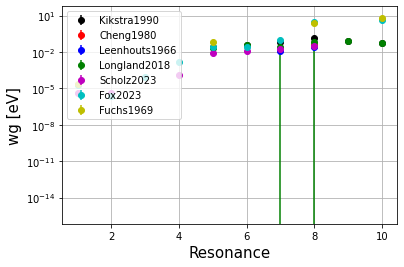

In [81]:
#colors = ['k', 'r', 'b', 'g', 'm', 'c', 'y'] + ['darkorange', 'silver', 'springgreen', 'sienna', 'lightcoral', 'deeppink', 'pink', 'navy', 'lightgreen']
xl = [1,2,3,4,5,6,7,8,9,10]

plt.errorbar(xl, kikstra_z, yerr=kikstra_zu, c = colors[0], ls = '', marker = 'o', label = 'Kikstra1990')
plt.errorbar(xl, cheng_z, yerr=cheng_zu, c = colors[1], ls = '', marker = 'o', label = 'Cheng1980')
plt.errorbar(xl, leenhouts_z, yerr=leenhouts_zu, c = colors[2], ls = '', marker = 'o', label = 'Leenhouts1966')
plt.errorbar(xl, longland_z, yerr=longland_zu, c = colors[3], ls = '', marker = 'o', label = 'Longland2018')
plt.errorbar(xl, scholz_z, yerr=scholz_zu, c = colors[4], ls = '', marker = 'o', label = 'Scholz2023')
plt.errorbar(xl, fox_z, yerr=fox_zu, c = colors[5], ls = '', marker = 'o', label = 'Fox2023')
plt.errorbar(xl, fuchs_z, yerr=fuchs_zu, c = colors[6], ls = '', marker = 'o', label = 'Fuchs1969')
ax = py.subplot(111)
plt.axhline(y=0, color = 'k', linewidth = 5)
ax.set_xlabel('Resonance', size = 15)
ax.set_ylabel('wg [eV]', size = 15)
plt.legend(loc="upper left")
#plt.ylim(-0.06,0.2)
ax.semilogy()
plt.grid(True)
plt.show()

<ipython-input-82-693b2127d265>:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = py.subplot(111)


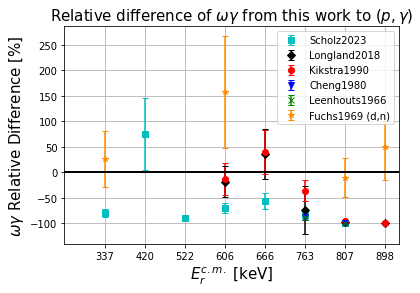

In [82]:
#colors = ['k', 'r', 'b', 'g', 'm', 'c', 'y'] + ['darkorange', 'silver', 'springgreen', 'sienna', 'lightcoral', 'deeppink', 'pink', 'navy', 'lightgreen']
xl = [1,2,3,4,5,6,7,8,9,10]
xl_red = [1,2,3,4,5,6,7,8]

plt.errorbar(xl_red, scholz_rd[0:2]+scholz_rd[3:8]+[scholz_rd[9]], yerr=scholz_rd_unc[0:2]+scholz_rd_unc[3:8]+[scholz_rd_unc[9]], c = colors[5], ls = '', marker = 's', label = 'Scholz2023', capsize=3)
plt.errorbar(xl_red, longland_rd[0:2]+longland_rd[3:8]+[longland_rd[9]], yerr=longland_rd_unc[0:2]+longland_rd_unc[3:8]+[longland_rd_unc[9]], c = colors[0], ls = '', marker = 'D', label = 'Longland2018', capsize=3)
plt.errorbar(xl_red, kikstra_rd[0:2]+kikstra_rd[3:8]+[kikstra_rd[9]], yerr=kikstra_rd_unc[0:2]+kikstra_rd_unc[3:8]+[kikstra_rd_unc[9]], c = colors[1], ls = '', marker = 'o', label = 'Kikstra1990', capsize=3)
plt.errorbar(xl_red, cheng_rd[0:2]+cheng_rd[3:8]+[cheng_rd[9]], yerr=cheng_rd_unc[0:2]+cheng_rd_unc[3:8]+[cheng_rd_unc[9]], c = colors[2], ls = '', marker = 'v', label = 'Cheng1980', capsize=3)
plt.errorbar(xl_red, leenhouts_rd[0:2]+leenhouts_rd[3:8]+[leenhouts_rd[9]], yerr=leenhouts_rd_unc[0:2]+leenhouts_rd_unc[3:8]+[leenhouts_rd_unc[9]], c = colors[3], ls = '', marker = 'x', label = 'Leenhouts1966', capsize=3)
plt.errorbar(xl_red, fuchs_rd[0:2]+fuchs_rd[3:8]+[fuchs_rd[9]], yerr=fuchs_rd_unc[0:2]+fuchs_rd_unc[3:8]+[fuchs_rd_unc[9]], c = colors[7], ls = '', marker = '*', label = 'Fuchs1969 (d,n)', capsize=3)
ax = py.subplot(111)
plt.axhline(y=0, color = 'k', linewidth = 2)
plt.xticks(range(len(xl_red)+1), [None] + p_g_res_energies[0:2] + p_g_res_energies[3:8] + [p_g_res_energies[9]])
xticks = ax.xaxis.get_major_ticks()
xticks[0].set_visible(False)
ax.set_xlabel(r'$E_r^{c.m.}$' + ' [keV]', size = 15)
ax.set_ylabel(r'$\omega\gamma$' + ' Relative Difference [%]', size = 15)
ax.set_title('Relative difference of ' + r'$\omega\gamma$' + ' from this work to ' + r'$(p,\gamma)$', size = 15)
plt.legend(loc="upper right")
#plt.ylim(-0.06,0.2)
#ax.semilogy()
plt.grid(True)
#plt.savefig('wg_RelDiff.pdf',dpi=600)
#plt.close()
plt.show()

<h1 style="text-decoration:underline;text-align:center;text-decoration:bold;"> 
    DNP 2022 Plots
</h1>

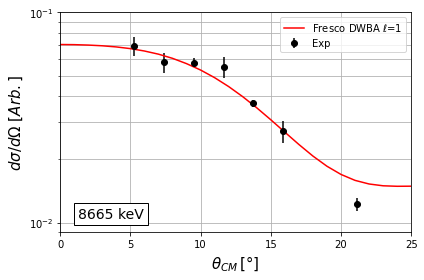

In [83]:
fig = plt.figure(tight_layout=True, facecolor=(1, 1, 1))
ax = py.subplot(111)
plt.errorbar(Ca40_8665keV.fit_angle_cm_reduced, Ca40_8665keV.crosssection_ratio_wavg, yerr=Ca40_8665keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_8665_fresco.theta[1], Ca40_8665_fresco.s_factor_cubic_scaled_dwba_cross[1], c = colors[1], label = r'Fresco DWBA $\ell$=1')
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, \, [Arb.]$', size = 15) 
#ax.set_title(transfer_reaction + ' ' + str(Ca40_8665keV.ex_energy) + ' keV, J' + r'$^{\pi} = $' + '1-', size = 20)
plt.xlim(0,25)
plt.ylim(9*10**-3, 0.1)
ax.text(0.05, 0.05, '8665 keV', transform=ax.transAxes, fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=1))
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('8665keV.pdf')
#plt.close()
plt.show()

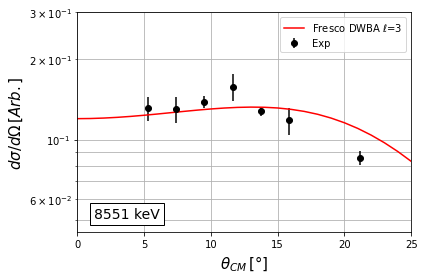

In [84]:
fig = plt.figure(tight_layout=True, facecolor=(1, 1, 1))
ax = py.subplot(111)
plt.errorbar(Ca40_8551keV.fit_angle_cm_reduced, Ca40_8551keV.crosssection_ratio_wavg, yerr=Ca40_8551keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_8551_fresco.theta[1], Ca40_8551_fresco.s_factor_cubic_scaled_dwba_cross[1], c = colors[1], label = r'Fresco DWBA $\ell$=3')
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, [Arb.]$', size = 15) 
#ax.set_title(transfer_reaction + ' ' + str(Ca40_8551keV.ex_energy) + ' keV, J' + r'$^{\pi} = $' + '1-', size = 20)
plt.xlim(0,25)
plt.ylim(4.5*10**-2, 0.3)
ax.text(0.05, 0.05, '8551 keV', transform=ax.transAxes, fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=1))
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('8551keV.pdf')
#plt.close()
plt.show()

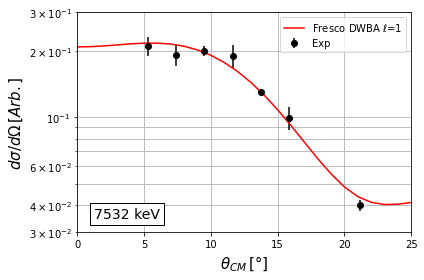

In [85]:
fig = plt.figure(tight_layout=True, facecolor=(1, 1, 1))
ax = py.subplot(111)
plt.errorbar(Ca40_7532keV.fit_angle_cm_reduced, Ca40_7532keV.crosssection_ratio_wavg, yerr=Ca40_7532keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_7532_fresco.theta[1], Ca40_7532_fresco.s_factor_cubic_scaled_dwba_cross[1], c = colors[1], label = r'Fresco DWBA $\ell$=1')
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, [Arb.]$', size = 15) 
#ax.set_title(transfer_reaction + ' ' + str(Ca40_7532keV.ex_energy) + ' keV, J' + r'$^{\pi} = $' + '1-', size = 20)
plt.xlim(0,25)
plt.ylim(3*10**-2, 0.3)
ax.text(0.05, 0.05, '7532 keV', transform=ax.transAxes, fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=1))
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('7532keV.pdf')
#plt.close()
plt.show()

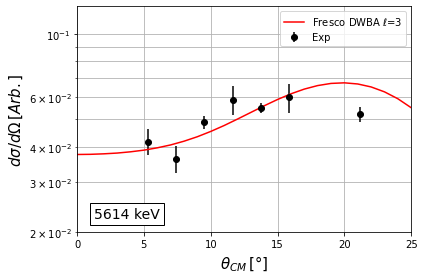

In [86]:
fig = plt.figure(tight_layout=True, facecolor=(1, 1, 1))
ax = py.subplot(111)
plt.errorbar(Ca40_5614keV.fit_angle_cm_reduced, Ca40_5614keV.crosssection_ratio_wavg, yerr=Ca40_5614keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp')
plt.plot(Ca40_5614_fresco.theta[1], Ca40_5614_fresco.s_factor_cubic_scaled_dwba_cross[1], c = colors[1], label = r'Fresco DWBA $\ell$=3')
plt.legend(loc="upper right")
ax.set_xlabel(r'$\theta_{CM} \, [$' + deg + ']', size = 15)
ax.set_ylabel(r'$d \sigma / d \Omega \, [Arb.]$', size = 15) 
#ax.set_title(transfer_reaction + ' ' + str(Ca40_5614keV.ex_energy) + ' keV, J' + r'$^{\pi} = $' + '1-', size = 20)
plt.xlim(0,25)
plt.ylim(2*10**-2, 0.125)
ax.text(0.05, 0.05, '5614 keV', transform=ax.transAxes, fontsize=14, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=1))
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('5614keV.pdf')
#plt.close()
plt.show()

<h2 style="text-decoration:underline;text-decoration:bold;"> 
    Multiple Unbound Cross Sections for PRL Paper
</h2>

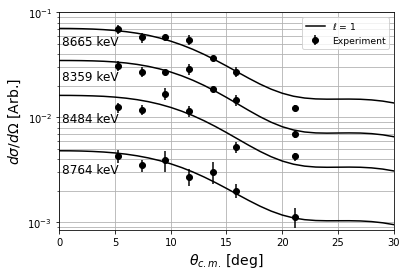

In [87]:
ind_8359 = 1
ind_8425 = 12 # Only using for theta, mixed-l case doesn't use index
ind_8484 = 1
ind_8551 = 1
ind_8665 = 1
ind_8748 = 12 #[20, 12] # Only use 20 for mixed-l theta, but use 12 for l=2 case
ind_8764 = 1
ind_8851 = 13 # Only using for theta, mixed-l case doesn't use index

l_8359 = '1'
l_8425 = '1+3'
l_8484 = '1'
l_8551 = '3'
l_8665 = '1'
l_8748 = '2' #['1+3', '2']
l_8764 = '1'
l_8851 = '1+3'

ax = py.subplot(111)

plt.errorbar(Ca40_8359keV.fit_angle_cm_reduced, Ca40_8359keV.crosssection_ratio_wavg, yerr=Ca40_8359keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Experiment')
plt.plot(Ca40_8359_fresco.theta[ind_8359], Ca40_8359_fresco.s_factor_cubic_scaled_dwba_cross[ind_8359], c = 'k', label = r'$\ell$ = ' + l_8359)

#plt.errorbar(Ca40_8425keV.fit_angle_cm_reduced, Ca40_8425keV.crosssection_ratio_wavg, yerr=Ca40_8425keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
#plt.plot(Ca40_8425_fresco.theta[ind_8425], frescoSigmaScaled_8425_1plus3, c = 'r', label = r'$\ell$ = ' + l_8425, ls = 'solid')

plt.errorbar(Ca40_8484keV.fit_angle_cm_reduced, Ca40_8484keV.crosssection_ratio_wavg, yerr=Ca40_8484keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8484_fresco.theta[ind_8484], Ca40_8484_fresco.s_factor_cubic_scaled_dwba_cross[ind_8484], c = 'k')#, label = r'$\ell$ = ' + l_8484, ls = 'solid')

#plt.errorbar(Ca40_8551keV.fit_angle_cm_reduced, Ca40_8551keV.crosssection_ratio_wavg, yerr=Ca40_8551keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
#plt.plot(Ca40_8551_fresco.theta[ind_8551], Ca40_8551_fresco.s_factor_cubic_scaled_dwba_cross[ind_8551], c = 'r', label = r'$\ell$ = ' + l_8551, ls = 'solid')

plt.errorbar(Ca40_8665keV.fit_angle_cm_reduced, Ca40_8665keV.crosssection_ratio_wavg, yerr=Ca40_8665keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8665_fresco.theta[ind_8665], Ca40_8665_fresco.s_factor_cubic_scaled_dwba_cross[ind_8665], c = 'k')#, label = r'$\ell$ = ' + l_8665, ls = 'solid')

#scaleFactor = 1
#plt.errorbar(Ca40_8748keV.fit_angle_cm_reduced, [scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg], yerr=[scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg_u], c = 'k', ls = '', marker = 'o', label = 'Exp')
#plt.plot(Ca40_8748_fresco.theta[ind_8748[0]], [scaleFactor*x for x in frescoSigmaScaled_8748_1plus3], c = 'g', label = r'$\ell$ = ' + l_8748[0], ls = 'dotted')
#plt.plot(Ca40_8748_fresco.theta[ind_8748[1]], [scaleFactor*x for x in Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[ind_8748[1]]], c = 'darkorange', label = r'$\ell$ = ' + l_8748[1], ls = 'dashdot')

plt.errorbar(Ca40_8764keV.fit_angle_cm_reduced, Ca40_8764keV.crosssection_ratio_wavg, yerr=Ca40_8764keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8764_fresco.theta[ind_8764], Ca40_8764_fresco.s_factor_cubic_scaled_dwba_cross[ind_8764], c = 'k')#, label = r'$\ell$ = ' + l_8764, ls = 'solid')

#plt.errorbar(Ca40_8851keV.fit_angle_cm_reduced, Ca40_8851keV.crosssection_ratio_wavg, yerr=Ca40_8851keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
#plt.plot(Ca40_8851_fresco.theta[ind_8851], Ca40_8851_fresco.s_factor_cubic_scaled_dwba_cross[ind_8851], c = 'r', label = r'$\ell$ = ' + l_8851, ls = 'solid')

plt.legend(loc='upper right',fontsize=9.25,ncol=1)
#plt.legend(loc='upper right',fontsize=9.5,ncol=1)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 14)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [Arb.]', size = 14)
#ax.set_title(transfer_reaction, size = 20)
#ax.text(14, 0.032, '9227 keV', fontsize=12)
#ax.text(12, 0.0065, '8995 keV', fontsize=12)
#ax.text(7, 0.00042, '8748 keV (* 0.5)', fontsize=12)

x_8359 = 0.3 #20.5
y_8359 = 0.0225

x_8484 = 0.3 #0.08
y_8484 = 0.009 #0.012

x_8665 = 0.3 #20
y_8665 = 0.049 #0.019

x_8764 = 0.3 #12.5
y_8764 = 0.00295

ax.text(x_8359, y_8359, '8359 keV', fontsize=12)
ax.text(x_8484, y_8484, '8484 keV', fontsize=12)
ax.text(x_8665, y_8665, '8665 keV', fontsize=12)
ax.text(x_8764, y_8764, '8764 keV', fontsize=12)

plt.xlim(0,30)
plt.ylim(8.5*10**-4, 1*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('unbound_l1.pdf')
#plt.close()
plt.show()

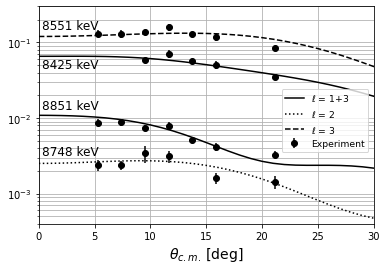

In [88]:
ax = py.subplot(111)

plt.errorbar(Ca40_8425keV.fit_angle_cm_reduced, Ca40_8425keV.crosssection_ratio_wavg, yerr=Ca40_8425keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Experiment')
plt.plot(Ca40_8425_fresco.theta[ind_8425], frescoSigmaScaled_8425_1plus3, c = 'k', label = r'$\ell$ = ' + l_8425, ls = 'solid')

scaleFactor = 1
plt.errorbar(Ca40_8748keV.fit_angle_cm_reduced, [scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg], yerr=[scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg_u], c = 'k', ls = '', marker = 'o')#, label = 'Exp')
#plt.plot(Ca40_8748_fresco.theta[ind_8748[0]], [scaleFactor*x for x in frescoSigmaScaled_8748_1plus3], c = 'k', label = r'$\ell$ = ' + l_8748[0], ls = 'solid')
#plt.plot(Ca40_8748_fresco.theta[ind_8748[1]], [scaleFactor*x for x in Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[ind_8748[1]]], c = 'r', label = r'$\ell$ = ' + l_8748[1], ls = 'dotted')
plt.plot(Ca40_8748_fresco.theta[ind_8748], [scaleFactor*x for x in Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[ind_8748]], c = 'k', label = r'$\ell$ = ' + l_8748, ls = 'dotted')

plt.errorbar(Ca40_8551keV.fit_angle_cm_reduced, Ca40_8551keV.crosssection_ratio_wavg, yerr=Ca40_8551keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8551_fresco.theta[ind_8551], Ca40_8551_fresco.s_factor_cubic_scaled_dwba_cross[ind_8551], c = 'k', label = r'$\ell$ = ' + l_8551, ls = 'dashed')

plt.errorbar(Ca40_8851keV.fit_angle_cm_reduced, Ca40_8851keV.crosssection_ratio_wavg, yerr=Ca40_8851keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8851_fresco.theta[ind_8851], Ca40_8851_fresco.s_factor_cubic_scaled_dwba_cross[ind_8851], c = 'k')#, label = r'$\ell$ = ' + l_8851, ls = 'solid')

plt.legend(loc=(0.725,0.33),fontsize=9.25,ncol=1)
#plt.legend(loc="center right",fontsize=10,ncol=2) # If using this, change "Experiment" to "Exp."
#plt.legend(loc=(0.715,0.28),fontsize=9.5,ncol=1)
#plt.legend(loc=(0.475,0.43),fontsize=9.25,ncol=2)
#plt.legend(loc="upper right",fontsize=9.25,ncol=2)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 14)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [Arb.]', size = 14) # Not needed since this will be the right panel

x_8425 = 0.3 #20.5
y_8425 = 0.046

x_8551 = 0.3 #18.5
y_8551 = 0.15

x_8748 = 0.3 #20
y_8748 = 0.0032 #0.019

x_8851 = 0.3 #12.5
y_8851 = 0.013

ax.text(x_8425, y_8425, '8425 keV', fontsize=12)
ax.text(x_8551, y_8551, '8551 keV', fontsize=12)
ax.text(x_8748, y_8748, '8748 keV', fontsize=12)
ax.text(x_8851, y_8851, '8851 keV', fontsize=12)

plt.xlim(0,30)
plt.ylim(4*10**-4, 3*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('unbound_others_leg.pdf')
#plt.close()
plt.show()

# Same as 1st figure, but changing scale

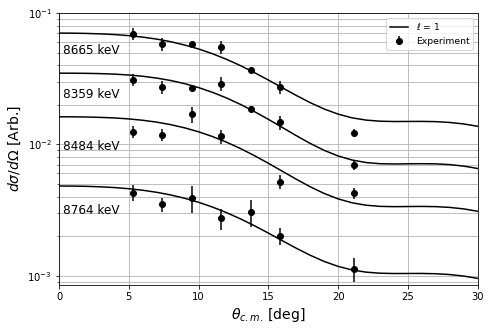

In [89]:
plt.rcParams["figure.figsize"] = (7.5,5)
ax = py.subplot(111)

plt.errorbar(Ca40_8359keV.fit_angle_cm_reduced, Ca40_8359keV.crosssection_ratio_wavg, yerr=Ca40_8359keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Experiment')
plt.plot(Ca40_8359_fresco.theta[ind_8359], Ca40_8359_fresco.s_factor_cubic_scaled_dwba_cross[ind_8359], c = 'k', label = r'$\ell$ = ' + l_8359)

#plt.errorbar(Ca40_8425keV.fit_angle_cm_reduced, Ca40_8425keV.crosssection_ratio_wavg, yerr=Ca40_8425keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
#plt.plot(Ca40_8425_fresco.theta[ind_8425], frescoSigmaScaled_8425_1plus3, c = 'r', label = r'$\ell$ = ' + l_8425, ls = 'solid')

plt.errorbar(Ca40_8484keV.fit_angle_cm_reduced, Ca40_8484keV.crosssection_ratio_wavg, yerr=Ca40_8484keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8484_fresco.theta[ind_8484], Ca40_8484_fresco.s_factor_cubic_scaled_dwba_cross[ind_8484], c = 'k')#, label = r'$\ell$ = ' + l_8484, ls = 'solid')

#plt.errorbar(Ca40_8551keV.fit_angle_cm_reduced, Ca40_8551keV.crosssection_ratio_wavg, yerr=Ca40_8551keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
#plt.plot(Ca40_8551_fresco.theta[ind_8551], Ca40_8551_fresco.s_factor_cubic_scaled_dwba_cross[ind_8551], c = 'r', label = r'$\ell$ = ' + l_8551, ls = 'solid')

plt.errorbar(Ca40_8665keV.fit_angle_cm_reduced, Ca40_8665keV.crosssection_ratio_wavg, yerr=Ca40_8665keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8665_fresco.theta[ind_8665], Ca40_8665_fresco.s_factor_cubic_scaled_dwba_cross[ind_8665], c = 'k')#, label = r'$\ell$ = ' + l_8665, ls = 'solid')

#scaleFactor = 1
#plt.errorbar(Ca40_8748keV.fit_angle_cm_reduced, [scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg], yerr=[scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg_u], c = 'k', ls = '', marker = 'o', label = 'Exp')
#plt.plot(Ca40_8748_fresco.theta[ind_8748[0]], [scaleFactor*x for x in frescoSigmaScaled_8748_1plus3], c = 'g', label = r'$\ell$ = ' + l_8748[0], ls = 'dotted')
#plt.plot(Ca40_8748_fresco.theta[ind_8748[1]], [scaleFactor*x for x in Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[ind_8748[1]]], c = 'darkorange', label = r'$\ell$ = ' + l_8748[1], ls = 'dashdot')

plt.errorbar(Ca40_8764keV.fit_angle_cm_reduced, Ca40_8764keV.crosssection_ratio_wavg, yerr=Ca40_8764keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8764_fresco.theta[ind_8764], Ca40_8764_fresco.s_factor_cubic_scaled_dwba_cross[ind_8764], c = 'k')#, label = r'$\ell$ = ' + l_8764, ls = 'solid')

#plt.errorbar(Ca40_8851keV.fit_angle_cm_reduced, Ca40_8851keV.crosssection_ratio_wavg, yerr=Ca40_8851keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
#plt.plot(Ca40_8851_fresco.theta[ind_8851], Ca40_8851_fresco.s_factor_cubic_scaled_dwba_cross[ind_8851], c = 'r', label = r'$\ell$ = ' + l_8851, ls = 'solid')

plt.legend(loc='upper right',fontsize=9.25,ncol=1)
#plt.legend(loc='upper right',fontsize=9.5,ncol=1)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 14)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [Arb.]', size = 14)
#ax.set_title(transfer_reaction, size = 20)
#ax.text(14, 0.032, '9227 keV', fontsize=12)
#ax.text(12, 0.0065, '8995 keV', fontsize=12)
#ax.text(7, 0.00042, '8748 keV (* 0.5)', fontsize=12)

x_8359 = 0.3 #20.5
y_8359 = 0.0225

x_8484 = 0.3 #0.08
y_8484 = 0.009 #0.012

x_8665 = 0.3 #20
y_8665 = 0.049 #0.019

x_8764 = 0.3 #12.5
y_8764 = 0.00295

ax.text(x_8359, y_8359, '8359 keV', fontsize=12)
ax.text(x_8484, y_8484, '8484 keV', fontsize=12)
ax.text(x_8665, y_8665, '8665 keV', fontsize=12)
ax.text(x_8764, y_8764, '8764 keV', fontsize=12)

plt.xlim(0,30)
plt.ylim(8.5*10**-4, 1*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')
#plt.savefig('unbound_l1.pdf')
#plt.close(
plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

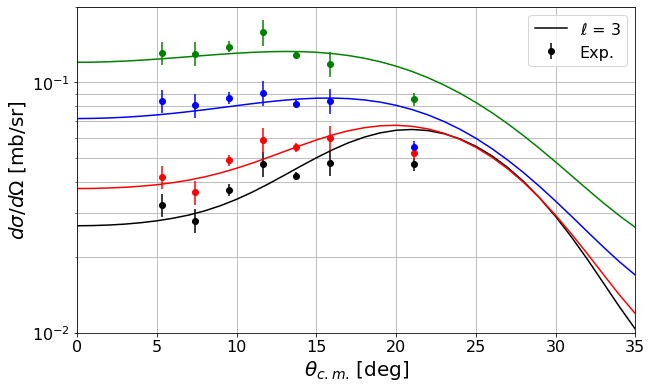

In [90]:
saveFig = False
plt.rcParams["figure.figsize"] = (10,6)

ax = py.subplot(111)

ind_4491 = 1
ind_5614 = 1
ind_5903 = 1
ind_6025 = [1, 5]
ind_6285 = 1
ind_6582 = [1, 5]
ind_6750 = [1, 5]
ind_6950 = 1
ind_7113 = [1, 4]
ind_7532 = 1
ind_7623 = [1, 5]
ind_7658 = 1
ind_7694 = [1, 5]
ind_7973 = 1
ind_8113 = 1
ind_8188 = [17, [0, 4]] # THIS IS AMBIGUOUS, 17 or 0 # [0,4]
ind_8271 = 1
#ind_8359 = 1
#ind_8425 = 12 #[12, 16]
#ind_8484 = 1
#ind_8551 = 1
#ind_8665 = 1
#ind_8748 = 12
#ind_8764 = 1
#ind_8851 = 13 #[13, 17]
ind_8935 = 1
ind_8995 = [1, [8, 12]] # THIS IS AMBIGUOUS, 1 or 8 # [8, 12]
ind_9092 = 1
ind_9136 = 1
ind_9227 = [8, [0,4]] # THIS IS AMBIGUOUS, 8 or 0 # [0, 4]

l_4491 = '3'
l_5614 = '3'
l_5903 = '1'
l_6025 = '1+3'
l_6285 = '1'
l_6582 = '1+3'
l_6750 = '1+3'
l_6950 = '1'
l_7113 = '1+3'
l_7532 = '1'
l_7623 = '1+3'
l_7658 = '3'
l_7694 = '1+3'
l_7973 = '1'
l_8113 = '1'
l_8188 = ['1','0+2'] # THIS IS AMBIGUOUS, 1 or 0+2
l_8271 = '1'
#l_8359 = '1'
#l_8425 = '1+3'
#l_8484 = '1'
#l_8551 = '3'
#l_8665 = '1'
#l_8748 = '2'
#l_8764 = '1'
#l_8851 = '1+3'
l_8935 = '1'
l_8995 = ['1','0+2'] # THIS IS AMBIGUOUS, 1 or 0+2
l_9092 = '1'
l_9136 = '1'
l_9227 = ['1','0+2'] # THIS IS AMBIGUOUS, 1 or 0+2

plt.errorbar(Ca40_4491keV.fit_angle_cm_reduced, Ca40_4491keV.crosssection_ratio_wavg, yerr=Ca40_4491keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_4491_fresco.theta[ind_4491], Ca40_4491_fresco.s_factor_cubic_scaled_dwba_cross[ind_4491], c = 'k', label = r'$\ell$ = ' + l_4491)

plt.errorbar(Ca40_5614keV.fit_angle_cm_reduced, Ca40_5614keV.crosssection_ratio_wavg, yerr=Ca40_5614keV.crosssection_ratio_wavg_u, c = 'r', ls = '', marker = 'o')
plt.plot(Ca40_5614_fresco.theta[ind_5614], Ca40_5614_fresco.s_factor_cubic_scaled_dwba_cross[ind_5614], c = 'r')#, label = r'$\ell$ = ' + l_5614)

plt.errorbar(Ca40_7658keV.fit_angle_cm_reduced, Ca40_7658keV.crosssection_ratio_wavg, yerr=Ca40_7658keV.crosssection_ratio_wavg_u, c = 'b', ls = '', marker = 'o')
plt.plot(Ca40_7658_fresco.theta[ind_7658], Ca40_7658_fresco.s_factor_cubic_scaled_dwba_cross[ind_7658], c = 'b')#, label = r'$\ell$ = ' + l_7658)

plt.errorbar(Ca40_8551keV.fit_angle_cm_reduced, Ca40_8551keV.crosssection_ratio_wavg, yerr=Ca40_8551keV.crosssection_ratio_wavg_u, c = 'g', ls = '', marker = 'o')
plt.plot(Ca40_8551_fresco.theta[ind_8551], Ca40_8551_fresco.s_factor_cubic_scaled_dwba_cross[ind_8551], c = 'g')#, label = r'$\ell$ = ' + l_8551)

plt.legend(loc='upper right',fontsize=16,ncol=1)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(1*10**-2, 2*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')


if (saveFig):
    plt.savefig('unbound.pdf',dpi=600,bbox_inches='tight')
    plt.close()
else:
    plt.show()
#################

plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

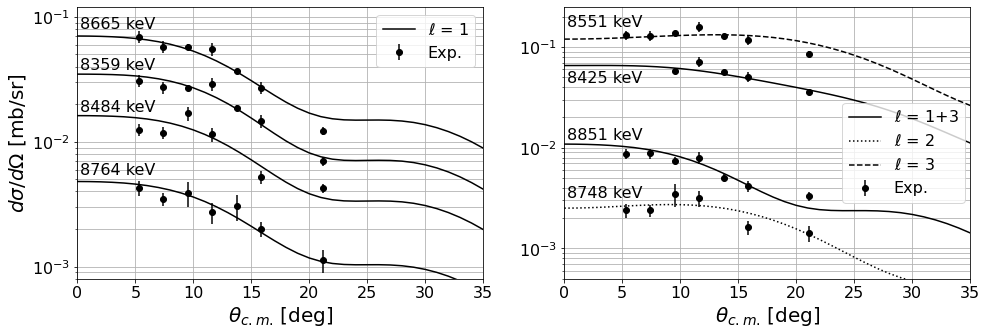

In [91]:
saveFig = False

plt.rcParams["figure.figsize"] = (16,5)

ax = py.subplot(121)

plt.errorbar(Ca40_8359keV.fit_angle_cm_reduced, Ca40_8359keV.crosssection_ratio_wavg, yerr=Ca40_8359keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8359_fresco.theta[ind_8359], Ca40_8359_fresco.s_factor_cubic_scaled_dwba_cross[ind_8359], c = 'k', label = r'$\ell$ = ' + l_8359)

plt.errorbar(Ca40_8484keV.fit_angle_cm_reduced, Ca40_8484keV.crosssection_ratio_wavg, yerr=Ca40_8484keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8484_fresco.theta[ind_8484], Ca40_8484_fresco.s_factor_cubic_scaled_dwba_cross[ind_8484], c = 'k')#, label = r'$\ell$ = ' + l_8484, ls = 'solid')

plt.errorbar(Ca40_8665keV.fit_angle_cm_reduced, Ca40_8665keV.crosssection_ratio_wavg, yerr=Ca40_8665keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8665_fresco.theta[ind_8665], Ca40_8665_fresco.s_factor_cubic_scaled_dwba_cross[ind_8665], c = 'k')#, label = r'$\ell$ = ' + l_8665, ls = 'solid')

plt.errorbar(Ca40_8764keV.fit_angle_cm_reduced, Ca40_8764keV.crosssection_ratio_wavg, yerr=Ca40_8764keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8764_fresco.theta[ind_8764], Ca40_8764_fresco.s_factor_cubic_scaled_dwba_cross[ind_8764], c = 'k')#, label = r'$\ell$ = ' + l_8764, ls = 'solid')

plt.legend(loc='upper right',fontsize=16,ncol=1)
#plt.legend(loc='upper right',fontsize=9.5,ncol=1)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)#, color = 'r')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
#ax.set_title(transfer_reaction, size = 20)
#ax.text(14, 0.032, '9227 keV', fontsize=12)
#ax.text(12, 0.0065, '8995 keV', fontsize=12)
#ax.text(7, 0.00042, '8748 keV (* 0.5)', fontsize=12)

x_8359 = 0.25 #20.5
y_8359 = 0.038 #0.0225

x_8484 = 0.25 #0.08
y_8484 = 0.0175 #0.012

x_8665 = 0.25 #20
y_8665 = 0.08 #0.049

x_8764 = 0.25 #12.5
y_8764 = 0.0054

ax.text(x_8359, y_8359, '8359 keV', fontsize=16)
ax.text(x_8484, y_8484, '8484 keV', fontsize=16)
ax.text(x_8665, y_8665, '8665 keV', fontsize=16)
ax.text(x_8764, y_8764, '8764 keV', fontsize=16)

plt.xlim(0,35)
plt.ylim(8*10**-4, 1.2*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

############

ax = py.subplot(122)

plt.errorbar(Ca40_8425keV.fit_angle_cm_reduced, Ca40_8425keV.crosssection_ratio_wavg, yerr=Ca40_8425keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8425_fresco.theta[ind_8425], frescoSigmaScaled_8425_1plus3, c = 'k', label = r'$\ell$ = ' + l_8425, ls = 'solid')

scaleFactor = 1
plt.errorbar(Ca40_8748keV.fit_angle_cm_reduced, [scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg], yerr=[scaleFactor*x for x in Ca40_8748keV.crosssection_ratio_wavg_u], c = 'k', ls = '', marker = 'o')#, label = 'Exp')
#plt.plot(Ca40_8748_fresco.theta[ind_8748[0]], [scaleFactor*x for x in frescoSigmaScaled_8748_1plus3], c = 'k', label = r'$\ell$ = ' + l_8748[0], ls = 'solid')
#plt.plot(Ca40_8748_fresco.theta[ind_8748[1]], [scaleFactor*x for x in Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[ind_8748[1]]], c = 'r', label = r'$\ell$ = ' + l_8748[1], ls = 'dotted')
plt.plot(Ca40_8748_fresco.theta[ind_8748], [scaleFactor*x for x in Ca40_8748_fresco.s_factor_cubic_scaled_dwba_cross[ind_8748]], c = 'k', label = r'$\ell$ = ' + l_8748, ls = 'dotted')

plt.errorbar(Ca40_8551keV.fit_angle_cm_reduced, Ca40_8551keV.crosssection_ratio_wavg, yerr=Ca40_8551keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8551_fresco.theta[ind_8551], Ca40_8551_fresco.s_factor_cubic_scaled_dwba_cross[ind_8551], c = 'k', label = r'$\ell$ = ' + l_8551, ls = 'dashed')

plt.errorbar(Ca40_8851keV.fit_angle_cm_reduced, Ca40_8851keV.crosssection_ratio_wavg, yerr=Ca40_8851keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp')
plt.plot(Ca40_8851_fresco.theta[ind_8851], Ca40_8851_fresco.s_factor_cubic_scaled_dwba_cross[ind_8851], c = 'k')#, label = r'$\ell$ = ' + l_8851, ls = 'solid')

#plt.legend(loc=(0.725,0.33),fontsize=16,ncol=1)
#legend=plt.legend(loc="center right",fontsize=14,ncol=2)
#legend=plt.legend(loc="lower left",fontsize=14,ncol=2)
#legend=plt.legend(loc=(13/30,0.45),fontsize=14,ncol=2)
#legend=plt.legend(loc="center right",fontsize=16,ncol=1)
legend=plt.legend(loc=(0.685,0.28),fontsize=16,ncol=1)

#plt.legend(loc="center right",fontsize=10,ncol=2) # If using this, change "Experiment" to "Exp."
#plt.legend(loc=(0.715,0.28),fontsize=9.5,ncol=1)
#plt.legend(loc=(0.475,0.43),fontsize=9.25,ncol=2)
#plt.legend(loc="upper right",fontsize=9.25,ncol=2)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.yaxis.set_label_position("right")
ax.set_ylabel(' ', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [Arb.]', size = 14) # Not needed since this will be the right panel

x_8425 = 0.25 #20.5
y_8425 = 0.044

x_8551 = 0.25 #18.5
y_8551 = 0.16

x_8748 = 0.25 #20
y_8748 = 0.0032 #0.019

x_8851 = 0.25 #12.5
y_8851 = 0.012

ax.text(x_8425, y_8425, '8425 keV', fontsize=16)
ax.text(x_8551, y_8551, '8551 keV', fontsize=16)
ax.text(x_8748, y_8748, '8748 keV', fontsize=16)
ax.text(x_8851, y_8851, '8851 keV', fontsize=16)

plt.xlim(0,35)
plt.ylim(5*10**-4, 2.5*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

#plt.subplots_adjust(right=0.9)

#plt.tight_layout()
#plt.subplots_adjust(wspace=0.2)
if (saveFig):
    plt.savefig('unbound.pdf',dpi=600,bbox_inches='tight')
    plt.close()
else:
    plt.show()
#################

plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

In [92]:
# Convert pdf to png (Why didn't I think to do this in Python before?)
#from pdf2image import convert_from_path
if (saveFig):
    images = convert_from_path('unbound.pdf', 600)
    for image in images:
        image.save('unbound.png')

In [93]:
plt.rcParamsDefault["figure.figsize"]

[6.4, 4.8]

In [94]:
plt.rcParams["figure.subplot.wspace"]

0.2

In [95]:
plt.rcParams["figure.facecolor"]

(1, 1, 1, 0)

In [96]:
plt.rcParamsDefault["figure.edgecolor"]

'white'

In [97]:
plt.rcParamsDefault["axes.edgecolor"]

'white'

In [98]:
legend.get_window_extent()

Bbox([[908.9672727272728, 121.10400000000001], [1031.3407102272727, 220.904]])

In [99]:
#fresco.plot_transfer_dwba_exp_mult_paper_all(8, 6, 45, saveFig=False)#saveFig=7532)

In [100]:
#fresco.plot_transfer_dwbaScaled_exp_mult_paper_all(8, 6, 45, None, saveFig=False)#saveFig=7532)

         Current function value: 4.231580
         Iterations: 5
         Function evaluations: 141
         Gradient evaluations: 43
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.003286365301796145, 0.2039299696891103
C2St = 0.08996627722250505

C2St (l=1) = 0.018
uC2St (l=1) = 0.0011
ufrac (l=1) = 0.05893101773507274

C2St (l=3) = 0.072
uC2St (l=3) = 0.0064
ufrac (l=3) = 0.08947490948187607

Reduced Chi2 = 0.846

Hessian Inverse:
[[ 3.51856271e-08 -3.28929266e-06]
 [-3.28929266e-06  3.47062152e-04]]
         Current function value: 5.471363
         Iterations: 4
         Function evaluations: 150
         Gradient evaluations: 46
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.004262948567437466, 0.40634617918887594
C2St = 0.11670084649255157

C2St (l=1) = 0.047
uC2St (l=1) = 0.0026
ufrac (l=1) = 0.05475435175725004

C2St (l=3) = 0.069
uC2St (l=3) = 0.0087
ufrac (l=3) = 0.12598590314876068

Reduced Chi2 = 1.824

Hessian Inverse:
[[ 6.56272781e-08 -8.75323055e-06]

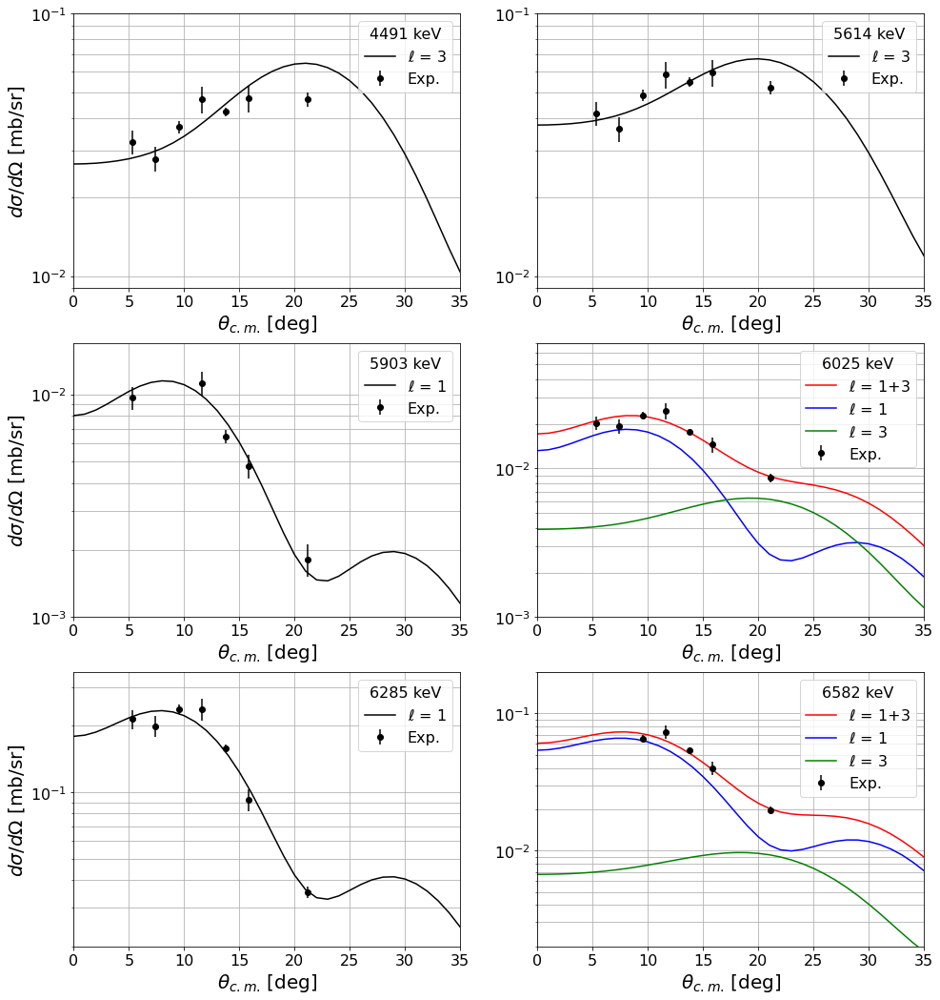

In [101]:
saveFig = False

plt.rcParams["figure.figsize"] = (16,18) # Each plot will be (8,6)

###########################################################################
ax = py.subplot(321)

plt.errorbar(Ca40_4491keV.fit_angle_cm_reduced, Ca40_4491keV.crosssection_ratio_wavg, yerr=Ca40_4491keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_4491_fresco.theta[ind_4491], Ca40_4491_fresco.s_factor_cubic_scaled_dwba_cross[ind_4491], c = 'k', label = r'$\ell$ = ' + l_4491)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='4491 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(9*10**-3, 1*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(322)

plt.errorbar(Ca40_5614keV.fit_angle_cm_reduced, Ca40_5614keV.crosssection_ratio_wavg, yerr=Ca40_5614keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_5614_fresco.theta[ind_5614], Ca40_5614_fresco.s_factor_cubic_scaled_dwba_cross[ind_5614], c = 'k', label = r'$\ell$ = ' + l_5614)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='5614 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(9*10**-3, 1*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(323)

plt.errorbar(Ca40_5903keV.fit_angle_cm_reduced, Ca40_5903keV.crosssection_ratio_wavg, yerr=Ca40_5903keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_5903_fresco.theta[ind_5903], Ca40_5903_fresco.s_factor_cubic_scaled_dwba_cross[ind_5903], c = 'k', label = r'$\ell$ = ' + l_5903)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='5903 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(1*10**-3, 1.7*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(324)

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_6025_1plus3_data = Ca40_6025_fresco.calc_C2S_alpha_two_l(Ca40_6025keV, 1, 5, 1, 3, [0.003, 0.2], showplot=False, plotZoom=False, plotymin=2*10**(-3), plotymax=7*10**(-2),updateResult=False, returnResult=True)
fresco_scaled_two_l_6025 = Ca40_6025_1plus3_data[2]
fresco_l1_6025 = Ca40_6025_1plus3_data[7]
fresco_l2_6025 = Ca40_6025_1plus3_data[8]

plt.errorbar(Ca40_6025keV.fit_angle_cm_reduced, Ca40_6025keV.crosssection_ratio_wavg, yerr=Ca40_6025keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_6025_fresco.theta[ind_6025[0]], fresco_scaled_two_l_6025, c = 'r', label = r'$\ell$ = ' + l_6025[0] + '+' + l_6025[2])
plt.plot(Ca40_6025_fresco.theta[ind_6025[0]], fresco_l1_6025, c = 'b', label = r'$\ell$ = ' + l_6025[0])
plt.plot(Ca40_6025_fresco.theta[ind_6025[1]], fresco_l2_6025, c = 'g', label = r'$\ell$ = ' + l_6025[2])

plt.legend(loc='upper right',fontsize=16,ncol=1,title='6025 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(0,35)
plt.ylim(1*10**-3, 7*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(325)

plt.errorbar(Ca40_6285keV.fit_angle_cm_reduced, Ca40_6285keV.crosssection_ratio_wavg, yerr=Ca40_6285keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_6285_fresco.theta[ind_6285], Ca40_6285_fresco.s_factor_cubic_scaled_dwba_cross[ind_6285], c = 'k', label = r'$\ell$ = ' + l_6285)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='6285 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(2*10**-2, 3.5*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(326)

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_6582_1plus3_data = Ca40_6582_fresco.calc_C2S_alpha_two_l(Ca40_6582keV, 1, 5, 1, 3, [0.004, 0.4], showplot=False, plotZoom=False, plotymin=6*10**(-3), plotymax=2*10**(-1), updateResult=False, returnResult=True)
fresco_scaled_two_l_6582 = Ca40_6582_1plus3_data[2]
fresco_l1_6582 = Ca40_6582_1plus3_data[7]
fresco_l2_6582 = Ca40_6582_1plus3_data[8]

plt.errorbar(Ca40_6582keV.fit_angle_cm_reduced, Ca40_6582keV.crosssection_ratio_wavg, yerr=Ca40_6582keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_6582_fresco.theta[ind_6582[0]], fresco_scaled_two_l_6582, c = 'r', label = r'$\ell$ = ' + l_6582[0] + '+' + l_6582[2])
plt.plot(Ca40_6582_fresco.theta[ind_6582[0]], fresco_l1_6582, c = 'b', label = r'$\ell$ = ' + l_6582[0])
plt.plot(Ca40_6582_fresco.theta[ind_6582[1]], fresco_l2_6582, c = 'g', label = r'$\ell$ = ' + l_6582[2])

plt.legend(loc='upper right',fontsize=16,ncol=1,title='6582 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(2*10**-3, 2*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
if (saveFig):
    plt.savefig('diffcross_6panel_1.pdf',dpi=600,bbox_inches='tight')
    plt.close()
    images = convert_from_path('diffcross_6panel_1.pdf', 600)
    for image in images:
        image.save('diffcross_6panel_1.png')
else:
    plt.show()

plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

         Current function value: 4.341270
         Iterations: 3
         Function evaluations: 164
         Gradient evaluations: 51
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.005797786088111247, 0.1517886053616177
C2St = 0.1587179703348009

C2St (l=1) = 0.024
uC2St (l=1) = 0.0019
ufrac (l=1) = 0.07703283684230745

C2St (l=3) = 0.135
uC2St (l=3) = 0.0113
ufrac (l=3) = 0.08421064172402476

Reduced Chi2 = 2.171

Hessian Inverse:
[[ 1.04713043e-07 -4.70177504e-06]
 [-4.70177504e-06  2.72299340e-04]]
Optimization terminated successfully.
         Current function value: 4.667864
         Iterations: 7
         Function evaluations: 33
         Gradient evaluations: 11
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.010300176982585042, 0.531005115486444
C2St = 0.28197369822205887

C2St (l=1) = 0.150
uC2St (l=1) = 0.0080
ufrac (l=1) = 0.05354035695441166

C2St (l=3) = 0.132
uC2St (l=3) = 0.0228
ufrac (l=3) = 0.17217900796521274

Reduced Chi2 = 0.934

Hessian Inverse:


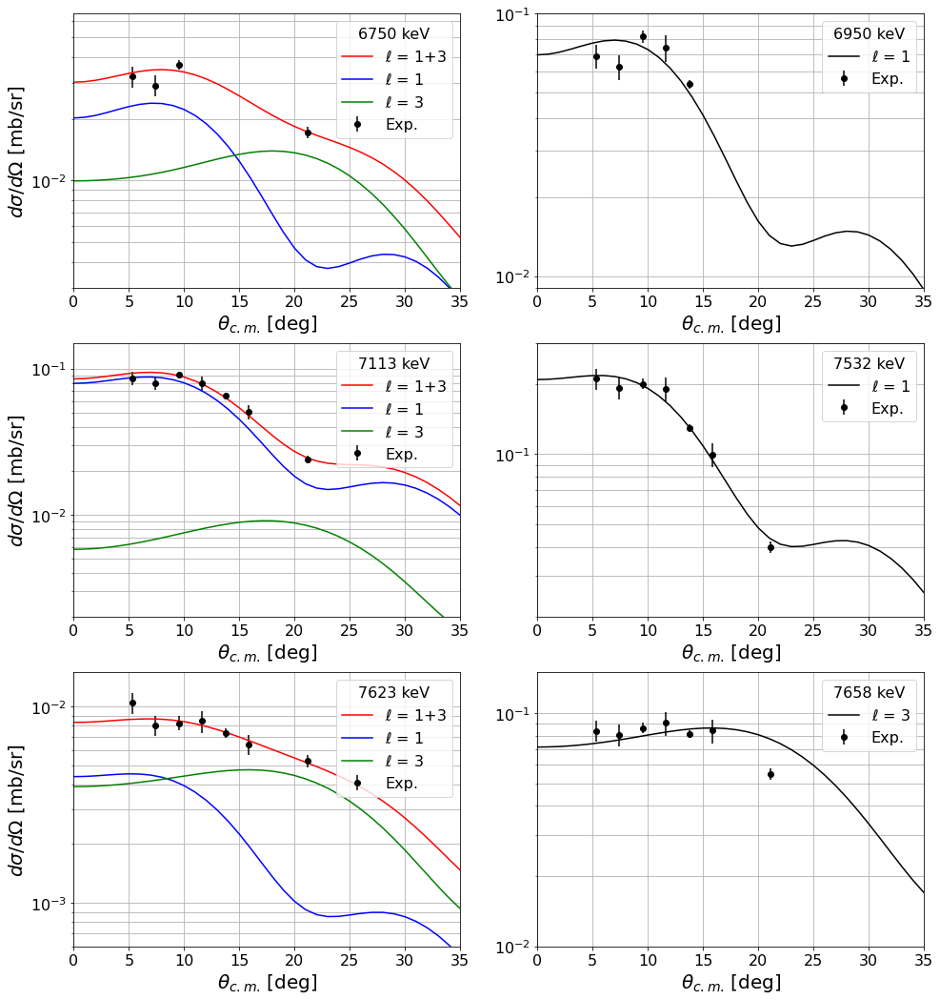

In [102]:
saveFig = False

plt.rcParams["figure.figsize"] = (16,18) # Each plot will be (8,6)

###########################################################################
ax = py.subplot(321)

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_6750_1plus3_data = Ca40_6750_fresco.calc_C2S_alpha_two_l(Ca40_6750keV, 1, 5, 1, 3, [0.006, 0.15], showplot=False, plotZoom=False, plotymin=7*10**(-3), plotymax=8*10**(-2),updateResult=False, returnResult=True)
fresco_scaled_two_l_6750 = Ca40_6750_1plus3_data[2]
fresco_l1_6750 = Ca40_6750_1plus3_data[7]
fresco_l2_6750 = Ca40_6750_1plus3_data[8]

plt.errorbar(Ca40_6750keV.fit_angle_cm_reduced, Ca40_6750keV.crosssection_ratio_wavg, yerr=Ca40_6750keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_6750_fresco.theta[ind_6750[0]], fresco_scaled_two_l_6750, c = 'r', label = r'$\ell$ = ' + l_6750[0] + '+' + l_6750[2])
plt.plot(Ca40_6750_fresco.theta[ind_6750[0]], fresco_l1_6750, c = 'b', label = r'$\ell$ = ' + l_6750[0])
plt.plot(Ca40_6750_fresco.theta[ind_6750[1]], fresco_l2_6750, c = 'g', label = r'$\ell$ = ' + l_6750[2])

plt.legend(loc='upper right',fontsize=16,ncol=1,title='6750 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(3*10**-3, 6.5*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(322)

plt.errorbar(Ca40_6950keV.fit_angle_cm_reduced, Ca40_6950keV.crosssection_ratio_wavg, yerr=Ca40_6950keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_6950_fresco.theta[ind_6950], Ca40_6950_fresco.s_factor_cubic_scaled_dwba_cross[ind_6950], c = 'k', label = r'$\ell$ = ' + l_6950)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='6950 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(9*10**-3, 1*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(323)

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_7113_1plus3_data = Ca40_7113_fresco.calc_C2S_alpha_two_l(Ca40_7113keV, 1, 4, 1, 3, [0.01, 0.53], showplot=False, plotZoom=False, plotymin=5*10**(-3), plotymax=2*10**(-1),updateResult=False, returnResult=True)
fresco_scaled_two_l_7113 = Ca40_7113_1plus3_data[2]
fresco_l1_7113 = Ca40_7113_1plus3_data[7]
fresco_l2_7113 = Ca40_7113_1plus3_data[8]

plt.errorbar(Ca40_7113keV.fit_angle_cm_reduced, Ca40_7113keV.crosssection_ratio_wavg, yerr=Ca40_7113keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_7113_fresco.theta[ind_7113[0]], fresco_scaled_two_l_7113, c = 'r', label = r'$\ell$ = ' + l_7113[0] + '+' + l_7113[2])
plt.plot(Ca40_7113_fresco.theta[ind_7113[0]], fresco_l1_7113, c = 'b', label = r'$\ell$ = ' + l_7113[0])
plt.plot(Ca40_7113_fresco.theta[ind_7113[1]], fresco_l2_7113, c = 'g', label = r'$\ell$ = ' + l_7113[2])

plt.legend(loc='upper right',fontsize=16,ncol=1,title='7113 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(2*10**-3, 1.5*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(324)

plt.errorbar(Ca40_7532keV.fit_angle_cm_reduced, Ca40_7532keV.crosssection_ratio_wavg, yerr=Ca40_7532keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_7532_fresco.theta[ind_7532], Ca40_7532_fresco.s_factor_cubic_scaled_dwba_cross[ind_7532], c = 'k', label = r'$\ell$ = ' + l_7532)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='7532 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(0,35)
plt.ylim(2*10**-2, 3*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(325)

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_7623_1plus3_data = Ca40_7623_fresco.calc_C2S_alpha_two_l(Ca40_7623keV, 1, 5, 1, 3, [0.0015, 0.11], showplot=False, plotZoom=False, plotymin=2*10**(-3), plotymax=2*10**(-2),updateResult=False, returnResult=True)
fresco_scaled_two_l_7623 = Ca40_7623_1plus3_data[2]
fresco_l1_7623 = Ca40_7623_1plus3_data[7]
fresco_l2_7623 = Ca40_7623_1plus3_data[8]

plt.errorbar(Ca40_7623keV.fit_angle_cm_reduced, Ca40_7623keV.crosssection_ratio_wavg, yerr=Ca40_7623keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_7623_fresco.theta[ind_7623[0]], fresco_scaled_two_l_7623, c = 'r', label = r'$\ell$ = ' + l_7623[0] + '+' + l_7623[2])
plt.plot(Ca40_7623_fresco.theta[ind_7623[0]], fresco_l1_7623, c = 'b', label = r'$\ell$ = ' + l_7623[0])
plt.plot(Ca40_7623_fresco.theta[ind_7623[1]], fresco_l2_7623, c = 'g', label = r'$\ell$ = ' + l_7623[2])
#plt.plot(Ca40_7623_fresco.theta[10], Ca40_7623_fresco.s_factor_cubic_scaled_dwba_cross[10], c = 'k', label = r'$\ell$ = ' + '2') # Not that close

plt.legend(loc='upper right',fontsize=16,ncol=1,title='7623 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(6*10**-4, 1.5*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = py.subplot(326)

plt.errorbar(Ca40_7658keV.fit_angle_cm_reduced, Ca40_7658keV.crosssection_ratio_wavg, yerr=Ca40_7658keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_7658_fresco.theta[ind_7658], Ca40_7658_fresco.s_factor_cubic_scaled_dwba_cross[ind_7658], c = 'k', label = r'$\ell$ = ' + l_7658)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='7658 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(1*10**-2, 1.5*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
if (saveFig):
    plt.savefig('diffcross_6panel_2.pdf',dpi=600,bbox_inches='tight')
    plt.close()
    images = convert_from_path('diffcross_6panel_2.pdf', 600)
    for image in images:
        image.save('diffcross_6panel_2.png')
else:
    plt.show()

plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

         Current function value: 2.693112
         Iterations: 6
         Function evaluations: 118
         Gradient evaluations: 36
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.011171523922280319, 0.08732330082379264
C2St = 0.3058273581577824

C2St (l=1) = 0.027
uC2St (l=1) = 0.0035
ufrac (l=1) = 0.13255451908446406

C2St (l=3) = 0.279
uC2St (l=3) = 0.0199
ufrac (l=3) = 0.0711674260302448

Reduced Chi2 = 0.539

Hessian Inverse:
[[ 2.34546592e-07 -6.38178927e-06]
 [-6.38178927e-06  2.06566288e-04]]
         Current function value: 5.153313
         Iterations: 3
         Function evaluations: 108
         Gradient evaluations: 32
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.0008263109874058247, 0.7325769833756006
C2St = 0.022620772962860858

C2St (l=0) = 0.017
uC2St (l=0) = 0.0017
ufrac (l=0) = 0.10172775930999359

C2St (l=2) = 0.006
uC2St (l=2) = 0.0014
ufrac (l=2) = 0.2338692364912964

Reduced Chi2 = 1.718

Hessian Inverse:
[[1.10362681e-09 4.39157362e-08]
 [

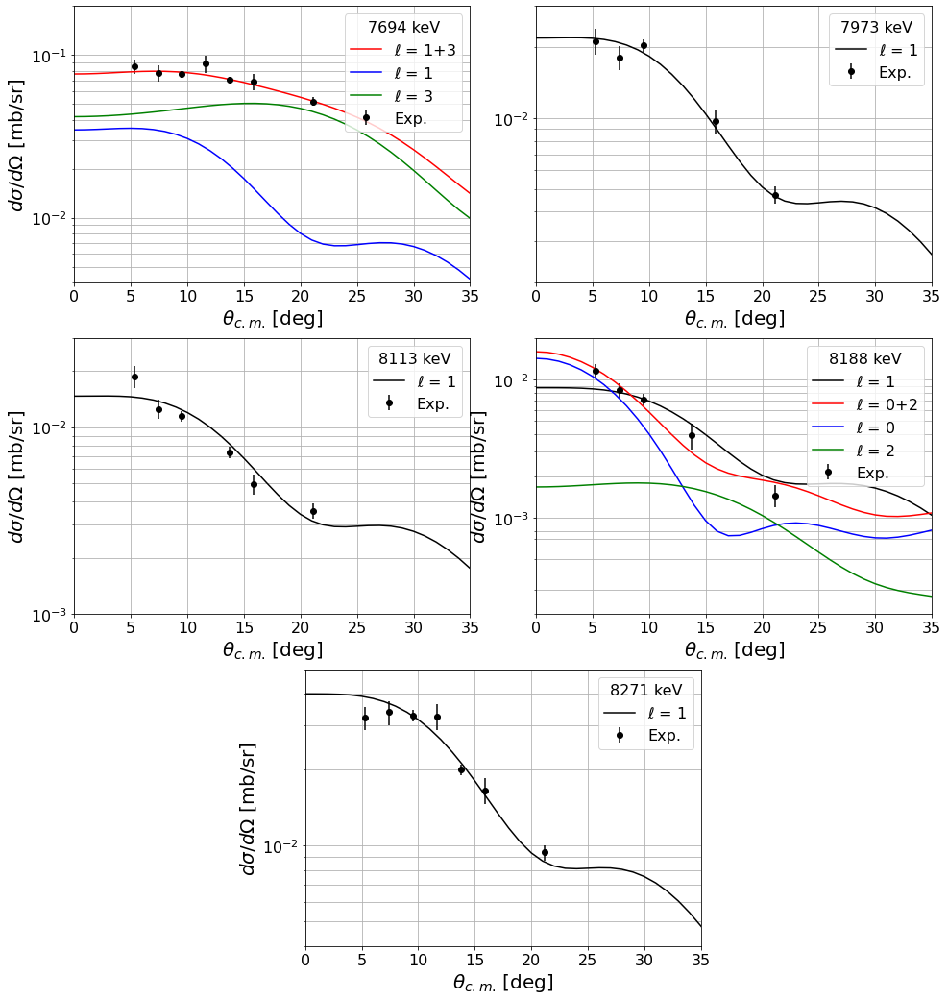

In [103]:
saveFig = False

plt.rcParams["figure.figsize"] = (16,18) # Each plot will be (8,6)

# Make final plot centered for odd number of subplots
import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(3, 4) # 3x4 grid with each plot spanning a 1 x 2 space (aspect ratio is not affected)
gs.update(wspace=0.4) # Add spacing in the middle

###########################################################################
ax = plt.subplot(gs[0, 0:2])

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_7694_1plus3_data = Ca40_7694_fresco.calc_C2S_alpha_two_l(Ca40_7694keV, 1, 5, 1, 3, [0.01, 0.09], showplot=False, plotZoom=False, plotymin=1*10**(-2), plotymax=2*10**(-1),updateResult=False, returnResult=True)
fresco_scaled_two_l_7694 = Ca40_7694_1plus3_data[2]
fresco_l1_7694 = Ca40_7694_1plus3_data[7]
fresco_l2_7694 = Ca40_7694_1plus3_data[8]

plt.errorbar(Ca40_7694keV.fit_angle_cm_reduced, Ca40_7694keV.crosssection_ratio_wavg, yerr=Ca40_7694keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_7694_fresco.theta[ind_7694[0]], fresco_scaled_two_l_7694, c = 'r', label = r'$\ell$ = ' + l_7694[0] + '+' + l_7694[2])
plt.plot(Ca40_7694_fresco.theta[ind_7694[0]], fresco_l1_7694, c = 'b', label = r'$\ell$ = ' + l_7694[0])
plt.plot(Ca40_7694_fresco.theta[ind_7694[1]], fresco_l2_7694, c = 'g', label = r'$\ell$ = ' + l_7694[2])

plt.legend(loc='upper right',fontsize=16,ncol=1,title='7694 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(4*10**-3, 2*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = plt.subplot(gs[0,2:])

plt.errorbar(Ca40_7973keV.fit_angle_cm_reduced, Ca40_7973keV.crosssection_ratio_wavg, yerr=Ca40_7973keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_7973_fresco.theta[ind_7973], Ca40_7973_fresco.s_factor_cubic_scaled_dwba_cross[ind_7973], c = 'k', label = r'$\ell$ = ' + l_7973)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='7973 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(2*10**-3, 3*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = plt.subplot(gs[1,0:2])

plt.errorbar(Ca40_8113keV.fit_angle_cm_reduced, Ca40_8113keV.crosssection_ratio_wavg, yerr=Ca40_8113keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8113_fresco.theta[ind_8113], Ca40_8113_fresco.s_factor_cubic_scaled_dwba_cross[ind_8113], c = 'k', label = r'$\ell$ = ' + l_8113)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='8113 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(1*10**-3, 3*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = plt.subplot(gs[1,2:])

# For l=1 option only:
'''
plt.errorbar(Ca40_8188keV.fit_angle_cm_reduced, Ca40_8188keV.crosssection_ratio_wavg, yerr=Ca40_8188keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8188_fresco.theta[ind_8188], Ca40_8188_fresco.s_factor_cubic_scaled_dwba_cross[ind_8188], c = 'k', label = r'$\ell$ = ' + l_8188)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='8188 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(0,35)
plt.ylim(9*10**-4, 2*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')
'''

# For l=0+2 option or l=1 option

plt.errorbar(Ca40_8188keV.fit_angle_cm_reduced, Ca40_8188keV.crosssection_ratio_wavg, yerr=Ca40_8188keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8188_fresco.theta[ind_8188[0]], Ca40_8188_fresco.s_factor_cubic_scaled_dwba_cross[ind_8188[0]], c = 'k', label = r'$\ell$ = ' + l_8188[0])

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_8188_0plus2_data = Ca40_8188_fresco.calc_C2S_alpha_two_l(Ca40_8188keV, 0, 4, 0, 2, [0.001, 0.73], showplot=False, plotZoom=False, plotymin=6*10**(-4), plotymax=2*10**(-2),updateResult=False, returnResult=True)
fresco_scaled_two_l_8188 = Ca40_8188_0plus2_data[2]
fresco_l1_8188 = Ca40_8188_0plus2_data[7]
fresco_l2_8188 = Ca40_8188_0plus2_data[8]

#plt.errorbar(Ca40_8188keV.fit_angle_cm_reduced, Ca40_8188keV.crosssection_ratio_wavg, yerr=Ca40_8188keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8188_fresco.theta[ind_8188[1][0]], fresco_scaled_two_l_8188, c = 'r', label = r'$\ell$ = ' + l_8188[1][0] + '+' + l_8188[1][2])
plt.plot(Ca40_8188_fresco.theta[ind_8188[1][0]], fresco_l1_8188, c = 'b', label = r'$\ell$ = ' + l_8188[1][0])
plt.plot(Ca40_8188_fresco.theta[ind_8188[1][1]], fresco_l2_8188, c = 'g', label = r'$\ell$ = ' + l_8188[1][2])

plt.legend(loc='upper right',fontsize=16,ncol=1,title='8188 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(2*10**-4, 2*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = plt.subplot(gs[2,1:3])

plt.errorbar(Ca40_8271keV.fit_angle_cm_reduced, Ca40_8271keV.crosssection_ratio_wavg, yerr=Ca40_8271keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8271_fresco.theta[ind_8271], Ca40_8271_fresco.s_factor_cubic_scaled_dwba_cross[ind_8271], c = 'k', label = r'$\ell$ = ' + l_8271)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='8271 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(4*10**-3, 5*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
if (saveFig):
    plt.savefig('diffcross_6panel_3.pdf',dpi=600,bbox_inches='tight')
    plt.close()
    images = convert_from_path('diffcross_6panel_3.pdf', 600)
    for image in images:
        image.save('diffcross_6panel_3.png')
else:
    plt.show()

plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

Optimization terminated successfully.
         Current function value: 1.272166
         Iterations: 6
         Function evaluations: 57
         Gradient evaluations: 19
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.00042932374936190744, 0.5104092789505285
C2St = 0.01175300245294963

C2St (l=0) = 0.006
uC2St (l=0) = 0.0003
ufrac (l=0) = 0.05246811330952

C2St (l=2) = 0.006
uC2St (l=2) = 0.0003
ufrac (l=2) = 0.05250236690471625

Reduced Chi2 = 0.424

Hessian Inverse:
[[ 1.97021107e-10 -1.92473634e-10]
 [-1.92473634e-10  2.25442154e-08]]
         Current function value: 9.851091
         Iterations: 3
         Function evaluations: 111
         Gradient evaluations: 33
C2S (without ES norm and C2St*C2Sp), Alpha parameters: 0.004350427002129712, 0.4020535756326948
C2St = 0.11909562260043344

C2St (l=0) = 0.048
uC2St (l=0) = 0.0064
ufrac (l=0) = 0.133087803272418

C2St (l=2) = 0.071
uC2St (l=2) = 0.0058
ufrac (l=2) = 0.08101779611887178

Reduced Chi2 = 3.284

Hessian Inverse:
[

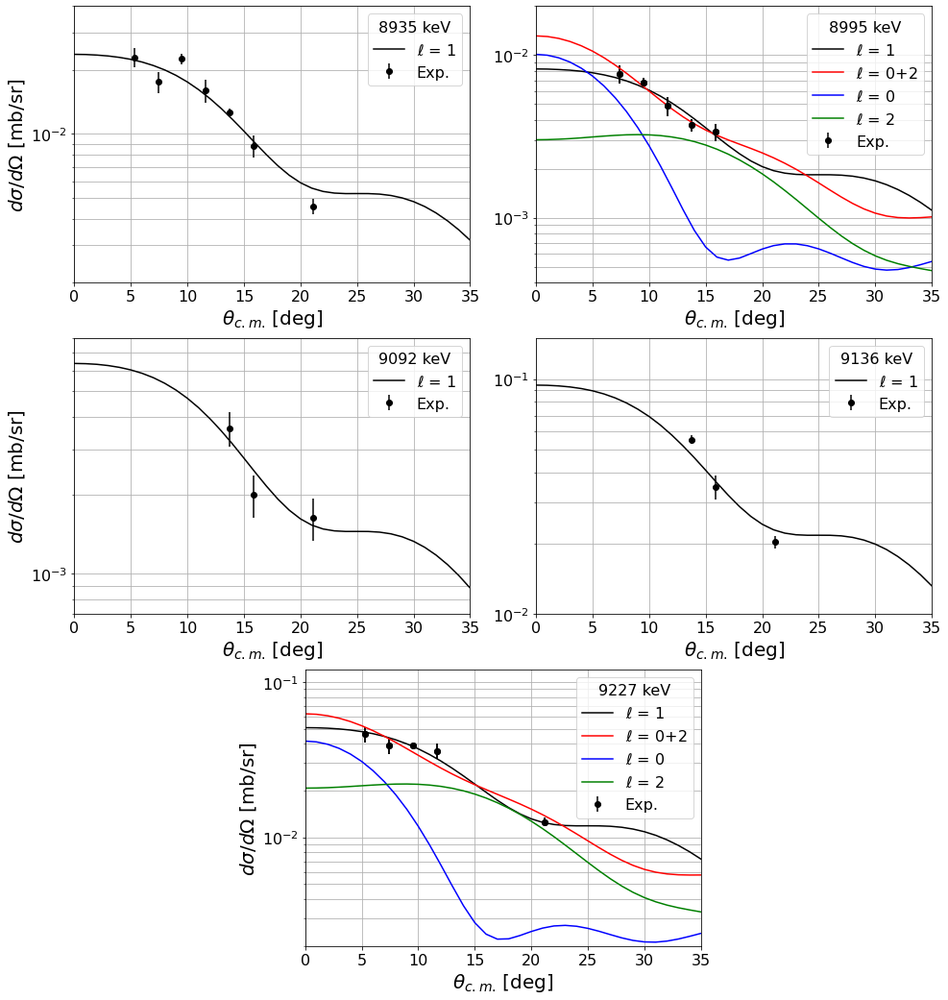

In [104]:
saveFig = False

plt.rcParams["figure.figsize"] = (16,18) # Each plot will be (8,6)

# Make final plot centered for odd number of subplots
import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(3, 4) # 3x4 grid with each plot spanning a 1 x 2 space (aspect ratio is not affected)
gs.update(wspace=0.4) # Add spacing in the middle

###########################################################################
ax = plt.subplot(gs[0, 0:2])

plt.errorbar(Ca40_8935keV.fit_angle_cm_reduced, Ca40_8935keV.crosssection_ratio_wavg, yerr=Ca40_8935keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8935_fresco.theta[ind_8935], Ca40_8935_fresco.s_factor_cubic_scaled_dwba_cross[ind_8935], c = 'k', label = r'$\ell$ = ' + l_8935)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='8935 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(2*10**-3, 4*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = plt.subplot(gs[0,2:])

plt.errorbar(Ca40_8995keV.fit_angle_cm_reduced, Ca40_8995keV.crosssection_ratio_wavg, yerr=Ca40_8995keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_8995_fresco.theta[ind_8995[0]], Ca40_8995_fresco.s_factor_cubic_scaled_dwba_cross[ind_8995[0]], c = 'k', label = r'$\ell$ = ' + l_8995[0])

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_8995_0plus2_data = Ca40_8995_fresco.calc_C2S_alpha_two_l(Ca40_8995keV, 8, 12, 0, 2, [0.0004, 0.51], showplot=False, plotZoom=False, plotymin=9*10**(-4), plotymax=5*10**(-2),updateResult=False, returnResult=True)
fresco_scaled_two_l_8995 = Ca40_8995_0plus2_data[2]
fresco_l1_8995 = Ca40_8995_0plus2_data[7]
fresco_l2_8995 = Ca40_8995_0plus2_data[8]

plt.errorbar(Ca40_8995keV.fit_angle_cm_reduced, Ca40_8995keV.crosssection_ratio_wavg, yerr=Ca40_8995keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp.')
plt.plot(Ca40_8995_fresco.theta[ind_8995[1][0]], fresco_scaled_two_l_8995, c = 'r', label = r'$\ell$ = ' + l_8995[1][0] + '+' + l_8995[1][2])
plt.plot(Ca40_8995_fresco.theta[ind_8995[1][0]], fresco_l1_8995, c = 'b', label = r'$\ell$ = ' + l_8995[1][0])
plt.plot(Ca40_8995_fresco.theta[ind_8995[1][1]], fresco_l2_8995, c = 'g', label = r'$\ell$ = ' + l_8995[1][2])

plt.legend(loc='upper right',fontsize=16,ncol=1,title='8995 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(4*10**-4, 2*10**-2)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = plt.subplot(gs[1,0:2])

plt.errorbar(Ca40_9092keV.fit_angle_cm_reduced, Ca40_9092keV.crosssection_ratio_wavg, yerr=Ca40_9092keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_9092_fresco.theta[ind_9092], Ca40_9092_fresco.s_factor_cubic_scaled_dwba_cross[ind_9092], c = 'k', label = r'$\ell$ = ' + l_9092)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='9092 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(7*10**-4, 8*10**-3)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = plt.subplot(gs[1,2:])

plt.errorbar(Ca40_9136keV.fit_angle_cm_reduced, Ca40_9136keV.crosssection_ratio_wavg, yerr=Ca40_9136keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_9136_fresco.theta[ind_9136], Ca40_9136_fresco.s_factor_cubic_scaled_dwba_cross[ind_9136], c = 'k', label = r'$\ell$ = ' + l_9136)

plt.legend(loc='upper right',fontsize=16,ncol=1,title='9136 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
#ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(0,35)
plt.ylim(1*10**-2, 1.5*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
ax = plt.subplot(gs[2,1:3])

plt.errorbar(Ca40_9227keV.fit_angle_cm_reduced, Ca40_9227keV.crosssection_ratio_wavg, yerr=Ca40_9227keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o', label = 'Exp.')
plt.plot(Ca40_9227_fresco.theta[ind_9227[0]], Ca40_9227_fresco.s_factor_cubic_scaled_dwba_cross[ind_9227[0]], c = 'k', label = r'$\ell$ = ' + l_9227[0])

#calc_C2S_alpha_two_l(self, exp_obj, l1_index, l2_index, l1, l2, init_guess, showplot=True, plotZoom=False, plotymin=0, plotymax=100, saveFig=False, updateResult=True, returnResult=False)
# Return [C2S, alpha, fresco_scaled_two_l, C2St_l1, C2St_l2, uC2St_l1, uC2St_l2, fresco_l1, fresco_l2]
Ca40_9227_0plus2_data = Ca40_9227_fresco.calc_C2S_alpha_two_l(Ca40_9227keV, 0, 4, 0, 2, [0.004, 0.4], showplot=False, plotZoom=False, plotymin=6*10**(-3), plotymax=2*10**(-1),updateResult=False, returnResult=True)
fresco_scaled_two_l_9227 = Ca40_9227_0plus2_data[2]
fresco_l1_9227 = Ca40_9227_0plus2_data[7]
fresco_l2_9227 = Ca40_9227_0plus2_data[8]

plt.errorbar(Ca40_9227keV.fit_angle_cm_reduced, Ca40_9227keV.crosssection_ratio_wavg, yerr=Ca40_9227keV.crosssection_ratio_wavg_u, c = 'k', ls = '', marker = 'o')#, label = 'Exp.')
plt.plot(Ca40_9227_fresco.theta[ind_9227[1][0]], fresco_scaled_two_l_9227, c = 'r', label = r'$\ell$ = ' + l_9227[1][0] + '+' + l_9227[1][2])
plt.plot(Ca40_9227_fresco.theta[ind_9227[1][0]], fresco_l1_9227, c = 'b', label = r'$\ell$ = ' + l_9227[1][0])
plt.plot(Ca40_9227_fresco.theta[ind_9227[1][1]], fresco_l2_9227, c = 'g', label = r'$\ell$ = ' + l_9227[1][2])

plt.legend(loc='upper right',fontsize=16,ncol=1,title='9227 keV',title_fontsize=16)
ax.set_xlabel(r'$\theta_{c.m.} \, $'+ '[deg]', size = 20)
ax.set_ylabel(r'$d \sigma / d \Omega$' + ' [mb/sr]', size = 20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0,35)
plt.ylim(2*10**-3, 1.2*10**-1)
ax.semilogy()
plt.grid(True, which = 'both')

###########################################################################
if (saveFig):
    plt.savefig('diffcross_6panel_4.pdf',dpi=600,bbox_inches='tight')
    plt.close()
    images = convert_from_path('diffcross_6panel_4.pdf', 600)
    for image in images:
        image.save('diffcross_6panel_4.png')
else:
    plt.show()

plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

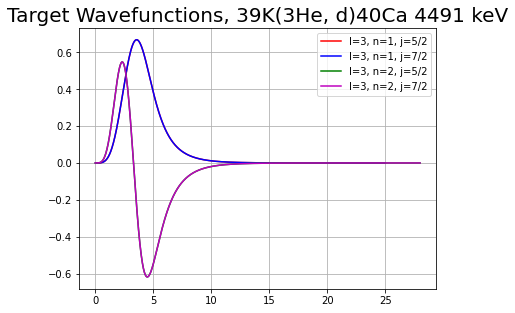

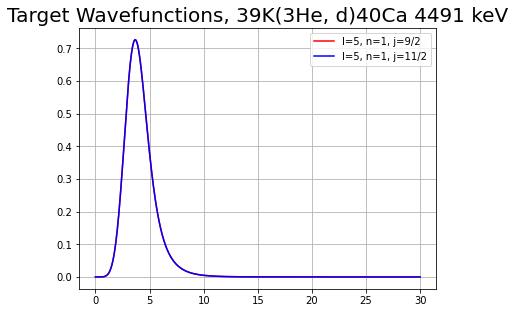

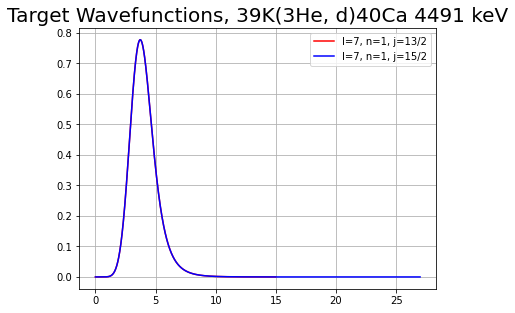

In [105]:
Ca40_4491_fresco.plot_boundstate_wfs_target_same_l()

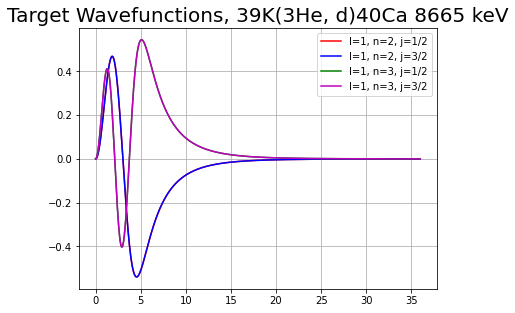

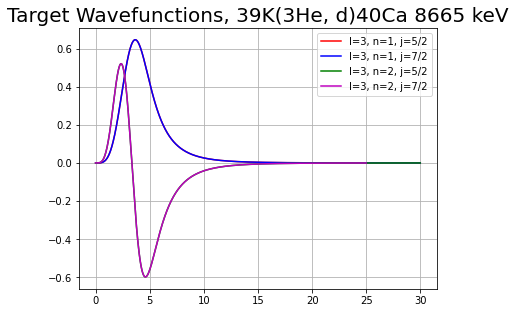

In [106]:
Ca40_8665_fresco.plot_boundstate_wfs_target_same_l()